# CODE TO CLASSIFY TRAFFIC SIGNS USING LE-NET ARCHITECTURE IN KERAS

- In this case study, you have been provided with images of traffic signs and the goal is to train a Deep Network to classify them
- The dataset contains 43 different classes of images. 
- Classes are as listed below: 

    - ( 0, b'Speed limit (20km/h)') ( 1, b'Speed limit (30km/h)')
    - ( 2, b'Speed limit (50km/h)') ( 3, b'Speed limit (60km/h)')
    - ( 4, b'Speed limit (70km/h)') ( 5, b'Speed limit (80km/h)')
    - ( 6, b'End of speed limit (80km/h)') ( 7, b'Speed limit (100km/h)')
    - ( 8, b'Speed limit (120km/h)') ( 9, b'No passing')
    - (10, b'No passing for vehicles over 3.5 metric tons')
    - (11, b'Right-of-way at the next intersection') (12, b'Priority road')
    - (13, b'Yield') (14, b'Stop') (15, b'No vehicles')
    - (16, b'Vehicles over 3.5 metric tons prohibited') (17, b'No entry')
    - (18, b'General caution') (19, b'Dangerous curve to the left')
    - (20, b'Dangerous curve to the right') (21, b'Double curve')
    - (22, b'Bumpy road') (23, b'Slippery road')
    - (24, b'Road narrows on the right') (25, b'Road work')
    - (26, b'Traffic signals') (27, b'Pedestrians') (28, b'Children crossing')
    - (29, b'Bicycles crossing') (30, b'Beware of ice/snow')
    - (31, b'Wild animals crossing')
    - (32, b'End of all speed and passing limits') (33, b'Turn right ahead')
    - (34, b'Turn left ahead') (35, b'Ahead only') (36, b'Go straight or right')
    - (37, b'Go straight or left') (38, b'Keep right') (39, b'Keep left')
    - (40, b'Roundabout mandatory') (41, b'End of no passing')
    - (42, b'End of no passing by vehicles over 3.5 metric tons')

- The network used is called Le-Net that was presented by Yann LeCun
http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf


Citation

J. Stallkamp, M. Schlipsing, J. Salmen, and C. Igel. The German Traffic Sign Recognition Benchmark: A multi-class classification competition. In Proceedings of the IEEE International Joint Conference on Neural Networks, pages 1453–1460. 2011. 

@inproceedings{Stallkamp-IJCNN-2011,
    author = {Johannes Stallkamp and Marc Schlipsing and Jan Salmen and Christian Igel},
    booktitle = {IEEE International Joint Conference on Neural Networks},
    title = {The {G}erman {T}raffic {S}ign {R}ecognition {B}enchmark: A multi-class classification competition},
    year = {2011},
    pages = {1453--1460}
}



# STEP 1: IMPORT LIBRARIES AND DATASET

In [2]:
import warnings
warnings.filterwarnings("ignore")

# import libraries 
import tensorflow as tf
import pickle
import seaborn as sns
import pandas as pd # Import Pandas for data manipulation using dataframes
import numpy as np # Import Numpy for data statistical analysis 
import matplotlib.pyplot as plt # Import matplotlib for data visualisation
import random

In [3]:
# The pickle module implements binary protocols for serializing and de-serializing a Python object structure.

with open("./traffic-signs-data/train.p", mode='rb') as training_data:
    train = pickle.load(training_data)
with open("./traffic-signs-data/valid.p", mode='rb') as validation_data:
    valid = pickle.load(validation_data)
with open("./traffic-signs-data/test.p", mode='rb') as testing_data:
    test = pickle.load(testing_data)

In [4]:
X_train, y_train = train['features'], train['labels']
X_validation, y_validation = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

In [5]:
print(X_train.shape)
print(y_train.shape)
print(X_validation.shape)
print(y_validation.shape)
print(X_test.shape)
print(y_test.shape)

(34799, 32, 32, 3)
(34799,)
(4410, 32, 32, 3)
(4410,)
(12630, 32, 32, 3)
(12630,)


In [6]:
# there are 43 different classes (traffic signs)
set(y_train)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42}

In [7]:
set(y_validation)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42}

In [8]:
set(y_test)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42}

# STEP 2: DATA VISUALIZATION / IMAGE EXPLORATION

In [11]:
classes = {0: 'Speed limit (20km/h)', 1: 'Speed limit (30km/h)',
                   2: 'Speed limit (50km/h)', 3: 'Speed limit (60km/h)',
                   4: 'Speed limit (70km/h)', 5: 'Speed limit (80km/h)',
                   6: 'End of speed limit (80km/h)', 7: 'Speed limit (100km/h)',
                   8: 'Speed limit (120km/h)', 9: 'No passing',
                   10: 'No passing for vehicles over 3.5 metric tons',
                   11: 'Right-of-way at the next intersection', 12: 'Priority road',
                   13: 'Yield', 14: 'Stop', 15: 'No vehicles',
                   16: 'Vehicles over 3.5 metric tons prohibited', 17: 'No entry',
                   18: 'General caution', 19: 'Dangerous curve to the left',
                   20: 'Dangerous curve to the right', 21: 'Double curve',
                   22: 'Bumpy road', 23: 'Slippery road',
                   24: 'Road narrows on the right', 25: 'Road work',
                   26: 'Traffic signals', 27: 'Pedestrians', 28: 'Children crossing',
                   29: 'Bicycles crossing', 30: 'Beware of ice/snow',
                   31: 'Wild animals crossing',
                   32: 'End of all speed and passing limits', 33: 'Turn right ahead',
                   34: 'Turn left ahead', 35: 'Ahead only', 36: 'Go straight or right',
                   37: 'Go straight or left', 38: 'Keep right', 39: 'Keep left',
                   40: 'Roundabout mandatory', 41: 'End of no passing',
                   42: 'End of no passing by vehicles over 3.5 metric tons'}

classes

{0: 'Speed limit (20km/h)',
 1: 'Speed limit (30km/h)',
 2: 'Speed limit (50km/h)',
 3: 'Speed limit (60km/h)',
 4: 'Speed limit (70km/h)',
 5: 'Speed limit (80km/h)',
 6: 'End of speed limit (80km/h)',
 7: 'Speed limit (100km/h)',
 8: 'Speed limit (120km/h)',
 9: 'No passing',
 10: 'No passing for vehicles over 3.5 metric tons',
 11: 'Right-of-way at the next intersection',
 12: 'Priority road',
 13: 'Yield',
 14: 'Stop',
 15: 'No vehicles',
 16: 'Vehicles over 3.5 metric tons prohibited',
 17: 'No entry',
 18: 'General caution',
 19: 'Dangerous curve to the left',
 20: 'Dangerous curve to the right',
 21: 'Double curve',
 22: 'Bumpy road',
 23: 'Slippery road',
 24: 'Road narrows on the right',
 25: 'Road work',
 26: 'Traffic signals',
 27: 'Pedestrians',
 28: 'Children crossing',
 29: 'Bicycles crossing',
 30: 'Beware of ice/snow',
 31: 'Wild animals crossing',
 32: 'End of all speed and passing limits',
 33: 'Turn right ahead',
 34: 'Turn left ahead',
 35: 'Ahead only',
 36: 'Go st

23
Slippery road


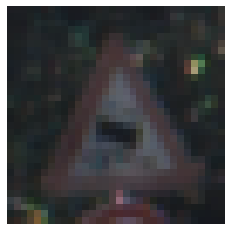

In [34]:
# show one image from training data and its label
i = 2000
plt.imshow(X_train[i])
plt.axis('off')
plt.savefig('images/img10.jpg')
print(y_train[i])
print(classes[y_train[i]])

22
Bumpy road


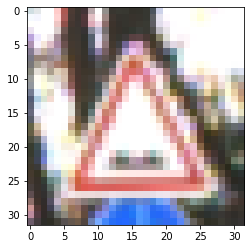

In [24]:
i = 610
plt.imshow(X_validation[i])
print(y_validation[i])
print(classes[y_validation[i]])

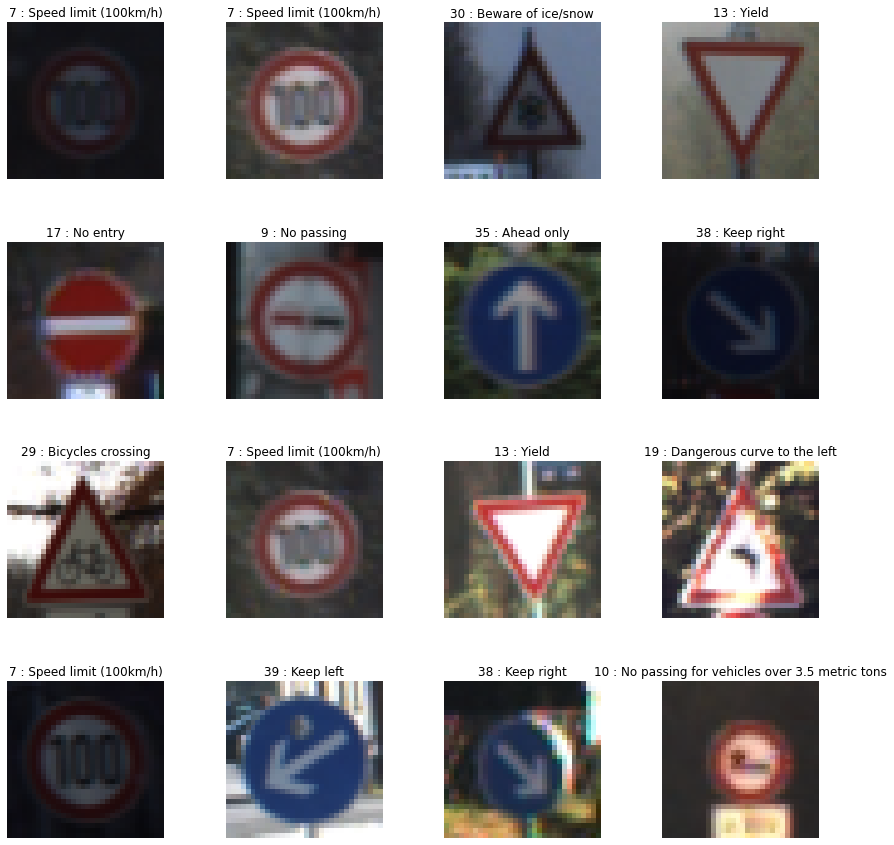

In [17]:
# Visualize the dataset
# Show 16 random images and their corresponding labels

W_grid = 4
L_grid = 4

fig, axes = plt.subplots(L_grid, W_grid, figsize = (15, 15)) # axes has 2D 4x4
axes = axes.ravel()  # axes.ravel() will flatten the 2D axis into 1D

n_training = len(X_train)

for i in np.arange(0, L_grid * W_grid):
    index = np.random.randint(0, n_training) # pick a random number
    axes[i].imshow(X_train[index]) # show the image
    axes[i].set_title(f'{y_train[index]} : {classes[y_train[index]]}') # show the corresponding label
    axes[i].axis('off') # remove the axis
    plt
    
plt.subplots_adjust(hspace = 0.4)

In [11]:
for i in range(43):
    print(f' Class {i} - Frequency  {len(y_train[y_train == i])}')

 Class 0 - Frequency  180
 Class 1 - Frequency  1980
 Class 2 - Frequency  2010
 Class 3 - Frequency  1260
 Class 4 - Frequency  1770
 Class 5 - Frequency  1650
 Class 6 - Frequency  360
 Class 7 - Frequency  1290
 Class 8 - Frequency  1260
 Class 9 - Frequency  1320
 Class 10 - Frequency  1800
 Class 11 - Frequency  1170
 Class 12 - Frequency  1890
 Class 13 - Frequency  1920
 Class 14 - Frequency  690
 Class 15 - Frequency  540
 Class 16 - Frequency  360
 Class 17 - Frequency  990
 Class 18 - Frequency  1080
 Class 19 - Frequency  180
 Class 20 - Frequency  300
 Class 21 - Frequency  270
 Class 22 - Frequency  330
 Class 23 - Frequency  450
 Class 24 - Frequency  240
 Class 25 - Frequency  1350
 Class 26 - Frequency  540
 Class 27 - Frequency  210
 Class 28 - Frequency  480
 Class 29 - Frequency  240
 Class 30 - Frequency  390
 Class 31 - Frequency  690
 Class 32 - Frequency  210
 Class 33 - Frequency  599
 Class 34 - Frequency  360
 Class 35 - Frequency  1080
 Class 36 - Frequency  

# STEP 3: DATA PREPROCESSING

### A)  Shuffle the dataset 

In [12]:
# images are not shuffled

for i in range(10):
    print(y_train[i])

41
41
41
41
41
41
41
41
41
41


In [55]:
from sklearn.utils import shuffle
X_train, y_train = shuffle(X_train, y_train)

3
Speed limit (60km/h)


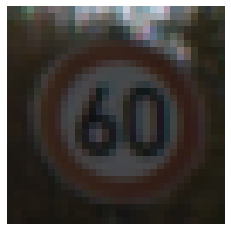

In [57]:
i = 4200
plt.imshow(X_train[i])
plt.axis('off')
plt.savefig('images/img9.jpg')
print(y_train[i])
print(classes[y_train[i]])

In [14]:
# now images are already shuffled
for i in range(10):
    print(y_train[i])

12
17
13
12
10
2
31
25
1
38


### B) Convert images from RGB to gray

To simplify the problem we will convert images from rgb to gray to decrease the input dimensions and model training time. For each image pixel we have three values RGB. The sum of these three values will be calculated to convert the image into gray scale image.

In [15]:
X_train_gray = np.sum(X_train/3, axis=3, keepdims=True)
X_test_gray  = np.sum(X_test/3, axis=3, keepdims=True)
X_validation_gray  = np.sum(X_validation/3, axis=3, keepdims=True) 

In [16]:
print(X_train_gray.shape)
print(X_validation_gray.shape)
print(X_test_gray.shape)

(34799, 32, 32, 1)
(4410, 32, 32, 1)
(12630, 32, 32, 1)


### C) Feature Scaling

In [17]:
X_train_gray_norm = X_train_gray / 255
X_test_gray_norm = X_test_gray / 255
X_validation_gray_norm = X_validation_gray / 255

# X_train_gray_norm = (X_train_gray - 128)/128 
# X_test_gray_norm = (X_test_gray - 128)/128
# X_validation_gray_norm = (X_validation_gray - 128)/128

(32, 32, 1)
(32, 32)
8


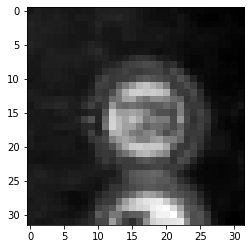

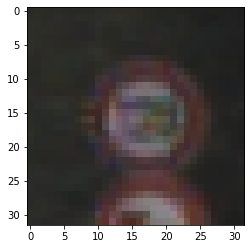

In [42]:
# show a random original rgb image and converted gray scale image

i = 610
print(X_train_gray[i].shape)
# squeeze will remove the last dimension. We must squeeze the images in order to show it using plt.imshow function
print(X_train_gray[i].squeeze().shape) 

plt.imshow(X_train_gray[i].squeeze(), cmap='gray')
plt.figure()
plt.imshow(X_train[i])
print(y_train[i])
plt.savefig('image.jpg')

# STEP 4: MODEL TRAINING

In [19]:
# Import train_test_split from scikit library

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split

In [20]:
print(X_train_gray_norm.shape)
print(X_train_gray_norm.shape[1:])

(34799, 32, 32, 1)
(32, 32, 1)


In [21]:
def build_model():
    model = Sequential()

    model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=X_train_gray_norm.shape[1:]))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))

    model.add(Flatten())
    model.add(Dense(64, activation='relu'))

    # last layer must have 43 neurons since we have 43 different classes
    model.add(Dense(units=43, activation = 'softmax'))
    
    # we must use sparse_categorical_crossentropy since we have not encoded the target feature into one hot features
    model.compile(loss ='sparse_categorical_crossentropy', optimizer=Adam(lr=0.001),metrics =['accuracy'])
    
    return model

In [22]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                6

In [23]:
model_history = model.fit(X_train_gray_norm, y_train, validation_data=(X_validation_gray_norm, y_validation), 
                              epochs=50, batch_size=32, verbose=True)

Epoch 1/50
1088/1088 [==============================] - 15s 14ms/step - loss: 1.2546 - accuracy: 0.6655 - val_loss: 0.4585 - val_accuracy: 0.8896
Epoch 2/50
1088/1088 [==============================] - 15s 14ms/step - loss: 0.1984 - accuracy: 0.9490 - val_loss: 0.3625 - val_accuracy: 0.8932
Epoch 3/50
1088/1088 [==============================] - 15s 14ms/step - loss: 0.1003 - accuracy: 0.9741 - val_loss: 0.2689 - val_accuracy: 0.9268
Epoch 4/50
1088/1088 [==============================] - 16s 15ms/step - loss: 0.0649 - accuracy: 0.9828 - val_loss: 0.2843 - val_accuracy: 0.9254
Epoch 5/50
1088/1088 [==============================] - 15s 14ms/step - loss: 0.0470 - accuracy: 0.9875 - val_loss: 0.2880 - val_accuracy: 0.9322
Epoch 6/50
1088/1088 [==============================] - 15s 14ms/step - loss: 0.0359 - accuracy: 0.9903 - val_loss: 0.2157 - val_accuracy: 0.9440
Epoch 7/50
1088/1088 [==============================] - 15s 14ms/step - loss: 0.0249 - accuracy: 0.9935 - val_loss: 0.2565 -

In [24]:
# Plot the loss and accuracy of training and validation set during training

def plot_loss_metric_from_training(model_history):
    # summarize history for accuracy
    plt.plot(model_history.history['accuracy'])
    plt.plot(model_history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # summarize history for loss
    plt.plot(model_history.history['loss'])
    plt.plot(model_history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

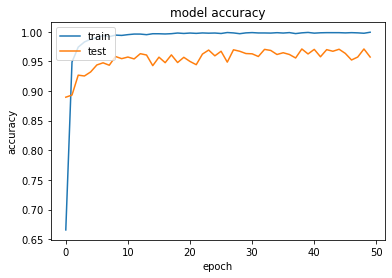

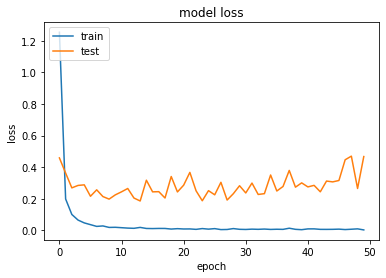

In [25]:
plot_loss_metric_from_training(model_history)

* The model overfits to the training data so we must handle it to have better performance on test set.

# STEP 5: MODEL EVALUATION

In [26]:
from sklearn.metrics import classification_report, confusion_matrix

In [27]:
def evaluate_model(model, X, y):
    loss, accuracy = model.evaluate(X, y,verbose=0)
    print(f'Loss : {loss}')
    print(f'Accuarcy : {accuracy}')
    
    print()
    
    pred = np.argmax(model.predict(X), axis=-1)
    print(classification_report(y, pred))

    cm = confusion_matrix(y, pred)
    plt.figure(figsize = (15, 15))
    sns.heatmap(cm, annot = True)
    print(confusion_matrix(y, pred))

Loss : 0.8177956938743591
Accuarcy : 0.9410926103591919

              precision    recall  f1-score   support

           0       0.95      0.93      0.94        60
           1       0.99      0.98      0.98       720
           2       0.96      0.98      0.97       750
           3       0.94      0.95      0.94       450
           4       0.96      0.98      0.97       660
           5       0.92      0.95      0.93       630
           6       0.95      0.83      0.89       150
           7       0.99      0.88      0.93       450
           8       0.90      0.98      0.94       450
           9       0.92      0.98      0.95       480
          10       0.98      0.98      0.98       660
          11       0.82      0.96      0.88       420
          12       0.90      0.99      0.94       690
          13       0.99      1.00      1.00       720
          14       0.99      0.94      0.97       270
          15       0.99      1.00      0.99       210
          16       0.99 

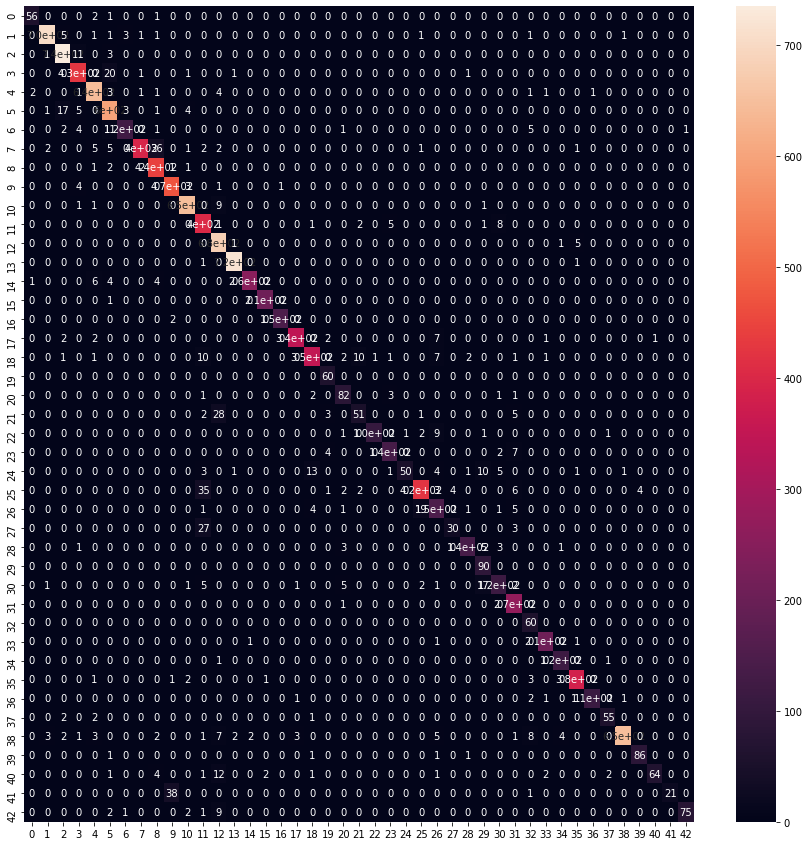

In [28]:
# Model Performance on TEST SET
evaluate_model(model, X_test_gray_norm, y_test)

Loss : 0.46717968583106995
Accuarcy : 0.9573696255683899

              precision    recall  f1-score   support

           0       1.00      0.73      0.85        30
           1       1.00      0.97      0.99       240
           2       0.98      0.99      0.99       240
           3       0.99      0.99      0.99       150
           4       0.95      1.00      0.97       210
           5       0.95      0.98      0.96       210
           6       0.98      1.00      0.99        60
           7       0.99      0.98      0.98       150
           8       0.96      0.98      0.97       150
           9       1.00      1.00      1.00       150
          10       0.96      1.00      0.98       210
          11       0.96      0.99      0.97       150
          12       0.84      1.00      0.91       210
          13       1.00      1.00      1.00       240
          14       0.98      0.99      0.98        90
          15       1.00      1.00      1.00        90
          16       1.00

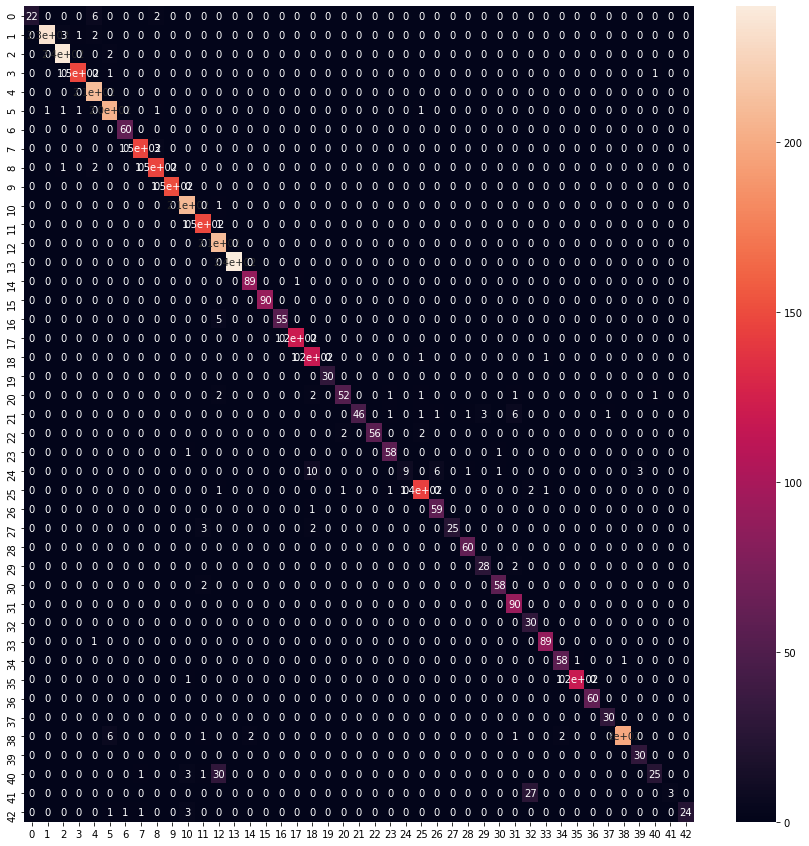

In [29]:
# Model Performance on VALIDATION SET
evaluate_model(model, X_validation_gray_norm, y_validation)

Loss : 0.00894169695675373
Accuarcy : 0.9983332753181458

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       180
           1       1.00      1.00      1.00      1980
           2       1.00      1.00      1.00      2010
           3       1.00      1.00      1.00      1260
           4       1.00      1.00      1.00      1770
           5       1.00      1.00      1.00      1650
           6       0.99      1.00      1.00       360
           7       1.00      1.00      1.00      1290
           8       1.00      1.00      1.00      1260
           9       0.99      1.00      1.00      1320
          10       1.00      1.00      1.00      1800
          11       1.00      1.00      1.00      1170
          12       1.00      1.00      1.00      1890
          13       1.00      1.00      1.00      1920
          14       1.00      1.00      1.00       690
          15       1.00      0.99      1.00       540
          16       1.00

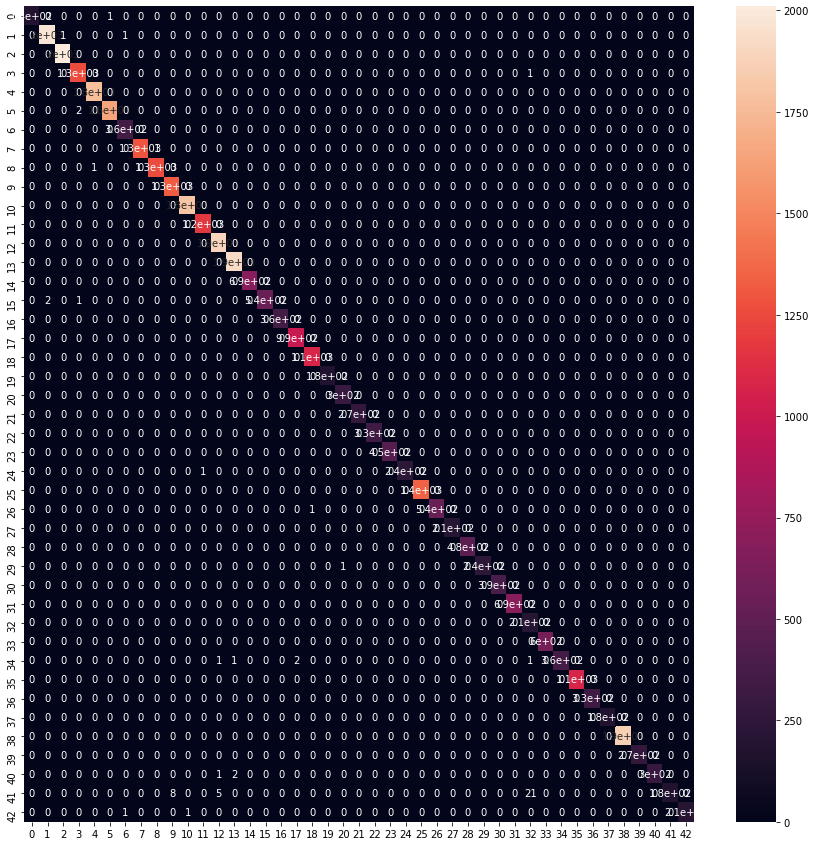

In [30]:
# Model Performance on TRAINING SET
evaluate_model(model, X_train_gray_norm, y_train)

* The model is overfitting to the training data so we must avoid overfitting.

# Step 6 : Avoid Overfitting using Early Stopping Callback

In [58]:
model_early_stopping = build_model()

class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.98):
            print("\nReached 98.0% accuracy so cancelling training!")
            self.model.stop_training = True 
            
            
callback = myCallback()
model_early_stopping_history = model_early_stopping.fit(X_train_gray_norm, y_train, validation_data=(X_validation_gray_norm, y_validation), 
                              epochs=5000, batch_size=32, callbacks=[callback], verbose=True)

Epoch 1/5000
1088/1088 [==============================] - 15s 14ms/step - loss: 1.1713 - accuracy: 0.6870 - val_loss: 0.4998 - val_accuracy: 0.8687
Epoch 2/5000
1088/1088 [==============================] - 16s 14ms/step - loss: 0.1917 - accuracy: 0.9514 - val_loss: 0.3004 - val_accuracy: 0.9236
Epoch 3/5000
1088/1088 [==============================] - 16s 15ms/step - loss: 0.1039 - accuracy: 0.9741 - val_loss: 0.3168 - val_accuracy: 0.9265
Epoch 4/5000
1087/1088 [============================>.] - ETA: 0s - loss: 0.0666 - accuracy: 0.9828
Reached 98.0% accuracy so cancelling training!
1088/1088 [==============================] - 15s 14ms/step - loss: 0.0666 - accuracy: 0.9828 - val_loss: 0.2594 - val_accuracy: 0.9383


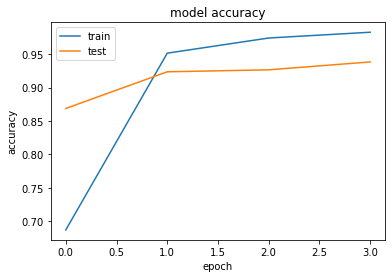

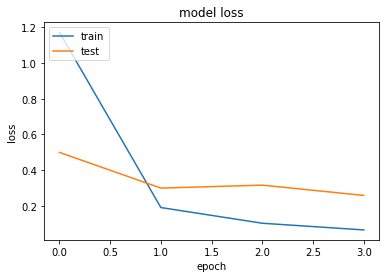

In [59]:
# Plot loss and accuracy for each epoch of training
plot_loss_metric_from_training(model_early_stopping_history)

Loss : 0.5258749127388
Accuarcy : 0.9068092107772827

              precision    recall  f1-score   support

           0       0.93      0.90      0.92        60
           1       0.90      0.93      0.91       720
           2       0.87      0.98      0.93       750
           3       0.88      0.93      0.90       450
           4       0.95      0.92      0.93       660
           5       0.81      0.89      0.85       630
           6       0.99      0.76      0.86       150
           7       0.98      0.78      0.87       450
           8       0.82      0.96      0.88       450
           9       0.96      0.98      0.97       480
          10       0.99      0.94      0.97       660
          11       0.96      0.87      0.91       420
          12       0.97      0.98      0.98       690
          13       0.97      0.99      0.98       720
          14       0.89      0.91      0.90       270
          15       0.87      0.99      0.92       210
          16       1.00    

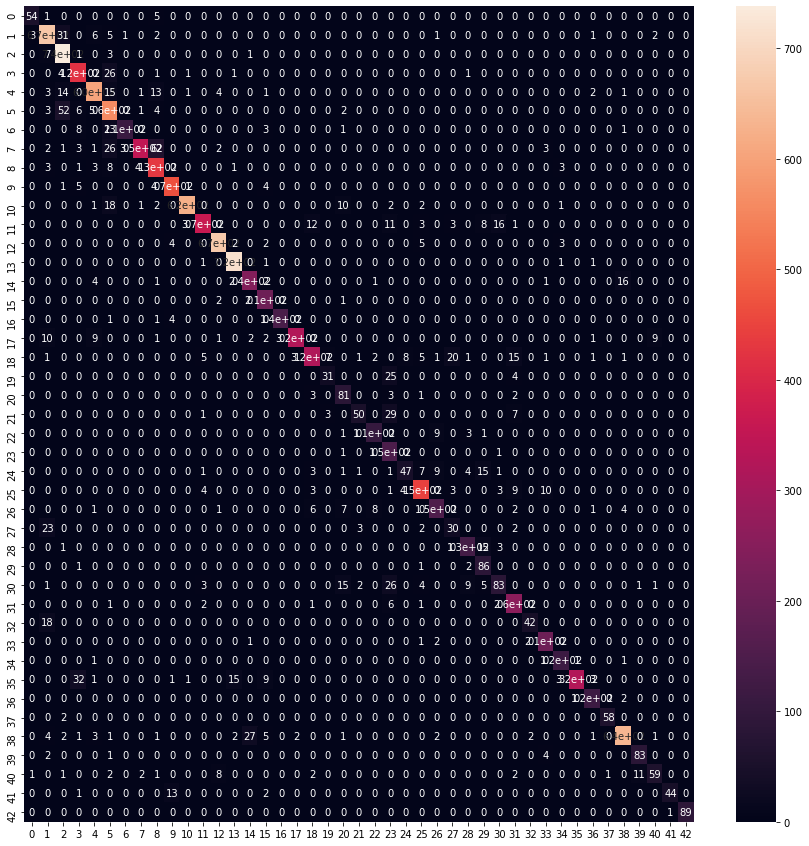

In [64]:
# Model Performance on TEST SET
evaluate_model(model_early_stopping, X_test_gray_norm, y_test)

Loss : 0.2594020962715149
Accuarcy : 0.9383220076560974

              precision    recall  f1-score   support

           0       0.84      0.87      0.85        30
           1       0.93      0.88      0.90       240
           2       0.84      0.98      0.91       240
           3       0.95      0.98      0.97       150
           4       0.96      0.99      0.97       210
           5       0.95      0.87      0.91       210
           6       0.92      1.00      0.96        60
           7       0.92      0.93      0.92       150
           8       0.94      0.97      0.95       150
           9       1.00      0.96      0.98       150
          10       0.99      0.99      0.99       210
          11       0.97      0.95      0.96       150
          12       0.93      0.96      0.94       210
          13       0.99      1.00      1.00       240
          14       1.00      0.99      0.99        90
          15       0.91      1.00      0.95        90
          16       1.00 

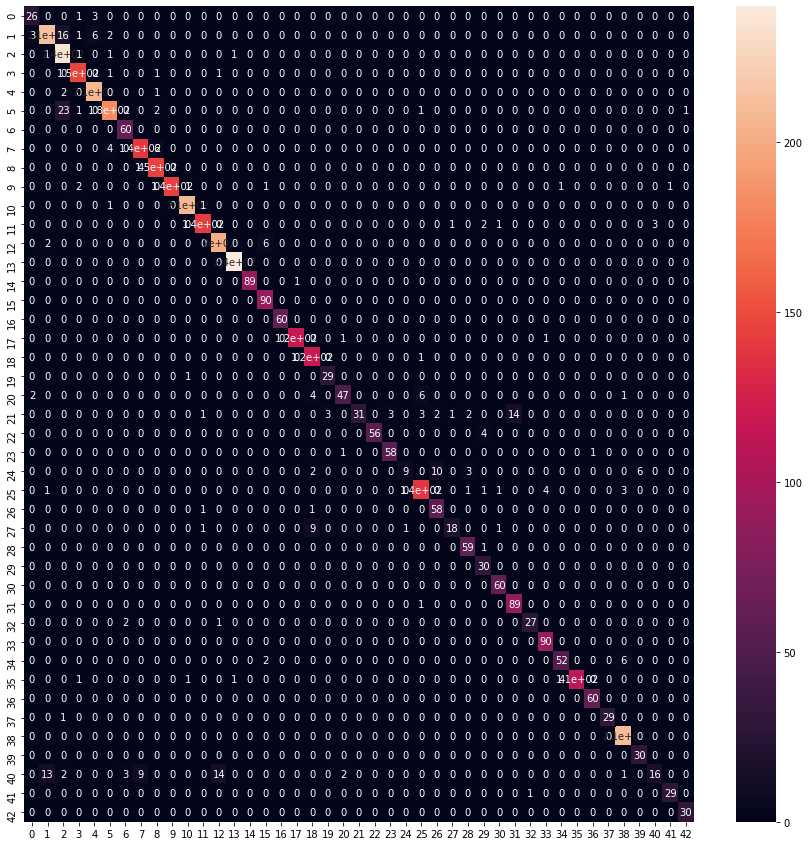

In [65]:
# Model Performance on VALIDATION SET SET
evaluate_model(model_early_stopping, X_validation_gray_norm, y_validation)

Loss : 0.04768780991435051
Accuarcy : 0.9870398640632629

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       180
           1       1.00      0.95      0.97      1980
           2       0.96      1.00      0.98      2010
           3       0.99      0.98      0.99      1260
           4       0.99      0.99      0.99      1770
           5       0.96      0.99      0.97      1650
           6       0.99      1.00      1.00       360
           7       0.99      0.95      0.97      1290
           8       0.96      0.99      0.98      1260
           9       1.00      0.99      0.99      1320
          10       1.00      0.99      0.99      1800
          11       1.00      0.98      0.99      1170
          12       1.00      0.99      0.99      1890
          13       0.99      1.00      0.99      1920
          14       1.00      0.99      1.00       690
          15       0.98      1.00      0.99       540
          16       1.00

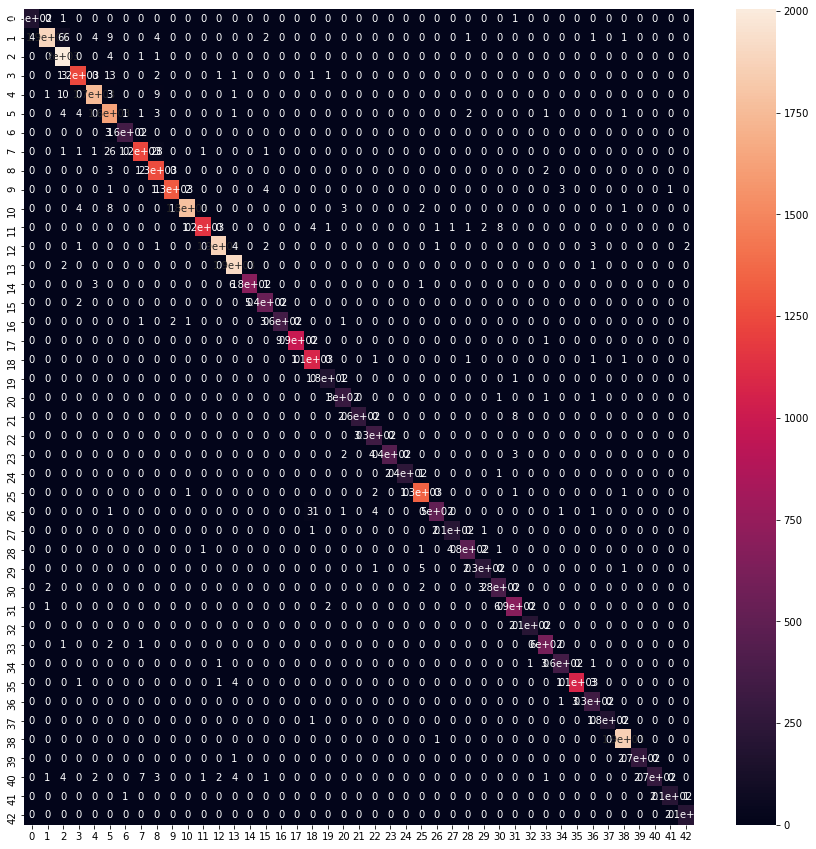

In [66]:
# Model Performance on TRAINING SET
evaluate_model(model_early_stopping, X_train_gray_norm, y_train)

# Step 7 : Hyperparameter Tuning

In [26]:
import keras

def build_modeln(hp):  
    model = keras.Sequential([
    keras.layers.Conv2D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values = [3,5]), # 3 means 3x3 filter, 5 means 5x5 filter
        activation='relu',
        input_shape=X_train_gray_norm.shape[1:]
    ),
    keras.layers.Conv2D(
        filters=hp.Int('conv_2_filter', min_value=32, max_value=64, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
        activation='relu'
    ),
    keras.layers.Flatten(),
    keras.layers.Dense(
        units=hp.Int('dense_1_units', min_value=32, max_value=128, step=16),
        activation='relu'
    ),
    keras.layers.Dense(43, activation='softmax')
 ])
    
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3])),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
    
    return model

In [31]:
import os
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters


tuner_search=RandomSearch(build_modeln,
                          objective='val_accuracy', # direction='max' by default
                          max_trials=15,
                          directory=os.path.normpath('C:/'))
                          #project_name="TrafficSign")

tuner_search.search(X_train_gray_norm, y_train, epochs=15, validation_data=(X_validation_gray_norm, y_validation), 
                    batch_size=32)

Epoch 1/15
 368/1088 [=========>....................] - ETA: 0s - loss: 3.7570 - accuracy: 0.0000e+ - ETA: 31s - loss: 7.3486 - accuracy: 0.0469   - ETA: 38s - loss: 5.7012 - accuracy: 0.062 - ETA: 43s - loss: 5.0443 - accuracy: 0.057 - ETA: 43s - loss: 4.7037 - accuracy: 0.054 - ETA: 43s - loss: 4.5528 - accuracy: 0.053 - ETA: 41s - loss: 4.3795 - accuracy: 0.052 - ETA: 39s - loss: 4.3402 - accuracy: 0.049 - ETA: 38s - loss: 4.2576 - accuracy: 0.052 - ETA: 38s - loss: 4.1944 - accuracy: 0.048 - ETA: 37s - loss: 4.1401 - accuracy: 0.050 - ETA: 37s - loss: 4.0985 - accuracy: 0.052 - ETA: 36s - loss: 4.0613 - accuracy: 0.049 - ETA: 36s - loss: 4.0313 - accuracy: 0.050 - ETA: 35s - loss: 4.0045 - accuracy: 0.051 - ETA: 35s - loss: 3.9787 - accuracy: 0.051 - ETA: 35s - loss: 3.9534 - accuracy: 0.051 - ETA: 35s - loss: 3.9309 - accuracy: 0.051 - ETA: 34s - loss: 3.9103 - accuracy: 0.050 - ETA: 34s - loss: 3.8897 - accuracy: 0.052 - ETA: 34s - loss: 3.8725 - accuracy: 0.052 - ETA: 34s - loss

 372/1088 [=========>....................] - ETA: 0s - loss: 3.4570 - accuracy: 0.06 - ETA: 24s - loss: 3.4568 - accuracy: 0.031 - ETA: 28s - loss: 3.4413 - accuracy: 0.037 - ETA: 30s - loss: 3.4409 - accuracy: 0.044 - ETA: 31s - loss: 3.4396 - accuracy: 0.052 - ETA: 32s - loss: 3.4354 - accuracy: 0.042 - ETA: 33s - loss: 3.4671 - accuracy: 0.038 - ETA: 32s - loss: 3.4478 - accuracy: 0.037 - ETA: 33s - loss: 3.4534 - accuracy: 0.038 - ETA: 33s - loss: 3.4698 - accuracy: 0.039 - ETA: 32s - loss: 3.4712 - accuracy: 0.038 - ETA: 32s - loss: 3.4665 - accuracy: 0.036 - ETA: 32s - loss: 3.4605 - accuracy: 0.040 - ETA: 32s - loss: 3.4573 - accuracy: 0.041 - ETA: 32s - loss: 3.4662 - accuracy: 0.044 - ETA: 32s - loss: 3.4673 - accuracy: 0.045 - ETA: 32s - loss: 3.4766 - accuracy: 0.044 - ETA: 32s - loss: 3.4800 - accuracy: 0.044 - ETA: 32s - loss: 3.4869 - accuracy: 0.043 - ETA: 32s - loss: 3.4934 - accuracy: 0.044 - ETA: 32s - loss: 3.4969 - accuracy: 0.043 - ETA: 32s - loss: 3.4978 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4825 - accuracy: 0.054 - ETA: 10s - loss: 3.4826 - accuracy: 0.054 - ETA: 10s - loss: 3.4827 - accuracy: 0.054 - ETA: 10s - loss: 3.4830 - accuracy: 0.054 - ETA: 10s - loss: 3.4833 - accuracy: 0.054 - ETA: 10s - loss: 3.4833 - accuracy: 0.054 - ETA: 10s - loss: 3.4833 - accuracy: 0.054 - ETA: 10s - loss: 3.4831 - accuracy: 0.054 - ETA: 10s - loss: 3.4831 - accuracy: 0.054 - ETA: 9s - loss: 3.4833 - accuracy: 0.054 - ETA: 9s - loss: 3.4831 - accuracy: 0.05 - ETA: 9s - loss: 3.4830 - accuracy: 0.05 - ETA: 9s - loss: 3.4830 - accuracy: 0.05 - ETA: 9s - loss: 3.4829 - accuracy: 0.05 - ETA: 9s - loss: 3.4831 - accuracy: 0.05 - ETA: 9s - loss: 3.4828 - accuracy: 0.05 - ETA: 9s - loss: 3.4828 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 9s - loss: 3.4824 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 9s - loss: 3.4821 - accuracy: 0.05 - ETA: 9s - loss: 3.4821 - accuracy: 0.05 - ETA: 9s - lo

 371/1088 [=========>....................] - ETA: 0s - loss: 3.4754 - accuracy: 0.03 - ETA: 22s - loss: 3.4671 - accuracy: 0.020 - ETA: 27s - loss: 3.4951 - accuracy: 0.031 - ETA: 29s - loss: 3.4577 - accuracy: 0.044 - ETA: 30s - loss: 3.4626 - accuracy: 0.052 - ETA: 30s - loss: 3.4780 - accuracy: 0.056 - ETA: 31s - loss: 3.4783 - accuracy: 0.055 - ETA: 31s - loss: 3.4756 - accuracy: 0.056 - ETA: 31s - loss: 3.4770 - accuracy: 0.055 - ETA: 31s - loss: 3.4772 - accuracy: 0.054 - ETA: 32s - loss: 3.4782 - accuracy: 0.056 - ETA: 32s - loss: 3.4713 - accuracy: 0.053 - ETA: 32s - loss: 3.4769 - accuracy: 0.052 - ETA: 32s - loss: 3.4771 - accuracy: 0.052 - ETA: 32s - loss: 3.4749 - accuracy: 0.051 - ETA: 32s - loss: 3.4762 - accuracy: 0.050 - ETA: 32s - loss: 3.4734 - accuracy: 0.049 - ETA: 32s - loss: 3.4788 - accuracy: 0.049 - ETA: 31s - loss: 3.4754 - accuracy: 0.050 - ETA: 31s - loss: 3.4813 - accuracy: 0.049 - ETA: 31s - loss: 3.4807 - accuracy: 0.049 - ETA: 31s - loss: 3.4802 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4790 - accuracy: 0.054 - ETA: 10s - loss: 3.4790 - accuracy: 0.054 - ETA: 10s - loss: 3.4791 - accuracy: 0.054 - ETA: 10s - loss: 3.4793 - accuracy: 0.054 - ETA: 10s - loss: 3.4792 - accuracy: 0.054 - ETA: 10s - loss: 3.4793 - accuracy: 0.054 - ETA: 10s - loss: 3.4791 - accuracy: 0.054 - ETA: 10s - loss: 3.4790 - accuracy: 0.054 - ETA: 10s - loss: 3.4788 - accuracy: 0.054 - ETA: 10s - loss: 3.4791 - accuracy: 0.054 - ETA: 10s - loss: 3.4791 - accuracy: 0.054 - ETA: 9s - loss: 3.4792 - accuracy: 0.054 - ETA: 9s - loss: 3.4791 - accuracy: 0.05 - ETA: 9s - loss: 3.4788 - accuracy: 0.05 - ETA: 9s - loss: 3.4789 - accuracy: 0.05 - ETA: 9s - loss: 3.4788 - accuracy: 0.05 - ETA: 9s - loss: 3.4790 - accuracy: 0.05 - ETA: 9s - loss: 3.4788 - accuracy: 0.05 - ETA: 9s - loss: 3.4784 - accuracy: 0.05 - ETA: 9s - loss: 3.4781 - accuracy: 0.05 - ETA: 9s - loss: 3.4784 - accuracy: 0.05 - ETA: 9s - loss: 3.4789 - accuracy: 0.05 - ETA: 9s 

 371/1088 [=========>....................] - ETA: 0s - loss: 3.4128 - accuracy: 0.09 - ETA: 23s - loss: 3.4918 - accuracy: 0.041 - ETA: 25s - loss: 3.4745 - accuracy: 0.043 - ETA: 26s - loss: 3.4782 - accuracy: 0.058 - ETA: 28s - loss: 3.5210 - accuracy: 0.062 - ETA: 29s - loss: 3.5299 - accuracy: 0.056 - ETA: 29s - loss: 3.5092 - accuracy: 0.055 - ETA: 29s - loss: 3.5134 - accuracy: 0.056 - ETA: 30s - loss: 3.5069 - accuracy: 0.068 - ETA: 30s - loss: 3.5089 - accuracy: 0.067 - ETA: 30s - loss: 3.5005 - accuracy: 0.072 - ETA: 30s - loss: 3.5004 - accuracy: 0.070 - ETA: 30s - loss: 3.4948 - accuracy: 0.067 - ETA: 30s - loss: 3.4923 - accuracy: 0.066 - ETA: 30s - loss: 3.4939 - accuracy: 0.067 - ETA: 30s - loss: 3.4889 - accuracy: 0.070 - ETA: 30s - loss: 3.4950 - accuracy: 0.070 - ETA: 30s - loss: 3.4885 - accuracy: 0.068 - ETA: 30s - loss: 3.4841 - accuracy: 0.068 - ETA: 30s - loss: 3.4825 - accuracy: 0.070 - ETA: 30s - loss: 3.4773 - accuracy: 0.067 - ETA: 30s - loss: 3.4727 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4803 - accuracy: 0.055 - ETA: 10s - loss: 3.4800 - accuracy: 0.054 - ETA: 10s - loss: 3.4797 - accuracy: 0.055 - ETA: 10s - loss: 3.4794 - accuracy: 0.055 - ETA: 10s - loss: 3.4797 - accuracy: 0.055 - ETA: 10s - loss: 3.4797 - accuracy: 0.055 - ETA: 10s - loss: 3.4793 - accuracy: 0.055 - ETA: 10s - loss: 3.4793 - accuracy: 0.055 - ETA: 10s - loss: 3.4793 - accuracy: 0.055 - ETA: 10s - loss: 3.4793 - accuracy: 0.055 - ETA: 9s - loss: 3.4789 - accuracy: 0.055 - ETA: 9s - loss: 3.4792 - accuracy: 0.05 - ETA: 9s - loss: 3.4795 - accuracy: 0.05 - ETA: 9s - loss: 3.4794 - accuracy: 0.05 - ETA: 9s - loss: 3.4798 - accuracy: 0.05 - ETA: 9s - loss: 3.4794 - accuracy: 0.05 - ETA: 9s - loss: 3.4794 - accuracy: 0.05 - ETA: 9s - loss: 3.4793 - accuracy: 0.05 - ETA: 9s - loss: 3.4792 - accuracy: 0.05 - ETA: 9s - loss: 3.4793 - accuracy: 0.05 - ETA: 9s - loss: 3.4796 - accuracy: 0.05 - ETA: 9s - loss: 3.4795 - accuracy: 0.05 - ETA: 9s - 

 372/1088 [=========>....................] - ETA: 0s - loss: 3.3909 - accuracy: 0.06 - ETA: 22s - loss: 3.4343 - accuracy: 0.072 - ETA: 25s - loss: 3.4437 - accuracy: 0.062 - ETA: 27s - loss: 3.4831 - accuracy: 0.062 - ETA: 29s - loss: 3.4861 - accuracy: 0.062 - ETA: 29s - loss: 3.4983 - accuracy: 0.062 - ETA: 29s - loss: 3.4791 - accuracy: 0.062 - ETA: 30s - loss: 3.4735 - accuracy: 0.058 - ETA: 30s - loss: 3.4587 - accuracy: 0.060 - ETA: 30s - loss: 3.4484 - accuracy: 0.060 - ETA: 30s - loss: 3.4561 - accuracy: 0.056 - ETA: 31s - loss: 3.4507 - accuracy: 0.055 - ETA: 30s - loss: 3.4607 - accuracy: 0.053 - ETA: 31s - loss: 3.4656 - accuracy: 0.050 - ETA: 31s - loss: 3.4752 - accuracy: 0.049 - ETA: 30s - loss: 3.4877 - accuracy: 0.048 - ETA: 31s - loss: 3.4916 - accuracy: 0.049 - ETA: 31s - loss: 3.4918 - accuracy: 0.049 - ETA: 30s - loss: 3.4894 - accuracy: 0.051 - ETA: 30s - loss: 3.4816 - accuracy: 0.054 - ETA: 30s - loss: 3.4746 - accuracy: 0.054 - ETA: 30s - loss: 3.4754 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4753 - accuracy: 0.055 - ETA: 10s - loss: 3.4755 - accuracy: 0.055 - ETA: 10s - loss: 3.4756 - accuracy: 0.055 - ETA: 10s - loss: 3.4754 - accuracy: 0.055 - ETA: 10s - loss: 3.4758 - accuracy: 0.055 - ETA: 9s - loss: 3.4762 - accuracy: 0.055 - ETA: 9s - loss: 3.4765 - accuracy: 0.05 - ETA: 9s - loss: 3.4769 - accuracy: 0.05 - ETA: 9s - loss: 3.4768 - accuracy: 0.05 - ETA: 9s - loss: 3.4766 - accuracy: 0.05 - ETA: 9s - loss: 3.4766 - accuracy: 0.05 - ETA: 9s - loss: 3.4762 - accuracy: 0.05 - ETA: 9s - loss: 3.4759 - accuracy: 0.05 - ETA: 9s - loss: 3.4761 - accuracy: 0.05 - ETA: 9s - loss: 3.4764 - accuracy: 0.05 - ETA: 9s - loss: 3.4767 - accuracy: 0.05 - ETA: 9s - loss: 3.4770 - accuracy: 0.05 - ETA: 9s - loss: 3.4769 - accuracy: 0.05 - ETA: 9s - loss: 3.4768 - accuracy: 0.05 - ETA: 9s - loss: 3.4773 - accuracy: 0.05 - ETA: 9s - loss: 3.4772 - accuracy: 0.05 - ETA: 8s - loss: 3.4775 - accuracy: 0.05 - ETA: 8s - loss: 3.47

 371/1088 [=========>....................] - ETA: 0s - loss: 3.4288 - accuracy: 0.03 - ETA: 19s - loss: 3.4389 - accuracy: 0.041 - ETA: 25s - loss: 3.4901 - accuracy: 0.050 - ETA: 26s - loss: 3.4774 - accuracy: 0.053 - ETA: 28s - loss: 3.4914 - accuracy: 0.055 - ETA: 29s - loss: 3.5028 - accuracy: 0.062 - ETA: 29s - loss: 3.5207 - accuracy: 0.060 - ETA: 29s - loss: 3.5295 - accuracy: 0.060 - ETA: 30s - loss: 3.5324 - accuracy: 0.057 - ETA: 30s - loss: 3.5259 - accuracy: 0.055 - ETA: 30s - loss: 3.5181 - accuracy: 0.058 - ETA: 30s - loss: 3.5143 - accuracy: 0.058 - ETA: 30s - loss: 3.5140 - accuracy: 0.060 - ETA: 30s - loss: 3.5046 - accuracy: 0.061 - ETA: 30s - loss: 3.5052 - accuracy: 0.059 - ETA: 30s - loss: 3.5034 - accuracy: 0.058 - ETA: 30s - loss: 3.5043 - accuracy: 0.058 - ETA: 30s - loss: 3.4961 - accuracy: 0.058 - ETA: 30s - loss: 3.4994 - accuracy: 0.056 - ETA: 30s - loss: 3.4968 - accuracy: 0.057 - ETA: 31s - loss: 3.4946 - accuracy: 0.055 - ETA: 30s - loss: 3.4964 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4818 - accuracy: 0.056 - ETA: 10s - loss: 3.4820 - accuracy: 0.056 - ETA: 10s - loss: 3.4815 - accuracy: 0.056 - ETA: 10s - loss: 3.4815 - accuracy: 0.056 - ETA: 10s - loss: 3.4816 - accuracy: 0.056 - ETA: 10s - loss: 3.4816 - accuracy: 0.056 - ETA: 10s - loss: 3.4815 - accuracy: 0.056 - ETA: 9s - loss: 3.4819 - accuracy: 0.056 - ETA: 9s - loss: 3.4818 - accuracy: 0.05 - ETA: 9s - loss: 3.4817 - accuracy: 0.05 - ETA: 9s - loss: 3.4818 - accuracy: 0.05 - ETA: 9s - loss: 3.4820 - accuracy: 0.05 - ETA: 9s - loss: 3.4820 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 9s - loss: 3.4824 - accuracy: 0.05 - ETA: 9s - loss: 3.4821 - accuracy: 0.05 - ETA: 9s - loss: 3.4817 - accuracy: 0.05 - ETA: 9s - loss: 3.4821 - accuracy: 0.05 - ETA: 9s - loss: 3.4820 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 9s - loss: 3.4825 - accuracy: 0.05 - ETA: 8s - loss: 

 373/1088 [=========>....................] - ETA: 0s - loss: 3.4933 - accuracy: 0.06 - ETA: 21s - loss: 3.5287 - accuracy: 0.041 - ETA: 26s - loss: 3.4449 - accuracy: 0.056 - ETA: 28s - loss: 3.4526 - accuracy: 0.058 - ETA: 28s - loss: 3.4586 - accuracy: 0.055 - ETA: 29s - loss: 3.4661 - accuracy: 0.051 - ETA: 30s - loss: 3.4661 - accuracy: 0.055 - ETA: 30s - loss: 3.4629 - accuracy: 0.054 - ETA: 30s - loss: 3.4809 - accuracy: 0.051 - ETA: 30s - loss: 3.4826 - accuracy: 0.055 - ETA: 31s - loss: 3.5008 - accuracy: 0.055 - ETA: 30s - loss: 3.4984 - accuracy: 0.061 - ETA: 31s - loss: 3.5037 - accuracy: 0.063 - ETA: 31s - loss: 3.5121 - accuracy: 0.062 - ETA: 31s - loss: 3.5014 - accuracy: 0.062 - ETA: 31s - loss: 3.5108 - accuracy: 0.064 - ETA: 31s - loss: 3.5042 - accuracy: 0.066 - ETA: 31s - loss: 3.5029 - accuracy: 0.065 - ETA: 31s - loss: 3.4987 - accuracy: 0.062 - ETA: 31s - loss: 3.4963 - accuracy: 0.060 - ETA: 31s - loss: 3.4916 - accuracy: 0.061 - ETA: 31s - loss: 3.4879 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 3.4769 - accuracy: 0.055 - ETA: 10s - loss: 3.4770 - accuracy: 0.055 - ETA: 10s - loss: 3.4771 - accuracy: 0.055 - ETA: 10s - loss: 3.4773 - accuracy: 0.055 - ETA: 10s - loss: 3.4775 - accuracy: 0.055 - ETA: 10s - loss: 3.4775 - accuracy: 0.055 - ETA: 10s - loss: 3.4776 - accuracy: 0.055 - ETA: 10s - loss: 3.4780 - accuracy: 0.055 - ETA: 10s - loss: 3.4777 - accuracy: 0.055 - ETA: 9s - loss: 3.4777 - accuracy: 0.055 - ETA: 9s - loss: 3.4780 - accuracy: 0.05 - ETA: 9s - loss: 3.4775 - accuracy: 0.05 - ETA: 9s - loss: 3.4775 - accuracy: 0.05 - ETA: 9s - loss: 3.4773 - accuracy: 0.05 - ETA: 9s - loss: 3.4772 - accuracy: 0.05 - ETA: 9s - loss: 3.4773 - accuracy: 0.05 - ETA: 9s - loss: 3.4771 - accuracy: 0.05 - ETA: 9s - loss: 3.4773 - accuracy: 0.05 - ETA: 9s - loss: 3.4772 - accuracy: 0.05 - ETA: 9s - loss: 3.4772 - accuracy: 0.05 - ETA: 9s - loss: 3.4775 - accuracy: 0.05 - ETA: 9s - loss: 3.4775 - accuracy: 0.05 - ETA: 9s - lo

 408/1088 [==========>...................] - ETA: 0s - loss: 3.3009 - accuracy: 0.06 - ETA: 23s - loss: 3.4890 - accuracy: 0.041 - ETA: 26s - loss: 3.4528 - accuracy: 0.057 - ETA: 26s - loss: 3.4462 - accuracy: 0.066 - ETA: 28s - loss: 3.4777 - accuracy: 0.062 - ETA: 28s - loss: 3.5005 - accuracy: 0.062 - ETA: 29s - loss: 3.4818 - accuracy: 0.060 - ETA: 29s - loss: 3.4863 - accuracy: 0.056 - ETA: 30s - loss: 3.4937 - accuracy: 0.059 - ETA: 30s - loss: 3.4762 - accuracy: 0.059 - ETA: 30s - loss: 3.4816 - accuracy: 0.063 - ETA: 30s - loss: 3.4775 - accuracy: 0.061 - ETA: 30s - loss: 3.4830 - accuracy: 0.057 - ETA: 30s - loss: 3.4681 - accuracy: 0.059 - ETA: 30s - loss: 3.4655 - accuracy: 0.058 - ETA: 30s - loss: 3.4817 - accuracy: 0.059 - ETA: 30s - loss: 3.4746 - accuracy: 0.064 - ETA: 29s - loss: 3.4775 - accuracy: 0.062 - ETA: 29s - loss: 3.4764 - accuracy: 0.061 - ETA: 29s - loss: 3.4736 - accuracy: 0.061 - ETA: 29s - loss: 3.4761 - accuracy: 0.060 - ETA: 29s - loss: 3.4787 - accurac

1088/1088 [==============================] - ETA: 7s - loss: 3.4750 - accuracy: 0.05 - ETA: 7s - loss: 3.4754 - accuracy: 0.05 - ETA: 7s - loss: 3.4754 - accuracy: 0.05 - ETA: 7s - loss: 3.4756 - accuracy: 0.05 - ETA: 7s - loss: 3.4758 - accuracy: 0.05 - ETA: 7s - loss: 3.4755 - accuracy: 0.05 - ETA: 7s - loss: 3.4756 - accuracy: 0.05 - ETA: 7s - loss: 3.4755 - accuracy: 0.05 - ETA: 7s - loss: 3.4754 - accuracy: 0.05 - ETA: 7s - loss: 3.4752 - accuracy: 0.05 - ETA: 7s - loss: 3.4751 - accuracy: 0.05 - ETA: 7s - loss: 3.4749 - accuracy: 0.05 - ETA: 7s - loss: 3.4748 - accuracy: 0.05 - ETA: 7s - loss: 3.4752 - accuracy: 0.05 - ETA: 6s - loss: 3.4751 - accuracy: 0.05 - ETA: 6s - loss: 3.4752 - accuracy: 0.05 - ETA: 6s - loss: 3.4753 - accuracy: 0.05 - ETA: 6s - loss: 3.4753 - accuracy: 0.05 - ETA: 6s - loss: 3.4753 - accuracy: 0.05 - ETA: 6s - loss: 3.4757 - accuracy: 0.05 - ETA: 6s - loss: 3.4759 - accuracy: 0.05 - ETA: 6s - loss: 3.4758 - accuracy: 0.05 - ETA: 6s - loss: 3.4756 - accura

Epoch 1/15


 241/1088 [=====>........................] - ETA: 0s - loss: 3.7689 - accuracy: 0.0000e+ - ETA: 29s - loss: 3.7270 - accuracy: 0.0156   - ETA: 40s - loss: 3.7185 - accuracy: 0.020 - ETA: 47s - loss: 3.7344 - accuracy: 0.023 - ETA: 49s - loss: 3.7007 - accuracy: 0.025 - ETA: 50s - loss: 3.6753 - accuracy: 0.036 - ETA: 51s - loss: 3.6631 - accuracy: 0.040 - ETA: 52s - loss: 3.6239 - accuracy: 0.050 - ETA: 52s - loss: 3.6074 - accuracy: 0.056 - ETA: 52s - loss: 3.5939 - accuracy: 0.059 - ETA: 52s - loss: 3.5920 - accuracy: 0.060 - ETA: 53s - loss: 3.5865 - accuracy: 0.064 - ETA: 53s - loss: 3.5980 - accuracy: 0.064 - ETA: 53s - loss: 3.5899 - accuracy: 0.066 - ETA: 53s - loss: 3.5720 - accuracy: 0.074 - ETA: 52s - loss: 3.5182 - accuracy: 0.089 - ETA: 52s - loss: 3.5301 - accuracy: 0.090 - ETA: 53s - loss: 3.5227 - accuracy: 0.093 - ETA: 53s - loss: 3.5143 - accuracy: 0.095 - ETA: 53s - loss: 3.5014 - accuracy: 0.099 - ETA: 53s - loss: 3.4915 - accuracy: 0.100 - ETA: 53s - loss: 3.4873 - 

1088/1088 [==============================] - ETA: 3s - loss: 0.6354 - accuracy: 0.83 - ETA: 3s - loss: 0.6343 - accuracy: 0.83 - ETA: 3s - loss: 0.6338 - accuracy: 0.83 - ETA: 3s - loss: 0.6333 - accuracy: 0.83 - ETA: 3s - loss: 0.6331 - accuracy: 0.83 - ETA: 3s - loss: 0.6326 - accuracy: 0.83 - ETA: 3s - loss: 0.6316 - accuracy: 0.83 - ETA: 3s - loss: 0.6306 - accuracy: 0.83 - ETA: 2s - loss: 0.6301 - accuracy: 0.83 - ETA: 2s - loss: 0.6296 - accuracy: 0.83 - ETA: 2s - loss: 0.6287 - accuracy: 0.83 - ETA: 2s - loss: 0.6283 - accuracy: 0.83 - ETA: 2s - loss: 0.6278 - accuracy: 0.83 - ETA: 2s - loss: 0.6273 - accuracy: 0.83 - ETA: 2s - loss: 0.6268 - accuracy: 0.83 - ETA: 2s - loss: 0.6257 - accuracy: 0.83 - ETA: 2s - loss: 0.6248 - accuracy: 0.83 - ETA: 2s - loss: 0.6242 - accuracy: 0.83 - ETA: 2s - loss: 0.6232 - accuracy: 0.83 - ETA: 2s - loss: 0.6221 - accuracy: 0.83 - ETA: 2s - loss: 0.6215 - accuracy: 0.83 - ETA: 1s - loss: 0.6205 - accuracy: 0.83 - ETA: 1s - loss: 0.6200 - accura

 250/1088 [=====>........................] - ETA: 0s - loss: 0.0537 - accuracy: 1.00 - ETA: 29s - loss: 0.0699 - accuracy: 0.984 - ETA: 37s - loss: 0.1362 - accuracy: 0.979 - ETA: 43s - loss: 0.1086 - accuracy: 0.984 - ETA: 47s - loss: 0.1562 - accuracy: 0.968 - ETA: 50s - loss: 0.1560 - accuracy: 0.968 - ETA: 52s - loss: 0.1474 - accuracy: 0.968 - ETA: 52s - loss: 0.1393 - accuracy: 0.972 - ETA: 52s - loss: 0.1306 - accuracy: 0.975 - ETA: 52s - loss: 0.1280 - accuracy: 0.974 - ETA: 53s - loss: 0.1260 - accuracy: 0.974 - ETA: 53s - loss: 0.1258 - accuracy: 0.973 - ETA: 54s - loss: 0.1195 - accuracy: 0.975 - ETA: 54s - loss: 0.1151 - accuracy: 0.977 - ETA: 54s - loss: 0.1097 - accuracy: 0.978 - ETA: 55s - loss: 0.1107 - accuracy: 0.976 - ETA: 54s - loss: 0.1078 - accuracy: 0.977 - ETA: 55s - loss: 0.1058 - accuracy: 0.978 - ETA: 55s - loss: 0.1077 - accuracy: 0.976 - ETA: 55s - loss: 0.1004 - accuracy: 0.978 - ETA: 55s - loss: 0.1055 - accuracy: 0.976 - ETA: 55s - loss: 0.1019 - accurac

1050/1088 [===========================>..] - ETA: 14s - loss: 0.1025 - accuracy: 0.973 - ETA: 14s - loss: 0.1024 - accuracy: 0.973 - ETA: 14s - loss: 0.1023 - accuracy: 0.973 - ETA: 14s - loss: 0.1022 - accuracy: 0.973 - ETA: 14s - loss: 0.1022 - accuracy: 0.973 - ETA: 14s - loss: 0.1022 - accuracy: 0.973 - ETA: 14s - loss: 0.1022 - accuracy: 0.973 - ETA: 14s - loss: 0.1021 - accuracy: 0.973 - ETA: 14s - loss: 0.1020 - accuracy: 0.973 - ETA: 14s - loss: 0.1019 - accuracy: 0.973 - ETA: 14s - loss: 0.1018 - accuracy: 0.973 - ETA: 14s - loss: 0.1018 - accuracy: 0.973 - ETA: 14s - loss: 0.1017 - accuracy: 0.973 - ETA: 14s - loss: 0.1017 - accuracy: 0.973 - ETA: 14s - loss: 0.1019 - accuracy: 0.973 - ETA: 14s - loss: 0.1018 - accuracy: 0.973 - ETA: 13s - loss: 0.1018 - accuracy: 0.973 - ETA: 13s - loss: 0.1017 - accuracy: 0.973 - ETA: 13s - loss: 0.1017 - accuracy: 0.973 - ETA: 13s - loss: 0.1017 - accuracy: 0.973 - ETA: 13s - loss: 0.1016 - accuracy: 0.973 - ETA: 13s - loss: 0.1017 - accur

1088/1088 [==============================] - ETA: 2s - loss: 0.1010 - accuracy: 0.97 - ETA: 2s - loss: 0.1010 - accuracy: 0.97 - ETA: 2s - loss: 0.1009 - accuracy: 0.97 - ETA: 1s - loss: 0.1011 - accuracy: 0.97 - ETA: 1s - loss: 0.1010 - accuracy: 0.97 - ETA: 1s - loss: 0.1009 - accuracy: 0.97 - ETA: 1s - loss: 0.1009 - accuracy: 0.97 - ETA: 1s - loss: 0.1008 - accuracy: 0.97 - ETA: 1s - loss: 0.1009 - accuracy: 0.97 - ETA: 1s - loss: 0.1008 - accuracy: 0.97 - ETA: 1s - loss: 0.1007 - accuracy: 0.97 - ETA: 1s - loss: 0.1007 - accuracy: 0.97 - ETA: 1s - loss: 0.1006 - accuracy: 0.97 - ETA: 1s - loss: 0.1006 - accuracy: 0.97 - ETA: 1s - loss: 0.1005 - accuracy: 0.97 - ETA: 1s - loss: 0.1007 - accuracy: 0.97 - ETA: 1s - loss: 0.1009 - accuracy: 0.97 - ETA: 1s - loss: 0.1008 - accuracy: 0.97 - ETA: 1s - loss: 0.1008 - accuracy: 0.97 - ETA: 1s - loss: 0.1008 - accuracy: 0.97 - ETA: 0s - loss: 0.1008 - accuracy: 0.97 - ETA: 0s - loss: 0.1008 - accuracy: 0.97 - ETA: 0s - loss: 0.1008 - accura

 212/1088 [====>.........................] - ETA: 0s - loss: 0.0093 - accuracy: 1.00 - ETA: 34s - loss: 0.0110 - accuracy: 1.000 - ETA: 46s - loss: 0.0309 - accuracy: 0.989 - ETA: 54s - loss: 0.0287 - accuracy: 0.992 - ETA: 54s - loss: 0.0271 - accuracy: 0.993 - ETA: 55s - loss: 0.0322 - accuracy: 0.989 - ETA: 57s - loss: 0.0326 - accuracy: 0.986 - ETA: 57s - loss: 0.0407 - accuracy: 0.980 - ETA: 58s - loss: 0.0369 - accuracy: 0.982 - ETA: 58s - loss: 0.0473 - accuracy: 0.978 - ETA: 59s - loss: 0.0559 - accuracy: 0.977 - ETA: 59s - loss: 0.0515 - accuracy: 0.979 - ETA: 59s - loss: 0.0486 - accuracy: 0.980 - ETA: 59s - loss: 0.0530 - accuracy: 0.979 - ETA: 59s - loss: 0.0500 - accuracy: 0.981 - ETA: 1:00 - loss: 0.0483 - accuracy: 0.98 - ETA: 1:02 - loss: 0.0474 - accuracy: 0.98 - ETA: 1:02 - loss: 0.0452 - accuracy: 0.98 - ETA: 1:02 - loss: 0.0459 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0458 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0472 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0466 - accura

1088/1088 [==============================] - ETA: 7s - loss: 0.0553 - accuracy: 0.98 - ETA: 7s - loss: 0.0553 - accuracy: 0.98 - ETA: 7s - loss: 0.0554 - accuracy: 0.98 - ETA: 7s - loss: 0.0553 - accuracy: 0.98 - ETA: 7s - loss: 0.0553 - accuracy: 0.98 - ETA: 7s - loss: 0.0553 - accuracy: 0.98 - ETA: 6s - loss: 0.0552 - accuracy: 0.98 - ETA: 6s - loss: 0.0552 - accuracy: 0.98 - ETA: 6s - loss: 0.0552 - accuracy: 0.98 - ETA: 6s - loss: 0.0551 - accuracy: 0.98 - ETA: 6s - loss: 0.0550 - accuracy: 0.98 - ETA: 6s - loss: 0.0550 - accuracy: 0.98 - ETA: 6s - loss: 0.0550 - accuracy: 0.98 - ETA: 6s - loss: 0.0550 - accuracy: 0.98 - ETA: 6s - loss: 0.0549 - accuracy: 0.98 - ETA: 6s - loss: 0.0551 - accuracy: 0.98 - ETA: 6s - loss: 0.0550 - accuracy: 0.98 - ETA: 6s - loss: 0.0549 - accuracy: 0.98 - ETA: 5s - loss: 0.0549 - accuracy: 0.98 - ETA: 5s - loss: 0.0549 - accuracy: 0.98 - ETA: 5s - loss: 0.0548 - accuracy: 0.98 - ETA: 5s - loss: 0.0548 - accuracy: 0.98 - ETA: 5s - loss: 0.0547 - accura

 233/1088 [=====>........................] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 31s - loss: 0.0282 - accuracy: 0.984 - ETA: 39s - loss: 0.0407 - accuracy: 0.984 - ETA: 44s - loss: 0.0348 - accuracy: 0.987 - ETA: 46s - loss: 0.0467 - accuracy: 0.977 - ETA: 48s - loss: 0.0495 - accuracy: 0.976 - ETA: 49s - loss: 0.0505 - accuracy: 0.978 - ETA: 50s - loss: 0.0504 - accuracy: 0.980 - ETA: 50s - loss: 0.0487 - accuracy: 0.980 - ETA: 50s - loss: 0.0457 - accuracy: 0.982 - ETA: 51s - loss: 0.0457 - accuracy: 0.981 - ETA: 52s - loss: 0.0433 - accuracy: 0.982 - ETA: 51s - loss: 0.0454 - accuracy: 0.980 - ETA: 52s - loss: 0.0438 - accuracy: 0.981 - ETA: 53s - loss: 0.0454 - accuracy: 0.981 - ETA: 53s - loss: 0.0442 - accuracy: 0.982 - ETA: 53s - loss: 0.0433 - accuracy: 0.983 - ETA: 53s - loss: 0.0457 - accuracy: 0.981 - ETA: 54s - loss: 0.0469 - accuracy: 0.980 - ETA: 54s - loss: 0.0452 - accuracy: 0.981 - ETA: 54s - loss: 0.0438 - accuracy: 0.982 - ETA: 54s - loss: 0.0437 - accurac

1088/1088 [==============================] - ETA: 4s - loss: 0.0377 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0379 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 4s - loss: 0.0378 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0378 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0378 - accuracy: 0.98 - ETA: 3s - loss: 0.0378 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0378 - accuracy: 0.98 - ETA: 3s - loss: 0.0379 - accuracy: 0.98 - ETA: 3s - loss: 0.0378 - accura

 236/1088 [=====>........................] - ETA: 0s - loss: 0.0126 - accuracy: 1.00 - ETA: 34s - loss: 0.0287 - accuracy: 1.000 - ETA: 43s - loss: 0.0306 - accuracy: 1.000 - ETA: 49s - loss: 0.0267 - accuracy: 1.000 - ETA: 51s - loss: 0.0222 - accuracy: 1.000 - ETA: 53s - loss: 0.0220 - accuracy: 1.000 - ETA: 55s - loss: 0.0193 - accuracy: 1.000 - ETA: 55s - loss: 0.0189 - accuracy: 1.000 - ETA: 56s - loss: 0.0196 - accuracy: 0.996 - ETA: 56s - loss: 0.0216 - accuracy: 0.993 - ETA: 57s - loss: 0.0197 - accuracy: 0.994 - ETA: 57s - loss: 0.0182 - accuracy: 0.994 - ETA: 57s - loss: 0.0169 - accuracy: 0.995 - ETA: 58s - loss: 0.0184 - accuracy: 0.993 - ETA: 58s - loss: 0.0172 - accuracy: 0.993 - ETA: 58s - loss: 0.0163 - accuracy: 0.994 - ETA: 57s - loss: 0.0174 - accuracy: 0.993 - ETA: 57s - loss: 0.0181 - accuracy: 0.991 - ETA: 57s - loss: 0.0180 - accuracy: 0.992 - ETA: 57s - loss: 0.0174 - accuracy: 0.992 - ETA: 57s - loss: 0.0178 - accuracy: 0.991 - ETA: 56s - loss: 0.0165 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0265 - accuracy: 0.99 - ETA: 3s - loss: 0.0267 - accuracy: 0.99 - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 3s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0266 - accuracy: 0.99 - ETA: 2s - loss: 0.0265 - accuracy: 0.99 - ETA: 2s - loss: 0.0265 - accuracy: 0.99 - ETA: 2s - loss: 0.0265 - accura

 256/1088 [======>.......................] - ETA: 0s - loss: 0.0552 - accuracy: 0.93 - ETA: 37s - loss: 0.0280 - accuracy: 0.968 - ETA: 43s - loss: 0.0429 - accuracy: 0.968 - ETA: 50s - loss: 0.0328 - accuracy: 0.976 - ETA: 51s - loss: 0.0404 - accuracy: 0.975 - ETA: 53s - loss: 0.0539 - accuracy: 0.974 - ETA: 52s - loss: 0.0418 - accuracy: 0.980 - ETA: 53s - loss: 0.0380 - accuracy: 0.982 - ETA: 54s - loss: 0.0420 - accuracy: 0.981 - ETA: 55s - loss: 0.0395 - accuracy: 0.983 - ETA: 55s - loss: 0.0339 - accuracy: 0.985 - ETA: 55s - loss: 0.0319 - accuracy: 0.986 - ETA: 55s - loss: 0.0298 - accuracy: 0.988 - ETA: 55s - loss: 0.0325 - accuracy: 0.987 - ETA: 56s - loss: 0.0307 - accuracy: 0.987 - ETA: 56s - loss: 0.0292 - accuracy: 0.988 - ETA: 56s - loss: 0.0279 - accuracy: 0.989 - ETA: 56s - loss: 0.0273 - accuracy: 0.989 - ETA: 56s - loss: 0.0262 - accuracy: 0.990 - ETA: 56s - loss: 0.0252 - accuracy: 0.990 - ETA: 56s - loss: 0.0233 - accuracy: 0.991 - ETA: 56s - loss: 0.0226 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 0.0248 - accuracy: 0.99 - ETA: 2s - loss: 0.0248 - accuracy: 0.99 - ETA: 2s - loss: 0.0248 - accuracy: 0.99 - ETA: 2s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0247 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0247 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0249 - accuracy: 0.99 - ETA: 1s - loss: 0.0249 - accuracy: 0.99 - ETA: 1s - loss: 0.0249 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 1s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0248 - accuracy: 0.99 - ETA: 0s - loss: 0.0249 - accura

 255/1088 [======>.......................] - ETA: 0s - loss: 0.0015 - accuracy: 1.00 - ETA: 33s - loss: 0.0015 - accuracy: 1.000 - ETA: 43s - loss: 0.0100 - accuracy: 1.000 - ETA: 48s - loss: 0.0079 - accuracy: 1.000 - ETA: 50s - loss: 0.0065 - accuracy: 1.000 - ETA: 55s - loss: 0.0056 - accuracy: 1.000 - ETA: 56s - loss: 0.0173 - accuracy: 0.995 - ETA: 57s - loss: 0.0162 - accuracy: 0.996 - ETA: 57s - loss: 0.0162 - accuracy: 0.993 - ETA: 56s - loss: 0.0139 - accuracy: 0.994 - ETA: 56s - loss: 0.0176 - accuracy: 0.993 - ETA: 56s - loss: 0.0182 - accuracy: 0.993 - ETA: 56s - loss: 0.0176 - accuracy: 0.994 - ETA: 57s - loss: 0.0183 - accuracy: 0.994 - ETA: 56s - loss: 0.0187 - accuracy: 0.993 - ETA: 56s - loss: 0.0170 - accuracy: 0.994 - ETA: 56s - loss: 0.0171 - accuracy: 0.994 - ETA: 56s - loss: 0.0159 - accuracy: 0.994 - ETA: 57s - loss: 0.0153 - accuracy: 0.995 - ETA: 57s - loss: 0.0152 - accuracy: 0.995 - ETA: 57s - loss: 0.0147 - accuracy: 0.995 - ETA: 56s - loss: 0.0143 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 0.0191 - accuracy: 0.99 - ETA: 2s - loss: 0.0191 - accuracy: 0.99 - ETA: 2s - loss: 0.0191 - accuracy: 0.99 - ETA: 2s - loss: 0.0191 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 2s - loss: 0.0189 - accuracy: 0.99 - ETA: 2s - loss: 0.0189 - accuracy: 0.99 - ETA: 2s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0190 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0189 - accuracy: 0.99 - ETA: 1s - loss: 0.0188 - accura

 252/1088 [=====>........................] - ETA: 0s - loss: 0.0032 - accuracy: 1.00 - ETA: 36s - loss: 0.0952 - accuracy: 0.984 - ETA: 45s - loss: 0.0488 - accuracy: 0.992 - ETA: 46s - loss: 0.0330 - accuracy: 0.994 - ETA: 48s - loss: 0.0286 - accuracy: 0.995 - ETA: 50s - loss: 0.0254 - accuracy: 0.996 - ETA: 51s - loss: 0.0239 - accuracy: 0.996 - ETA: 52s - loss: 0.0228 - accuracy: 0.996 - ETA: 52s - loss: 0.0208 - accuracy: 0.997 - ETA: 53s - loss: 0.0200 - accuracy: 0.995 - ETA: 53s - loss: 0.0185 - accuracy: 0.995 - ETA: 53s - loss: 0.0175 - accuracy: 0.996 - ETA: 53s - loss: 0.0166 - accuracy: 0.996 - ETA: 53s - loss: 0.0149 - accuracy: 0.996 - ETA: 53s - loss: 0.0258 - accuracy: 0.995 - ETA: 53s - loss: 0.0247 - accuracy: 0.995 - ETA: 52s - loss: 0.0232 - accuracy: 0.996 - ETA: 52s - loss: 0.0223 - accuracy: 0.996 - ETA: 53s - loss: 0.0219 - accuracy: 0.996 - ETA: 53s - loss: 0.0215 - accuracy: 0.996 - ETA: 53s - loss: 0.0223 - accuracy: 0.995 - ETA: 53s - loss: 0.0216 - accurac

1088/1088 [==============================] - ETA: 4s - loss: 0.0185 - accuracy: 0.99 - ETA: 4s - loss: 0.0185 - accuracy: 0.99 - ETA: 4s - loss: 0.0185 - accuracy: 0.99 - ETA: 4s - loss: 0.0184 - accuracy: 0.99 - ETA: 4s - loss: 0.0184 - accuracy: 0.99 - ETA: 4s - loss: 0.0184 - accuracy: 0.99 - ETA: 3s - loss: 0.0183 - accuracy: 0.99 - ETA: 3s - loss: 0.0183 - accuracy: 0.99 - ETA: 3s - loss: 0.0183 - accuracy: 0.99 - ETA: 3s - loss: 0.0183 - accuracy: 0.99 - ETA: 3s - loss: 0.0183 - accuracy: 0.99 - ETA: 3s - loss: 0.0182 - accuracy: 0.99 - ETA: 3s - loss: 0.0182 - accuracy: 0.99 - ETA: 3s - loss: 0.0182 - accuracy: 0.99 - ETA: 3s - loss: 0.0182 - accuracy: 0.99 - ETA: 3s - loss: 0.0182 - accuracy: 0.99 - ETA: 3s - loss: 0.0181 - accuracy: 0.99 - ETA: 3s - loss: 0.0181 - accuracy: 0.99 - ETA: 3s - loss: 0.0181 - accuracy: 0.99 - ETA: 3s - loss: 0.0181 - accuracy: 0.99 - ETA: 3s - loss: 0.0180 - accuracy: 0.99 - ETA: 2s - loss: 0.0180 - accuracy: 0.99 - ETA: 2s - loss: 0.0180 - accura

 256/1088 [======>.......................] - ETA: 0s - loss: 1.7092e-04 - accuracy: 1.00 - ETA: 36s - loss: 0.0279 - accuracy: 0.9844   - ETA: 48s - loss: 0.0161 - accuracy: 0.992 - ETA: 48s - loss: 0.0128 - accuracy: 0.994 - ETA: 51s - loss: 0.0126 - accuracy: 0.995 - ETA: 51s - loss: 0.0103 - accuracy: 0.996 - ETA: 51s - loss: 0.0094 - accuracy: 0.996 - ETA: 53s - loss: 0.0087 - accuracy: 0.997 - ETA: 54s - loss: 0.0082 - accuracy: 0.997 - ETA: 54s - loss: 0.0075 - accuracy: 0.997 - ETA: 54s - loss: 0.0067 - accuracy: 0.998 - ETA: 54s - loss: 0.0064 - accuracy: 0.998 - ETA: 54s - loss: 0.0060 - accuracy: 0.998 - ETA: 55s - loss: 0.0054 - accuracy: 0.998 - ETA: 55s - loss: 0.0052 - accuracy: 0.998 - ETA: 55s - loss: 0.0049 - accuracy: 0.998 - ETA: 55s - loss: 0.0047 - accuracy: 0.998 - ETA: 55s - loss: 0.0045 - accuracy: 0.998 - ETA: 55s - loss: 0.0044 - accuracy: 0.998 - ETA: 55s - loss: 0.0042 - accuracy: 0.998 - ETA: 54s - loss: 0.0040 - accuracy: 0.998 - ETA: 55s - loss: 0.0038 - 

1088/1088 [==============================] - ETA: 9s - loss: 0.0163 - accuracy: 0.995 - ETA: 8s - loss: 0.0162 - accuracy: 0.99 - ETA: 8s - loss: 0.0162 - accuracy: 0.99 - ETA: 7s - loss: 0.0162 - accuracy: 0.99 - ETA: 7s - loss: 0.0162 - accuracy: 0.99 - ETA: 6s - loss: 0.0163 - accuracy: 0.99 - ETA: 5s - loss: 0.0164 - accuracy: 0.99 - ETA: 5s - loss: 0.0164 - accuracy: 0.99 - ETA: 4s - loss: 0.0165 - accuracy: 0.99 - ETA: 4s - loss: 0.0164 - accuracy: 0.99 - ETA: 3s - loss: 0.0164 - accuracy: 0.99 - ETA: 3s - loss: 0.0165 - accuracy: 0.99 - ETA: 3s - loss: 0.0164 - accuracy: 0.99 - ETA: 2s - loss: 0.0164 - accuracy: 0.99 - ETA: 2s - loss: 0.0164 - accuracy: 0.99 - ETA: 2s - loss: 0.0165 - accuracy: 0.99 - ETA: 1s - loss: 0.0165 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - ETA: 0s - loss: 0.0164 - accuracy: 0.99 - 315s 289ms/step - loss: 0.0164 - accuracy: 0.9953 - val_loss: 0.5216 - val_accuracy: 0.9224
Epoch 10/15


 340/1088 [========>.....................] - ETA: 0s - loss: 0.0018 - accuracy: 1.00 - ETA: 32s - loss: 6.7577e-04 - accuracy: 1.000 - ETA: 39s - loss: 0.0064 - accuracy: 1.0000    - ETA: 42s - loss: 0.0148 - accuracy: 0.995 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 44s - loss: 0.0105 - accuracy: 0.997 - ETA: 45s - loss: 0.0119 - accuracy: 0.995 - ETA: 45s - loss: 0.0104 - accuracy: 0.995 - ETA: 46s - loss: 0.0092 - accuracy: 0.996 - ETA: 46s - loss: 0.0082 - accuracy: 0.996 - ETA: 46s - loss: 0.0120 - accuracy: 0.995 - ETA: 46s - loss: 0.0111 - accuracy: 0.995 - ETA: 46s - loss: 0.0106 - accuracy: 0.996 - ETA: 46s - loss: 0.0100 - accuracy: 0.996 - ETA: 47s - loss: 0.0109 - accuracy: 0.995 - ETA: 47s - loss: 0.0106 - accuracy: 0.995 - ETA: 47s - loss: 0.0101 - accuracy: 0.996 - ETA: 47s - loss: 0.0095 - accuracy: 0.996 - ETA: 47s - loss: 0.0090 - accuracy: 0.996 - ETA: 47s - loss: 0.0086 - accuracy: 0.996 - ETA: 47s - loss: 0.0083 - accuracy: 0.996 - ETA: 47s - loss: 0.0086 -

 235/1088 [=====>........................] - ETA: 0s - loss: 0.0234 - accuracy: 0.96 - ETA: 27s - loss: 0.0140 - accuracy: 0.984 - ETA: 36s - loss: 0.0131 - accuracy: 0.989 - ETA: 42s - loss: 0.0080 - accuracy: 0.993 - ETA: 44s - loss: 0.0284 - accuracy: 0.989 - ETA: 45s - loss: 0.0213 - accuracy: 0.992 - ETA: 46s - loss: 0.0178 - accuracy: 0.993 - ETA: 46s - loss: 0.0155 - accuracy: 0.994 - ETA: 47s - loss: 0.0133 - accuracy: 0.995 - ETA: 47s - loss: 0.0120 - accuracy: 0.996 - ETA: 48s - loss: 0.0113 - accuracy: 0.996 - ETA: 48s - loss: 0.0103 - accuracy: 0.996 - ETA: 48s - loss: 0.0099 - accuracy: 0.996 - ETA: 48s - loss: 0.0376 - accuracy: 0.994 - ETA: 48s - loss: 0.0503 - accuracy: 0.993 - ETA: 48s - loss: 0.0466 - accuracy: 0.994 - ETA: 48s - loss: 0.0449 - accuracy: 0.994 - ETA: 48s - loss: 0.0419 - accuracy: 0.994 - ETA: 49s - loss: 0.0409 - accuracy: 0.994 - ETA: 49s - loss: 0.0383 - accuracy: 0.995 - ETA: 49s - loss: 0.0372 - accuracy: 0.995 - ETA: 49s - loss: 0.0361 - accurac

1088/1088 [==============================] - ETA: 14s - loss: 0.0130 - accuracy: 0.996 - ETA: 14s - loss: 0.0130 - accuracy: 0.996 - ETA: 13s - loss: 0.0130 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0129 - accuracy: 0.996 - ETA: 13s - loss: 0.0130 - accuracy: 0.996 - ETA: 13s - loss: 0.0130 - accuracy: 0.996 - ETA: 13s - loss: 0.0130 - accuracy: 0.996 - ETA: 13s - loss: 0.0132 - accuracy: 0.996 - ETA: 13s - loss: 0.0132 - accuracy: 0.996 - ETA: 13s - loss: 0.0132 - accuracy: 0.996 - ETA: 13s - loss: 0.0131 - accuracy: 0.996 - ETA: 12s - loss: 0.0131 - accuracy: 0.996 - ETA: 12s - loss: 0.0131 - accuracy: 0.996 - ETA: 12s - loss: 0.0131 - accur

1088/1088 [==============================] - 55s 50ms/step - loss: 0.0158 - accuracy: 0.9957 - val_loss: 0.3000 - val_accuracy: 0.9526
Epoch 12/15


 245/1088 [=====>........................] - ETA: 0s - loss: 2.6576e-04 - accuracy: 1.00 - ETA: 33s - loss: 1.7085e-04 - accuracy: 1.000 - ETA: 41s - loss: 1.2796e-04 - accuracy: 1.000 - ETA: 43s - loss: 1.2528e-04 - accuracy: 1.000 - ETA: 44s - loss: 1.7711e-04 - accuracy: 1.000 - ETA: 46s - loss: 3.2905e-04 - accuracy: 1.000 - ETA: 46s - loss: 4.9178e-04 - accuracy: 1.000 - ETA: 47s - loss: 4.3383e-04 - accuracy: 1.000 - ETA: 47s - loss: 4.0639e-04 - accuracy: 1.000 - ETA: 47s - loss: 4.6689e-04 - accuracy: 1.000 - ETA: 48s - loss: 4.1517e-04 - accuracy: 1.000 - ETA: 48s - loss: 5.6577e-04 - accuracy: 1.000 - ETA: 49s - loss: 5.3759e-04 - accuracy: 1.000 - ETA: 49s - loss: 5.1205e-04 - accuracy: 1.000 - ETA: 49s - loss: 6.2996e-04 - accuracy: 1.000 - ETA: 50s - loss: 6.2607e-04 - accuracy: 1.000 - ETA: 50s - loss: 6.0495e-04 - accuracy: 1.000 - ETA: 49s - loss: 5.9422e-04 - accuracy: 1.000 - ETA: 50s - loss: 5.5812e-04 - accuracy: 1.000 - ETA: 50s - loss: 6.2659e-04 - accuracy: 1.000

1088/1088 [==============================] - ETA: 3s - loss: 0.0085 - accuracy: 0.99 - ETA: 3s - loss: 0.0084 - accuracy: 0.99 - ETA: 3s - loss: 0.0087 - accuracy: 0.99 - ETA: 3s - loss: 0.0087 - accuracy: 0.99 - ETA: 3s - loss: 0.0087 - accuracy: 0.99 - ETA: 3s - loss: 0.0089 - accuracy: 0.99 - ETA: 3s - loss: 0.0089 - accuracy: 0.99 - ETA: 3s - loss: 0.0089 - accuracy: 0.99 - ETA: 3s - loss: 0.0089 - accuracy: 0.99 - ETA: 3s - loss: 0.0090 - accuracy: 0.99 - ETA: 3s - loss: 0.0090 - accuracy: 0.99 - ETA: 3s - loss: 0.0091 - accuracy: 0.99 - ETA: 2s - loss: 0.0091 - accuracy: 0.99 - ETA: 2s - loss: 0.0091 - accuracy: 0.99 - ETA: 2s - loss: 0.0090 - accuracy: 0.99 - ETA: 2s - loss: 0.0091 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accuracy: 0.99 - ETA: 2s - loss: 0.0092 - accura

 297/1088 [=======>......................] - ETA: 0s - loss: 6.4756e-04 - accuracy: 1.00 - ETA: 28s - loss: 0.0070 - accuracy: 1.0000   - ETA: 39s - loss: 0.0121 - accuracy: 0.992 - ETA: 42s - loss: 0.0082 - accuracy: 0.994 - ETA: 45s - loss: 0.0073 - accuracy: 0.995 - ETA: 46s - loss: 0.0070 - accuracy: 0.996 - ETA: 47s - loss: 0.0088 - accuracy: 0.994 - ETA: 47s - loss: 0.0076 - accuracy: 0.995 - ETA: 47s - loss: 0.0066 - accuracy: 0.995 - ETA: 48s - loss: 0.0062 - accuracy: 0.996 - ETA: 48s - loss: 0.0063 - accuracy: 0.996 - ETA: 48s - loss: 0.0056 - accuracy: 0.996 - ETA: 48s - loss: 0.0055 - accuracy: 0.996 - ETA: 48s - loss: 0.0084 - accuracy: 0.995 - ETA: 48s - loss: 0.0150 - accuracy: 0.994 - ETA: 49s - loss: 0.0161 - accuracy: 0.993 - ETA: 48s - loss: 0.0150 - accuracy: 0.994 - ETA: 48s - loss: 0.0143 - accuracy: 0.994 - ETA: 48s - loss: 0.0139 - accuracy: 0.995 - ETA: 48s - loss: 0.0145 - accuracy: 0.994 - ETA: 49s - loss: 0.0141 - accuracy: 0.994 - ETA: 49s - loss: 0.0160 - 

 290/1088 [======>.......................] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 32s - loss: 0.0022 - accuracy: 1.000 - ETA: 43s - loss: 0.0017 - accuracy: 1.000 - ETA: 45s - loss: 0.0036 - accuracy: 1.000 - ETA: 48s - loss: 0.0031 - accuracy: 1.000 - ETA: 48s - loss: 0.0026 - accuracy: 1.000 - ETA: 48s - loss: 0.0026 - accuracy: 1.000 - ETA: 48s - loss: 0.0024 - accuracy: 1.000 - ETA: 49s - loss: 0.0023 - accuracy: 1.000 - ETA: 50s - loss: 0.0021 - accuracy: 1.000 - ETA: 50s - loss: 0.0019 - accuracy: 1.000 - ETA: 50s - loss: 0.0018 - accuracy: 1.000 - ETA: 51s - loss: 0.0017 - accuracy: 1.000 - ETA: 51s - loss: 0.0017 - accuracy: 1.000 - ETA: 50s - loss: 0.0015 - accuracy: 1.000 - ETA: 50s - loss: 0.0014 - accuracy: 1.000 - ETA: 50s - loss: 0.0013 - accuracy: 1.000 - ETA: 50s - loss: 0.0012 - accuracy: 1.000 - ETA: 50s - loss: 0.0012 - accuracy: 1.000 - ETA: 50s - loss: 0.0012 - accuracy: 1.000 - ETA: 50s - loss: 0.0011 - accuracy: 1.000 - ETA: 50s - loss: 0.0011 - accurac

1088/1088 [==============================] - ETA: 9s - loss: 0.0146 - accuracy: 0.99 - ETA: 9s - loss: 0.0146 - accuracy: 0.99 - ETA: 9s - loss: 0.0146 - accuracy: 0.99 - ETA: 9s - loss: 0.0145 - accuracy: 0.99 - ETA: 9s - loss: 0.0145 - accuracy: 0.99 - ETA: 9s - loss: 0.0145 - accuracy: 0.99 - ETA: 8s - loss: 0.0145 - accuracy: 0.99 - ETA: 8s - loss: 0.0144 - accuracy: 0.99 - ETA: 8s - loss: 0.0144 - accuracy: 0.99 - ETA: 8s - loss: 0.0144 - accuracy: 0.99 - ETA: 8s - loss: 0.0144 - accuracy: 0.99 - ETA: 8s - loss: 0.0143 - accuracy: 0.99 - ETA: 8s - loss: 0.0143 - accuracy: 0.99 - ETA: 8s - loss: 0.0143 - accuracy: 0.99 - ETA: 8s - loss: 0.0143 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 7s - loss: 0.0141 - accuracy: 0.99 - ETA: 7s - loss: 0.0141 - accuracy: 0.99 - ETA: 7s - loss: 0.0141 - accura

 253/1088 [=====>........................] - ETA: 0s - loss: 1.2591e-06 - accuracy: 1.00 - ETA: 33s - loss: 1.5800e-04 - accuracy: 1.000 - ETA: 39s - loss: 1.1851e-04 - accuracy: 1.000 - ETA: 43s - loss: 1.2926e-04 - accuracy: 1.000 - ETA: 44s - loss: 1.6525e-04 - accuracy: 1.000 - ETA: 46s - loss: 1.5765e-04 - accuracy: 1.000 - ETA: 46s - loss: 2.3435e-04 - accuracy: 1.000 - ETA: 47s - loss: 0.0129 - accuracy: 0.9976    - ETA: 48s - loss: 0.0120 - accuracy: 0.997 - ETA: 48s - loss: 0.0112 - accuracy: 0.997 - ETA: 48s - loss: 0.0136 - accuracy: 0.996 - ETA: 49s - loss: 0.0129 - accuracy: 0.996 - ETA: 49s - loss: 0.0122 - accuracy: 0.996 - ETA: 50s - loss: 0.0116 - accuracy: 0.996 - ETA: 50s - loss: 0.0106 - accuracy: 0.997 - ETA: 49s - loss: 0.0099 - accuracy: 0.997 - ETA: 50s - loss: 0.0095 - accuracy: 0.997 - ETA: 49s - loss: 0.0094 - accuracy: 0.997 - ETA: 50s - loss: 0.0090 - accuracy: 0.997 - ETA: 50s - loss: 0.0087 - accuracy: 0.997 - ETA: 49s - loss: 0.0082 - accuracy: 0.998 - E

Epoch 1/15


 204/1088 [====>.........................] - ETA: 0s - loss: 3.7554 - accuracy: 0.0000e+ - ETA: 38s - loss: 3.7824 - accuracy: 0.0312   - ETA: 48s - loss: 3.7696 - accuracy: 0.031 - ETA: 57s - loss: 3.7396 - accuracy: 0.039 - ETA: 59s - loss: 3.7345 - accuracy: 0.050 - ETA: 59s - loss: 3.7078 - accuracy: 0.049 - ETA: 1:01 - loss: 3.6909 - accuracy: 0.04 - ETA: 1:00 - loss: 3.6833 - accuracy: 0.04 - ETA: 1:02 - loss: 3.6748 - accuracy: 0.05 - ETA: 1:01 - loss: 3.6530 - accuracy: 0.05 - ETA: 1:03 - loss: 3.6374 - accuracy: 0.05 - ETA: 1:02 - loss: 3.6197 - accuracy: 0.06 - ETA: 1:02 - loss: 3.6347 - accuracy: 0.05 - ETA: 1:02 - loss: 3.6313 - accuracy: 0.05 - ETA: 1:03 - loss: 3.6178 - accuracy: 0.06 - ETA: 1:02 - loss: 3.6080 - accuracy: 0.06 - ETA: 1:02 - loss: 3.5970 - accuracy: 0.06 - ETA: 1:02 - loss: 3.5948 - accuracy: 0.06 - ETA: 1:02 - loss: 3.5904 - accuracy: 0.06 - ETA: 1:02 - loss: 3.5922 - accuracy: 0.06 - ETA: 1:02 - loss: 3.5912 - accuracy: 0.07 - ETA: 1:02 - loss: 3.5816 -

1057/1088 [============================>.] - ETA: 14s - loss: 0.7912 - accuracy: 0.796 - ETA: 14s - loss: 0.7904 - accuracy: 0.796 - ETA: 14s - loss: 0.7889 - accuracy: 0.796 - ETA: 14s - loss: 0.7881 - accuracy: 0.796 - ETA: 14s - loss: 0.7876 - accuracy: 0.797 - ETA: 14s - loss: 0.7873 - accuracy: 0.797 - ETA: 14s - loss: 0.7865 - accuracy: 0.797 - ETA: 14s - loss: 0.7859 - accuracy: 0.797 - ETA: 14s - loss: 0.7856 - accuracy: 0.797 - ETA: 13s - loss: 0.7848 - accuracy: 0.797 - ETA: 13s - loss: 0.7841 - accuracy: 0.797 - ETA: 13s - loss: 0.7835 - accuracy: 0.798 - ETA: 13s - loss: 0.7830 - accuracy: 0.798 - ETA: 13s - loss: 0.7822 - accuracy: 0.798 - ETA: 13s - loss: 0.7814 - accuracy: 0.798 - ETA: 13s - loss: 0.7808 - accuracy: 0.798 - ETA: 13s - loss: 0.7803 - accuracy: 0.798 - ETA: 13s - loss: 0.7797 - accuracy: 0.798 - ETA: 13s - loss: 0.7791 - accuracy: 0.799 - ETA: 13s - loss: 0.7779 - accuracy: 0.799 - ETA: 13s - loss: 0.7771 - accuracy: 0.799 - ETA: 13s - loss: 0.7764 - accur

1088/1088 [==============================] - ETA: 1s - loss: 0.6728 - accuracy: 0.82 - ETA: 1s - loss: 0.6722 - accuracy: 0.82 - ETA: 1s - loss: 0.6716 - accuracy: 0.82 - ETA: 1s - loss: 0.6712 - accuracy: 0.82 - ETA: 1s - loss: 0.6707 - accuracy: 0.82 - ETA: 1s - loss: 0.6703 - accuracy: 0.82 - ETA: 1s - loss: 0.6698 - accuracy: 0.82 - ETA: 1s - loss: 0.6693 - accuracy: 0.82 - ETA: 1s - loss: 0.6688 - accuracy: 0.82 - ETA: 1s - loss: 0.6682 - accuracy: 0.82 - ETA: 1s - loss: 0.6680 - accuracy: 0.82 - ETA: 1s - loss: 0.6676 - accuracy: 0.82 - ETA: 1s - loss: 0.6672 - accuracy: 0.82 - ETA: 1s - loss: 0.6667 - accuracy: 0.82 - ETA: 0s - loss: 0.6662 - accuracy: 0.82 - ETA: 0s - loss: 0.6658 - accuracy: 0.82 - ETA: 0s - loss: 0.6653 - accuracy: 0.82 - ETA: 0s - loss: 0.6650 - accuracy: 0.82 - ETA: 0s - loss: 0.6644 - accuracy: 0.82 - ETA: 0s - loss: 0.6634 - accuracy: 0.82 - ETA: 0s - loss: 0.6629 - accuracy: 0.82 - ETA: 0s - loss: 0.6623 - accuracy: 0.82 - ETA: 0s - loss: 0.6618 - accura

 213/1088 [====>.........................] - ETA: 0s - loss: 0.1894 - accuracy: 0.96 - ETA: 34s - loss: 0.1269 - accuracy: 0.968 - ETA: 47s - loss: 0.1913 - accuracy: 0.968 - ETA: 55s - loss: 0.1757 - accuracy: 0.968 - ETA: 57s - loss: 0.1938 - accuracy: 0.968 - ETA: 59s - loss: 0.1693 - accuracy: 0.974 - ETA: 1:00 - loss: 0.1605 - accuracy: 0.96 - ETA: 1:01 - loss: 0.1690 - accuracy: 0.96 - ETA: 1:01 - loss: 0.1644 - accuracy: 0.96 - ETA: 1:02 - loss: 0.1566 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1494 - accuracy: 0.96 - ETA: 1:02 - loss: 0.1433 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1476 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1598 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1506 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1475 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1627 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1567 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1536 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1494 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1564 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1551 - accura

1038/1088 [===========================>..] - ETA: 15s - loss: 0.1122 - accuracy: 0.971 - ETA: 15s - loss: 0.1121 - accuracy: 0.971 - ETA: 15s - loss: 0.1121 - accuracy: 0.971 - ETA: 15s - loss: 0.1119 - accuracy: 0.971 - ETA: 15s - loss: 0.1118 - accuracy: 0.971 - ETA: 15s - loss: 0.1119 - accuracy: 0.971 - ETA: 15s - loss: 0.1126 - accuracy: 0.971 - ETA: 15s - loss: 0.1126 - accuracy: 0.971 - ETA: 15s - loss: 0.1125 - accuracy: 0.971 - ETA: 15s - loss: 0.1127 - accuracy: 0.971 - ETA: 15s - loss: 0.1127 - accuracy: 0.971 - ETA: 15s - loss: 0.1126 - accuracy: 0.971 - ETA: 15s - loss: 0.1127 - accuracy: 0.971 - ETA: 15s - loss: 0.1127 - accuracy: 0.971 - ETA: 15s - loss: 0.1131 - accuracy: 0.971 - ETA: 14s - loss: 0.1134 - accuracy: 0.971 - ETA: 14s - loss: 0.1133 - accuracy: 0.971 - ETA: 14s - loss: 0.1133 - accuracy: 0.971 - ETA: 14s - loss: 0.1133 - accuracy: 0.971 - ETA: 14s - loss: 0.1135 - accuracy: 0.971 - ETA: 14s - loss: 0.1135 - accuracy: 0.971 - ETA: 14s - loss: 0.1134 - accur

1088/1088 [==============================] - ETA: 3s - loss: 0.1099 - accuracy: 0.97 - ETA: 2s - loss: 0.1098 - accuracy: 0.97 - ETA: 2s - loss: 0.1097 - accuracy: 0.97 - ETA: 2s - loss: 0.1096 - accuracy: 0.97 - ETA: 2s - loss: 0.1095 - accuracy: 0.97 - ETA: 2s - loss: 0.1094 - accuracy: 0.97 - ETA: 2s - loss: 0.1094 - accuracy: 0.97 - ETA: 2s - loss: 0.1094 - accuracy: 0.97 - ETA: 2s - loss: 0.1097 - accuracy: 0.97 - ETA: 2s - loss: 0.1096 - accuracy: 0.97 - ETA: 2s - loss: 0.1096 - accuracy: 0.97 - ETA: 2s - loss: 0.1095 - accuracy: 0.97 - ETA: 2s - loss: 0.1095 - accuracy: 0.97 - ETA: 2s - loss: 0.1095 - accuracy: 0.97 - ETA: 1s - loss: 0.1094 - accuracy: 0.97 - ETA: 1s - loss: 0.1093 - accuracy: 0.97 - ETA: 1s - loss: 0.1094 - accuracy: 0.97 - ETA: 1s - loss: 0.1094 - accuracy: 0.97 - ETA: 1s - loss: 0.1093 - accuracy: 0.97 - ETA: 1s - loss: 0.1092 - accuracy: 0.97 - ETA: 1s - loss: 0.1095 - accuracy: 0.97 - ETA: 1s - loss: 0.1094 - accuracy: 0.97 - ETA: 1s - loss: 0.1095 - accura

 207/1088 [====>.........................] - ETA: 0s - loss: 0.0113 - accuracy: 1.00 - ETA: 41s - loss: 0.0346 - accuracy: 0.984 - ETA: 55s - loss: 0.0295 - accuracy: 0.989 - ETA: 56s - loss: 0.0329 - accuracy: 0.984 - ETA: 59s - loss: 0.0447 - accuracy: 0.981 - ETA: 1:02 - loss: 0.0381 - accuracy: 0.98 - ETA: 1:03 - loss: 0.0346 - accuracy: 0.98 - ETA: 1:03 - loss: 0.0337 - accuracy: 0.98 - ETA: 1:03 - loss: 0.0548 - accuracy: 0.97 - ETA: 1:03 - loss: 0.0496 - accuracy: 0.97 - ETA: 1:03 - loss: 0.0471 - accuracy: 0.98 - ETA: 1:03 - loss: 0.0433 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0464 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0485 - accuracy: 0.97 - ETA: 1:04 - loss: 0.0482 - accuracy: 0.97 - ETA: 1:05 - loss: 0.0467 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0457 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0442 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0445 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0433 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0435 - accuracy: 0.98 - ETA: 1:04 - loss: 0.0444 - accura

 980/1088 [==========================>...] - ETA: 18s - loss: 0.0628 - accuracy: 0.982 - ETA: 18s - loss: 0.0628 - accuracy: 0.982 - ETA: 18s - loss: 0.0627 - accuracy: 0.982 - ETA: 18s - loss: 0.0627 - accuracy: 0.982 - ETA: 18s - loss: 0.0629 - accuracy: 0.982 - ETA: 18s - loss: 0.0628 - accuracy: 0.982 - ETA: 18s - loss: 0.0628 - accuracy: 0.982 - ETA: 18s - loss: 0.0628 - accuracy: 0.982 - ETA: 18s - loss: 0.0627 - accuracy: 0.982 - ETA: 18s - loss: 0.0627 - accuracy: 0.982 - ETA: 18s - loss: 0.0627 - accuracy: 0.982 - ETA: 18s - loss: 0.0626 - accuracy: 0.982 - ETA: 17s - loss: 0.0626 - accuracy: 0.982 - ETA: 17s - loss: 0.0625 - accuracy: 0.982 - ETA: 17s - loss: 0.0626 - accuracy: 0.982 - ETA: 17s - loss: 0.0625 - accuracy: 0.982 - ETA: 17s - loss: 0.0625 - accuracy: 0.982 - ETA: 17s - loss: 0.0627 - accuracy: 0.982 - ETA: 17s - loss: 0.0627 - accuracy: 0.982 - ETA: 17s - loss: 0.0632 - accuracy: 0.982 - ETA: 17s - loss: 0.0632 - accuracy: 0.982 - ETA: 17s - loss: 0.0633 - accur

1088/1088 [==============================] - ETA: 6s - loss: 0.0607 - accuracy: 0.98 - ETA: 6s - loss: 0.0609 - accuracy: 0.98 - ETA: 6s - loss: 0.0608 - accuracy: 0.98 - ETA: 6s - loss: 0.0609 - accuracy: 0.98 - ETA: 6s - loss: 0.0610 - accuracy: 0.98 - ETA: 6s - loss: 0.0610 - accuracy: 0.98 - ETA: 6s - loss: 0.0609 - accuracy: 0.98 - ETA: 6s - loss: 0.0609 - accuracy: 0.98 - ETA: 6s - loss: 0.0608 - accuracy: 0.98 - ETA: 6s - loss: 0.0609 - accuracy: 0.98 - ETA: 6s - loss: 0.0608 - accuracy: 0.98 - ETA: 6s - loss: 0.0608 - accuracy: 0.98 - ETA: 6s - loss: 0.0608 - accuracy: 0.98 - ETA: 6s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0608 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accuracy: 0.98 - ETA: 5s - loss: 0.0607 - accura

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0846 - accuracy: 0.96 - ETA: 34s - loss: 0.0741 - accuracy: 0.968 - ETA: 49s - loss: 0.0531 - accuracy: 0.979 - ETA: 53s - loss: 0.0437 - accuracy: 0.984 - ETA: 56s - loss: 0.0354 - accuracy: 0.987 - ETA: 1:00 - loss: 0.0317 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0286 - accuracy: 0.99 - ETA: 1:02 - loss: 0.0254 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0469 - accuracy: 0.98 - ETA: 1:05 - loss: 0.0425 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0411 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0433 - accuracy: 0.98 - ETA: 1:06 - loss: 0.0403 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0431 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0469 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0446 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0424 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0420 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0404 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0405 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0388 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0388 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0383 - accuracy: 0.989 - ETA: 22s - loss: 0.0382 - accuracy: 0.989 - ETA: 22s - loss: 0.0382 - accuracy: 0.989 - ETA: 22s - loss: 0.0382 - accuracy: 0.989 - ETA: 22s - loss: 0.0382 - accuracy: 0.989 - ETA: 22s - loss: 0.0381 - accuracy: 0.989 - ETA: 22s - loss: 0.0382 - accuracy: 0.989 - ETA: 22s - loss: 0.0381 - accuracy: 0.989 - ETA: 21s - loss: 0.0381 - accuracy: 0.989 - ETA: 21s - loss: 0.0381 - accuracy: 0.989 - ETA: 21s - loss: 0.0381 - accuracy: 0.989 - ETA: 21s - loss: 0.0380 - accuracy: 0.989 - ETA: 21s - loss: 0.0380 - accuracy: 0.989 - ETA: 21s - loss: 0.0380 - accuracy: 0.989 - ETA: 21s - loss: 0.0379 - accuracy: 0.989 - ETA: 21s - loss: 0.0379 - accuracy: 0.989 - ETA: 21s - loss: 0.0378 - accuracy: 0.989 - ETA: 21s - loss: 0.0378 - accuracy: 0.989 - ETA: 21s - loss: 0.0377 - accuracy: 0.989 - ETA: 21s - loss: 0.0377 - accuracy: 0.989 - ETA: 21s - loss: 0.0377 - accuracy: 0.989 - ETA: 21s - loss: 0.0377 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0387 - accuracy: 0.989 - ETA: 10s - loss: 0.0387 - accuracy: 0.989 - ETA: 10s - loss: 0.0387 - accuracy: 0.989 - ETA: 10s - loss: 0.0387 - accuracy: 0.989 - ETA: 9s - loss: 0.0388 - accuracy: 0.989 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0388 - accuracy: 0.98 - ETA: 9s - loss: 0.0389 - accuracy: 0.98 - ETA: 9s - loss: 0.0392 - accuracy: 0.98 - ETA: 9s - loss: 0.0392 - accuracy: 0.98 - ETA: 9s - loss: 0.0391 - accuracy: 0.98 - ETA: 9s - loss: 0.0391 - accuracy: 0.98 - ETA: 9s - loss: 0.0394 - accuracy: 0.98 - ETA: 9s - loss: 0.0394 - accuracy: 0.98 - ETA: 9s - loss: 0.0394 - accuracy: 0.98 - ETA: 8s - loss: 0.0394 - accuracy: 0.98 - ETA: 8s - loss: 0.0394 - accuracy: 0.98 - ETA: 8s - loss: 0.0394

 186/1088 [====>.........................] - ETA: 0s - loss: 0.2229 - accuracy: 0.96 - ETA: 45s - loss: 0.1149 - accuracy: 0.984 - ETA: 56s - loss: 0.0829 - accuracy: 0.989 - ETA: 59s - loss: 0.0706 - accuracy: 0.992 - ETA: 1:03 - loss: 0.0624 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0608 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0526 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0472 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0535 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0493 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0466 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0486 - accuracy: 0.98 - ETA: 1:06 - loss: 0.0479 - accuracy: 0.98 - ETA: 1:06 - loss: 0.0456 - accuracy: 0.98 - ETA: 1:06 - loss: 0.0476 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0537 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0509 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0502 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0505 - accuracy: 0.98 - ETA: 1:08 - loss: 0.0489 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0474 - accuracy: 0.98 - ETA: 1:08 - loss: 0.0520 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0250 - accuracy: 0.992 - ETA: 22s - loss: 0.0250 - accuracy: 0.992 - ETA: 22s - loss: 0.0250 - accuracy: 0.992 - ETA: 22s - loss: 0.0250 - accuracy: 0.992 - ETA: 22s - loss: 0.0254 - accuracy: 0.992 - ETA: 22s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0255 - accuracy: 0.992 - ETA: 21s - loss: 0.0255 - accuracy: 0.992 - ETA: 21s - loss: 0.0255 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0254 - accuracy: 0.992 - ETA: 21s - loss: 0.0253 - accuracy: 0.992 - ETA: 20s - loss: 0.0255 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0238 - accuracy: 0.992 - ETA: 10s - loss: 0.0237 - accuracy: 0.992 - ETA: 10s - loss: 0.0237 - accuracy: 0.992 - ETA: 10s - loss: 0.0237 - accuracy: 0.992 - ETA: 9s - loss: 0.0237 - accuracy: 0.992 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0238 - accuracy: 0.99 - ETA: 9s - loss: 0.0238 - accuracy: 0.99 - ETA: 9s - loss: 0.0238 - accuracy: 0.99 - ETA: 9s - loss: 0.0238 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 9s - loss: 0.0237 - accuracy: 0.99 - ETA: 8s - loss: 0.0237 - accuracy: 0.99 - ETA: 8s - loss: 0.0237 - accuracy: 0.99 - ETA: 8s - loss: 0.0236 - accuracy: 0.99 - ETA: 8s - loss: 0.0236

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 39s - loss: 0.0015 - accuracy: 1.000 - ETA: 56s - loss: 0.0032 - accuracy: 1.000 - ETA: 1:01 - loss: 0.0075 - accuracy: 1.00 - ETA: 1:02 - loss: 0.0142 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0119 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0123 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0121 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0120 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0115 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0108 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0108 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0132 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0124 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0263 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0252 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0238 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0232 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0289 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0275 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0267 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0266 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0200 - accuracy: 0.994 - ETA: 22s - loss: 0.0200 - accuracy: 0.994 - ETA: 22s - loss: 0.0200 - accuracy: 0.994 - ETA: 21s - loss: 0.0200 - accuracy: 0.994 - ETA: 21s - loss: 0.0200 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0200 - accuracy: 0.994 - ETA: 21s - loss: 0.0200 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0199 - accuracy: 0.994 - ETA: 21s - loss: 0.0201 - accuracy: 0.994 - ETA: 21s - loss: 0.0201 - accuracy: 0.994 - ETA: 21s - loss: 0.0201 - accuracy: 0.994 - ETA: 21s - loss: 0.0200 - accuracy: 0.994 - ETA: 20s - loss: 0.0200 - accuracy: 0.994 - ETA: 20s - loss: 0.0200 - accuracy: 0.994 - ETA: 20s - loss: 0.0200 - accuracy: 0.994 - ETA: 20s - loss: 0.0200 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0206 - accuracy: 0.994 - ETA: 10s - loss: 0.0206 - accuracy: 0.994 - ETA: 10s - loss: 0.0210 - accuracy: 0.994 - ETA: 9s - loss: 0.0210 - accuracy: 0.994 - ETA: 9s - loss: 0.0210 - accuracy: 0.99 - ETA: 9s - loss: 0.0210 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0210 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 9s - loss: 0.0209 - accuracy: 0.99 - ETA: 8s - loss: 0.0209 - accuracy: 0.99 - ETA: 8s - loss: 0.0209 - accuracy: 0.99 - ETA: 8s - loss: 0.0209 - accuracy: 0.99 - ETA: 8s - loss: 0.0208 - accuracy: 0.99 - ETA: 8s - loss: 0.0208 -

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0329 - accuracy: 0.96 - ETA: 34s - loss: 0.0171 - accuracy: 0.984 - ETA: 46s - loss: 0.0501 - accuracy: 0.979 - ETA: 51s - loss: 0.0404 - accuracy: 0.984 - ETA: 54s - loss: 0.0333 - accuracy: 0.987 - ETA: 58s - loss: 0.0335 - accuracy: 0.984 - ETA: 59s - loss: 0.0294 - accuracy: 0.986 - ETA: 1:01 - loss: 0.0258 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0255 - accuracy: 0.98 - ETA: 1:02 - loss: 0.0235 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0223 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0205 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0194 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0186 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0174 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0227 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0252 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0243 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0231 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0219 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0213 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0204 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0190 - accuracy: 0.994 - ETA: 22s - loss: 0.0190 - accuracy: 0.994 - ETA: 22s - loss: 0.0190 - accuracy: 0.994 - ETA: 22s - loss: 0.0189 - accuracy: 0.994 - ETA: 22s - loss: 0.0189 - accuracy: 0.994 - ETA: 22s - loss: 0.0189 - accuracy: 0.994 - ETA: 22s - loss: 0.0189 - accuracy: 0.994 - ETA: 21s - loss: 0.0189 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0189 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0188 - accuracy: 0.994 - ETA: 21s - loss: 0.0187 - accuracy: 0.994 - ETA: 21s - loss: 0.0187 - accuracy: 0.994 - ETA: 21s - loss: 0.0189 - accuracy: 0.994 - ETA: 21s - loss: 0.0189 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0205 - accuracy: 0.994 - ETA: 10s - loss: 0.0205 - accuracy: 0.994 - ETA: 10s - loss: 0.0205 - accuracy: 0.994 - ETA: 10s - loss: 0.0204 - accuracy: 0.994 - ETA: 9s - loss: 0.0204 - accuracy: 0.994 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0203 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0204 - accuracy: 0.99 - ETA: 9s - loss: 0.0203 - accuracy: 0.99 - ETA: 9s - loss: 0.0203 - accuracy: 0.99 - ETA: 9s - loss: 0.0203 - accuracy: 0.99 - ETA: 9s - loss: 0.0203 - accuracy: 0.99 - ETA: 8s - loss: 0.0205 - accuracy: 0.99 - ETA: 8s - loss: 0.0205 - accuracy: 0.99 - ETA: 8s - loss: 0.0205 - accuracy: 0.99 - ETA: 8s - loss: 0.0205

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0244 - accuracy: 1.00 - ETA: 36s - loss: 0.0127 - accuracy: 1.000 - ETA: 47s - loss: 0.0114 - accuracy: 1.000 - ETA: 55s - loss: 0.0260 - accuracy: 0.984 - ETA: 59s - loss: 0.0212 - accuracy: 0.987 - ETA: 1:00 - loss: 0.0210 - accuracy: 0.98 - ETA: 1:01 - loss: 0.0181 - accuracy: 0.99 - ETA: 1:02 - loss: 0.0167 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0151 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0136 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0125 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0121 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0113 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0106 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0099 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0093 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0088 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0083 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0083 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0080 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0112 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0110 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0118 - accuracy: 0.996 - ETA: 22s - loss: 0.0118 - accuracy: 0.996 - ETA: 21s - loss: 0.0119 - accuracy: 0.996 - ETA: 21s - loss: 0.0119 - accuracy: 0.996 - ETA: 21s - loss: 0.0119 - accuracy: 0.996 - ETA: 21s - loss: 0.0119 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0120 - accuracy: 0.996 - ETA: 21s - loss: 0.0121 - accuracy: 0.996 - ETA: 21s - loss: 0.0123 - accuracy: 0.996 - ETA: 21s - loss: 0.0123 - accuracy: 0.996 - ETA: 21s - loss: 0.0123 - accuracy: 0.996 - ETA: 21s - loss: 0.0123 - accuracy: 0.996 - ETA: 20s - loss: 0.0123 - accuracy: 0.996 - ETA: 20s - loss: 0.0123 - accuracy: 0.996 - ETA: 20s - loss: 0.0123 - accuracy: 0.996 - ETA: 20s - loss: 0.0123 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0150 - accuracy: 0.996 - ETA: 10s - loss: 0.0150 - accuracy: 0.996 - ETA: 10s - loss: 0.0151 - accuracy: 0.996 - ETA: 9s - loss: 0.0151 - accuracy: 0.996 - ETA: 9s - loss: 0.0152 - accuracy: 0.99 - ETA: 9s - loss: 0.0152 - accuracy: 0.99 - ETA: 9s - loss: 0.0152 - accuracy: 0.99 - ETA: 9s - loss: 0.0154 - accuracy: 0.99 - ETA: 9s - loss: 0.0156 - accuracy: 0.99 - ETA: 9s - loss: 0.0156 - accuracy: 0.99 - ETA: 9s - loss: 0.0156 - accuracy: 0.99 - ETA: 9s - loss: 0.0158 - accuracy: 0.99 - ETA: 9s - loss: 0.0158 - accuracy: 0.99 - ETA: 9s - loss: 0.0158 - accuracy: 0.99 - ETA: 9s - loss: 0.0159 - accuracy: 0.99 - ETA: 9s - loss: 0.0159 - accuracy: 0.99 - ETA: 9s - loss: 0.0160 - accuracy: 0.99 - ETA: 9s - loss: 0.0161 - accuracy: 0.99 - ETA: 8s - loss: 0.0162 - accuracy: 0.99 - ETA: 8s - loss: 0.0161 - accuracy: 0.99 - ETA: 8s - loss: 0.0163 - accuracy: 0.99 - ETA: 8s - loss: 0.0163 - accuracy: 0.99 - ETA: 8s - loss: 0.0163 -

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0371 - accuracy: 0.96 - ETA: 43s - loss: 0.0206 - accuracy: 0.984 - ETA: 58s - loss: 0.0142 - accuracy: 0.989 - ETA: 1:03 - loss: 0.0106 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0085 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0073 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0160 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0141 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0126 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0116 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0105 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0097 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0090 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0086 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0080 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0079 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0074 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0073 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0069 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0070 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0067 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0065 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0172 - accuracy: 0.994 - ETA: 22s - loss: 0.0172 - accuracy: 0.994 - ETA: 22s - loss: 0.0171 - accuracy: 0.994 - ETA: 22s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0172 - accuracy: 0.994 - ETA: 21s - loss: 0.0172 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0172 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0171 - accuracy: 0.994 - ETA: 21s - loss: 0.0170 - accuracy: 0.994 - ETA: 21s - loss: 0.0170 - accuracy: 0.994 - ETA: 21s - loss: 0.0170 - accuracy: 0.994 - ETA: 21s - loss: 0.0170 - accuracy: 0.994 - ETA: 20s - loss: 0.0170 - accuracy: 0.994 - ETA: 20s - loss: 0.0170 - accuracy: 0.994 - ETA: 20s - loss: 0.0170 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0193 - accuracy: 0.994 - ETA: 10s - loss: 0.0193 - accuracy: 0.994 - ETA: 10s - loss: 0.0193 - accuracy: 0.994 - ETA: 9s - loss: 0.0193 - accuracy: 0.994 - ETA: 9s - loss: 0.0193 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0193 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0192 - accuracy: 0.99 - ETA: 9s - loss: 0.0194 - accuracy: 0.99 - ETA: 8s - loss: 0.0194 - accuracy: 0.99 - ETA: 8s - loss: 0.0194 - accuracy: 0.99 - ETA: 8s - loss: 0.0194 - accuracy: 0.99 - ETA: 8s - loss: 0.0194 - accuracy: 0.99 - ETA: 8s - loss: 0.0193 -

 185/1088 [====>.........................] - ETA: 0s - loss: 1.2530e-04 - accuracy: 1.00 - ETA: 47s - loss: 2.5116e-04 - accuracy: 1.000 - ETA: 57s - loss: 4.8257e-04 - accuracy: 1.000 - ETA: 1:00 - loss: 4.4289e-04 - accuracy: 1.00 - ETA: 1:02 - loss: 3.6547e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 3.3006e-04 - accuracy: 1.00 - ETA: 1:05 - loss: 0.0019 - accuracy: 1.0000   - ETA: 1:05 - loss: 0.0017 - accuracy: 1.00 - ETA: 1:05 - loss: 0.0016 - accuracy: 1.00 - ETA: 1:06 - loss: 0.0019 - accuracy: 1.00 - ETA: 1:06 - loss: 0.0019 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0019 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0017 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0019 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0018 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0017 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0016 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0015 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0015 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0014 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0015 - accuracy: 1.00 - ETA: 

 955/1088 [=========================>....] - ETA: 22s - loss: 0.0071 - accuracy: 0.997 - ETA: 22s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0071 - accuracy: 0.997 - ETA: 21s - loss: 0.0070 - accuracy: 0.997 - ETA: 21s - loss: 0.0070 - accuracy: 0.997 - ETA: 21s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accuracy: 0.997 - ETA: 20s - loss: 0.0070 - accur

1088/1088 [==============================] - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 8s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0074 - accuracy: 0.99 - ETA: 7s - loss: 0.0074 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0074 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 7s - loss: 0.0073 - accuracy: 0.99 - ETA: 6s - loss: 0.0073 - accuracy: 0.99 - ETA: 6s - loss: 0.0073 - accuracy: 0.99 - ETA: 6s - loss: 0.0073 - accuracy: 0.99 - ETA: 6s - loss: 0.0073 - accura

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 39s - loss: 0.0043 - accuracy: 1.000 - ETA: 53s - loss: 0.0049 - accuracy: 1.000 - ETA: 59s - loss: 0.0102 - accuracy: 0.992 - ETA: 1:04 - loss: 0.0086 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0073 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0065 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0057 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0051 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0061 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0066 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0060 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0056 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0058 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0061 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0089 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0093 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0089 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0085 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0220 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0210 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0277 - accura

 930/1088 [========================>.....] - ETA: 22s - loss: 0.0139 - accuracy: 0.995 - ETA: 22s - loss: 0.0139 - accuracy: 0.995 - ETA: 22s - loss: 0.0139 - accuracy: 0.995 - ETA: 22s - loss: 0.0139 - accuracy: 0.995 - ETA: 22s - loss: 0.0139 - accuracy: 0.995 - ETA: 22s - loss: 0.0141 - accuracy: 0.995 - ETA: 22s - loss: 0.0141 - accuracy: 0.995 - ETA: 22s - loss: 0.0141 - accuracy: 0.995 - ETA: 22s - loss: 0.0141 - accuracy: 0.995 - ETA: 21s - loss: 0.0141 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0141 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accuracy: 0.995 - ETA: 21s - loss: 0.0142 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0186 - accuracy: 0.994 - ETA: 10s - loss: 0.0186 - accuracy: 0.994 - ETA: 10s - loss: 0.0186 - accuracy: 0.994 - ETA: 10s - loss: 0.0186 - accuracy: 0.994 - ETA: 10s - loss: 0.0186 - accuracy: 0.994 - ETA: 10s - loss: 0.0185 - accuracy: 0.994 - ETA: 9s - loss: 0.0185 - accuracy: 0.994 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0185 - accuracy: 0.99 - ETA: 9s - loss: 0.0185 - accuracy: 0.99 - ETA: 9s - loss: 0.0185 - accuracy: 0.99 - ETA: 9s - loss: 0.0185 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 9s - loss: 0.0186 - accuracy: 0.99 - ETA: 8s - loss: 0.0186 - accuracy: 0.99 - ETA: 8s - loss: 0.

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0070 - accuracy: 1.00 - ETA: 39s - loss: 0.0090 - accuracy: 1.000 - ETA: 48s - loss: 0.0252 - accuracy: 0.989 - ETA: 52s - loss: 0.0198 - accuracy: 0.992 - ETA: 57s - loss: 0.0159 - accuracy: 0.993 - ETA: 58s - loss: 0.0133 - accuracy: 0.994 - ETA: 1:00 - loss: 0.0115 - accuracy: 0.99 - ETA: 1:01 - loss: 0.0100 - accuracy: 0.99 - ETA: 1:02 - loss: 0.0089 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0081 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0092 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0086 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0080 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0074 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0069 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0065 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0062 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0060 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0057 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0054 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0052 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0050 - accura

 930/1088 [========================>.....] - ETA: 21s - loss: 0.0101 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0101 - accuracy: 0.997 - ETA: 21s - loss: 0.0101 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 21s - loss: 0.0100 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accuracy: 0.997 - ETA: 20s - loss: 0.0101 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0125 - accuracy: 0.996 - ETA: 9s - loss: 0.0125 - accuracy: 0.996 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 9s - loss: 0.0124 - accuracy: 0.99 - ETA: 9s - loss: 0.0124 - accuracy: 0.99 - ETA: 9s - loss: 0.0124 - accuracy: 0.99 - ETA: 9s - loss: 0.0126 - accuracy: 0.99 - ETA: 9s - loss: 0.0126 - accuracy: 0.99 - ETA: 9s - loss: 0.0126 - accuracy: 0.99 - ETA: 9s - loss: 0.0126 - accuracy: 0.99 - ETA: 9s - loss: 0.0126 - accuracy: 0.99 - ETA: 9s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - accuracy: 0.99 - ETA: 8s - loss: 0.0125 - acc

 184/1088 [====>.........................] - ETA: 0s - loss: 6.8140e-04 - accuracy: 1.00 - ETA: 37s - loss: 7.5920e-04 - accuracy: 1.000 - ETA: 49s - loss: 5.0904e-04 - accuracy: 1.000 - ETA: 54s - loss: 8.5504e-04 - accuracy: 1.000 - ETA: 57s - loss: 0.0011 - accuracy: 1.0000    - ETA: 59s - loss: 9.5801e-04 - accuracy: 1.000 - ETA: 1:00 - loss: 9.5254e-04 - accuracy: 1.00 - ETA: 1:01 - loss: 9.3809e-04 - accuracy: 1.00 - ETA: 1:02 - loss: 8.4954e-04 - accuracy: 1.00 - ETA: 1:03 - loss: 8.4512e-04 - accuracy: 1.00 - ETA: 1:02 - loss: 8.5566e-04 - accuracy: 1.00 - ETA: 1:03 - loss: 8.6032e-04 - accuracy: 1.00 - ETA: 1:03 - loss: 9.1639e-04 - accuracy: 1.00 - ETA: 1:03 - loss: 8.7212e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 8.1799e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 7.6791e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 9.3172e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 8.9135e-04 - accuracy: 1.00 - ETA: 1:04 - loss: 8.4521e-04 - accuracy: 1.00 - ETA: 1:05 - loss: 8.6466e-04 - accuracy: 1.00

 928/1088 [========================>.....] - ETA: 21s - loss: 0.0158 - accuracy: 0.996 - ETA: 21s - loss: 0.0158 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0156 - accuracy: 0.996 - ETA: 21s - loss: 0.0156 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 21s - loss: 0.0157 - accuracy: 0.996 - ETA: 20s - loss: 0.0156 - accuracy: 0.996 - ETA: 20s - loss: 0.0156 - accuracy: 0.996 - ETA: 20s - loss: 0.0156 - accuracy: 0.996 - ETA: 20s - loss: 0.0156 - accuracy: 0.996 - ETA: 20s - loss: 0.0158 - accuracy: 0.996 - ETA: 20s - loss: 0.0159 - accuracy: 0.995 - ETA: 20s - loss: 0.0158 - accur

1088/1088 [==============================] - ETA: 10s - loss: 0.0143 - accuracy: 0.996 - ETA: 10s - loss: 0.0143 - accuracy: 0.996 - ETA: 10s - loss: 0.0143 - accuracy: 0.996 - ETA: 9s - loss: 0.0143 - accuracy: 0.996 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0143 - accuracy: 0.99 - ETA: 9s - loss: 0.0142 - accuracy: 0.99 - ETA: 9s - loss: 0.0142 - accuracy: 0.99 - ETA: 9s - loss: 0.0142 - accuracy: 0.99 - ETA: 9s - loss: 0.0142 - accuracy: 0.99 - ETA: 9s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0142 - accuracy: 0.99 - ETA: 8s - loss: 0.0141 - accuracy: 0.99 - ETA: 8s - loss: 0.0141 - accuracy: 0.99 - ETA: 8s - loss: 0.0141 -

 186/1088 [====>.........................] - ETA: 0s - loss: 6.0534e-06 - accuracy: 1.00 - ETA: 31s - loss: 0.1027 - accuracy: 0.9844   - ETA: 50s - loss: 0.0687 - accuracy: 0.989 - ETA: 54s - loss: 0.0516 - accuracy: 0.992 - ETA: 57s - loss: 0.0413 - accuracy: 0.993 - ETA: 59s - loss: 0.0344 - accuracy: 0.994 - ETA: 1:00 - loss: 0.0297 - accuracy: 0.99 - ETA: 1:02 - loss: 0.0266 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0273 - accuracy: 0.99 - ETA: 1:04 - loss: 0.0254 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0232 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0221 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0226 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0211 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0197 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0190 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0179 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0169 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0160 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0155 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0147 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0161 -

 930/1088 [========================>.....] - ETA: 25:40 - loss: 0.0118 - accuracy: 0.996 - ETA: 25:34 - loss: 0.0118 - accuracy: 0.996 - ETA: 25:27 - loss: 0.0118 - accuracy: 0.996 - ETA: 25:21 - loss: 0.0117 - accuracy: 0.996 - ETA: 25:14 - loss: 0.0117 - accuracy: 0.996 - ETA: 25:07 - loss: 0.0118 - accuracy: 0.996 - ETA: 25:01 - loss: 0.0118 - accuracy: 0.996 - ETA: 24:54 - loss: 0.0120 - accuracy: 0.996 - ETA: 24:48 - loss: 0.0120 - accuracy: 0.996 - ETA: 24:41 - loss: 0.0120 - accuracy: 0.996 - ETA: 24:35 - loss: 0.0120 - accuracy: 0.996 - ETA: 24:29 - loss: 0.0120 - accuracy: 0.996 - ETA: 24:22 - loss: 0.0119 - accuracy: 0.996 - ETA: 24:16 - loss: 0.0119 - accuracy: 0.996 - ETA: 24:09 - loss: 0.0119 - accuracy: 0.996 - ETA: 24:03 - loss: 0.0119 - accuracy: 0.996 - ETA: 23:57 - loss: 0.0120 - accuracy: 0.996 - ETA: 23:50 - loss: 0.0120 - accuracy: 0.996 - ETA: 23:44 - loss: 0.0120 - accuracy: 0.996 - ETA: 23:38 - loss: 0.0120 - accuracy: 0.996 - ETA: 23:31 - loss: 0.0120 - accurac

1088/1088 [==============================] - ETA: 9:45 - loss: 0.0120 - accuracy: 0.99 - ETA: 9:41 - loss: 0.0120 - accuracy: 0.99 - ETA: 9:37 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:32 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:28 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:24 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:20 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:15 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:11 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:07 - loss: 0.0119 - accuracy: 0.99 - ETA: 9:02 - loss: 0.0119 - accuracy: 0.99 - ETA: 8:58 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:54 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:50 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:45 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:41 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:37 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:33 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:29 - loss: 0.0118 - accuracy: 0.99 - ETA: 8:24 - loss: 0.0117 - accuracy: 0.99 - ETA: 8:20 - loss: 0.0117 - accuracy: 0.99 - ETA: 8:16 - loss: 0.0117 - accu

 185/1088 [====>.........................] - ETA: 1s - loss: 4.2300e-04 - accuracy: 1.00 - ETA: 30s - loss: 5.1128e-04 - accuracy: 1.000 - ETA: 42s - loss: 4.9266e-04 - accuracy: 1.000 - ETA: 47s - loss: 5.4450e-04 - accuracy: 1.000 - ETA: 50s - loss: 6.8456e-04 - accuracy: 1.000 - ETA: 53s - loss: 5.7261e-04 - accuracy: 1.000 - ETA: 54s - loss: 6.7037e-04 - accuracy: 1.000 - ETA: 56s - loss: 8.0273e-04 - accuracy: 1.000 - ETA: 57s - loss: 0.0019 - accuracy: 1.0000    - ETA: 58s - loss: 0.0018 - accuracy: 1.000 - ETA: 58s - loss: 0.0057 - accuracy: 0.997 - ETA: 58s - loss: 0.0055 - accuracy: 0.997 - ETA: 59s - loss: 0.0091 - accuracy: 0.995 - ETA: 59s - loss: 0.0092 - accuracy: 0.995 - ETA: 59s - loss: 0.0087 - accuracy: 0.995 - ETA: 1:00 - loss: 0.0082 - accuracy: 0.99 - ETA: 1:00 - loss: 0.0078 - accuracy: 0.99 - ETA: 1:00 - loss: 0.0074 - accuracy: 0.99 - ETA: 1:00 - loss: 0.0070 - accuracy: 0.99 - ETA: 1:00 - loss: 0.0068 - accuracy: 0.99 - ETA: 1:00 - loss: 0.0065 - accuracy: 0.99

 929/1088 [========================>.....] - ETA: 21s - loss: 0.0043 - accuracy: 0.998 - ETA: 21s - loss: 0.0043 - accuracy: 0.998 - ETA: 21s - loss: 0.0043 - accuracy: 0.998 - ETA: 21s - loss: 0.0043 - accuracy: 0.998 - ETA: 21s - loss: 0.0043 - accuracy: 0.998 - ETA: 21s - loss: 0.0045 - accuracy: 0.998 - ETA: 21s - loss: 0.0045 - accuracy: 0.998 - ETA: 21s - loss: 0.0045 - accuracy: 0.998 - ETA: 21s - loss: 0.0044 - accuracy: 0.998 - ETA: 21s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0044 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accuracy: 0.998 - ETA: 20s - loss: 0.0048 - accur

1088/1088 [==============================] - ETA: 9s - loss: 0.0076 - accuracy: 0.997 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 9s - loss: 0.0076 - accuracy: 0.99 - ETA: 9s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accuracy: 0.99 - ETA: 8s - loss: 0.0077 - accur

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7674 - accuracy: 0.06 - ETA: 1:05 - loss: 3.7969 - accuracy: 0.03 - ETA: 1:25 - loss: 3.7790 - accuracy: 0.06 - ETA: 1:33 - loss: 3.7780 - accuracy: 0.04 - ETA: 1:37 - loss: 3.7735 - accuracy: 0.05 - ETA: 1:41 - loss: 3.7695 - accuracy: 0.04 - ETA: 1:43 - loss: 3.7667 - accuracy: 0.04 - ETA: 1:45 - loss: 3.7613 - accuracy: 0.04 - ETA: 1:46 - loss: 3.7522 - accuracy: 0.04 - ETA: 1:47 - loss: 3.7504 - accuracy: 0.04 - ETA: 1:48 - loss: 3.7557 - accuracy: 0.04 - ETA: 1:48 - loss: 3.7439 - accuracy: 0.05 - ETA: 1:49 - loss: 3.7389 - accuracy: 0.05 - ETA: 1:49 - loss: 3.7359 - accuracy: 0.05 - ETA: 1:49 - loss: 3.7308 - accuracy: 0.05 - ETA: 1:50 - loss: 3.7401 - accuracy: 0.04 - ETA: 1:50 - loss: 3.7414 - accuracy: 0.04 - ETA: 1:50 - loss: 3.7380 - accuracy: 0.05 - ETA: 1:50 - loss: 3.7385 - accuracy: 0.05 - ETA: 1:50 - loss: 3.7382 - accuracy: 0.05 - ETA: 1:50 - loss: 3.7367 - accuracy: 0.04 - ETA: 1:50 - loss: 3.7337 - accura

1088/1088 [==============================] - ETA: 17s - loss: 1.1145 - accuracy: 0.714 - ETA: 17s - loss: 1.1143 - accuracy: 0.714 - ETA: 16s - loss: 1.1133 - accuracy: 0.714 - ETA: 16s - loss: 1.1124 - accuracy: 0.714 - ETA: 16s - loss: 1.1119 - accuracy: 0.715 - ETA: 16s - loss: 1.1112 - accuracy: 0.715 - ETA: 16s - loss: 1.1104 - accuracy: 0.715 - ETA: 16s - loss: 1.1101 - accuracy: 0.715 - ETA: 16s - loss: 1.1097 - accuracy: 0.715 - ETA: 16s - loss: 1.1093 - accuracy: 0.715 - ETA: 16s - loss: 1.1084 - accuracy: 0.716 - ETA: 15s - loss: 1.1075 - accuracy: 0.716 - ETA: 15s - loss: 1.1068 - accuracy: 0.716 - ETA: 15s - loss: 1.1061 - accuracy: 0.716 - ETA: 15s - loss: 1.1052 - accuracy: 0.716 - ETA: 15s - loss: 1.1043 - accuracy: 0.717 - ETA: 15s - loss: 1.1033 - accuracy: 0.717 - ETA: 15s - loss: 1.1025 - accuracy: 0.717 - ETA: 15s - loss: 1.1019 - accuracy: 0.717 - ETA: 15s - loss: 1.1011 - accuracy: 0.718 - ETA: 15s - loss: 1.1002 - accuracy: 0.718 - ETA: 14s - loss: 1.0994 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.4474 - accuracy: 0.81 - ETA: 58s - loss: 0.4402 - accuracy: 0.843 - ETA: 1:17 - loss: 0.4043 - accuracy: 0.86 - ETA: 1:28 - loss: 0.3663 - accuracy: 0.87 - ETA: 1:33 - loss: 0.3598 - accuracy: 0.88 - ETA: 1:37 - loss: 0.4184 - accuracy: 0.86 - ETA: 1:39 - loss: 0.3867 - accuracy: 0.87 - ETA: 1:41 - loss: 0.3826 - accuracy: 0.88 - ETA: 1:43 - loss: 0.3869 - accuracy: 0.88 - ETA: 1:44 - loss: 0.3761 - accuracy: 0.88 - ETA: 1:45 - loss: 0.3693 - accuracy: 0.88 - ETA: 1:46 - loss: 0.3528 - accuracy: 0.89 - ETA: 1:46 - loss: 0.3581 - accuracy: 0.89 - ETA: 1:47 - loss: 0.3480 - accuracy: 0.89 - ETA: 1:47 - loss: 0.3417 - accuracy: 0.89 - ETA: 1:47 - loss: 0.3309 - accuracy: 0.90 - ETA: 1:48 - loss: 0.3312 - accuracy: 0.90 - ETA: 1:48 - loss: 0.3169 - accuracy: 0.90 - ETA: 1:48 - loss: 0.3084 - accuracy: 0.90 - ETA: 1:48 - loss: 0.3298 - accuracy: 0.90 - ETA: 1:49 - loss: 0.3248 - accuracy: 0.90 - ETA: 1:49 - loss: 0.3230 - accura

 930/1088 [========================>.....] - ETA: 37s - loss: 0.2401 - accuracy: 0.936 - ETA: 36s - loss: 0.2402 - accuracy: 0.936 - ETA: 36s - loss: 0.2403 - accuracy: 0.936 - ETA: 36s - loss: 0.2401 - accuracy: 0.936 - ETA: 36s - loss: 0.2400 - accuracy: 0.936 - ETA: 36s - loss: 0.2398 - accuracy: 0.936 - ETA: 36s - loss: 0.2396 - accuracy: 0.936 - ETA: 36s - loss: 0.2394 - accuracy: 0.936 - ETA: 36s - loss: 0.2396 - accuracy: 0.936 - ETA: 36s - loss: 0.2400 - accuracy: 0.936 - ETA: 36s - loss: 0.2405 - accuracy: 0.936 - ETA: 35s - loss: 0.2403 - accuracy: 0.936 - ETA: 35s - loss: 0.2406 - accuracy: 0.936 - ETA: 35s - loss: 0.2406 - accuracy: 0.936 - ETA: 35s - loss: 0.2407 - accuracy: 0.936 - ETA: 35s - loss: 0.2406 - accuracy: 0.936 - ETA: 35s - loss: 0.2408 - accuracy: 0.936 - ETA: 35s - loss: 0.2413 - accuracy: 0.936 - ETA: 35s - loss: 0.2414 - accuracy: 0.936 - ETA: 35s - loss: 0.2411 - accuracy: 0.936 - ETA: 34s - loss: 0.2409 - accuracy: 0.936 - ETA: 34s - loss: 0.2409 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.2342 - accuracy: 0.939 - ETA: 16s - loss: 0.2343 - accuracy: 0.939 - ETA: 16s - loss: 0.2342 - accuracy: 0.939 - ETA: 16s - loss: 0.2343 - accuracy: 0.939 - ETA: 16s - loss: 0.2341 - accuracy: 0.939 - ETA: 16s - loss: 0.2339 - accuracy: 0.939 - ETA: 16s - loss: 0.2337 - accuracy: 0.939 - ETA: 16s - loss: 0.2340 - accuracy: 0.939 - ETA: 15s - loss: 0.2344 - accuracy: 0.939 - ETA: 15s - loss: 0.2343 - accuracy: 0.939 - ETA: 15s - loss: 0.2341 - accuracy: 0.939 - ETA: 15s - loss: 0.2344 - accuracy: 0.939 - ETA: 15s - loss: 0.2346 - accuracy: 0.939 - ETA: 15s - loss: 0.2346 - accuracy: 0.939 - ETA: 15s - loss: 0.2347 - accuracy: 0.939 - ETA: 15s - loss: 0.2346 - accuracy: 0.939 - ETA: 15s - loss: 0.2344 - accuracy: 0.939 - ETA: 15s - loss: 0.2342 - accuracy: 0.939 - ETA: 14s - loss: 0.2348 - accuracy: 0.939 - ETA: 14s - loss: 0.2346 - accuracy: 0.939 - ETA: 14s - loss: 0.2346 - accuracy: 0.939 - ETA: 14s - loss: 0.2346 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.1277 - accuracy: 0.96 - ETA: 1:03 - loss: 0.1435 - accuracy: 0.95 - ETA: 1:21 - loss: 0.1255 - accuracy: 0.95 - ETA: 1:32 - loss: 0.1128 - accuracy: 0.96 - ETA: 1:38 - loss: 0.1085 - accuracy: 0.96 - ETA: 1:42 - loss: 0.1305 - accuracy: 0.96 - ETA: 1:44 - loss: 0.1607 - accuracy: 0.95 - ETA: 1:46 - loss: 0.2100 - accuracy: 0.94 - ETA: 1:47 - loss: 0.1953 - accuracy: 0.95 - ETA: 1:48 - loss: 0.1896 - accuracy: 0.95 - ETA: 1:50 - loss: 0.1785 - accuracy: 0.95 - ETA: 1:52 - loss: 0.1692 - accuracy: 0.95 - ETA: 1:52 - loss: 0.1616 - accuracy: 0.95 - ETA: 1:52 - loss: 0.1636 - accuracy: 0.95 - ETA: 1:52 - loss: 0.1574 - accuracy: 0.96 - ETA: 1:53 - loss: 0.1601 - accuracy: 0.95 - ETA: 1:53 - loss: 0.1567 - accuracy: 0.95 - ETA: 1:53 - loss: 0.1526 - accuracy: 0.95 - ETA: 1:54 - loss: 0.1474 - accuracy: 0.95 - ETA: 1:54 - loss: 0.1495 - accuracy: 0.95 - ETA: 1:54 - loss: 0.1523 - accuracy: 0.95 - ETA: 1:54 - loss: 0.1536 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.1327 - accuracy: 0.964 - ETA: 35s - loss: 0.1326 - accuracy: 0.964 - ETA: 35s - loss: 0.1325 - accuracy: 0.964 - ETA: 35s - loss: 0.1325 - accuracy: 0.964 - ETA: 35s - loss: 0.1323 - accuracy: 0.964 - ETA: 35s - loss: 0.1322 - accuracy: 0.964 - ETA: 35s - loss: 0.1320 - accuracy: 0.964 - ETA: 35s - loss: 0.1324 - accuracy: 0.964 - ETA: 35s - loss: 0.1324 - accuracy: 0.964 - ETA: 35s - loss: 0.1325 - accuracy: 0.964 - ETA: 35s - loss: 0.1324 - accuracy: 0.964 - ETA: 34s - loss: 0.1324 - accuracy: 0.964 - ETA: 34s - loss: 0.1323 - accuracy: 0.964 - ETA: 34s - loss: 0.1322 - accuracy: 0.964 - ETA: 34s - loss: 0.1320 - accuracy: 0.964 - ETA: 34s - loss: 0.1321 - accuracy: 0.964 - ETA: 34s - loss: 0.1320 - accuracy: 0.964 - ETA: 34s - loss: 0.1319 - accuracy: 0.965 - ETA: 34s - loss: 0.1319 - accuracy: 0.965 - ETA: 34s - loss: 0.1321 - accuracy: 0.964 - ETA: 33s - loss: 0.1321 - accuracy: 0.964 - ETA: 33s - loss: 0.1320 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.1306 - accuracy: 0.965 - ETA: 16s - loss: 0.1305 - accuracy: 0.965 - ETA: 16s - loss: 0.1305 - accuracy: 0.965 - ETA: 16s - loss: 0.1305 - accuracy: 0.965 - ETA: 16s - loss: 0.1305 - accuracy: 0.965 - ETA: 15s - loss: 0.1305 - accuracy: 0.965 - ETA: 15s - loss: 0.1305 - accuracy: 0.965 - ETA: 15s - loss: 0.1306 - accuracy: 0.965 - ETA: 15s - loss: 0.1309 - accuracy: 0.965 - ETA: 15s - loss: 0.1309 - accuracy: 0.965 - ETA: 15s - loss: 0.1309 - accuracy: 0.965 - ETA: 15s - loss: 0.1312 - accuracy: 0.965 - ETA: 15s - loss: 0.1312 - accuracy: 0.965 - ETA: 15s - loss: 0.1315 - accuracy: 0.965 - ETA: 15s - loss: 0.1315 - accuracy: 0.965 - ETA: 14s - loss: 0.1314 - accuracy: 0.965 - ETA: 14s - loss: 0.1315 - accuracy: 0.965 - ETA: 14s - loss: 0.1314 - accuracy: 0.965 - ETA: 14s - loss: 0.1316 - accuracy: 0.965 - ETA: 14s - loss: 0.1318 - accuracy: 0.965 - ETA: 14s - loss: 0.1318 - accuracy: 0.965 - ETA: 14s - loss: 0.1318 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0395 - accuracy: 1.00 - ETA: 1:00 - loss: 0.0367 - accuracy: 1.00 - ETA: 1:19 - loss: 0.0790 - accuracy: 0.97 - ETA: 1:28 - loss: 0.0983 - accuracy: 0.96 - ETA: 1:33 - loss: 0.0834 - accuracy: 0.97 - ETA: 1:37 - loss: 0.0803 - accuracy: 0.97 - ETA: 1:39 - loss: 0.0817 - accuracy: 0.97 - ETA: 1:40 - loss: 0.0771 - accuracy: 0.97 - ETA: 1:41 - loss: 0.0717 - accuracy: 0.97 - ETA: 1:42 - loss: 0.0670 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0812 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0788 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0839 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0811 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0778 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0754 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0759 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0817 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0784 - accuracy: 0.98 - ETA: 1:47 - loss: 0.0771 - accuracy: 0.98 - ETA: 1:47 - loss: 0.0769 - accuracy: 0.98 - ETA: 1:47 - loss: 0.0827 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 0.0921 - accuracy: 0.975 - ETA: 35s - loss: 0.0920 - accuracy: 0.975 - ETA: 35s - loss: 0.0919 - accuracy: 0.975 - ETA: 35s - loss: 0.0918 - accuracy: 0.975 - ETA: 35s - loss: 0.0918 - accuracy: 0.975 - ETA: 35s - loss: 0.0922 - accuracy: 0.975 - ETA: 35s - loss: 0.0921 - accuracy: 0.975 - ETA: 35s - loss: 0.0925 - accuracy: 0.975 - ETA: 35s - loss: 0.0925 - accuracy: 0.975 - ETA: 34s - loss: 0.0924 - accuracy: 0.975 - ETA: 34s - loss: 0.0923 - accuracy: 0.975 - ETA: 34s - loss: 0.0926 - accuracy: 0.975 - ETA: 34s - loss: 0.0925 - accuracy: 0.975 - ETA: 34s - loss: 0.0924 - accuracy: 0.975 - ETA: 34s - loss: 0.0924 - accuracy: 0.975 - ETA: 34s - loss: 0.0923 - accuracy: 0.975 - ETA: 34s - loss: 0.0922 - accuracy: 0.975 - ETA: 34s - loss: 0.0923 - accuracy: 0.975 - ETA: 34s - loss: 0.0923 - accuracy: 0.975 - ETA: 33s - loss: 0.0928 - accuracy: 0.975 - ETA: 33s - loss: 0.0928 - accuracy: 0.975 - ETA: 33s - loss: 0.0927 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0928 - accuracy: 0.975 - ETA: 16s - loss: 0.0928 - accuracy: 0.975 - ETA: 16s - loss: 0.0928 - accuracy: 0.975 - ETA: 16s - loss: 0.0927 - accuracy: 0.975 - ETA: 16s - loss: 0.0926 - accuracy: 0.975 - ETA: 15s - loss: 0.0927 - accuracy: 0.975 - ETA: 15s - loss: 0.0926 - accuracy: 0.975 - ETA: 15s - loss: 0.0926 - accuracy: 0.975 - ETA: 15s - loss: 0.0925 - accuracy: 0.975 - ETA: 15s - loss: 0.0925 - accuracy: 0.975 - ETA: 15s - loss: 0.0924 - accuracy: 0.975 - ETA: 15s - loss: 0.0924 - accuracy: 0.975 - ETA: 15s - loss: 0.0924 - accuracy: 0.975 - ETA: 15s - loss: 0.0924 - accuracy: 0.975 - ETA: 14s - loss: 0.0924 - accuracy: 0.975 - ETA: 14s - loss: 0.0923 - accuracy: 0.975 - ETA: 14s - loss: 0.0924 - accuracy: 0.975 - ETA: 14s - loss: 0.0923 - accuracy: 0.975 - ETA: 14s - loss: 0.0922 - accuracy: 0.975 - ETA: 14s - loss: 0.0923 - accuracy: 0.975 - ETA: 14s - loss: 0.0925 - accuracy: 0.975 - ETA: 14s - loss: 0.0926 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0268 - accuracy: 1.00 - ETA: 52s - loss: 0.0168 - accuracy: 1.000 - ETA: 1:13 - loss: 0.0214 - accuracy: 1.00 - ETA: 1:22 - loss: 0.0201 - accuracy: 1.00 - ETA: 1:27 - loss: 0.0386 - accuracy: 0.98 - ETA: 1:31 - loss: 0.0406 - accuracy: 0.97 - ETA: 1:36 - loss: 0.0600 - accuracy: 0.97 - ETA: 1:39 - loss: 0.0711 - accuracy: 0.97 - ETA: 1:41 - loss: 0.1061 - accuracy: 0.96 - ETA: 1:42 - loss: 0.1034 - accuracy: 0.96 - ETA: 1:44 - loss: 0.0954 - accuracy: 0.96 - ETA: 1:45 - loss: 0.0883 - accuracy: 0.97 - ETA: 1:45 - loss: 0.0827 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0823 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0835 - accuracy: 0.96 - ETA: 1:48 - loss: 0.0940 - accuracy: 0.96 - ETA: 1:48 - loss: 0.0905 - accuracy: 0.96 - ETA: 1:47 - loss: 0.0895 - accuracy: 0.96 - ETA: 1:48 - loss: 0.0869 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0846 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0898 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0900 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 0.0715 - accuracy: 0.981 - ETA: 35s - loss: 0.0715 - accuracy: 0.980 - ETA: 35s - loss: 0.0714 - accuracy: 0.981 - ETA: 35s - loss: 0.0718 - accuracy: 0.980 - ETA: 35s - loss: 0.0718 - accuracy: 0.981 - ETA: 34s - loss: 0.0717 - accuracy: 0.981 - ETA: 34s - loss: 0.0718 - accuracy: 0.981 - ETA: 34s - loss: 0.0718 - accuracy: 0.981 - ETA: 34s - loss: 0.0718 - accuracy: 0.981 - ETA: 34s - loss: 0.0717 - accuracy: 0.981 - ETA: 34s - loss: 0.0716 - accuracy: 0.981 - ETA: 34s - loss: 0.0716 - accuracy: 0.981 - ETA: 34s - loss: 0.0715 - accuracy: 0.981 - ETA: 34s - loss: 0.0715 - accuracy: 0.981 - ETA: 33s - loss: 0.0716 - accuracy: 0.981 - ETA: 33s - loss: 0.0715 - accuracy: 0.981 - ETA: 33s - loss: 0.0716 - accuracy: 0.981 - ETA: 33s - loss: 0.0716 - accuracy: 0.980 - ETA: 33s - loss: 0.0716 - accuracy: 0.981 - ETA: 33s - loss: 0.0716 - accuracy: 0.980 - ETA: 33s - loss: 0.0716 - accuracy: 0.980 - ETA: 33s - loss: 0.0716 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0716 - accuracy: 0.980 - ETA: 16s - loss: 0.0716 - accuracy: 0.980 - ETA: 16s - loss: 0.0716 - accuracy: 0.980 - ETA: 15s - loss: 0.0716 - accuracy: 0.980 - ETA: 15s - loss: 0.0718 - accuracy: 0.980 - ETA: 15s - loss: 0.0718 - accuracy: 0.980 - ETA: 15s - loss: 0.0717 - accuracy: 0.980 - ETA: 15s - loss: 0.0716 - accuracy: 0.980 - ETA: 15s - loss: 0.0716 - accuracy: 0.980 - ETA: 15s - loss: 0.0716 - accuracy: 0.980 - ETA: 15s - loss: 0.0715 - accuracy: 0.980 - ETA: 15s - loss: 0.0715 - accuracy: 0.980 - ETA: 15s - loss: 0.0715 - accuracy: 0.980 - ETA: 14s - loss: 0.0714 - accuracy: 0.980 - ETA: 14s - loss: 0.0714 - accuracy: 0.980 - ETA: 14s - loss: 0.0714 - accuracy: 0.980 - ETA: 14s - loss: 0.0713 - accuracy: 0.980 - ETA: 14s - loss: 0.0712 - accuracy: 0.980 - ETA: 14s - loss: 0.0714 - accuracy: 0.980 - ETA: 14s - loss: 0.0714 - accuracy: 0.980 - ETA: 14s - loss: 0.0715 - accuracy: 0.980 - ETA: 14s - loss: 0.0715 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0194 - accuracy: 1.00 - ETA: 57s - loss: 0.0168 - accuracy: 1.000 - ETA: 1:15 - loss: 0.0186 - accuracy: 1.00 - ETA: 1:24 - loss: 0.0193 - accuracy: 1.00 - ETA: 1:31 - loss: 0.0172 - accuracy: 1.00 - ETA: 1:34 - loss: 0.0262 - accuracy: 0.99 - ETA: 1:37 - loss: 0.0298 - accuracy: 0.99 - ETA: 1:40 - loss: 0.0350 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0316 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0288 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0290 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0432 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0511 - accuracy: 0.97 - ETA: 1:46 - loss: 0.0478 - accuracy: 0.97 - ETA: 1:47 - loss: 0.0503 - accuracy: 0.97 - ETA: 1:48 - loss: 0.0474 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0477 - accuracy: 0.97 - ETA: 1:48 - loss: 0.0465 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0477 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0458 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0443 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0427 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0546 - accuracy: 0.983 - ETA: 36s - loss: 0.0545 - accuracy: 0.983 - ETA: 36s - loss: 0.0545 - accuracy: 0.983 - ETA: 35s - loss: 0.0544 - accuracy: 0.983 - ETA: 35s - loss: 0.0543 - accuracy: 0.983 - ETA: 35s - loss: 0.0543 - accuracy: 0.983 - ETA: 35s - loss: 0.0543 - accuracy: 0.983 - ETA: 35s - loss: 0.0543 - accuracy: 0.983 - ETA: 35s - loss: 0.0542 - accuracy: 0.983 - ETA: 35s - loss: 0.0542 - accuracy: 0.983 - ETA: 35s - loss: 0.0541 - accuracy: 0.983 - ETA: 35s - loss: 0.0541 - accuracy: 0.983 - ETA: 34s - loss: 0.0541 - accuracy: 0.983 - ETA: 34s - loss: 0.0540 - accuracy: 0.983 - ETA: 34s - loss: 0.0540 - accuracy: 0.983 - ETA: 34s - loss: 0.0545 - accuracy: 0.983 - ETA: 34s - loss: 0.0544 - accuracy: 0.983 - ETA: 34s - loss: 0.0543 - accuracy: 0.983 - ETA: 34s - loss: 0.0543 - accuracy: 0.983 - ETA: 34s - loss: 0.0542 - accuracy: 0.983 - ETA: 34s - loss: 0.0542 - accuracy: 0.983 - ETA: 34s - loss: 0.0542 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0528 - accuracy: 0.984 - ETA: 16s - loss: 0.0529 - accuracy: 0.984 - ETA: 16s - loss: 0.0530 - accuracy: 0.984 - ETA: 16s - loss: 0.0530 - accuracy: 0.984 - ETA: 16s - loss: 0.0529 - accuracy: 0.984 - ETA: 16s - loss: 0.0529 - accuracy: 0.984 - ETA: 16s - loss: 0.0529 - accuracy: 0.984 - ETA: 15s - loss: 0.0529 - accuracy: 0.984 - ETA: 15s - loss: 0.0529 - accuracy: 0.984 - ETA: 15s - loss: 0.0529 - accuracy: 0.984 - ETA: 15s - loss: 0.0530 - accuracy: 0.984 - ETA: 15s - loss: 0.0530 - accuracy: 0.984 - ETA: 15s - loss: 0.0530 - accuracy: 0.984 - ETA: 15s - loss: 0.0529 - accuracy: 0.984 - ETA: 15s - loss: 0.0530 - accuracy: 0.984 - ETA: 15s - loss: 0.0529 - accuracy: 0.984 - ETA: 14s - loss: 0.0529 - accuracy: 0.984 - ETA: 14s - loss: 0.0529 - accuracy: 0.984 - ETA: 14s - loss: 0.0528 - accuracy: 0.984 - ETA: 14s - loss: 0.0528 - accuracy: 0.984 - ETA: 14s - loss: 0.0528 - accuracy: 0.984 - ETA: 14s - loss: 0.0528 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0595 - accuracy: 0.96 - ETA: 1:03 - loss: 0.0339 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0315 - accuracy: 0.98 - ETA: 1:29 - loss: 0.0572 - accuracy: 0.98 - ETA: 1:34 - loss: 0.0552 - accuracy: 0.98 - ETA: 1:38 - loss: 0.0667 - accuracy: 0.98 - ETA: 1:39 - loss: 0.0621 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0668 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0625 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0583 - accuracy: 0.98 - ETA: 1:45 - loss: 0.0618 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0589 - accuracy: 0.98 - ETA: 1:46 - loss: 0.0548 - accuracy: 0.98 - ETA: 1:47 - loss: 0.0536 - accuracy: 0.98 - ETA: 1:47 - loss: 0.0543 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0521 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0499 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0529 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0508 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0484 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0465 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0468 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0442 - accuracy: 0.987 - ETA: 36s - loss: 0.0441 - accuracy: 0.987 - ETA: 36s - loss: 0.0442 - accuracy: 0.987 - ETA: 36s - loss: 0.0442 - accuracy: 0.987 - ETA: 36s - loss: 0.0442 - accuracy: 0.987 - ETA: 36s - loss: 0.0442 - accuracy: 0.987 - ETA: 36s - loss: 0.0441 - accuracy: 0.987 - ETA: 36s - loss: 0.0441 - accuracy: 0.987 - ETA: 35s - loss: 0.0440 - accuracy: 0.987 - ETA: 35s - loss: 0.0440 - accuracy: 0.987 - ETA: 35s - loss: 0.0442 - accuracy: 0.987 - ETA: 35s - loss: 0.0442 - accuracy: 0.987 - ETA: 35s - loss: 0.0441 - accuracy: 0.987 - ETA: 35s - loss: 0.0441 - accuracy: 0.987 - ETA: 35s - loss: 0.0440 - accuracy: 0.987 - ETA: 35s - loss: 0.0441 - accuracy: 0.987 - ETA: 35s - loss: 0.0441 - accuracy: 0.987 - ETA: 35s - loss: 0.0441 - accuracy: 0.987 - ETA: 34s - loss: 0.0442 - accuracy: 0.987 - ETA: 34s - loss: 0.0442 - accuracy: 0.987 - ETA: 34s - loss: 0.0443 - accuracy: 0.987 - ETA: 34s - loss: 0.0448 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0482 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 16s - loss: 0.0481 - accuracy: 0.986 - ETA: 15s - loss: 0.0482 - accuracy: 0.986 - ETA: 15s - loss: 0.0483 - accuracy: 0.986 - ETA: 15s - loss: 0.0482 - accuracy: 0.986 - ETA: 15s - loss: 0.0482 - accuracy: 0.986 - ETA: 15s - loss: 0.0482 - accuracy: 0.986 - ETA: 15s - loss: 0.0481 - accuracy: 0.986 - ETA: 15s - loss: 0.0481 - accuracy: 0.986 - ETA: 15s - loss: 0.0481 - accuracy: 0.986 - ETA: 15s - loss: 0.0481 - accuracy: 0.986 - ETA: 14s - loss: 0.0481 - accuracy: 0.986 - ETA: 14s - loss: 0.0480 - accuracy: 0.986 - ETA: 14s - loss: 0.0480 - accuracy: 0.986 - ETA: 14s - loss: 0.0480 - accuracy: 0.986 - ETA: 14s - loss: 0.0479 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0062 - accuracy: 1.00 - ETA: 1:04 - loss: 0.0038 - accuracy: 1.00 - ETA: 1:27 - loss: 0.0173 - accuracy: 1.00 - ETA: 1:39 - loss: 0.0138 - accuracy: 1.00 - ETA: 1:42 - loss: 0.0174 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0151 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0141 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0150 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0276 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0261 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0250 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0236 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0256 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0418 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0396 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0382 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0362 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0345 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0342 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0350 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0343 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0351 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 0.0325 - accuracy: 0.990 - ETA: 35s - loss: 0.0325 - accuracy: 0.990 - ETA: 35s - loss: 0.0325 - accuracy: 0.990 - ETA: 35s - loss: 0.0324 - accuracy: 0.990 - ETA: 35s - loss: 0.0324 - accuracy: 0.990 - ETA: 35s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0323 - accuracy: 0.990 - ETA: 34s - loss: 0.0323 - accuracy: 0.990 - ETA: 34s - loss: 0.0323 - accuracy: 0.990 - ETA: 34s - loss: 0.0323 - accuracy: 0.990 - ETA: 34s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0324 - accuracy: 0.990 - ETA: 34s - loss: 0.0323 - accuracy: 0.990 - ETA: 33s - loss: 0.0323 - accuracy: 0.990 - ETA: 33s - loss: 0.0323 - accuracy: 0.990 - ETA: 33s - loss: 0.0322 - accuracy: 0.990 - ETA: 33s - loss: 0.0324 - accuracy: 0.990 - ETA: 33s - loss: 0.0323 - accuracy: 0.990 - ETA: 33s - loss: 0.0323 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0344 - accuracy: 0.990 - ETA: 16s - loss: 0.0343 - accuracy: 0.990 - ETA: 16s - loss: 0.0343 - accuracy: 0.990 - ETA: 16s - loss: 0.0343 - accuracy: 0.990 - ETA: 16s - loss: 0.0343 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 15s - loss: 0.0343 - accuracy: 0.990 - ETA: 15s - loss: 0.0343 - accuracy: 0.990 - ETA: 15s - loss: 0.0343 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 15s - loss: 0.0344 - accuracy: 0.990 - ETA: 14s - loss: 0.0344 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accuracy: 0.990 - ETA: 14s - loss: 0.0343 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0193 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0125 - accuracy: 1.00 - ETA: 1:24 - loss: 0.0099 - accuracy: 1.00 - ETA: 1:31 - loss: 0.0077 - accuracy: 1.00 - ETA: 1:35 - loss: 0.0154 - accuracy: 0.99 - ETA: 1:39 - loss: 0.0155 - accuracy: 0.99 - ETA: 1:41 - loss: 0.0135 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0122 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0112 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0110 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0106 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0122 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0116 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0302 - accuracy: 0.99 - ETA: 1:50 - loss: 0.0285 - accuracy: 0.99 - ETA: 1:50 - loss: 0.0270 - accuracy: 0.99 - ETA: 1:50 - loss: 0.0259 - accuracy: 0.99 - ETA: 1:50 - loss: 0.0266 - accuracy: 0.99 - ETA: 1:51 - loss: 0.0253 - accuracy: 0.99 - ETA: 1:51 - loss: 0.0252 - accuracy: 0.99 - ETA: 1:52 - loss: 0.0251 - accuracy: 0.99 - ETA: 1:52 - loss: 0.0242 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 36s - loss: 0.0267 - accuracy: 0.992 - ETA: 36s - loss: 0.0269 - accuracy: 0.992 - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 36s - loss: 0.0268 - accuracy: 0.992 - ETA: 35s - loss: 0.0268 - accuracy: 0.992 - ETA: 35s - loss: 0.0268 - accuracy: 0.992 - ETA: 35s - loss: 0.0267 - accuracy: 0.992 - ETA: 35s - loss: 0.0267 - accuracy: 0.992 - ETA: 35s - loss: 0.0267 - accuracy: 0.992 - ETA: 35s - loss: 0.0267 - accuracy: 0.992 - ETA: 35s - loss: 0.0267 - accuracy: 0.992 - ETA: 35s - loss: 0.0266 - accuracy: 0.992 - ETA: 35s - loss: 0.0266 - accuracy: 0.992 - ETA: 35s - loss: 0.0266 - accuracy: 0.992 - ETA: 34s - loss: 0.0269 - accuracy: 0.992 - ETA: 34s - loss: 0.0268 - accuracy: 0.992 - ETA: 34s - loss: 0.0268 - accuracy: 0.992 - ETA: 34s - loss: 0.0268 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0302 - accuracy: 0.991 - ETA: 16s - loss: 0.0302 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 16s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 15s - loss: 0.0306 - accuracy: 0.991 - ETA: 15s - loss: 0.0306 - accuracy: 0.991 - ETA: 15s - loss: 0.0306 - accuracy: 0.991 - ETA: 15s - loss: 0.0305 - accuracy: 0.991 - ETA: 14s - loss: 0.0305 - accuracy: 0.991 - ETA: 14s - loss: 0.0306 - accuracy: 0.991 - ETA: 14s - loss: 0.0307 - accuracy: 0.991 - ETA: 14s - loss: 0.0307 - accuracy: 0.991 - ETA: 14s - loss: 0.0307 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0180 - accuracy: 1.00 - ETA: 50s - loss: 0.0101 - accuracy: 1.000 - ETA: 1:15 - loss: 0.0092 - accuracy: 1.00 - ETA: 1:21 - loss: 0.0401 - accuracy: 0.98 - ETA: 1:28 - loss: 0.0385 - accuracy: 0.98 - ETA: 1:30 - loss: 0.0944 - accuracy: 0.96 - ETA: 1:34 - loss: 0.0818 - accuracy: 0.97 - ETA: 1:36 - loss: 0.0721 - accuracy: 0.97 - ETA: 1:36 - loss: 0.0647 - accuracy: 0.97 - ETA: 1:39 - loss: 0.0618 - accuracy: 0.97 - ETA: 1:40 - loss: 0.0570 - accuracy: 0.98 - ETA: 1:41 - loss: 0.0565 - accuracy: 0.97 - ETA: 1:41 - loss: 0.0522 - accuracy: 0.98 - ETA: 1:41 - loss: 0.0519 - accuracy: 0.97 - ETA: 1:42 - loss: 0.0512 - accuracy: 0.97 - ETA: 1:42 - loss: 0.0481 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0453 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0433 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0522 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0496 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0474 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0456 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 0.0293 - accuracy: 0.991 - ETA: 35s - loss: 0.0293 - accuracy: 0.991 - ETA: 35s - loss: 0.0296 - accuracy: 0.991 - ETA: 35s - loss: 0.0296 - accuracy: 0.990 - ETA: 35s - loss: 0.0296 - accuracy: 0.990 - ETA: 35s - loss: 0.0295 - accuracy: 0.991 - ETA: 35s - loss: 0.0296 - accuracy: 0.990 - ETA: 35s - loss: 0.0299 - accuracy: 0.990 - ETA: 35s - loss: 0.0298 - accuracy: 0.990 - ETA: 35s - loss: 0.0298 - accuracy: 0.990 - ETA: 34s - loss: 0.0298 - accuracy: 0.990 - ETA: 34s - loss: 0.0297 - accuracy: 0.990 - ETA: 34s - loss: 0.0297 - accuracy: 0.991 - ETA: 34s - loss: 0.0297 - accuracy: 0.991 - ETA: 34s - loss: 0.0299 - accuracy: 0.990 - ETA: 34s - loss: 0.0299 - accuracy: 0.990 - ETA: 34s - loss: 0.0299 - accuracy: 0.990 - ETA: 34s - loss: 0.0299 - accuracy: 0.990 - ETA: 34s - loss: 0.0299 - accuracy: 0.990 - ETA: 33s - loss: 0.0299 - accuracy: 0.990 - ETA: 33s - loss: 0.0298 - accuracy: 0.990 - ETA: 33s - loss: 0.0299 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0317 - accuracy: 0.990 - ETA: 16s - loss: 0.0317 - accuracy: 0.990 - ETA: 16s - loss: 0.0319 - accuracy: 0.990 - ETA: 16s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0319 - accuracy: 0.990 - ETA: 15s - loss: 0.0319 - accuracy: 0.990 - ETA: 15s - loss: 0.0319 - accuracy: 0.990 - ETA: 15s - loss: 0.0319 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 15s - loss: 0.0318 - accuracy: 0.990 - ETA: 14s - loss: 0.0318 - accuracy: 0.990 - ETA: 14s - loss: 0.0317 - accuracy: 0.990 - ETA: 14s - loss: 0.0317 - accuracy: 0.990 - ETA: 14s - loss: 0.0317 - accuracy: 0.990 - ETA: 14s - loss: 0.0316 - accuracy: 0.990 - ETA: 14s - loss: 0.0316 - accuracy: 0.990 - ETA: 14s - loss: 0.0316 - accuracy: 0.990 - ETA: 14s - loss: 0.0316 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0539 - accuracy: 0.96 - ETA: 1:00 - loss: 0.0305 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0225 - accuracy: 0.98 - ETA: 1:28 - loss: 0.0226 - accuracy: 0.99 - ETA: 1:33 - loss: 0.0324 - accuracy: 0.98 - ETA: 1:35 - loss: 0.0278 - accuracy: 0.98 - ETA: 1:38 - loss: 0.0468 - accuracy: 0.98 - ETA: 1:40 - loss: 0.0410 - accuracy: 0.98 - ETA: 1:41 - loss: 0.0370 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0334 - accuracy: 0.99 - ETA: 1:42 - loss: 0.0323 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0297 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0349 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0343 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0320 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0300 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0284 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0279 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0267 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0254 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0245 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0324 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 34s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0226 - accuracy: 0.993 - ETA: 33s - loss: 0.0226 - accuracy: 0.993 - ETA: 33s - loss: 0.0226 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accuracy: 0.993 - ETA: 33s - loss: 0.0227 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0240 - accuracy: 0.992 - ETA: 16s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0240 - accuracy: 0.992 - ETA: 15s - loss: 0.0239 - accuracy: 0.992 - ETA: 15s - loss: 0.0239 - accuracy: 0.992 - ETA: 15s - loss: 0.0239 - accuracy: 0.992 - ETA: 15s - loss: 0.0239 - accuracy: 0.992 - ETA: 15s - loss: 0.0239 - accuracy: 0.992 - ETA: 14s - loss: 0.0239 - accuracy: 0.992 - ETA: 14s - loss: 0.0239 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 14s - loss: 0.0241 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 14s - loss: 0.0242 - accuracy: 0.992 - ETA: 13s - loss: 0.0242 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0548 - accuracy: 0.96 - ETA: 52s - loss: 0.0335 - accuracy: 0.984 - ETA: 1:11 - loss: 0.0293 - accuracy: 0.98 - ETA: 1:21 - loss: 0.0306 - accuracy: 0.98 - ETA: 1:28 - loss: 0.0556 - accuracy: 0.98 - ETA: 1:32 - loss: 0.0524 - accuracy: 0.97 - ETA: 1:35 - loss: 0.0469 - accuracy: 0.98 - ETA: 1:36 - loss: 0.0416 - accuracy: 0.98 - ETA: 1:38 - loss: 0.0428 - accuracy: 0.98 - ETA: 1:39 - loss: 0.0466 - accuracy: 0.98 - ETA: 1:40 - loss: 0.0424 - accuracy: 0.98 - ETA: 1:41 - loss: 0.0391 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0377 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0351 - accuracy: 0.98 - ETA: 1:42 - loss: 0.0328 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0310 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0298 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0283 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0348 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0338 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0324 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0310 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0153 - accuracy: 0.995 - ETA: 36s - loss: 0.0155 - accuracy: 0.995 - ETA: 36s - loss: 0.0156 - accuracy: 0.995 - ETA: 36s - loss: 0.0156 - accuracy: 0.995 - ETA: 36s - loss: 0.0156 - accuracy: 0.995 - ETA: 36s - loss: 0.0155 - accuracy: 0.995 - ETA: 35s - loss: 0.0155 - accuracy: 0.995 - ETA: 35s - loss: 0.0155 - accuracy: 0.995 - ETA: 35s - loss: 0.0155 - accuracy: 0.995 - ETA: 35s - loss: 0.0158 - accuracy: 0.995 - ETA: 35s - loss: 0.0158 - accuracy: 0.995 - ETA: 35s - loss: 0.0157 - accuracy: 0.995 - ETA: 35s - loss: 0.0157 - accuracy: 0.995 - ETA: 35s - loss: 0.0157 - accuracy: 0.995 - ETA: 35s - loss: 0.0158 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0161 - accuracy: 0.995 - ETA: 34s - loss: 0.0162 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0204 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 16s - loss: 0.0203 - accuracy: 0.994 - ETA: 15s - loss: 0.0203 - accuracy: 0.994 - ETA: 15s - loss: 0.0202 - accuracy: 0.994 - ETA: 15s - loss: 0.0202 - accuracy: 0.994 - ETA: 15s - loss: 0.0202 - accuracy: 0.994 - ETA: 15s - loss: 0.0202 - accuracy: 0.994 - ETA: 15s - loss: 0.0202 - accuracy: 0.994 - ETA: 15s - loss: 0.0203 - accuracy: 0.994 - ETA: 15s - loss: 0.0203 - accuracy: 0.994 - ETA: 15s - loss: 0.0203 - accuracy: 0.994 - ETA: 14s - loss: 0.0203 - accuracy: 0.994 - ETA: 14s - loss: 0.0203 - accuracy: 0.994 - ETA: 14s - loss: 0.0203 - accuracy: 0.994 - ETA: 14s - loss: 0.0203 - accuracy: 0.994 - ETA: 14s - loss: 0.0203 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0053 - accuracy: 1.00 - ETA: 1:00 - loss: 0.0036 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0030 - accuracy: 1.00 - ETA: 1:27 - loss: 0.0023 - accuracy: 1.00 - ETA: 1:33 - loss: 0.0021 - accuracy: 1.00 - ETA: 1:36 - loss: 0.0208 - accuracy: 0.98 - ETA: 1:38 - loss: 0.0179 - accuracy: 0.99 - ETA: 1:40 - loss: 0.0157 - accuracy: 0.99 - ETA: 1:41 - loss: 0.0157 - accuracy: 0.99 - ETA: 1:42 - loss: 0.0147 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0188 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0174 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0161 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0150 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0140 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0144 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0163 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0186 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0178 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0170 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0186 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0179 - accura

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0255 - accuracy: 0.992 - ETA: 36s - loss: 0.0257 - accuracy: 0.992 - ETA: 36s - loss: 0.0256 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0257 - accuracy: 0.992 - ETA: 35s - loss: 0.0257 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0259 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0258 - accuracy: 0.992 - ETA: 35s - loss: 0.0259 - accuracy: 0.992 - ETA: 34s - loss: 0.0259 - accuracy: 0.992 - ETA: 34s - loss: 0.0259 - accuracy: 0.992 - ETA: 34s - loss: 0.0259 - accuracy: 0.992 - ETA: 34s - loss: 0.0258 - accuracy: 0.992 - ETA: 34s - loss: 0.0258 - accuracy: 0.992 - ETA: 34s - loss: 0.0258 - accuracy: 0.992 - ETA: 34s - loss: 0.0257 - accuracy: 0.992 - ETA: 34s - loss: 0.0258 - accuracy: 0.992 - ETA: 34s - loss: 0.0258 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 16s - loss: 0.0257 - accuracy: 0.992 - ETA: 15s - loss: 0.0257 - accuracy: 0.992 - ETA: 15s - loss: 0.0257 - accuracy: 0.992 - ETA: 15s - loss: 0.0257 - accuracy: 0.992 - ETA: 15s - loss: 0.0257 - accuracy: 0.992 - ETA: 15s - loss: 0.0256 - accuracy: 0.992 - ETA: 15s - loss: 0.0256 - accuracy: 0.992 - ETA: 15s - loss: 0.0256 - accuracy: 0.992 - ETA: 15s - loss: 0.0256 - accuracy: 0.992 - ETA: 15s - loss: 0.0255 - accuracy: 0.992 - ETA: 14s - loss: 0.0255 - accuracy: 0.992 - ETA: 14s - loss: 0.0255 - accuracy: 0.992 - ETA: 14s - loss: 0.0255 - accuracy: 0.992 - ETA: 14s - loss: 0.0255 - accuracy: 0.992 - ETA: 14s - loss: 0.0254 - accuracy: 0.992 - ETA: 14s - loss: 0.0254 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.0099e-04 - accuracy: 1.00 - ETA: 1:01 - loss: 0.0244 - accuracy: 0.9844 - ETA: 1:21 - loss: 0.0233 - accuracy: 0.98 - ETA: 1:29 - loss: 0.0214 - accuracy: 0.99 - ETA: 1:34 - loss: 0.0189 - accuracy: 0.99 - ETA: 1:37 - loss: 0.0209 - accuracy: 0.98 - ETA: 1:40 - loss: 0.0213 - accuracy: 0.98 - ETA: 1:41 - loss: 0.0206 - accuracy: 0.98 - ETA: 1:43 - loss: 0.0188 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0177 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0171 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0161 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0197 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0183 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0283 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0266 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0251 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0263 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0297 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0283 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0277 - accuracy: 0.98 - ETA: 1:49 - loss: 0.0264 - 

 930/1088 [========================>.....] - ETA: 36s - loss: 0.0236 - accuracy: 0.992 - ETA: 36s - loss: 0.0235 - accuracy: 0.992 - ETA: 36s - loss: 0.0236 - accuracy: 0.992 - ETA: 36s - loss: 0.0235 - accuracy: 0.992 - ETA: 36s - loss: 0.0235 - accuracy: 0.992 - ETA: 36s - loss: 0.0235 - accuracy: 0.992 - ETA: 36s - loss: 0.0235 - accuracy: 0.992 - ETA: 35s - loss: 0.0234 - accuracy: 0.992 - ETA: 35s - loss: 0.0235 - accuracy: 0.992 - ETA: 35s - loss: 0.0238 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 35s - loss: 0.0237 - accuracy: 0.992 - ETA: 34s - loss: 0.0238 - accuracy: 0.992 - ETA: 34s - loss: 0.0238 - accuracy: 0.992 - ETA: 34s - loss: 0.0237 - accuracy: 0.992 - ETA: 34s - loss: 0.0237 - accuracy: 0.992 - ETA: 34s - loss: 0.0237 - accur

1088/1088 [==============================] - ETA: 16s - loss: 0.0222 - accuracy: 0.993 - ETA: 16s - loss: 0.0222 - accuracy: 0.993 - ETA: 16s - loss: 0.0222 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 16s - loss: 0.0221 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0220 - accuracy: 0.993 - ETA: 15s - loss: 0.0219 - accuracy: 0.993 - ETA: 15s - loss: 0.0219 - accuracy: 0.993 - ETA: 15s - loss: 0.0219 - accuracy: 0.993 - ETA: 14s - loss: 0.0219 - accuracy: 0.993 - ETA: 14s - loss: 0.0219 - accuracy: 0.993 - ETA: 14s - loss: 0.0219 - accuracy: 0.993 - ETA: 14s - loss: 0.0219 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0042 - accuracy: 1.00 - ETA: 56s - loss: 0.0127 - accuracy: 1.000 - ETA: 1:18 - loss: 0.0102 - accuracy: 1.00 - ETA: 1:26 - loss: 0.0090 - accuracy: 1.00 - ETA: 1:33 - loss: 0.0082 - accuracy: 1.00 - ETA: 1:36 - loss: 0.0093 - accuracy: 1.00 - ETA: 1:38 - loss: 0.0081 - accuracy: 1.00 - ETA: 1:40 - loss: 0.0228 - accuracy: 0.99 - ETA: 1:41 - loss: 0.0208 - accuracy: 0.99 - ETA: 1:43 - loss: 0.0187 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0172 - accuracy: 0.99 - ETA: 1:44 - loss: 0.0160 - accuracy: 0.99 - ETA: 1:45 - loss: 0.0148 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0156 - accuracy: 0.99 - ETA: 1:46 - loss: 0.0146 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0137 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0133 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0126 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0120 - accuracy: 0.99 - ETA: 1:47 - loss: 0.0147 - accuracy: 0.99 - ETA: 1:48 - loss: 0.0140 - accuracy: 0.99 - ETA: 1:49 - loss: 0.0185 - accura

 930/1088 [========================>.....] - ETA: 37s - loss: 0.0224 - accuracy: 0.993 - ETA: 37s - loss: 0.0228 - accuracy: 0.993 - ETA: 37s - loss: 0.0228 - accuracy: 0.993 - ETA: 36s - loss: 0.0228 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0227 - accuracy: 0.993 - ETA: 36s - loss: 0.0226 - accuracy: 0.993 - ETA: 36s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0228 - accuracy: 0.993 - ETA: 35s - loss: 0.0227 - accuracy: 0.993 - ETA: 35s - loss: 0.0227 - accuracy: 0.993 - ETA: 35s - loss: 0.0227 - accuracy: 0.993 - ETA: 35s - loss: 0.0226 - accuracy: 0.993 - ETA: 35s - loss: 0.0226 - accuracy: 0.993 - ETA: 35s - loss: 0.0226 - accuracy: 0.993 - ETA: 35s - loss: 0.0226 - accuracy: 0.993 - ETA: 35s - loss: 0.0226 - accur

1088/1088 [==============================] - ETA: 17s - loss: 0.0208 - accuracy: 0.994 - ETA: 17s - loss: 0.0208 - accuracy: 0.994 - ETA: 17s - loss: 0.0207 - accuracy: 0.994 - ETA: 17s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 16s - loss: 0.0207 - accuracy: 0.994 - ETA: 15s - loss: 0.0207 - accuracy: 0.994 - ETA: 15s - loss: 0.0206 - accuracy: 0.994 - ETA: 15s - loss: 0.0206 - accuracy: 0.994 - ETA: 15s - loss: 0.0206 - accuracy: 0.994 - ETA: 15s - loss: 0.0206 - accuracy: 0.994 - ETA: 15s - loss: 0.0206 - accuracy: 0.994 - ETA: 15s - loss: 0.0205 - accuracy: 0.994 - ETA: 15s - loss: 0.0205 - accuracy: 0.994 - ETA: 15s - loss: 0.0205 - accur

Epoch 1/15


 241/1088 [=====>........................] - ETA: 0s - loss: 3.7458 - accuracy: 0.06 - ETA: 34s - loss: 54.5441 - accuracy: 0.02 - ETA: 39s - loss: 41.8362 - accuracy: 0.02 - ETA: 42s - loss: 34.2088 - accuracy: 0.02 - ETA: 44s - loss: 29.0812 - accuracy: 0.04 - ETA: 45s - loss: 25.4535 - accuracy: 0.04 - ETA: 47s - loss: 20.6033 - accuracy: 0.04 - ETA: 48s - loss: 18.9023 - accuracy: 0.04 - ETA: 48s - loss: 16.3582 - accuracy: 0.04 - ETA: 49s - loss: 15.3754 - accuracy: 0.05 - ETA: 49s - loss: 14.5263 - accuracy: 0.05 - ETA: 50s - loss: 13.7992 - accuracy: 0.05 - ETA: 50s - loss: 13.1577 - accuracy: 0.05 - ETA: 51s - loss: 12.6017 - accuracy: 0.05 - ETA: 51s - loss: 12.0942 - accuracy: 0.05 - ETA: 51s - loss: 11.6435 - accuracy: 0.05 - ETA: 51s - loss: 11.2451 - accuracy: 0.05 - ETA: 52s - loss: 10.8701 - accuracy: 0.05 - ETA: 52s - loss: 10.5368 - accuracy: 0.05 - ETA: 52s - loss: 10.2347 - accuracy: 0.05 - ETA: 52s - loss: 9.6998 - accuracy: 0.0538 - ETA: 52s - loss: 9.2517 - accura

 213/1088 [====>.........................] - ETA: 1s - loss: 0.2470 - accuracy: 0.90 - ETA: 29s - loss: 0.4950 - accuracy: 0.890 - ETA: 38s - loss: 0.3935 - accuracy: 0.895 - ETA: 43s - loss: 0.3579 - accuracy: 0.906 - ETA: 46s - loss: 0.3579 - accuracy: 0.900 - ETA: 48s - loss: 0.3489 - accuracy: 0.906 - ETA: 49s - loss: 0.3485 - accuracy: 0.910 - ETA: 51s - loss: 0.3445 - accuracy: 0.902 - ETA: 52s - loss: 0.3715 - accuracy: 0.899 - ETA: 53s - loss: 0.3926 - accuracy: 0.893 - ETA: 54s - loss: 0.4139 - accuracy: 0.886 - ETA: 55s - loss: 0.4076 - accuracy: 0.885 - ETA: 55s - loss: 0.4062 - accuracy: 0.884 - ETA: 56s - loss: 0.4151 - accuracy: 0.883 - ETA: 56s - loss: 0.4064 - accuracy: 0.883 - ETA: 56s - loss: 0.4205 - accuracy: 0.877 - ETA: 56s - loss: 0.4216 - accuracy: 0.878 - ETA: 56s - loss: 0.4165 - accuracy: 0.878 - ETA: 55s - loss: 0.4080 - accuracy: 0.875 - ETA: 55s - loss: 0.4301 - accuracy: 0.869 - ETA: 55s - loss: 0.4210 - accuracy: 0.872 - ETA: 55s - loss: 0.4187 - accurac

 832/1088 [=====================>........] - ETA: 24s - loss: 0.4255 - accuracy: 0.885 - ETA: 24s - loss: 0.4255 - accuracy: 0.885 - ETA: 24s - loss: 0.4261 - accuracy: 0.885 - ETA: 24s - loss: 0.4260 - accuracy: 0.885 - ETA: 24s - loss: 0.4262 - accuracy: 0.885 - ETA: 24s - loss: 0.4263 - accuracy: 0.885 - ETA: 24s - loss: 0.4265 - accuracy: 0.885 - ETA: 24s - loss: 0.4259 - accuracy: 0.885 - ETA: 23s - loss: 0.4254 - accuracy: 0.885 - ETA: 23s - loss: 0.4253 - accuracy: 0.885 - ETA: 23s - loss: 0.4257 - accuracy: 0.885 - ETA: 23s - loss: 0.4259 - accuracy: 0.885 - ETA: 23s - loss: 0.4253 - accuracy: 0.885 - ETA: 23s - loss: 0.4250 - accuracy: 0.885 - ETA: 23s - loss: 0.4246 - accuracy: 0.885 - ETA: 23s - loss: 0.4242 - accuracy: 0.885 - ETA: 23s - loss: 0.4240 - accuracy: 0.885 - ETA: 23s - loss: 0.4238 - accuracy: 0.886 - ETA: 23s - loss: 0.4242 - accuracy: 0.885 - ETA: 23s - loss: 0.4242 - accuracy: 0.885 - ETA: 23s - loss: 0.4241 - accuracy: 0.885 - ETA: 23s - loss: 0.4239 - accur

1028/1088 [===========================>..] - ETA: 14s - loss: 0.4172 - accuracy: 0.888 - ETA: 14s - loss: 0.4170 - accuracy: 0.888 - ETA: 14s - loss: 0.4168 - accuracy: 0.888 - ETA: 14s - loss: 0.4168 - accuracy: 0.888 - ETA: 13s - loss: 0.4167 - accuracy: 0.888 - ETA: 13s - loss: 0.4159 - accuracy: 0.888 - ETA: 13s - loss: 0.4155 - accuracy: 0.888 - ETA: 13s - loss: 0.4155 - accuracy: 0.888 - ETA: 13s - loss: 0.4153 - accuracy: 0.888 - ETA: 13s - loss: 0.4153 - accuracy: 0.888 - ETA: 13s - loss: 0.4150 - accuracy: 0.888 - ETA: 13s - loss: 0.4148 - accuracy: 0.888 - ETA: 13s - loss: 0.4145 - accuracy: 0.889 - ETA: 13s - loss: 0.4145 - accuracy: 0.889 - ETA: 13s - loss: 0.4147 - accuracy: 0.888 - ETA: 13s - loss: 0.4149 - accuracy: 0.888 - ETA: 13s - loss: 0.4148 - accuracy: 0.888 - ETA: 13s - loss: 0.4146 - accuracy: 0.888 - ETA: 13s - loss: 0.4145 - accuracy: 0.888 - ETA: 13s - loss: 0.4144 - accuracy: 0.888 - ETA: 13s - loss: 0.4140 - accuracy: 0.888 - ETA: 13s - loss: 0.4151 - accur

1088/1088 [==============================] - ETA: 3s - loss: 0.4080 - accuracy: 0.89 - ETA: 3s - loss: 0.4080 - accuracy: 0.89 - ETA: 3s - loss: 0.4079 - accuracy: 0.89 - ETA: 3s - loss: 0.4078 - accuracy: 0.89 - ETA: 3s - loss: 0.4076 - accuracy: 0.89 - ETA: 3s - loss: 0.4079 - accuracy: 0.89 - ETA: 2s - loss: 0.4079 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4077 - accuracy: 0.89 - ETA: 2s - loss: 0.4077 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4081 - accuracy: 0.89 - ETA: 2s - loss: 0.4080 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4077 - accuracy: 0.89 - ETA: 2s - loss: 0.4077 - accuracy: 0.89 - ETA: 2s - loss: 0.4081 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4076 - accuracy: 0.89 - ETA: 2s - loss: 0.4078 - accuracy: 0.89 - ETA: 2s - loss: 0.4077 - accuracy: 0.89 - ETA: 2s - loss: 0.4075 - accura

 187/1088 [====>.........................] - ETA: 0s - loss: 0.4588 - accuracy: 0.87 - ETA: 32s - loss: 0.4584 - accuracy: 0.890 - ETA: 44s - loss: 0.3671 - accuracy: 0.916 - ETA: 50s - loss: 0.3240 - accuracy: 0.921 - ETA: 54s - loss: 0.3010 - accuracy: 0.925 - ETA: 56s - loss: 0.2916 - accuracy: 0.916 - ETA: 58s - loss: 0.2825 - accuracy: 0.919 - ETA: 1:01 - loss: 0.2726 - accuracy: 0.92 - ETA: 1:04 - loss: 0.2557 - accuracy: 0.93 - ETA: 1:06 - loss: 0.2371 - accuracy: 0.93 - ETA: 1:06 - loss: 0.2300 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2313 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2348 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2370 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2621 - accuracy: 0.92 - ETA: 1:08 - loss: 0.2559 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2602 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2495 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2462 - accuracy: 0.93 - ETA: 1:07 - loss: 0.2548 - accuracy: 0.93 - ETA: 1:06 - loss: 0.2666 - accuracy: 0.93 - ETA: 1:06 - loss: 0.2637 - accura

 963/1088 [=========================>....] - ETA: 17s - loss: 0.3085 - accuracy: 0.917 - ETA: 17s - loss: 0.3087 - accuracy: 0.917 - ETA: 17s - loss: 0.3087 - accuracy: 0.917 - ETA: 17s - loss: 0.3085 - accuracy: 0.917 - ETA: 17s - loss: 0.3088 - accuracy: 0.916 - ETA: 17s - loss: 0.3087 - accuracy: 0.917 - ETA: 17s - loss: 0.3088 - accuracy: 0.916 - ETA: 17s - loss: 0.3091 - accuracy: 0.916 - ETA: 17s - loss: 0.3093 - accuracy: 0.916 - ETA: 17s - loss: 0.3092 - accuracy: 0.916 - ETA: 17s - loss: 0.3092 - accuracy: 0.916 - ETA: 17s - loss: 0.3093 - accuracy: 0.916 - ETA: 17s - loss: 0.3094 - accuracy: 0.916 - ETA: 17s - loss: 0.3092 - accuracy: 0.916 - ETA: 17s - loss: 0.3095 - accuracy: 0.916 - ETA: 16s - loss: 0.3094 - accuracy: 0.916 - ETA: 16s - loss: 0.3093 - accuracy: 0.916 - ETA: 16s - loss: 0.3098 - accuracy: 0.916 - ETA: 16s - loss: 0.3097 - accuracy: 0.916 - ETA: 16s - loss: 0.3100 - accuracy: 0.916 - ETA: 16s - loss: 0.3098 - accuracy: 0.916 - ETA: 16s - loss: 0.3096 - accur

1088/1088 [==============================] - ETA: 6s - loss: 0.3134 - accuracy: 0.91 - ETA: 6s - loss: 0.3131 - accuracy: 0.91 - ETA: 6s - loss: 0.3130 - accuracy: 0.91 - ETA: 6s - loss: 0.3127 - accuracy: 0.91 - ETA: 6s - loss: 0.3127 - accuracy: 0.91 - ETA: 6s - loss: 0.3129 - accuracy: 0.91 - ETA: 6s - loss: 0.3130 - accuracy: 0.91 - ETA: 6s - loss: 0.3128 - accuracy: 0.91 - ETA: 6s - loss: 0.3125 - accuracy: 0.91 - ETA: 6s - loss: 0.3122 - accuracy: 0.91 - ETA: 6s - loss: 0.3121 - accuracy: 0.91 - ETA: 6s - loss: 0.3117 - accuracy: 0.91 - ETA: 5s - loss: 0.3122 - accuracy: 0.91 - ETA: 5s - loss: 0.3121 - accuracy: 0.91 - ETA: 5s - loss: 0.3123 - accuracy: 0.91 - ETA: 5s - loss: 0.3118 - accuracy: 0.91 - ETA: 5s - loss: 0.3123 - accuracy: 0.91 - ETA: 5s - loss: 0.3121 - accuracy: 0.91 - ETA: 5s - loss: 0.3122 - accuracy: 0.91 - ETA: 5s - loss: 0.3122 - accuracy: 0.91 - ETA: 5s - loss: 0.3120 - accuracy: 0.91 - ETA: 5s - loss: 0.3120 - accuracy: 0.91 - ETA: 5s - loss: 0.3118 - accura

 205/1088 [====>.........................] - ETA: 0s - loss: 0.0952 - accuracy: 0.93 - ETA: 34s - loss: 0.2797 - accuracy: 0.937 - ETA: 41s - loss: 0.2756 - accuracy: 0.931 - ETA: 43s - loss: 0.2737 - accuracy: 0.932 - ETA: 45s - loss: 0.2634 - accuracy: 0.937 - ETA: 46s - loss: 0.2437 - accuracy: 0.941 - ETA: 47s - loss: 0.2519 - accuracy: 0.937 - ETA: 48s - loss: 0.2401 - accuracy: 0.940 - ETA: 49s - loss: 0.2536 - accuracy: 0.940 - ETA: 49s - loss: 0.2707 - accuracy: 0.937 - ETA: 50s - loss: 0.2572 - accuracy: 0.942 - ETA: 50s - loss: 0.2599 - accuracy: 0.937 - ETA: 50s - loss: 0.2505 - accuracy: 0.939 - ETA: 50s - loss: 0.2515 - accuracy: 0.937 - ETA: 50s - loss: 0.2415 - accuracy: 0.941 - ETA: 51s - loss: 0.2489 - accuracy: 0.937 - ETA: 51s - loss: 0.2402 - accuracy: 0.940 - ETA: 51s - loss: 0.2452 - accuracy: 0.937 - ETA: 51s - loss: 0.2427 - accuracy: 0.936 - ETA: 51s - loss: 0.2441 - accuracy: 0.934 - ETA: 52s - loss: 0.2423 - accuracy: 0.936 - ETA: 52s - loss: 0.2388 - accurac

 978/1088 [=========================>....] - ETA: 15s - loss: 0.2355 - accuracy: 0.934 - ETA: 15s - loss: 0.2354 - accuracy: 0.934 - ETA: 15s - loss: 0.2353 - accuracy: 0.934 - ETA: 15s - loss: 0.2359 - accuracy: 0.934 - ETA: 15s - loss: 0.2358 - accuracy: 0.934 - ETA: 15s - loss: 0.2360 - accuracy: 0.934 - ETA: 15s - loss: 0.2361 - accuracy: 0.934 - ETA: 15s - loss: 0.2359 - accuracy: 0.934 - ETA: 15s - loss: 0.2363 - accuracy: 0.934 - ETA: 15s - loss: 0.2366 - accuracy: 0.934 - ETA: 15s - loss: 0.2365 - accuracy: 0.934 - ETA: 15s - loss: 0.2369 - accuracy: 0.934 - ETA: 15s - loss: 0.2367 - accuracy: 0.934 - ETA: 15s - loss: 0.2367 - accuracy: 0.934 - ETA: 15s - loss: 0.2366 - accuracy: 0.934 - ETA: 15s - loss: 0.2365 - accuracy: 0.934 - ETA: 15s - loss: 0.2366 - accuracy: 0.934 - ETA: 15s - loss: 0.2365 - accuracy: 0.934 - ETA: 15s - loss: 0.2365 - accuracy: 0.934 - ETA: 14s - loss: 0.2364 - accuracy: 0.934 - ETA: 14s - loss: 0.2363 - accuracy: 0.934 - ETA: 14s - loss: 0.2367 - accur

1088/1088 [==============================] - ETA: 5s - loss: 0.2445 - accuracy: 0.93 - ETA: 5s - loss: 0.2443 - accuracy: 0.93 - ETA: 5s - loss: 0.2442 - accuracy: 0.93 - ETA: 5s - loss: 0.2441 - accuracy: 0.93 - ETA: 5s - loss: 0.2440 - accuracy: 0.93 - ETA: 5s - loss: 0.2442 - accuracy: 0.93 - ETA: 5s - loss: 0.2440 - accuracy: 0.93 - ETA: 5s - loss: 0.2439 - accuracy: 0.93 - ETA: 5s - loss: 0.2438 - accuracy: 0.93 - ETA: 5s - loss: 0.2440 - accuracy: 0.93 - ETA: 5s - loss: 0.2444 - accuracy: 0.93 - ETA: 5s - loss: 0.2446 - accuracy: 0.93 - ETA: 5s - loss: 0.2446 - accuracy: 0.93 - ETA: 5s - loss: 0.2446 - accuracy: 0.93 - ETA: 4s - loss: 0.2445 - accuracy: 0.93 - ETA: 4s - loss: 0.2443 - accuracy: 0.93 - ETA: 4s - loss: 0.2444 - accuracy: 0.93 - ETA: 4s - loss: 0.2443 - accuracy: 0.93 - ETA: 4s - loss: 0.2442 - accuracy: 0.93 - ETA: 4s - loss: 0.2442 - accuracy: 0.93 - ETA: 4s - loss: 0.2443 - accuracy: 0.93 - ETA: 4s - loss: 0.2441 - accuracy: 0.93 - ETA: 4s - loss: 0.2441 - accura

 191/1088 [====>.........................] - ETA: 0s - loss: 0.3836 - accuracy: 0.90 - ETA: 28s - loss: 0.3700 - accuracy: 0.921 - ETA: 38s - loss: 0.3790 - accuracy: 0.906 - ETA: 43s - loss: 0.3464 - accuracy: 0.914 - ETA: 46s - loss: 0.3686 - accuracy: 0.912 - ETA: 48s - loss: 0.3155 - accuracy: 0.927 - ETA: 50s - loss: 0.3466 - accuracy: 0.924 - ETA: 51s - loss: 0.3420 - accuracy: 0.921 - ETA: 51s - loss: 0.3476 - accuracy: 0.916 - ETA: 51s - loss: 0.3703 - accuracy: 0.918 - ETA: 52s - loss: 0.3820 - accuracy: 0.917 - ETA: 52s - loss: 0.3601 - accuracy: 0.921 - ETA: 53s - loss: 0.3480 - accuracy: 0.918 - ETA: 53s - loss: 0.3362 - accuracy: 0.919 - ETA: 53s - loss: 0.3230 - accuracy: 0.920 - ETA: 53s - loss: 0.3127 - accuracy: 0.921 - ETA: 53s - loss: 0.3088 - accuracy: 0.919 - ETA: 53s - loss: 0.3115 - accuracy: 0.918 - ETA: 53s - loss: 0.3139 - accuracy: 0.919 - ETA: 53s - loss: 0.3014 - accuracy: 0.921 - ETA: 53s - loss: 0.2918 - accuracy: 0.924 - ETA: 53s - loss: 0.2881 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 0.2270 - accuracy: 0.939 - ETA: 10s - loss: 0.2272 - accuracy: 0.939 - ETA: 10s - loss: 0.2272 - accuracy: 0.939 - ETA: 10s - loss: 0.2271 - accuracy: 0.939 - ETA: 10s - loss: 0.2272 - accuracy: 0.939 - ETA: 10s - loss: 0.2273 - accuracy: 0.939 - ETA: 10s - loss: 0.2269 - accuracy: 0.939 - ETA: 10s - loss: 0.2266 - accuracy: 0.939 - ETA: 10s - loss: 0.2270 - accuracy: 0.939 - ETA: 9s - loss: 0.2271 - accuracy: 0.939 - ETA: 9s - loss: 0.2276 - accuracy: 0.93 - ETA: 9s - loss: 0.2279 - accuracy: 0.93 - ETA: 9s - loss: 0.2279 - accuracy: 0.93 - ETA: 9s - loss: 0.2275 - accuracy: 0.93 - ETA: 9s - loss: 0.2278 - accuracy: 0.93 - ETA: 9s - loss: 0.2277 - accuracy: 0.93 - ETA: 9s - loss: 0.2275 - accuracy: 0.93 - ETA: 9s - loss: 0.2273 - accuracy: 0.93 - ETA: 9s - loss: 0.2271 - accuracy: 0.93 - ETA: 8s - loss: 0.2272 - accuracy: 0.93 - ETA: 8s - loss: 0.2271 - accuracy: 0.93 - ETA: 8s - loss: 0.2269 - accuracy: 0.93 - ETA: 8s - lo

 297/1088 [=======>......................] - ETA: 0s - loss: 0.1043 - accuracy: 0.96 - ETA: 27s - loss: 0.0737 - accuracy: 0.984 - ETA: 37s - loss: 0.1169 - accuracy: 0.968 - ETA: 42s - loss: 0.1783 - accuracy: 0.960 - ETA: 45s - loss: 0.1868 - accuracy: 0.950 - ETA: 46s - loss: 0.1944 - accuracy: 0.947 - ETA: 47s - loss: 0.2019 - accuracy: 0.946 - ETA: 47s - loss: 0.2008 - accuracy: 0.941 - ETA: 47s - loss: 0.2072 - accuracy: 0.937 - ETA: 48s - loss: 0.2303 - accuracy: 0.930 - ETA: 48s - loss: 0.2247 - accuracy: 0.927 - ETA: 48s - loss: 0.2260 - accuracy: 0.925 - ETA: 48s - loss: 0.2274 - accuracy: 0.923 - ETA: 48s - loss: 0.2444 - accuracy: 0.923 - ETA: 48s - loss: 0.2380 - accuracy: 0.925 - ETA: 48s - loss: 0.2440 - accuracy: 0.923 - ETA: 48s - loss: 0.2363 - accuracy: 0.927 - ETA: 48s - loss: 0.2330 - accuracy: 0.927 - ETA: 48s - loss: 0.2331 - accuracy: 0.927 - ETA: 49s - loss: 0.2261 - accuracy: 0.930 - ETA: 48s - loss: 0.2176 - accuracy: 0.933 - ETA: 48s - loss: 0.2183 - accurac

 309/1088 [=======>......................] - ETA: 0s - loss: 0.3512 - accuracy: 0.90 - ETA: 34s - loss: 0.2763 - accuracy: 0.906 - ETA: 42s - loss: 0.2852 - accuracy: 0.890 - ETA: 44s - loss: 0.3302 - accuracy: 0.893 - ETA: 45s - loss: 0.3542 - accuracy: 0.892 - ETA: 46s - loss: 0.3229 - accuracy: 0.902 - ETA: 47s - loss: 0.2829 - accuracy: 0.912 - ETA: 46s - loss: 0.2729 - accuracy: 0.916 - ETA: 47s - loss: 0.2760 - accuracy: 0.915 - ETA: 48s - loss: 0.2593 - accuracy: 0.919 - ETA: 48s - loss: 0.2438 - accuracy: 0.925 - ETA: 49s - loss: 0.2324 - accuracy: 0.927 - ETA: 49s - loss: 0.2242 - accuracy: 0.928 - ETA: 49s - loss: 0.2133 - accuracy: 0.932 - ETA: 50s - loss: 0.2035 - accuracy: 0.935 - ETA: 49s - loss: 0.1932 - accuracy: 0.939 - ETA: 49s - loss: 0.1833 - accuracy: 0.942 - ETA: 49s - loss: 0.1852 - accuracy: 0.942 - ETA: 49s - loss: 0.1830 - accuracy: 0.942 - ETA: 50s - loss: 0.1798 - accuracy: 0.942 - ETA: 50s - loss: 0.1868 - accuracy: 0.940 - ETA: 50s - loss: 0.1786 - accurac

1088/1088 [==============================] - ETA: 6s - loss: 0.2125 - accuracy: 0.94 - ETA: 6s - loss: 0.2125 - accuracy: 0.94 - ETA: 6s - loss: 0.2124 - accuracy: 0.94 - ETA: 6s - loss: 0.2121 - accuracy: 0.94 - ETA: 6s - loss: 0.2123 - accuracy: 0.94 - ETA: 6s - loss: 0.2122 - accuracy: 0.94 - ETA: 6s - loss: 0.2124 - accuracy: 0.94 - ETA: 6s - loss: 0.2125 - accuracy: 0.94 - ETA: 6s - loss: 0.2124 - accuracy: 0.94 - ETA: 6s - loss: 0.2122 - accuracy: 0.94 - ETA: 5s - loss: 0.2120 - accuracy: 0.94 - ETA: 5s - loss: 0.2120 - accuracy: 0.94 - ETA: 5s - loss: 0.2116 - accuracy: 0.94 - ETA: 5s - loss: 0.2115 - accuracy: 0.94 - ETA: 5s - loss: 0.2114 - accuracy: 0.94 - ETA: 5s - loss: 0.2113 - accuracy: 0.94 - ETA: 5s - loss: 0.2114 - accuracy: 0.94 - ETA: 5s - loss: 0.2114 - accuracy: 0.94 - ETA: 5s - loss: 0.2126 - accuracy: 0.94 - ETA: 5s - loss: 0.2124 - accuracy: 0.94 - ETA: 5s - loss: 0.2121 - accuracy: 0.94 - ETA: 5s - loss: 0.2118 - accuracy: 0.94 - ETA: 5s - loss: 0.2116 - accura

 257/1088 [======>.......................] - ETA: 0s - loss: 0.7851 - accuracy: 0.90 - ETA: 29s - loss: 0.5723 - accuracy: 0.921 - ETA: 39s - loss: 0.6677 - accuracy: 0.895 - ETA: 43s - loss: 0.5214 - accuracy: 0.914 - ETA: 45s - loss: 0.4875 - accuracy: 0.906 - ETA: 46s - loss: 0.4144 - accuracy: 0.921 - ETA: 47s - loss: 0.3987 - accuracy: 0.921 - ETA: 48s - loss: 0.3795 - accuracy: 0.927 - ETA: 49s - loss: 0.3548 - accuracy: 0.931 - ETA: 50s - loss: 0.3969 - accuracy: 0.926 - ETA: 50s - loss: 0.3690 - accuracy: 0.929 - ETA: 50s - loss: 0.3588 - accuracy: 0.925 - ETA: 50s - loss: 0.3358 - accuracy: 0.930 - ETA: 51s - loss: 0.3081 - accuracy: 0.935 - ETA: 52s - loss: 0.2922 - accuracy: 0.939 - ETA: 53s - loss: 0.2966 - accuracy: 0.937 - ETA: 53s - loss: 0.3068 - accuracy: 0.934 - ETA: 53s - loss: 0.2985 - accuracy: 0.934 - ETA: 53s - loss: 0.2849 - accuracy: 0.937 - ETA: 53s - loss: 0.2829 - accuracy: 0.936 - ETA: 53s - loss: 0.2789 - accuracy: 0.936 - ETA: 53s - loss: 0.2720 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 0.1601 - accuracy: 0.95 - ETA: 2s - loss: 0.1599 - accuracy: 0.95 - ETA: 2s - loss: 0.1600 - accuracy: 0.95 - ETA: 1s - loss: 0.1599 - accuracy: 0.95 - ETA: 1s - loss: 0.1600 - accuracy: 0.95 - ETA: 1s - loss: 0.1599 - accuracy: 0.95 - ETA: 1s - loss: 0.1597 - accuracy: 0.95 - ETA: 1s - loss: 0.1594 - accuracy: 0.95 - ETA: 1s - loss: 0.1598 - accuracy: 0.95 - ETA: 1s - loss: 0.1596 - accuracy: 0.95 - ETA: 1s - loss: 0.1595 - accuracy: 0.95 - ETA: 1s - loss: 0.1595 - accuracy: 0.95 - ETA: 1s - loss: 0.1594 - accuracy: 0.95 - ETA: 1s - loss: 0.1596 - accuracy: 0.95 - ETA: 1s - loss: 0.1596 - accuracy: 0.95 - ETA: 0s - loss: 0.1597 - accuracy: 0.95 - ETA: 0s - loss: 0.1598 - accuracy: 0.95 - ETA: 0s - loss: 0.1596 - accuracy: 0.95 - ETA: 0s - loss: 0.1601 - accuracy: 0.95 - ETA: 0s - loss: 0.1606 - accuracy: 0.95 - ETA: 0s - loss: 0.1606 - accuracy: 0.95 - ETA: 0s - loss: 0.1607 - accuracy: 0.95 - ETA: 0s - loss: 0.1606 - accura

 274/1088 [======>.......................] - ETA: 0s - loss: 0.0386 - accuracy: 1.00 - ETA: 36s - loss: 0.0179 - accuracy: 1.000 - ETA: 45s - loss: 0.0612 - accuracy: 0.981 - ETA: 46s - loss: 0.0761 - accuracy: 0.973 - ETA: 47s - loss: 0.0725 - accuracy: 0.975 - ETA: 47s - loss: 0.0648 - accuracy: 0.977 - ETA: 48s - loss: 0.0858 - accuracy: 0.974 - ETA: 49s - loss: 0.0842 - accuracy: 0.976 - ETA: 50s - loss: 0.0858 - accuracy: 0.975 - ETA: 50s - loss: 0.0848 - accuracy: 0.975 - ETA: 50s - loss: 0.0940 - accuracy: 0.972 - ETA: 51s - loss: 0.0933 - accuracy: 0.972 - ETA: 50s - loss: 0.1011 - accuracy: 0.968 - ETA: 50s - loss: 0.1021 - accuracy: 0.967 - ETA: 49s - loss: 0.0986 - accuracy: 0.968 - ETA: 49s - loss: 0.0953 - accuracy: 0.970 - ETA: 49s - loss: 0.0920 - accuracy: 0.970 - ETA: 49s - loss: 0.0914 - accuracy: 0.968 - ETA: 49s - loss: 0.0896 - accuracy: 0.969 - ETA: 49s - loss: 0.0854 - accuracy: 0.970 - ETA: 48s - loss: 0.0837 - accuracy: 0.970 - ETA: 48s - loss: 0.0811 - accurac

 271/1088 [======>.......................] - ETA: 0s - loss: 0.0496 - accuracy: 0.96 - ETA: 33s - loss: 0.0369 - accuracy: 0.989 - ETA: 40s - loss: 0.0842 - accuracy: 0.975 - ETA: 43s - loss: 0.0858 - accuracy: 0.977 - ETA: 45s - loss: 0.1166 - accuracy: 0.965 - ETA: 46s - loss: 0.1573 - accuracy: 0.965 - ETA: 47s - loss: 0.1623 - accuracy: 0.966 - ETA: 48s - loss: 0.1584 - accuracy: 0.963 - ETA: 48s - loss: 0.1633 - accuracy: 0.962 - ETA: 49s - loss: 0.1570 - accuracy: 0.962 - ETA: 49s - loss: 0.1511 - accuracy: 0.964 - ETA: 49s - loss: 0.1497 - accuracy: 0.963 - ETA: 50s - loss: 0.1702 - accuracy: 0.958 - ETA: 50s - loss: 0.1809 - accuracy: 0.959 - ETA: 49s - loss: 0.1824 - accuracy: 0.957 - ETA: 50s - loss: 0.1879 - accuracy: 0.955 - ETA: 49s - loss: 0.1891 - accuracy: 0.955 - ETA: 50s - loss: 0.1990 - accuracy: 0.953 - ETA: 50s - loss: 0.1888 - accuracy: 0.955 - ETA: 49s - loss: 0.1860 - accuracy: 0.955 - ETA: 50s - loss: 0.1848 - accuracy: 0.954 - ETA: 50s - loss: 0.1841 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 0.1529 - accuracy: 0.960 - ETA: 10s - loss: 0.1528 - accuracy: 0.960 - ETA: 10s - loss: 0.1532 - accuracy: 0.960 - ETA: 10s - loss: 0.1530 - accuracy: 0.960 - ETA: 10s - loss: 0.1530 - accuracy: 0.960 - ETA: 10s - loss: 0.1528 - accuracy: 0.960 - ETA: 10s - loss: 0.1528 - accuracy: 0.960 - ETA: 10s - loss: 0.1529 - accuracy: 0.960 - ETA: 10s - loss: 0.1532 - accuracy: 0.960 - ETA: 10s - loss: 0.1530 - accuracy: 0.960 - ETA: 10s - loss: 0.1528 - accuracy: 0.960 - ETA: 10s - loss: 0.1533 - accuracy: 0.960 - ETA: 9s - loss: 0.1536 - accuracy: 0.960 - ETA: 9s - loss: 0.1540 - accuracy: 0.96 - ETA: 9s - loss: 0.1540 - accuracy: 0.95 - ETA: 9s - loss: 0.1541 - accuracy: 0.95 - ETA: 9s - loss: 0.1540 - accuracy: 0.96 - ETA: 9s - loss: 0.1538 - accuracy: 0.96 - ETA: 9s - loss: 0.1537 - accuracy: 0.96 - ETA: 9s - loss: 0.1539 - accuracy: 0.96 - ETA: 9s - loss: 0.1537 - accuracy: 0.96 - ETA: 9s - loss: 0.1538 - accuracy: 0.96 - ETA: 9

 259/1088 [======>.......................] - ETA: 0s - loss: 0.0014 - accuracy: 1.00 - ETA: 34s - loss: 0.0219 - accuracy: 0.989 - ETA: 40s - loss: 0.0272 - accuracy: 0.987 - ETA: 42s - loss: 0.0232 - accuracy: 0.989 - ETA: 45s - loss: 0.0321 - accuracy: 0.984 - ETA: 46s - loss: 0.0351 - accuracy: 0.982 - ETA: 46s - loss: 0.0538 - accuracy: 0.980 - ETA: 47s - loss: 0.0654 - accuracy: 0.978 - ETA: 47s - loss: 0.0655 - accuracy: 0.979 - ETA: 47s - loss: 0.0659 - accuracy: 0.978 - ETA: 47s - loss: 0.0700 - accuracy: 0.977 - ETA: 48s - loss: 0.0959 - accuracy: 0.972 - ETA: 48s - loss: 0.0938 - accuracy: 0.971 - ETA: 48s - loss: 0.0854 - accuracy: 0.974 - ETA: 48s - loss: 0.0947 - accuracy: 0.975 - ETA: 48s - loss: 0.0955 - accuracy: 0.973 - ETA: 48s - loss: 0.0971 - accuracy: 0.974 - ETA: 48s - loss: 0.1243 - accuracy: 0.968 - ETA: 49s - loss: 0.1205 - accuracy: 0.969 - ETA: 49s - loss: 0.1181 - accuracy: 0.969 - ETA: 49s - loss: 0.1158 - accuracy: 0.970 - ETA: 49s - loss: 0.1189 - accurac

1088/1088 [==============================] - ETA: 4s - loss: 0.1534 - accuracy: 0.96 - ETA: 4s - loss: 0.1533 - accuracy: 0.96 - ETA: 4s - loss: 0.1532 - accuracy: 0.96 - ETA: 4s - loss: 0.1532 - accuracy: 0.96 - ETA: 3s - loss: 0.1531 - accuracy: 0.96 - ETA: 3s - loss: 0.1530 - accuracy: 0.96 - ETA: 3s - loss: 0.1529 - accuracy: 0.96 - ETA: 3s - loss: 0.1529 - accuracy: 0.96 - ETA: 3s - loss: 0.1528 - accuracy: 0.96 - ETA: 3s - loss: 0.1526 - accuracy: 0.96 - ETA: 3s - loss: 0.1526 - accuracy: 0.96 - ETA: 3s - loss: 0.1528 - accuracy: 0.96 - ETA: 3s - loss: 0.1531 - accuracy: 0.96 - ETA: 3s - loss: 0.1530 - accuracy: 0.96 - ETA: 3s - loss: 0.1529 - accuracy: 0.96 - ETA: 3s - loss: 0.1530 - accuracy: 0.96 - ETA: 3s - loss: 0.1532 - accuracy: 0.96 - ETA: 3s - loss: 0.1534 - accuracy: 0.96 - ETA: 2s - loss: 0.1533 - accuracy: 0.96 - ETA: 2s - loss: 0.1535 - accuracy: 0.96 - ETA: 2s - loss: 0.1534 - accuracy: 0.96 - ETA: 2s - loss: 0.1535 - accuracy: 0.96 - ETA: 2s - loss: 0.1535 - accura

 200/1088 [====>.........................] - ETA: 0s - loss: 0.0556 - accuracy: 0.96 - ETA: 30s - loss: 0.0498 - accuracy: 0.968 - ETA: 40s - loss: 0.0423 - accuracy: 0.979 - ETA: 44s - loss: 0.0381 - accuracy: 0.984 - ETA: 47s - loss: 0.0314 - accuracy: 0.987 - ETA: 48s - loss: 0.0298 - accuracy: 0.989 - ETA: 49s - loss: 0.0567 - accuracy: 0.986 - ETA: 50s - loss: 0.1179 - accuracy: 0.976 - ETA: 51s - loss: 0.1234 - accuracy: 0.972 - ETA: 52s - loss: 0.1195 - accuracy: 0.971 - ETA: 52s - loss: 0.1089 - accuracy: 0.971 - ETA: 52s - loss: 0.1088 - accuracy: 0.971 - ETA: 52s - loss: 0.1163 - accuracy: 0.968 - ETA: 52s - loss: 0.1179 - accuracy: 0.968 - ETA: 52s - loss: 0.1617 - accuracy: 0.957 - ETA: 51s - loss: 0.1669 - accuracy: 0.955 - ETA: 52s - loss: 0.1630 - accuracy: 0.956 - ETA: 52s - loss: 0.1571 - accuracy: 0.958 - ETA: 52s - loss: 0.1518 - accuracy: 0.960 - ETA: 52s - loss: 0.1504 - accuracy: 0.962 - ETA: 52s - loss: 0.1453 - accuracy: 0.963 - ETA: 52s - loss: 0.1397 - accurac

1088/1088 [==============================] - ETA: 10s - loss: 0.1606 - accuracy: 0.960 - ETA: 10s - loss: 0.1604 - accuracy: 0.960 - ETA: 10s - loss: 0.1603 - accuracy: 0.960 - ETA: 10s - loss: 0.1602 - accuracy: 0.960 - ETA: 10s - loss: 0.1601 - accuracy: 0.960 - ETA: 10s - loss: 0.1600 - accuracy: 0.960 - ETA: 10s - loss: 0.1599 - accuracy: 0.960 - ETA: 9s - loss: 0.1598 - accuracy: 0.960 - ETA: 9s - loss: 0.1594 - accuracy: 0.96 - ETA: 9s - loss: 0.1594 - accuracy: 0.96 - ETA: 9s - loss: 0.1595 - accuracy: 0.96 - ETA: 9s - loss: 0.1592 - accuracy: 0.96 - ETA: 9s - loss: 0.1590 - accuracy: 0.96 - ETA: 9s - loss: 0.1590 - accuracy: 0.96 - ETA: 9s - loss: 0.1589 - accuracy: 0.96 - ETA: 9s - loss: 0.1588 - accuracy: 0.96 - ETA: 9s - loss: 0.1587 - accuracy: 0.96 - ETA: 9s - loss: 0.1591 - accuracy: 0.96 - ETA: 9s - loss: 0.1590 - accuracy: 0.96 - ETA: 9s - loss: 0.1589 - accuracy: 0.96 - ETA: 9s - loss: 0.1588 - accuracy: 0.96 - ETA: 9s - loss: 0.1587 - accuracy: 0.96 - ETA: 9s - loss: 

 224/1088 [=====>........................] - ETA: 0s - loss: 0.1229 - accuracy: 0.96 - ETA: 44s - loss: 0.0976 - accuracy: 0.968 - ETA: 44s - loss: 0.2021 - accuracy: 0.953 - ETA: 47s - loss: 0.1624 - accuracy: 0.962 - ETA: 48s - loss: 0.1250 - accuracy: 0.973 - ETA: 50s - loss: 0.1102 - accuracy: 0.976 - ETA: 51s - loss: 0.1007 - accuracy: 0.979 - ETA: 50s - loss: 0.0875 - accuracy: 0.980 - ETA: 51s - loss: 0.0954 - accuracy: 0.979 - ETA: 52s - loss: 0.1043 - accuracy: 0.976 - ETA: 52s - loss: 0.1236 - accuracy: 0.975 - ETA: 52s - loss: 0.1362 - accuracy: 0.974 - ETA: 52s - loss: 0.1385 - accuracy: 0.974 - ETA: 52s - loss: 0.1313 - accuracy: 0.975 - ETA: 52s - loss: 0.1259 - accuracy: 0.976 - ETA: 52s - loss: 0.1186 - accuracy: 0.976 - ETA: 52s - loss: 0.1277 - accuracy: 0.976 - ETA: 52s - loss: 0.1245 - accuracy: 0.976 - ETA: 52s - loss: 0.1235 - accuracy: 0.976 - ETA: 53s - loss: 0.1194 - accuracy: 0.976 - ETA: 53s - loss: 0.1295 - accuracy: 0.975 - ETA: 53s - loss: 0.1347 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 0.1638 - accuracy: 0.96 - ETA: 3s - loss: 0.1637 - accuracy: 0.96 - ETA: 3s - loss: 0.1636 - accuracy: 0.96 - ETA: 3s - loss: 0.1636 - accuracy: 0.96 - ETA: 3s - loss: 0.1635 - accuracy: 0.96 - ETA: 2s - loss: 0.1633 - accuracy: 0.96 - ETA: 2s - loss: 0.1635 - accuracy: 0.96 - ETA: 2s - loss: 0.1633 - accuracy: 0.96 - ETA: 2s - loss: 0.1632 - accuracy: 0.96 - ETA: 2s - loss: 0.1635 - accuracy: 0.96 - ETA: 2s - loss: 0.1634 - accuracy: 0.96 - ETA: 2s - loss: 0.1637 - accuracy: 0.96 - ETA: 2s - loss: 0.1636 - accuracy: 0.96 - ETA: 2s - loss: 0.1636 - accuracy: 0.96 - ETA: 2s - loss: 0.1637 - accuracy: 0.96 - ETA: 2s - loss: 0.1642 - accuracy: 0.96 - ETA: 2s - loss: 0.1650 - accuracy: 0.96 - ETA: 2s - loss: 0.1653 - accuracy: 0.96 - ETA: 2s - loss: 0.1651 - accuracy: 0.96 - ETA: 2s - loss: 0.1652 - accuracy: 0.96 - ETA: 1s - loss: 0.1652 - accuracy: 0.96 - ETA: 1s - loss: 0.1656 - accuracy: 0.96 - ETA: 1s - loss: 0.1660 - accura

 253/1088 [=====>........................] - ETA: 0s - loss: 0.1330 - accuracy: 0.93 - ETA: 34s - loss: 0.0570 - accuracy: 0.968 - ETA: 40s - loss: 0.0433 - accuracy: 0.981 - ETA: 44s - loss: 0.0566 - accuracy: 0.973 - ETA: 45s - loss: 0.0872 - accuracy: 0.968 - ETA: 46s - loss: 0.1160 - accuracy: 0.958 - ETA: 47s - loss: 0.0957 - accuracy: 0.965 - ETA: 47s - loss: 0.2114 - accuracy: 0.955 - ETA: 48s - loss: 0.2071 - accuracy: 0.956 - ETA: 48s - loss: 0.2030 - accuracy: 0.957 - ETA: 49s - loss: 0.2056 - accuracy: 0.958 - ETA: 48s - loss: 0.1861 - accuracy: 0.961 - ETA: 48s - loss: 0.1708 - accuracy: 0.962 - ETA: 49s - loss: 0.1704 - accuracy: 0.959 - ETA: 49s - loss: 0.1855 - accuracy: 0.957 - ETA: 49s - loss: 0.1873 - accuracy: 0.955 - ETA: 49s - loss: 0.1827 - accuracy: 0.956 - ETA: 49s - loss: 0.1758 - accuracy: 0.957 - ETA: 49s - loss: 0.1782 - accuracy: 0.957 - ETA: 49s - loss: 0.1735 - accuracy: 0.959 - ETA: 49s - loss: 0.1715 - accuracy: 0.959 - ETA: 49s - loss: 0.1817 - accurac

 342/1088 [========>.....................] - ETA: 0s - loss: 0.1618 - accuracy: 0.93 - ETA: 32s - loss: 0.2520 - accuracy: 0.947 - ETA: 38s - loss: 0.2032 - accuracy: 0.950 - ETA: 41s - loss: 0.1978 - accuracy: 0.953 - ETA: 43s - loss: 0.1692 - accuracy: 0.957 - ETA: 44s - loss: 0.1716 - accuracy: 0.958 - ETA: 45s - loss: 0.1687 - accuracy: 0.960 - ETA: 46s - loss: 0.1628 - accuracy: 0.961 - ETA: 46s - loss: 0.1649 - accuracy: 0.958 - ETA: 46s - loss: 0.1639 - accuracy: 0.957 - ETA: 47s - loss: 0.1684 - accuracy: 0.952 - ETA: 47s - loss: 0.1607 - accuracy: 0.954 - ETA: 47s - loss: 0.1695 - accuracy: 0.954 - ETA: 47s - loss: 0.1691 - accuracy: 0.955 - ETA: 47s - loss: 0.1574 - accuracy: 0.959 - ETA: 47s - loss: 0.1536 - accuracy: 0.959 - ETA: 47s - loss: 0.1539 - accuracy: 0.959 - ETA: 47s - loss: 0.1559 - accuracy: 0.960 - ETA: 47s - loss: 0.1494 - accuracy: 0.960 - ETA: 47s - loss: 0.1451 - accuracy: 0.961 - ETA: 47s - loss: 0.1498 - accuracy: 0.961 - ETA: 47s - loss: 0.1534 - accurac

1088/1088 [==============================] - ETA: 4s - loss: 0.1345 - accuracy: 0.96 - ETA: 4s - loss: 0.1345 - accuracy: 0.96 - ETA: 4s - loss: 0.1344 - accuracy: 0.96 - ETA: 4s - loss: 0.1343 - accuracy: 0.96 - ETA: 4s - loss: 0.1343 - accuracy: 0.96 - ETA: 3s - loss: 0.1343 - accuracy: 0.96 - ETA: 3s - loss: 0.1344 - accuracy: 0.96 - ETA: 3s - loss: 0.1343 - accuracy: 0.96 - ETA: 3s - loss: 0.1343 - accuracy: 0.96 - ETA: 3s - loss: 0.1346 - accuracy: 0.96 - ETA: 3s - loss: 0.1346 - accuracy: 0.96 - ETA: 3s - loss: 0.1347 - accuracy: 0.96 - ETA: 3s - loss: 0.1351 - accuracy: 0.96 - ETA: 3s - loss: 0.1353 - accuracy: 0.96 - ETA: 3s - loss: 0.1351 - accuracy: 0.96 - ETA: 3s - loss: 0.1350 - accuracy: 0.96 - ETA: 3s - loss: 0.1350 - accuracy: 0.96 - ETA: 3s - loss: 0.1350 - accuracy: 0.96 - ETA: 3s - loss: 0.1349 - accuracy: 0.96 - ETA: 3s - loss: 0.1350 - accuracy: 0.96 - ETA: 2s - loss: 0.1349 - accuracy: 0.96 - ETA: 2s - loss: 0.1348 - accuracy: 0.96 - ETA: 2s - loss: 0.1347 - accura

Epoch 1/15


 344/1088 [========>.....................] - ETA: 0s - loss: 3.7523 - accuracy: 0.0000e+ - ETA: 29s - loss: 23.2827 - accuracy: 0.0104 - ETA: 35s - loss: 15.4204 - accuracy: 0.04 - ETA: 38s - loss: 12.1243 - accuracy: 0.05 - ETA: 40s - loss: 10.2617 - accuracy: 0.04 - ETA: 41s - loss: 9.0527 - accuracy: 0.0625 - ETA: 42s - loss: 8.2180 - accuracy: 0.064 - ETA: 42s - loss: 7.5961 - accuracy: 0.068 - ETA: 42s - loss: 7.1408 - accuracy: 0.064 - ETA: 43s - loss: 6.7792 - accuracy: 0.060 - ETA: 43s - loss: 6.4846 - accuracy: 0.062 - ETA: 43s - loss: 6.2399 - accuracy: 0.058 - ETA: 43s - loss: 6.0311 - accuracy: 0.060 - ETA: 43s - loss: 5.8545 - accuracy: 0.059 - ETA: 43s - loss: 5.7003 - accuracy: 0.058 - ETA: 43s - loss: 5.5700 - accuracy: 0.055 - ETA: 43s - loss: 5.4463 - accuracy: 0.054 - ETA: 43s - loss: 5.3405 - accuracy: 0.055 - ETA: 43s - loss: 5.2435 - accuracy: 0.060 - ETA: 43s - loss: 5.1587 - accuracy: 0.059 - ETA: 43s - loss: 5.0785 - accuracy: 0.060 - ETA: 43s - loss: 5.0093 - 

 344/1088 [========>.....................] - ETA: 0s - loss: 3.3848 - accuracy: 0.18 - ETA: 30s - loss: 3.4607 - accuracy: 0.104 - ETA: 37s - loss: 3.4792 - accuracy: 0.093 - ETA: 40s - loss: 3.4982 - accuracy: 0.084 - ETA: 42s - loss: 3.5059 - accuracy: 0.079 - ETA: 42s - loss: 3.5001 - accuracy: 0.079 - ETA: 43s - loss: 3.4787 - accuracy: 0.086 - ETA: 43s - loss: 3.4951 - accuracy: 0.081 - ETA: 44s - loss: 3.4946 - accuracy: 0.079 - ETA: 44s - loss: 3.4862 - accuracy: 0.075 - ETA: 44s - loss: 3.4822 - accuracy: 0.071 - ETA: 44s - loss: 3.4847 - accuracy: 0.067 - ETA: 44s - loss: 3.4945 - accuracy: 0.065 - ETA: 44s - loss: 3.4798 - accuracy: 0.066 - ETA: 44s - loss: 3.4785 - accuracy: 0.066 - ETA: 44s - loss: 3.4883 - accuracy: 0.068 - ETA: 44s - loss: 3.4946 - accuracy: 0.066 - ETA: 44s - loss: 3.4893 - accuracy: 0.065 - ETA: 44s - loss: 3.4890 - accuracy: 0.063 - ETA: 44s - loss: 3.4903 - accuracy: 0.063 - ETA: 44s - loss: 3.4909 - accuracy: 0.062 - ETA: 44s - loss: 3.4880 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 3.4832 - accuracy: 0.05 - ETA: 0s - loss: 3.4833 - accuracy: 0.05 - ETA: 0s - loss: 3.4833 - accuracy: 0.05 - ETA: 0s - loss: 3.4833 - accuracy: 0.05 - ETA: 0s - loss: 3.4833 - accuracy: 0.05 - ETA: 0s - loss: 3.4833 - accuracy: 0.05 - 49s 45ms/step - loss: 3.4833 - accuracy: 0.0564 - val_loss: 3.5532 - val_accuracy: 0.0544
Epoch 3/15


 314/1088 [=======>......................] - ETA: 0s - loss: 3.3919 - accuracy: 0.12 - ETA: 30s - loss: 3.4224 - accuracy: 0.083 - ETA: 35s - loss: 3.4387 - accuracy: 0.081 - ETA: 38s - loss: 3.4644 - accuracy: 0.078 - ETA: 39s - loss: 3.4785 - accuracy: 0.078 - ETA: 40s - loss: 3.4673 - accuracy: 0.086 - ETA: 40s - loss: 3.4629 - accuracy: 0.079 - ETA: 42s - loss: 3.4520 - accuracy: 0.080 - ETA: 42s - loss: 3.4505 - accuracy: 0.075 - ETA: 43s - loss: 3.4495 - accuracy: 0.070 - ETA: 42s - loss: 3.4636 - accuracy: 0.067 - ETA: 43s - loss: 3.4572 - accuracy: 0.069 - ETA: 43s - loss: 3.4492 - accuracy: 0.065 - ETA: 44s - loss: 3.4571 - accuracy: 0.072 - ETA: 43s - loss: 3.4564 - accuracy: 0.067 - ETA: 43s - loss: 3.4601 - accuracy: 0.068 - ETA: 43s - loss: 3.4584 - accuracy: 0.065 - ETA: 44s - loss: 3.4614 - accuracy: 0.065 - ETA: 43s - loss: 3.4586 - accuracy: 0.065 - ETA: 44s - loss: 3.4700 - accuracy: 0.063 - ETA: 43s - loss: 3.4761 - accuracy: 0.061 - ETA: 44s - loss: 3.4761 - accurac

 346/1088 [========>.....................] - ETA: 0s - loss: 3.5835 - accuracy: 0.03 - ETA: 30s - loss: 3.5005 - accuracy: 0.020 - ETA: 36s - loss: 3.4614 - accuracy: 0.031 - ETA: 39s - loss: 3.4754 - accuracy: 0.035 - ETA: 40s - loss: 3.4752 - accuracy: 0.027 - ETA: 41s - loss: 3.4732 - accuracy: 0.039 - ETA: 42s - loss: 3.4833 - accuracy: 0.048 - ETA: 42s - loss: 3.4959 - accuracy: 0.041 - ETA: 42s - loss: 3.5042 - accuracy: 0.038 - ETA: 43s - loss: 3.4957 - accuracy: 0.037 - ETA: 43s - loss: 3.4912 - accuracy: 0.035 - ETA: 43s - loss: 3.5040 - accuracy: 0.038 - ETA: 43s - loss: 3.5041 - accuracy: 0.040 - ETA: 43s - loss: 3.5016 - accuracy: 0.040 - ETA: 43s - loss: 3.5017 - accuracy: 0.040 - ETA: 43s - loss: 3.4980 - accuracy: 0.040 - ETA: 43s - loss: 3.4973 - accuracy: 0.042 - ETA: 43s - loss: 3.4970 - accuracy: 0.044 - ETA: 43s - loss: 3.4949 - accuracy: 0.043 - ETA: 43s - loss: 3.4922 - accuracy: 0.043 - ETA: 43s - loss: 3.4904 - accuracy: 0.044 - ETA: 43s - loss: 3.4892 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 3.4818 - accuracy: 0.05 - ETA: 3s - loss: 3.4817 - accuracy: 0.05 - ETA: 3s - loss: 3.4816 - accuracy: 0.05 - ETA: 3s - loss: 3.4816 - accuracy: 0.05 - ETA: 3s - loss: 3.4816 - accuracy: 0.05 - ETA: 3s - loss: 3.4814 - accuracy: 0.05 - ETA: 3s - loss: 3.4813 - accuracy: 0.05 - ETA: 3s - loss: 3.4813 - accuracy: 0.05 - ETA: 3s - loss: 3.4810 - accuracy: 0.05 - ETA: 2s - loss: 3.4807 - accuracy: 0.05 - ETA: 2s - loss: 3.4809 - accuracy: 0.05 - ETA: 2s - loss: 3.4809 - accuracy: 0.05 - ETA: 2s - loss: 3.4813 - accuracy: 0.05 - ETA: 2s - loss: 3.4813 - accuracy: 0.05 - ETA: 2s - loss: 3.4814 - accuracy: 0.05 - ETA: 2s - loss: 3.4814 - accuracy: 0.05 - ETA: 2s - loss: 3.4817 - accuracy: 0.05 - ETA: 2s - loss: 3.4815 - accuracy: 0.05 - ETA: 2s - loss: 3.4815 - accuracy: 0.05 - ETA: 2s - loss: 3.4816 - accuracy: 0.05 - ETA: 2s - loss: 3.4817 - accuracy: 0.05 - ETA: 1s - loss: 3.4819 - accuracy: 0.05 - ETA: 1s - loss: 3.4818 - accura

 336/1088 [========>.....................] - ETA: 0s - loss: 3.3722 - accuracy: 0.06 - ETA: 28s - loss: 3.4586 - accuracy: 0.052 - ETA: 38s - loss: 3.4927 - accuracy: 0.050 - ETA: 40s - loss: 3.4321 - accuracy: 0.058 - ETA: 42s - loss: 3.4622 - accuracy: 0.059 - ETA: 42s - loss: 3.4540 - accuracy: 0.059 - ETA: 43s - loss: 3.4595 - accuracy: 0.057 - ETA: 43s - loss: 3.4710 - accuracy: 0.060 - ETA: 43s - loss: 3.4733 - accuracy: 0.058 - ETA: 44s - loss: 3.4626 - accuracy: 0.055 - ETA: 44s - loss: 3.4626 - accuracy: 0.052 - ETA: 44s - loss: 3.4548 - accuracy: 0.053 - ETA: 45s - loss: 3.4533 - accuracy: 0.051 - ETA: 44s - loss: 3.4581 - accuracy: 0.048 - ETA: 45s - loss: 3.4637 - accuracy: 0.048 - ETA: 45s - loss: 3.4533 - accuracy: 0.049 - ETA: 45s - loss: 3.4627 - accuracy: 0.052 - ETA: 45s - loss: 3.4586 - accuracy: 0.051 - ETA: 45s - loss: 3.4497 - accuracy: 0.050 - ETA: 45s - loss: 3.4484 - accuracy: 0.049 - ETA: 45s - loss: 3.4522 - accuracy: 0.051 - ETA: 45s - loss: 3.4593 - accurac

 335/1088 [========>.....................] - ETA: 0s - loss: 3.5667 - accuracy: 0.03 - ETA: 34s - loss: 3.4828 - accuracy: 0.031 - ETA: 40s - loss: 3.5052 - accuracy: 0.043 - ETA: 42s - loss: 3.5381 - accuracy: 0.040 - ETA: 43s - loss: 3.5253 - accuracy: 0.038 - ETA: 44s - loss: 3.5138 - accuracy: 0.036 - ETA: 45s - loss: 3.5281 - accuracy: 0.036 - ETA: 45s - loss: 3.5278 - accuracy: 0.043 - ETA: 45s - loss: 3.5290 - accuracy: 0.044 - ETA: 45s - loss: 3.5251 - accuracy: 0.047 - ETA: 45s - loss: 3.5150 - accuracy: 0.047 - ETA: 46s - loss: 3.5093 - accuracy: 0.046 - ETA: 46s - loss: 3.5006 - accuracy: 0.045 - ETA: 46s - loss: 3.4979 - accuracy: 0.049 - ETA: 46s - loss: 3.5045 - accuracy: 0.048 - ETA: 46s - loss: 3.5093 - accuracy: 0.045 - ETA: 46s - loss: 3.5001 - accuracy: 0.049 - ETA: 46s - loss: 3.4972 - accuracy: 0.051 - ETA: 46s - loss: 3.4931 - accuracy: 0.052 - ETA: 47s - loss: 3.4864 - accuracy: 0.054 - ETA: 47s - loss: 3.4823 - accuracy: 0.054 - ETA: 47s - loss: 3.4790 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 3.4802 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4807 - accuracy: 0.05 - ETA: 2s - loss: 3.4807 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4805 - accuracy: 0.05 - ETA: 1s - loss: 3.4804 - accuracy: 0.05 - ETA: 1s - loss: 3.4805 - accuracy: 0.05 - ETA: 1s - loss: 3.4805 - accuracy: 0.05 - ETA: 1s - loss: 3.4807 - accura

 254/1088 [======>.......................] - ETA: 0s - loss: 3.2261 - accuracy: 0.09 - ETA: 27s - loss: 3.2968 - accuracy: 0.046 - ETA: 36s - loss: 3.2974 - accuracy: 0.072 - ETA: 40s - loss: 3.4318 - accuracy: 0.054 - ETA: 43s - loss: 3.4813 - accuracy: 0.056 - ETA: 45s - loss: 3.5259 - accuracy: 0.052 - ETA: 46s - loss: 3.5400 - accuracy: 0.050 - ETA: 47s - loss: 3.4859 - accuracy: 0.075 - ETA: 48s - loss: 3.4755 - accuracy: 0.078 - ETA: 48s - loss: 3.4733 - accuracy: 0.078 - ETA: 48s - loss: 3.4699 - accuracy: 0.076 - ETA: 48s - loss: 3.4674 - accuracy: 0.071 - ETA: 48s - loss: 3.4714 - accuracy: 0.072 - ETA: 48s - loss: 3.4589 - accuracy: 0.069 - ETA: 48s - loss: 3.4633 - accuracy: 0.069 - ETA: 49s - loss: 3.4663 - accuracy: 0.066 - ETA: 49s - loss: 3.4554 - accuracy: 0.069 - ETA: 48s - loss: 3.4564 - accuracy: 0.073 - ETA: 49s - loss: 3.4537 - accuracy: 0.073 - ETA: 49s - loss: 3.4508 - accuracy: 0.070 - ETA: 49s - loss: 3.4516 - accuracy: 0.068 - ETA: 49s - loss: 3.4564 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 3.4822 - accuracy: 0.05 - ETA: 3s - loss: 3.4822 - accuracy: 0.05 - ETA: 2s - loss: 3.4822 - accuracy: 0.05 - ETA: 2s - loss: 3.4823 - accuracy: 0.05 - ETA: 2s - loss: 3.4819 - accuracy: 0.05 - ETA: 2s - loss: 3.4819 - accuracy: 0.05 - ETA: 2s - loss: 3.4817 - accuracy: 0.05 - ETA: 2s - loss: 3.4815 - accuracy: 0.05 - ETA: 2s - loss: 3.4814 - accuracy: 0.05 - ETA: 2s - loss: 3.4814 - accuracy: 0.05 - ETA: 2s - loss: 3.4815 - accuracy: 0.05 - ETA: 2s - loss: 3.4814 - accuracy: 0.05 - ETA: 1s - loss: 3.4814 - accuracy: 0.05 - ETA: 1s - loss: 3.4813 - accuracy: 0.05 - ETA: 1s - loss: 3.4815 - accuracy: 0.05 - ETA: 1s - loss: 3.4817 - accuracy: 0.05 - ETA: 1s - loss: 3.4816 - accuracy: 0.05 - ETA: 1s - loss: 3.4814 - accuracy: 0.05 - ETA: 1s - loss: 3.4813 - accuracy: 0.05 - ETA: 1s - loss: 3.4809 - accuracy: 0.05 - ETA: 1s - loss: 3.4811 - accuracy: 0.05 - ETA: 1s - loss: 3.4811 - accuracy: 0.05 - ETA: 1s - loss: 3.4813 - accura

 306/1088 [=======>......................] - ETA: 0s - loss: 3.3711 - accuracy: 0.06 - ETA: 32s - loss: 3.4574 - accuracy: 0.052 - ETA: 36s - loss: 3.5005 - accuracy: 0.043 - ETA: 39s - loss: 3.4776 - accuracy: 0.040 - ETA: 41s - loss: 3.4851 - accuracy: 0.043 - ETA: 41s - loss: 3.4756 - accuracy: 0.043 - ETA: 43s - loss: 3.4653 - accuracy: 0.039 - ETA: 43s - loss: 3.4564 - accuracy: 0.043 - ETA: 43s - loss: 3.4494 - accuracy: 0.047 - ETA: 43s - loss: 3.4566 - accuracy: 0.047 - ETA: 44s - loss: 3.4577 - accuracy: 0.047 - ETA: 43s - loss: 3.4582 - accuracy: 0.046 - ETA: 44s - loss: 3.4644 - accuracy: 0.045 - ETA: 44s - loss: 3.4691 - accuracy: 0.048 - ETA: 45s - loss: 3.4640 - accuracy: 0.046 - ETA: 45s - loss: 3.4600 - accuracy: 0.047 - ETA: 46s - loss: 3.4539 - accuracy: 0.049 - ETA: 47s - loss: 3.4514 - accuracy: 0.049 - ETA: 47s - loss: 3.4434 - accuracy: 0.049 - ETA: 48s - loss: 3.4471 - accuracy: 0.048 - ETA: 49s - loss: 3.4559 - accuracy: 0.047 - ETA: 49s - loss: 3.4542 - accurac

 318/1088 [=======>......................] - ETA: 0s - loss: 3.5737 - accuracy: 0.03 - ETA: 31s - loss: 3.4730 - accuracy: 0.041 - ETA: 37s - loss: 3.3837 - accuracy: 0.062 - ETA: 38s - loss: 3.3823 - accuracy: 0.049 - ETA: 40s - loss: 3.3977 - accuracy: 0.050 - ETA: 40s - loss: 3.4041 - accuracy: 0.050 - ETA: 42s - loss: 3.4274 - accuracy: 0.048 - ETA: 42s - loss: 3.4307 - accuracy: 0.052 - ETA: 43s - loss: 3.4370 - accuracy: 0.053 - ETA: 43s - loss: 3.4539 - accuracy: 0.052 - ETA: 44s - loss: 3.4523 - accuracy: 0.055 - ETA: 43s - loss: 3.4496 - accuracy: 0.059 - ETA: 44s - loss: 3.4579 - accuracy: 0.059 - ETA: 43s - loss: 3.4560 - accuracy: 0.062 - ETA: 44s - loss: 3.4737 - accuracy: 0.061 - ETA: 43s - loss: 3.4722 - accuracy: 0.064 - ETA: 44s - loss: 3.4771 - accuracy: 0.062 - ETA: 44s - loss: 3.4799 - accuracy: 0.061 - ETA: 44s - loss: 3.4757 - accuracy: 0.063 - ETA: 44s - loss: 3.4632 - accuracy: 0.065 - ETA: 44s - loss: 3.4636 - accuracy: 0.064 - ETA: 44s - loss: 3.4618 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 3.4809 - accuracy: 0.05 - ETA: 3s - loss: 3.4810 - accuracy: 0.05 - ETA: 3s - loss: 3.4808 - accuracy: 0.05 - ETA: 3s - loss: 3.4809 - accuracy: 0.05 - ETA: 3s - loss: 3.4808 - accuracy: 0.05 - ETA: 3s - loss: 3.4808 - accuracy: 0.05 - ETA: 3s - loss: 3.4807 - accuracy: 0.05 - ETA: 3s - loss: 3.4809 - accuracy: 0.05 - ETA: 3s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4808 - accuracy: 0.05 - ETA: 2s - loss: 3.4807 - accuracy: 0.05 - ETA: 2s - loss: 3.4808 - accuracy: 0.05 - ETA: 2s - loss: 3.4807 - accuracy: 0.05 - ETA: 2s - loss: 3.4808 - accuracy: 0.05 - ETA: 2s - loss: 3.4808 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4806 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 1s - loss: 3.4803 - accuracy: 0.05 - ETA: 1s - loss: 3.4805 - accura

 333/1088 [========>.....................] - ETA: 0s - loss: 3.5120 - accuracy: 0.03 - ETA: 30s - loss: 3.5234 - accuracy: 0.083 - ETA: 36s - loss: 3.5906 - accuracy: 0.068 - ETA: 38s - loss: 3.5573 - accuracy: 0.053 - ETA: 40s - loss: 3.5530 - accuracy: 0.048 - ETA: 41s - loss: 3.5611 - accuracy: 0.054 - ETA: 42s - loss: 3.5371 - accuracy: 0.048 - ETA: 42s - loss: 3.5356 - accuracy: 0.043 - ETA: 43s - loss: 3.5368 - accuracy: 0.051 - ETA: 43s - loss: 3.5165 - accuracy: 0.051 - ETA: 43s - loss: 3.5262 - accuracy: 0.049 - ETA: 43s - loss: 3.5202 - accuracy: 0.046 - ETA: 44s - loss: 3.5165 - accuracy: 0.043 - ETA: 44s - loss: 3.5083 - accuracy: 0.044 - ETA: 44s - loss: 3.5184 - accuracy: 0.042 - ETA: 44s - loss: 3.5252 - accuracy: 0.041 - ETA: 44s - loss: 3.5251 - accuracy: 0.040 - ETA: 44s - loss: 3.5235 - accuracy: 0.040 - ETA: 44s - loss: 3.5220 - accuracy: 0.042 - ETA: 44s - loss: 3.5200 - accuracy: 0.042 - ETA: 44s - loss: 3.5220 - accuracy: 0.044 - ETA: 44s - loss: 3.5204 - accurac

 358/1088 [========>.....................] - ETA: 0s - loss: 3.3659 - accuracy: 0.09 - ETA: 28s - loss: 3.4803 - accuracy: 0.093 - ETA: 35s - loss: 3.4987 - accuracy: 0.085 - ETA: 37s - loss: 3.4980 - accuracy: 0.093 - ETA: 40s - loss: 3.5025 - accuracy: 0.093 - ETA: 40s - loss: 3.4991 - accuracy: 0.086 - ETA: 42s - loss: 3.5240 - accuracy: 0.078 - ETA: 41s - loss: 3.5058 - accuracy: 0.078 - ETA: 43s - loss: 3.5417 - accuracy: 0.078 - ETA: 43s - loss: 3.5219 - accuracy: 0.085 - ETA: 43s - loss: 3.5216 - accuracy: 0.078 - ETA: 43s - loss: 3.5067 - accuracy: 0.076 - ETA: 43s - loss: 3.5089 - accuracy: 0.074 - ETA: 43s - loss: 3.5057 - accuracy: 0.070 - ETA: 43s - loss: 3.5058 - accuracy: 0.071 - ETA: 44s - loss: 3.5073 - accuracy: 0.070 - ETA: 44s - loss: 3.5083 - accuracy: 0.070 - ETA: 44s - loss: 3.5073 - accuracy: 0.069 - ETA: 44s - loss: 3.5020 - accuracy: 0.070 - ETA: 44s - loss: 3.4942 - accuracy: 0.068 - ETA: 44s - loss: 3.4989 - accuracy: 0.068 - ETA: 44s - loss: 3.4959 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 3.4801 - accuracy: 0.05 - ETA: 3s - loss: 3.4802 - accuracy: 0.05 - ETA: 3s - loss: 3.4803 - accuracy: 0.05 - ETA: 3s - loss: 3.4804 - accuracy: 0.05 - ETA: 3s - loss: 3.4804 - accuracy: 0.05 - ETA: 3s - loss: 3.4803 - accuracy: 0.05 - ETA: 3s - loss: 3.4800 - accuracy: 0.05 - ETA: 3s - loss: 3.4802 - accuracy: 0.05 - ETA: 2s - loss: 3.4800 - accuracy: 0.05 - ETA: 2s - loss: 3.4799 - accuracy: 0.05 - ETA: 2s - loss: 3.4800 - accuracy: 0.05 - ETA: 2s - loss: 3.4802 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4802 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4804 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4803 - accuracy: 0.05 - ETA: 2s - loss: 3.4802 - accuracy: 0.05 - ETA: 2s - loss: 3.4801 - accura

 322/1088 [=======>......................] - ETA: 0s - loss: 3.5016 - accuracy: 0.0000e+ - ETA: 35s - loss: 3.4855 - accuracy: 0.0208   - ETA: 37s - loss: 3.4488 - accuracy: 0.043 - ETA: 39s - loss: 3.4605 - accuracy: 0.062 - ETA: 41s - loss: 3.4579 - accuracy: 0.062 - ETA: 41s - loss: 3.4787 - accuracy: 0.062 - ETA: 42s - loss: 3.4928 - accuracy: 0.057 - ETA: 43s - loss: 3.4717 - accuracy: 0.060 - ETA: 43s - loss: 3.4833 - accuracy: 0.062 - ETA: 43s - loss: 3.4878 - accuracy: 0.062 - ETA: 43s - loss: 3.4808 - accuracy: 0.062 - ETA: 43s - loss: 3.4709 - accuracy: 0.064 - ETA: 43s - loss: 3.4686 - accuracy: 0.063 - ETA: 43s - loss: 3.4718 - accuracy: 0.063 - ETA: 44s - loss: 3.4719 - accuracy: 0.062 - ETA: 44s - loss: 3.4721 - accuracy: 0.062 - ETA: 44s - loss: 3.4717 - accuracy: 0.066 - ETA: 44s - loss: 3.4708 - accuracy: 0.064 - ETA: 44s - loss: 3.4688 - accuracy: 0.065 - ETA: 44s - loss: 3.4674 - accuracy: 0.067 - ETA: 44s - loss: 3.4759 - accuracy: 0.065 - ETA: 44s - loss: 3.4763 - 

 355/1088 [========>.....................] - ETA: 0s - loss: 3.3558 - accuracy: 0.0000e+ - ETA: 32s - loss: 3.4047 - accuracy: 0.0417   - ETA: 40s - loss: 3.4111 - accuracy: 0.031 - ETA: 44s - loss: 3.4367 - accuracy: 0.031 - ETA: 46s - loss: 3.4504 - accuracy: 0.026 - ETA: 47s - loss: 3.4485 - accuracy: 0.031 - ETA: 48s - loss: 3.4538 - accuracy: 0.034 - ETA: 48s - loss: 3.4790 - accuracy: 0.038 - ETA: 48s - loss: 3.4946 - accuracy: 0.041 - ETA: 48s - loss: 3.4866 - accuracy: 0.047 - ETA: 48s - loss: 3.5060 - accuracy: 0.049 - ETA: 47s - loss: 3.4856 - accuracy: 0.050 - ETA: 48s - loss: 3.4954 - accuracy: 0.050 - ETA: 47s - loss: 3.4987 - accuracy: 0.051 - ETA: 47s - loss: 3.4917 - accuracy: 0.047 - ETA: 47s - loss: 3.4910 - accuracy: 0.049 - ETA: 47s - loss: 3.4812 - accuracy: 0.051 - ETA: 48s - loss: 3.4824 - accuracy: 0.051 - ETA: 48s - loss: 3.4801 - accuracy: 0.051 - ETA: 48s - loss: 3.4802 - accuracy: 0.051 - ETA: 48s - loss: 3.4743 - accuracy: 0.050 - ETA: 48s - loss: 3.4744 - 

1088/1088 [==============================] - ETA: 0s - loss: 3.4800 - accuracy: 0.05 - ETA: 0s - loss: 3.4799 - accuracy: 0.05 - ETA: 0s - loss: 3.4799 - accuracy: 0.05 - ETA: 0s - loss: 3.4799 - accuracy: 0.05 - ETA: 0s - loss: 3.4800 - accuracy: 0.05 - 50s 46ms/step - loss: 3.4801 - accuracy: 0.0553 - val_loss: 3.5555 - val_accuracy: 0.0544
Epoch 14/15
 355/1088 [========>.....................] - ETA: 0s - loss: 3.4777 - accuracy: 0.03 - ETA: 29s - loss: 3.4664 - accuracy: 0.072 - ETA: 36s - loss: 3.4993 - accuracy: 0.062 - ETA: 38s - loss: 3.5033 - accuracy: 0.062 - ETA: 40s - loss: 3.4867 - accuracy: 0.066 - ETA: 41s - loss: 3.5298 - accuracy: 0.056 - ETA: 42s - loss: 3.5156 - accuracy: 0.060 - ETA: 42s - loss: 3.5003 - accuracy: 0.060 - ETA: 42s - loss: 3.4929 - accuracy: 0.058 - ETA: 43s - loss: 3.5041 - accuracy: 0.059 - ETA: 43s - loss: 3.5071 - accuracy: 0.056 - ETA: 42s - loss: 3.5138 - accuracy: 0.055 - ETA: 43s - loss: 3.5126 - accuracy: 0.056 - ETA: 43s - loss: 3.5081 - ac

 336/1088 [========>.....................] - ETA: 0s - loss: 3.5637 - accuracy: 0.09 - ETA: 29s - loss: 3.4636 - accuracy: 0.072 - ETA: 36s - loss: 3.4440 - accuracy: 0.075 - ETA: 38s - loss: 3.4720 - accuracy: 0.071 - ETA: 40s - loss: 3.4842 - accuracy: 0.062 - ETA: 41s - loss: 3.4903 - accuracy: 0.059 - ETA: 42s - loss: 3.4988 - accuracy: 0.055 - ETA: 41s - loss: 3.4873 - accuracy: 0.064 - ETA: 42s - loss: 3.4842 - accuracy: 0.066 - ETA: 42s - loss: 3.4812 - accuracy: 0.069 - ETA: 42s - loss: 3.4855 - accuracy: 0.065 - ETA: 42s - loss: 3.4836 - accuracy: 0.066 - ETA: 43s - loss: 3.4856 - accuracy: 0.067 - ETA: 43s - loss: 3.4937 - accuracy: 0.067 - ETA: 43s - loss: 3.4981 - accuracy: 0.070 - ETA: 43s - loss: 3.4964 - accuracy: 0.067 - ETA: 43s - loss: 3.4998 - accuracy: 0.065 - ETA: 43s - loss: 3.4991 - accuracy: 0.065 - ETA: 43s - loss: 3.5070 - accuracy: 0.064 - ETA: 43s - loss: 3.5024 - accuracy: 0.062 - ETA: 43s - loss: 3.5003 - accuracy: 0.061 - ETA: 43s - loss: 3.5055 - accurac

 971/1088 [=========================>....] - ETA: 18s - loss: 3.4747 - accuracy: 0.056 - ETA: 18s - loss: 3.4743 - accuracy: 0.056 - ETA: 18s - loss: 3.4745 - accuracy: 0.056 - ETA: 18s - loss: 3.4740 - accuracy: 0.056 - ETA: 18s - loss: 3.4740 - accuracy: 0.056 - ETA: 18s - loss: 3.4743 - accuracy: 0.056 - ETA: 18s - loss: 3.4740 - accuracy: 0.056 - ETA: 18s - loss: 3.4737 - accuracy: 0.056 - ETA: 18s - loss: 3.4738 - accuracy: 0.056 - ETA: 18s - loss: 3.4745 - accuracy: 0.056 - ETA: 18s - loss: 3.4747 - accuracy: 0.056 - ETA: 18s - loss: 3.4745 - accuracy: 0.056 - ETA: 18s - loss: 3.4748 - accuracy: 0.056 - ETA: 18s - loss: 3.4748 - accuracy: 0.057 - ETA: 18s - loss: 3.4753 - accuracy: 0.057 - ETA: 17s - loss: 3.4753 - accuracy: 0.057 - ETA: 17s - loss: 3.4754 - accuracy: 0.056 - ETA: 17s - loss: 3.4748 - accuracy: 0.057 - ETA: 17s - loss: 3.4748 - accuracy: 0.057 - ETA: 17s - loss: 3.4753 - accuracy: 0.057 - ETA: 17s - loss: 3.4750 - accuracy: 0.057 - ETA: 17s - loss: 3.4749 - accur

1088/1088 [==============================] - ETA: 5s - loss: 3.4786 - accuracy: 0.05 - ETA: 4s - loss: 3.4785 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4790 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4788 - accuracy: 0.05 - ETA: 4s - loss: 3.4791 - accuracy: 0.05 - ETA: 4s - loss: 3.4793 - accuracy: 0.05 - ETA: 3s - loss: 3.4792 - accuracy: 0.05 - ETA: 3s - loss: 3.4794 - accuracy: 0.05 - ETA: 3s - loss: 3.4794 - accuracy: 0.05 - ETA: 3s - loss: 3.4794 - accuracy: 0.05 - ETA: 3s - loss: 3.4790 - accuracy: 0.05 - ETA: 3s - loss: 3.4789 - accuracy: 0.05 - ETA: 3s - loss: 3.4788 - accuracy: 0.05 - ETA: 3s - loss: 3.4786 - accuracy: 0.05 - ETA: 3s - loss: 3.4786 - accuracy: 0.05 - ETA: 3s - loss: 3.4788 - accuracy: 0.05 - ETA: 3s - loss: 3.4786 - accura

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7584 - accuracy: 0.03 - ETA: 1:08 - loss: 27.6210 - accuracy: 0.015 - ETA: 1:31 - loss: 22.8099 - accuracy: 0.010 - ETA: 1:43 - loss: 18.0205 - accuracy: 0.007 - ETA: 1:49 - loss: 15.1463 - accuracy: 0.012 - ETA: 1:54 - loss: 13.4106 - accuracy: 0.020 - ETA: 1:57 - loss: 12.0465 - accuracy: 0.017 - ETA: 1:59 - loss: 11.0081 - accuracy: 0.015 - ETA: 2:01 - loss: 10.1975 - accuracy: 0.017 - ETA: 2:02 - loss: 9.5484 - accuracy: 0.021 - ETA: 2:04 - loss: 9.0154 - accuracy: 0.02 - ETA: 2:05 - loss: 8.5749 - accuracy: 0.02 - ETA: 2:05 - loss: 8.2010 - accuracy: 0.02 - ETA: 2:06 - loss: 7.8773 - accuracy: 0.02 - ETA: 2:07 - loss: 7.5969 - accuracy: 0.02 - ETA: 2:07 - loss: 7.3517 - accuracy: 0.02 - ETA: 2:07 - loss: 7.1363 - accuracy: 0.02 - ETA: 2:07 - loss: 6.9433 - accuracy: 0.02 - ETA: 2:07 - loss: 6.7698 - accuracy: 0.02 - ETA: 2:07 - loss: 6.6110 - accuracy: 0.02 - ETA: 2:07 - loss: 6.4677 - accuracy: 0.03 - ETA: 2:07 - loss

 929/1088 [========================>.....] - ETA: 43s - loss: 3.5721 - accuracy: 0.056 - ETA: 43s - loss: 3.5721 - accuracy: 0.056 - ETA: 43s - loss: 3.5719 - accuracy: 0.056 - ETA: 42s - loss: 3.5719 - accuracy: 0.056 - ETA: 42s - loss: 3.5718 - accuracy: 0.056 - ETA: 42s - loss: 3.5714 - accuracy: 0.056 - ETA: 42s - loss: 3.5712 - accuracy: 0.056 - ETA: 42s - loss: 3.5709 - accuracy: 0.056 - ETA: 42s - loss: 3.5706 - accuracy: 0.056 - ETA: 42s - loss: 3.5707 - accuracy: 0.056 - ETA: 41s - loss: 3.5705 - accuracy: 0.056 - ETA: 41s - loss: 3.5706 - accuracy: 0.056 - ETA: 41s - loss: 3.5702 - accuracy: 0.056 - ETA: 41s - loss: 3.5700 - accuracy: 0.056 - ETA: 41s - loss: 3.5697 - accuracy: 0.056 - ETA: 41s - loss: 3.5697 - accuracy: 0.056 - ETA: 41s - loss: 3.5696 - accuracy: 0.056 - ETA: 41s - loss: 3.5697 - accuracy: 0.056 - ETA: 40s - loss: 3.5696 - accuracy: 0.056 - ETA: 40s - loss: 3.5693 - accuracy: 0.056 - ETA: 40s - loss: 3.5692 - accuracy: 0.056 - ETA: 40s - loss: 3.5692 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.5558 - accuracy: 0.056 - ETA: 19s - loss: 3.5556 - accuracy: 0.056 - ETA: 19s - loss: 3.5556 - accuracy: 0.056 - ETA: 19s - loss: 3.5557 - accuracy: 0.056 - ETA: 19s - loss: 3.5558 - accuracy: 0.056 - ETA: 19s - loss: 3.5558 - accuracy: 0.056 - ETA: 19s - loss: 3.5559 - accuracy: 0.056 - ETA: 18s - loss: 3.5558 - accuracy: 0.056 - ETA: 18s - loss: 3.5555 - accuracy: 0.056 - ETA: 18s - loss: 3.5555 - accuracy: 0.056 - ETA: 18s - loss: 3.5554 - accuracy: 0.056 - ETA: 18s - loss: 3.5555 - accuracy: 0.056 - ETA: 18s - loss: 3.5554 - accuracy: 0.056 - ETA: 18s - loss: 3.5553 - accuracy: 0.056 - ETA: 18s - loss: 3.5550 - accuracy: 0.056 - ETA: 17s - loss: 3.5550 - accuracy: 0.056 - ETA: 17s - loss: 3.5548 - accuracy: 0.056 - ETA: 17s - loss: 3.5548 - accuracy: 0.056 - ETA: 17s - loss: 3.5546 - accuracy: 0.056 - ETA: 17s - loss: 3.5542 - accuracy: 0.056 - ETA: 17s - loss: 3.5543 - accuracy: 0.056 - ETA: 17s - loss: 3.5540 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5427 - accuracy: 0.09 - ETA: 1:13 - loss: 3.5344 - accuracy: 0.07 - ETA: 1:35 - loss: 3.5093 - accuracy: 0.12 - ETA: 1:46 - loss: 3.5130 - accuracy: 0.09 - ETA: 1:52 - loss: 3.5227 - accuracy: 0.07 - ETA: 1:55 - loss: 3.5060 - accuracy: 0.07 - ETA: 1:59 - loss: 3.5063 - accuracy: 0.07 - ETA: 2:00 - loss: 3.5069 - accuracy: 0.07 - ETA: 2:00 - loss: 3.5219 - accuracy: 0.06 - ETA: 2:02 - loss: 3.5240 - accuracy: 0.06 - ETA: 2:03 - loss: 3.5213 - accuracy: 0.06 - ETA: 2:04 - loss: 3.5236 - accuracy: 0.06 - ETA: 2:05 - loss: 3.5256 - accuracy: 0.06 - ETA: 2:05 - loss: 3.5161 - accuracy: 0.06 - ETA: 2:06 - loss: 3.5130 - accuracy: 0.06 - ETA: 2:07 - loss: 3.5256 - accuracy: 0.06 - ETA: 2:07 - loss: 3.5172 - accuracy: 0.06 - ETA: 2:08 - loss: 3.5043 - accuracy: 0.06 - ETA: 2:08 - loss: 3.5106 - accuracy: 0.06 - ETA: 2:08 - loss: 3.5040 - accuracy: 0.05 - ETA: 2:08 - loss: 3.5162 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5144 - accura

 930/1088 [========================>.....] - ETA: 43s - loss: 3.4863 - accuracy: 0.054 - ETA: 43s - loss: 3.4865 - accuracy: 0.054 - ETA: 43s - loss: 3.4864 - accuracy: 0.054 - ETA: 43s - loss: 3.4865 - accuracy: 0.055 - ETA: 43s - loss: 3.4868 - accuracy: 0.055 - ETA: 43s - loss: 3.4868 - accuracy: 0.055 - ETA: 43s - loss: 3.4868 - accuracy: 0.055 - ETA: 43s - loss: 3.4870 - accuracy: 0.054 - ETA: 42s - loss: 3.4869 - accuracy: 0.055 - ETA: 42s - loss: 3.4870 - accuracy: 0.055 - ETA: 42s - loss: 3.4871 - accuracy: 0.055 - ETA: 42s - loss: 3.4871 - accuracy: 0.055 - ETA: 42s - loss: 3.4871 - accuracy: 0.055 - ETA: 42s - loss: 3.4871 - accuracy: 0.055 - ETA: 42s - loss: 3.4872 - accuracy: 0.055 - ETA: 42s - loss: 3.4872 - accuracy: 0.055 - ETA: 41s - loss: 3.4870 - accuracy: 0.055 - ETA: 41s - loss: 3.4871 - accuracy: 0.055 - ETA: 41s - loss: 3.4873 - accuracy: 0.055 - ETA: 41s - loss: 3.4871 - accuracy: 0.055 - ETA: 41s - loss: 3.4873 - accuracy: 0.055 - ETA: 41s - loss: 3.4871 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4850 - accuracy: 0.055 - ETA: 20s - loss: 3.4849 - accuracy: 0.055 - ETA: 19s - loss: 3.4850 - accuracy: 0.055 - ETA: 19s - loss: 3.4851 - accuracy: 0.055 - ETA: 19s - loss: 3.4849 - accuracy: 0.055 - ETA: 19s - loss: 3.4849 - accuracy: 0.055 - ETA: 19s - loss: 3.4848 - accuracy: 0.055 - ETA: 19s - loss: 3.4848 - accuracy: 0.055 - ETA: 19s - loss: 3.4847 - accuracy: 0.055 - ETA: 19s - loss: 3.4847 - accuracy: 0.055 - ETA: 18s - loss: 3.4845 - accuracy: 0.055 - ETA: 18s - loss: 3.4845 - accuracy: 0.055 - ETA: 18s - loss: 3.4844 - accuracy: 0.055 - ETA: 18s - loss: 3.4845 - accuracy: 0.055 - ETA: 18s - loss: 3.4847 - accuracy: 0.055 - ETA: 18s - loss: 3.4847 - accuracy: 0.055 - ETA: 18s - loss: 3.4848 - accuracy: 0.055 - ETA: 18s - loss: 3.4849 - accuracy: 0.055 - ETA: 17s - loss: 3.4850 - accuracy: 0.055 - ETA: 17s - loss: 3.4850 - accuracy: 0.055 - ETA: 17s - loss: 3.4852 - accuracy: 0.055 - ETA: 17s - loss: 3.4851 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5032 - accuracy: 0.03 - ETA: 1:11 - loss: 3.5075 - accuracy: 0.03 - ETA: 1:37 - loss: 3.5224 - accuracy: 0.05 - ETA: 1:52 - loss: 3.5396 - accuracy: 0.06 - ETA: 1:59 - loss: 3.5883 - accuracy: 0.05 - ETA: 2:03 - loss: 3.5538 - accuracy: 0.04 - ETA: 2:06 - loss: 3.5211 - accuracy: 0.04 - ETA: 2:09 - loss: 3.5333 - accuracy: 0.03 - ETA: 2:11 - loss: 3.5215 - accuracy: 0.05 - ETA: 2:13 - loss: 3.4981 - accuracy: 0.05 - ETA: 2:14 - loss: 3.4973 - accuracy: 0.05 - ETA: 2:15 - loss: 3.4726 - accuracy: 0.06 - ETA: 2:15 - loss: 3.4669 - accuracy: 0.06 - ETA: 2:18 - loss: 3.4809 - accuracy: 0.05 - ETA: 2:18 - loss: 3.4710 - accuracy: 0.05 - ETA: 2:18 - loss: 3.4703 - accuracy: 0.06 - ETA: 2:18 - loss: 3.4816 - accuracy: 0.06 - ETA: 2:20 - loss: 3.4858 - accuracy: 0.06 - ETA: 2:20 - loss: 3.4876 - accuracy: 0.05 - ETA: 2:21 - loss: 3.4962 - accuracy: 0.05 - ETA: 2:21 - loss: 3.4943 - accuracy: 0.06 - ETA: 2:22 - loss: 3.4874 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 3.4851 - accuracy: 0.052 - ETA: 45s - loss: 3.4849 - accuracy: 0.052 - ETA: 45s - loss: 3.4848 - accuracy: 0.052 - ETA: 45s - loss: 3.4847 - accuracy: 0.052 - ETA: 45s - loss: 3.4848 - accuracy: 0.052 - ETA: 45s - loss: 3.4848 - accuracy: 0.052 - ETA: 44s - loss: 3.4845 - accuracy: 0.052 - ETA: 44s - loss: 3.4846 - accuracy: 0.052 - ETA: 44s - loss: 3.4847 - accuracy: 0.052 - ETA: 44s - loss: 3.4845 - accuracy: 0.052 - ETA: 44s - loss: 3.4847 - accuracy: 0.052 - ETA: 44s - loss: 3.4848 - accuracy: 0.052 - ETA: 44s - loss: 3.4847 - accuracy: 0.052 - ETA: 44s - loss: 3.4848 - accuracy: 0.052 - ETA: 43s - loss: 3.4845 - accuracy: 0.052 - ETA: 43s - loss: 3.4846 - accuracy: 0.052 - ETA: 43s - loss: 3.4846 - accuracy: 0.052 - ETA: 43s - loss: 3.4844 - accuracy: 0.052 - ETA: 43s - loss: 3.4844 - accuracy: 0.052 - ETA: 43s - loss: 3.4844 - accuracy: 0.052 - ETA: 43s - loss: 3.4844 - accuracy: 0.052 - ETA: 42s - loss: 3.4842 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4827 - accuracy: 0.053 - ETA: 20s - loss: 3.4826 - accuracy: 0.053 - ETA: 20s - loss: 3.4825 - accuracy: 0.053 - ETA: 20s - loss: 3.4827 - accuracy: 0.053 - ETA: 20s - loss: 3.4826 - accuracy: 0.053 - ETA: 20s - loss: 3.4826 - accuracy: 0.053 - ETA: 19s - loss: 3.4826 - accuracy: 0.053 - ETA: 19s - loss: 3.4826 - accuracy: 0.053 - ETA: 19s - loss: 3.4825 - accuracy: 0.053 - ETA: 19s - loss: 3.4824 - accuracy: 0.053 - ETA: 19s - loss: 3.4825 - accuracy: 0.053 - ETA: 19s - loss: 3.4826 - accuracy: 0.053 - ETA: 19s - loss: 3.4825 - accuracy: 0.053 - ETA: 19s - loss: 3.4827 - accuracy: 0.053 - ETA: 18s - loss: 3.4826 - accuracy: 0.053 - ETA: 18s - loss: 3.4826 - accuracy: 0.053 - ETA: 18s - loss: 3.4827 - accuracy: 0.053 - ETA: 18s - loss: 3.4827 - accuracy: 0.053 - ETA: 18s - loss: 3.4828 - accuracy: 0.053 - ETA: 18s - loss: 3.4829 - accuracy: 0.053 - ETA: 18s - loss: 3.4830 - accuracy: 0.053 - ETA: 17s - loss: 3.4830 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 3.4254 - accuracy: 0.0000e+ - ETA: 1:07 - loss: 3.5157 - accuracy: 0.0000e+ - ETA: 1:29 - loss: 3.4495 - accuracy: 0.0208   - ETA: 1:40 - loss: 3.5125 - accuracy: 0.02 - ETA: 1:46 - loss: 3.5571 - accuracy: 0.03 - ETA: 1:51 - loss: 3.5550 - accuracy: 0.03 - ETA: 1:54 - loss: 3.5310 - accuracy: 0.04 - ETA: 1:56 - loss: 3.5272 - accuracy: 0.04 - ETA: 1:59 - loss: 3.5277 - accuracy: 0.04 - ETA: 2:00 - loss: 3.5266 - accuracy: 0.04 - ETA: 2:01 - loss: 3.5112 - accuracy: 0.03 - ETA: 2:02 - loss: 3.5243 - accuracy: 0.03 - ETA: 2:02 - loss: 3.5266 - accuracy: 0.03 - ETA: 2:03 - loss: 3.5202 - accuracy: 0.04 - ETA: 2:04 - loss: 3.5113 - accuracy: 0.04 - ETA: 2:04 - loss: 3.5100 - accuracy: 0.04 - ETA: 2:05 - loss: 3.5015 - accuracy: 0.04 - ETA: 2:05 - loss: 3.5004 - accuracy: 0.03 - ETA: 2:05 - loss: 3.4954 - accuracy: 0.04 - ETA: 2:06 - loss: 3.4968 - accuracy: 0.04 - ETA: 2:05 - loss: 3.4972 - accuracy: 0.03 - ETA: 2:06 - loss: 3.4

 929/1088 [========================>.....] - ETA: 43s - loss: 3.4859 - accuracy: 0.055 - ETA: 43s - loss: 3.4857 - accuracy: 0.055 - ETA: 43s - loss: 3.4855 - accuracy: 0.055 - ETA: 43s - loss: 3.4855 - accuracy: 0.055 - ETA: 43s - loss: 3.4856 - accuracy: 0.055 - ETA: 43s - loss: 3.4855 - accuracy: 0.055 - ETA: 42s - loss: 3.4856 - accuracy: 0.055 - ETA: 42s - loss: 3.4860 - accuracy: 0.055 - ETA: 42s - loss: 3.4859 - accuracy: 0.055 - ETA: 42s - loss: 3.4860 - accuracy: 0.055 - ETA: 42s - loss: 3.4864 - accuracy: 0.055 - ETA: 42s - loss: 3.4863 - accuracy: 0.055 - ETA: 42s - loss: 3.4861 - accuracy: 0.055 - ETA: 42s - loss: 3.4859 - accuracy: 0.055 - ETA: 41s - loss: 3.4860 - accuracy: 0.055 - ETA: 41s - loss: 3.4860 - accuracy: 0.055 - ETA: 41s - loss: 3.4857 - accuracy: 0.055 - ETA: 41s - loss: 3.4858 - accuracy: 0.055 - ETA: 41s - loss: 3.4861 - accuracy: 0.055 - ETA: 41s - loss: 3.4859 - accuracy: 0.055 - ETA: 41s - loss: 3.4856 - accuracy: 0.055 - ETA: 41s - loss: 3.4855 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4820 - accuracy: 0.055 - ETA: 19s - loss: 3.4820 - accuracy: 0.055 - ETA: 19s - loss: 3.4823 - accuracy: 0.055 - ETA: 19s - loss: 3.4822 - accuracy: 0.055 - ETA: 19s - loss: 3.4822 - accuracy: 0.055 - ETA: 19s - loss: 3.4822 - accuracy: 0.055 - ETA: 19s - loss: 3.4820 - accuracy: 0.055 - ETA: 19s - loss: 3.4820 - accuracy: 0.055 - ETA: 19s - loss: 3.4822 - accuracy: 0.055 - ETA: 18s - loss: 3.4822 - accuracy: 0.055 - ETA: 18s - loss: 3.4822 - accuracy: 0.055 - ETA: 18s - loss: 3.4820 - accuracy: 0.055 - ETA: 18s - loss: 3.4822 - accuracy: 0.055 - ETA: 18s - loss: 3.4820 - accuracy: 0.055 - ETA: 18s - loss: 3.4821 - accuracy: 0.055 - ETA: 18s - loss: 3.4820 - accuracy: 0.055 - ETA: 18s - loss: 3.4821 - accuracy: 0.055 - ETA: 17s - loss: 3.4821 - accuracy: 0.055 - ETA: 17s - loss: 3.4821 - accuracy: 0.055 - ETA: 17s - loss: 3.4821 - accuracy: 0.055 - ETA: 17s - loss: 3.4822 - accuracy: 0.055 - ETA: 17s - loss: 3.4824 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5449 - accuracy: 0.03 - ETA: 1:12 - loss: 3.5368 - accuracy: 0.03 - ETA: 1:30 - loss: 3.5119 - accuracy: 0.03 - ETA: 1:43 - loss: 3.4813 - accuracy: 0.03 - ETA: 1:52 - loss: 3.4671 - accuracy: 0.04 - ETA: 1:54 - loss: 3.4516 - accuracy: 0.05 - ETA: 1:58 - loss: 3.4620 - accuracy: 0.04 - ETA: 2:04 - loss: 3.4579 - accuracy: 0.05 - ETA: 2:05 - loss: 3.4654 - accuracy: 0.05 - ETA: 2:06 - loss: 3.4771 - accuracy: 0.06 - ETA: 2:06 - loss: 3.4739 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4625 - accuracy: 0.05 - ETA: 2:09 - loss: 3.4613 - accuracy: 0.06 - ETA: 2:09 - loss: 3.4554 - accuracy: 0.06 - ETA: 2:09 - loss: 3.4496 - accuracy: 0.06 - ETA: 2:10 - loss: 3.4431 - accuracy: 0.06 - ETA: 2:10 - loss: 3.4552 - accuracy: 0.06 - ETA: 2:10 - loss: 3.4501 - accuracy: 0.06 - ETA: 2:10 - loss: 3.4550 - accuracy: 0.06 - ETA: 2:10 - loss: 3.4474 - accuracy: 0.06 - ETA: 2:11 - loss: 3.4464 - accuracy: 0.06 - ETA: 2:11 - loss: 3.4551 - accura

 930/1088 [========================>.....] - ETA: 43s - loss: 3.4837 - accuracy: 0.054 - ETA: 43s - loss: 3.4839 - accuracy: 0.054 - ETA: 43s - loss: 3.4838 - accuracy: 0.054 - ETA: 43s - loss: 3.4838 - accuracy: 0.054 - ETA: 43s - loss: 3.4839 - accuracy: 0.054 - ETA: 43s - loss: 3.4839 - accuracy: 0.054 - ETA: 42s - loss: 3.4837 - accuracy: 0.054 - ETA: 42s - loss: 3.4838 - accuracy: 0.054 - ETA: 42s - loss: 3.4838 - accuracy: 0.054 - ETA: 42s - loss: 3.4839 - accuracy: 0.054 - ETA: 42s - loss: 3.4839 - accuracy: 0.054 - ETA: 42s - loss: 3.4838 - accuracy: 0.054 - ETA: 42s - loss: 3.4838 - accuracy: 0.054 - ETA: 42s - loss: 3.4837 - accuracy: 0.054 - ETA: 41s - loss: 3.4837 - accuracy: 0.054 - ETA: 41s - loss: 3.4838 - accuracy: 0.054 - ETA: 41s - loss: 3.4837 - accuracy: 0.054 - ETA: 41s - loss: 3.4834 - accuracy: 0.054 - ETA: 41s - loss: 3.4833 - accuracy: 0.054 - ETA: 41s - loss: 3.4834 - accuracy: 0.054 - ETA: 41s - loss: 3.4834 - accuracy: 0.054 - ETA: 40s - loss: 3.4834 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4823 - accuracy: 0.055 - ETA: 19s - loss: 3.4824 - accuracy: 0.055 - ETA: 19s - loss: 3.4824 - accuracy: 0.055 - ETA: 19s - loss: 3.4824 - accuracy: 0.055 - ETA: 19s - loss: 3.4825 - accuracy: 0.055 - ETA: 19s - loss: 3.4824 - accuracy: 0.055 - ETA: 19s - loss: 3.4824 - accuracy: 0.055 - ETA: 19s - loss: 3.4826 - accuracy: 0.055 - ETA: 18s - loss: 3.4827 - accuracy: 0.055 - ETA: 18s - loss: 3.4827 - accuracy: 0.055 - ETA: 18s - loss: 3.4826 - accuracy: 0.055 - ETA: 18s - loss: 3.4826 - accuracy: 0.055 - ETA: 18s - loss: 3.4825 - accuracy: 0.055 - ETA: 18s - loss: 3.4825 - accuracy: 0.055 - ETA: 18s - loss: 3.4824 - accuracy: 0.055 - ETA: 18s - loss: 3.4826 - accuracy: 0.055 - ETA: 17s - loss: 3.4825 - accuracy: 0.055 - ETA: 17s - loss: 3.4828 - accuracy: 0.055 - ETA: 17s - loss: 3.4827 - accuracy: 0.055 - ETA: 17s - loss: 3.4827 - accuracy: 0.055 - ETA: 17s - loss: 3.4827 - accuracy: 0.055 - ETA: 17s - loss: 3.4826 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4685 - accuracy: 0.0000e+ - ETA: 1:03 - loss: 3.5787 - accuracy: 0.0312 - ETA: 1:30 - loss: 3.5623 - accuracy: 0.03 - ETA: 1:43 - loss: 3.5308 - accuracy: 0.03 - ETA: 1:51 - loss: 3.5043 - accuracy: 0.04 - ETA: 1:54 - loss: 3.4970 - accuracy: 0.06 - ETA: 1:58 - loss: 3.4869 - accuracy: 0.05 - ETA: 2:01 - loss: 3.4712 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4820 - accuracy: 0.04 - ETA: 2:03 - loss: 3.4778 - accuracy: 0.05 - ETA: 2:05 - loss: 3.4933 - accuracy: 0.05 - ETA: 2:05 - loss: 3.5044 - accuracy: 0.05 - ETA: 2:06 - loss: 3.5004 - accuracy: 0.05 - ETA: 2:06 - loss: 3.5104 - accuracy: 0.05 - ETA: 2:07 - loss: 3.5166 - accuracy: 0.05 - ETA: 2:07 - loss: 3.5039 - accuracy: 0.04 - ETA: 2:08 - loss: 3.5006 - accuracy: 0.04 - ETA: 2:08 - loss: 3.4868 - accuracy: 0.04 - ETA: 2:09 - loss: 3.4914 - accuracy: 0.04 - ETA: 2:08 - loss: 3.4940 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4912 - accuracy: 0.04 - ETA: 2:09 - loss: 3.4876 - 

 930/1088 [========================>.....] - ETA: 44s - loss: 3.4845 - accuracy: 0.055 - ETA: 44s - loss: 3.4845 - accuracy: 0.055 - ETA: 43s - loss: 3.4844 - accuracy: 0.055 - ETA: 43s - loss: 3.4842 - accuracy: 0.055 - ETA: 43s - loss: 3.4843 - accuracy: 0.055 - ETA: 43s - loss: 3.4840 - accuracy: 0.055 - ETA: 43s - loss: 3.4839 - accuracy: 0.055 - ETA: 43s - loss: 3.4839 - accuracy: 0.055 - ETA: 43s - loss: 3.4838 - accuracy: 0.055 - ETA: 43s - loss: 3.4838 - accuracy: 0.055 - ETA: 42s - loss: 3.4836 - accuracy: 0.055 - ETA: 42s - loss: 3.4836 - accuracy: 0.055 - ETA: 42s - loss: 3.4834 - accuracy: 0.055 - ETA: 42s - loss: 3.4836 - accuracy: 0.055 - ETA: 42s - loss: 3.4835 - accuracy: 0.055 - ETA: 42s - loss: 3.4833 - accuracy: 0.055 - ETA: 42s - loss: 3.4833 - accuracy: 0.055 - ETA: 42s - loss: 3.4831 - accuracy: 0.055 - ETA: 41s - loss: 3.4832 - accuracy: 0.055 - ETA: 41s - loss: 3.4831 - accuracy: 0.055 - ETA: 41s - loss: 3.4831 - accuracy: 0.055 - ETA: 41s - loss: 3.4834 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4841 - accuracy: 0.055 - ETA: 20s - loss: 3.4840 - accuracy: 0.055 - ETA: 20s - loss: 3.4840 - accuracy: 0.055 - ETA: 19s - loss: 3.4840 - accuracy: 0.055 - ETA: 19s - loss: 3.4841 - accuracy: 0.055 - ETA: 19s - loss: 3.4839 - accuracy: 0.055 - ETA: 19s - loss: 3.4839 - accuracy: 0.055 - ETA: 19s - loss: 3.4839 - accuracy: 0.055 - ETA: 19s - loss: 3.4838 - accuracy: 0.055 - ETA: 19s - loss: 3.4839 - accuracy: 0.055 - ETA: 18s - loss: 3.4840 - accuracy: 0.055 - ETA: 18s - loss: 3.4837 - accuracy: 0.055 - ETA: 18s - loss: 3.4836 - accuracy: 0.055 - ETA: 18s - loss: 3.4836 - accuracy: 0.055 - ETA: 18s - loss: 3.4838 - accuracy: 0.055 - ETA: 18s - loss: 3.4838 - accuracy: 0.055 - ETA: 18s - loss: 3.4838 - accuracy: 0.055 - ETA: 18s - loss: 3.4839 - accuracy: 0.055 - ETA: 17s - loss: 3.4838 - accuracy: 0.055 - ETA: 17s - loss: 3.4838 - accuracy: 0.055 - ETA: 17s - loss: 3.4840 - accuracy: 0.054 - ETA: 17s - loss: 3.4837 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5897 - accuracy: 0.0000e+ - ETA: 1:09 - loss: 3.5378 - accuracy: 0.0156 - ETA: 1:29 - loss: 3.4908 - accuracy: 0.03 - ETA: 1:40 - loss: 3.5541 - accuracy: 0.03 - ETA: 1:44 - loss: 3.5120 - accuracy: 0.04 - ETA: 1:49 - loss: 3.5266 - accuracy: 0.03 - ETA: 1:52 - loss: 3.5176 - accuracy: 0.03 - ETA: 1:53 - loss: 3.5187 - accuracy: 0.03 - ETA: 1:54 - loss: 3.5284 - accuracy: 0.03 - ETA: 1:55 - loss: 3.5184 - accuracy: 0.03 - ETA: 1:57 - loss: 3.5417 - accuracy: 0.03 - ETA: 1:58 - loss: 3.5211 - accuracy: 0.04 - ETA: 1:58 - loss: 3.5081 - accuracy: 0.04 - ETA: 1:59 - loss: 3.5077 - accuracy: 0.05 - ETA: 1:58 - loss: 3.5045 - accuracy: 0.05 - ETA: 1:59 - loss: 3.4856 - accuracy: 0.05 - ETA: 2:00 - loss: 3.4768 - accuracy: 0.05 - ETA: 2:00 - loss: 3.4796 - accuracy: 0.05 - ETA: 2:00 - loss: 3.4900 - accuracy: 0.05 - ETA: 2:01 - loss: 3.4880 - accuracy: 0.05 - ETA: 2:01 - loss: 3.4917 - accuracy: 0.05 - ETA: 2:01 - loss: 3.4842 - 

 930/1088 [========================>.....] - ETA: 41s - loss: 3.4815 - accuracy: 0.056 - ETA: 41s - loss: 3.4815 - accuracy: 0.056 - ETA: 41s - loss: 3.4817 - accuracy: 0.056 - ETA: 41s - loss: 3.4820 - accuracy: 0.056 - ETA: 41s - loss: 3.4819 - accuracy: 0.056 - ETA: 41s - loss: 3.4818 - accuracy: 0.056 - ETA: 41s - loss: 3.4817 - accuracy: 0.056 - ETA: 40s - loss: 3.4818 - accuracy: 0.056 - ETA: 40s - loss: 3.4819 - accuracy: 0.056 - ETA: 40s - loss: 3.4820 - accuracy: 0.056 - ETA: 40s - loss: 3.4819 - accuracy: 0.056 - ETA: 40s - loss: 3.4818 - accuracy: 0.056 - ETA: 40s - loss: 3.4817 - accuracy: 0.056 - ETA: 40s - loss: 3.4817 - accuracy: 0.056 - ETA: 40s - loss: 3.4819 - accuracy: 0.056 - ETA: 39s - loss: 3.4817 - accuracy: 0.056 - ETA: 39s - loss: 3.4819 - accuracy: 0.056 - ETA: 39s - loss: 3.4818 - accuracy: 0.056 - ETA: 39s - loss: 3.4815 - accuracy: 0.056 - ETA: 39s - loss: 3.4813 - accuracy: 0.056 - ETA: 39s - loss: 3.4810 - accuracy: 0.056 - ETA: 39s - loss: 3.4811 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4822 - accuracy: 0.056 - ETA: 19s - loss: 3.4821 - accuracy: 0.056 - ETA: 19s - loss: 3.4819 - accuracy: 0.056 - ETA: 19s - loss: 3.4819 - accuracy: 0.056 - ETA: 18s - loss: 3.4819 - accuracy: 0.056 - ETA: 18s - loss: 3.4820 - accuracy: 0.056 - ETA: 18s - loss: 3.4822 - accuracy: 0.056 - ETA: 18s - loss: 3.4824 - accuracy: 0.056 - ETA: 18s - loss: 3.4821 - accuracy: 0.056 - ETA: 18s - loss: 3.4821 - accuracy: 0.056 - ETA: 18s - loss: 3.4819 - accuracy: 0.056 - ETA: 18s - loss: 3.4818 - accuracy: 0.056 - ETA: 17s - loss: 3.4818 - accuracy: 0.056 - ETA: 17s - loss: 3.4816 - accuracy: 0.056 - ETA: 17s - loss: 3.4814 - accuracy: 0.056 - ETA: 17s - loss: 3.4814 - accuracy: 0.056 - ETA: 17s - loss: 3.4812 - accuracy: 0.056 - ETA: 17s - loss: 3.4813 - accuracy: 0.056 - ETA: 17s - loss: 3.4813 - accuracy: 0.056 - ETA: 17s - loss: 3.4815 - accuracy: 0.056 - ETA: 16s - loss: 3.4814 - accuracy: 0.056 - ETA: 16s - loss: 3.4812 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5333 - accuracy: 0.09 - ETA: 1:04 - loss: 3.4872 - accuracy: 0.06 - ETA: 1:28 - loss: 3.4560 - accuracy: 0.08 - ETA: 1:40 - loss: 3.4652 - accuracy: 0.07 - ETA: 1:45 - loss: 3.5059 - accuracy: 0.06 - ETA: 1:50 - loss: 3.4970 - accuracy: 0.06 - ETA: 1:53 - loss: 3.4984 - accuracy: 0.06 - ETA: 1:54 - loss: 3.5007 - accuracy: 0.05 - ETA: 1:56 - loss: 3.5046 - accuracy: 0.05 - ETA: 1:57 - loss: 3.4998 - accuracy: 0.05 - ETA: 1:58 - loss: 3.4998 - accuracy: 0.05 - ETA: 1:59 - loss: 3.4984 - accuracy: 0.05 - ETA: 2:00 - loss: 3.4998 - accuracy: 0.05 - ETA: 2:01 - loss: 3.5044 - accuracy: 0.06 - ETA: 2:02 - loss: 3.5013 - accuracy: 0.05 - ETA: 2:02 - loss: 3.4988 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4889 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4988 - accuracy: 0.05 - ETA: 2:02 - loss: 3.5033 - accuracy: 0.05 - ETA: 2:03 - loss: 3.5072 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4945 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4869 - accura

 930/1088 [========================>.....] - ETA: 43s - loss: 3.4838 - accuracy: 0.055 - ETA: 43s - loss: 3.4839 - accuracy: 0.055 - ETA: 42s - loss: 3.4840 - accuracy: 0.055 - ETA: 42s - loss: 3.4839 - accuracy: 0.055 - ETA: 42s - loss: 3.4839 - accuracy: 0.055 - ETA: 42s - loss: 3.4837 - accuracy: 0.055 - ETA: 42s - loss: 3.4834 - accuracy: 0.055 - ETA: 42s - loss: 3.4833 - accuracy: 0.055 - ETA: 42s - loss: 3.4834 - accuracy: 0.055 - ETA: 42s - loss: 3.4837 - accuracy: 0.055 - ETA: 41s - loss: 3.4837 - accuracy: 0.055 - ETA: 41s - loss: 3.4836 - accuracy: 0.055 - ETA: 41s - loss: 3.4836 - accuracy: 0.055 - ETA: 41s - loss: 3.4836 - accuracy: 0.055 - ETA: 41s - loss: 3.4838 - accuracy: 0.055 - ETA: 41s - loss: 3.4838 - accuracy: 0.055 - ETA: 41s - loss: 3.4838 - accuracy: 0.055 - ETA: 40s - loss: 3.4838 - accuracy: 0.055 - ETA: 40s - loss: 3.4838 - accuracy: 0.055 - ETA: 40s - loss: 3.4836 - accuracy: 0.055 - ETA: 40s - loss: 3.4836 - accuracy: 0.055 - ETA: 40s - loss: 3.4839 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4814 - accuracy: 0.055 - ETA: 19s - loss: 3.4813 - accuracy: 0.055 - ETA: 19s - loss: 3.4814 - accuracy: 0.055 - ETA: 19s - loss: 3.4814 - accuracy: 0.055 - ETA: 19s - loss: 3.4814 - accuracy: 0.055 - ETA: 19s - loss: 3.4813 - accuracy: 0.055 - ETA: 18s - loss: 3.4812 - accuracy: 0.055 - ETA: 18s - loss: 3.4810 - accuracy: 0.055 - ETA: 18s - loss: 3.4810 - accuracy: 0.055 - ETA: 18s - loss: 3.4810 - accuracy: 0.055 - ETA: 18s - loss: 3.4812 - accuracy: 0.055 - ETA: 18s - loss: 3.4810 - accuracy: 0.055 - ETA: 18s - loss: 3.4811 - accuracy: 0.055 - ETA: 18s - loss: 3.4811 - accuracy: 0.055 - ETA: 17s - loss: 3.4811 - accuracy: 0.055 - ETA: 17s - loss: 3.4811 - accuracy: 0.055 - ETA: 17s - loss: 3.4810 - accuracy: 0.055 - ETA: 17s - loss: 3.4810 - accuracy: 0.055 - ETA: 17s - loss: 3.4810 - accuracy: 0.055 - ETA: 17s - loss: 3.4810 - accuracy: 0.055 - ETA: 17s - loss: 3.4810 - accuracy: 0.055 - ETA: 17s - loss: 3.4809 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4426 - accuracy: 0.03 - ETA: 1:07 - loss: 3.5537 - accuracy: 0.01 - ETA: 1:30 - loss: 3.5716 - accuracy: 0.01 - ETA: 1:44 - loss: 3.6003 - accuracy: 0.02 - ETA: 1:51 - loss: 3.5531 - accuracy: 0.02 - ETA: 1:58 - loss: 3.5303 - accuracy: 0.04 - ETA: 2:00 - loss: 3.5501 - accuracy: 0.04 - ETA: 2:06 - loss: 3.5443 - accuracy: 0.04 - ETA: 2:07 - loss: 3.5373 - accuracy: 0.05 - ETA: 2:08 - loss: 3.5629 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5507 - accuracy: 0.05 - ETA: 2:10 - loss: 3.5259 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5308 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5293 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5252 - accuracy: 0.05 - ETA: 2:10 - loss: 3.5362 - accuracy: 0.05 - ETA: 2:10 - loss: 3.5341 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5193 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5206 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5141 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5091 - accuracy: 0.05 - ETA: 2:09 - loss: 3.5043 - accura

 930/1088 [========================>.....] - ETA: 43s - loss: 3.4802 - accuracy: 0.057 - ETA: 43s - loss: 3.4801 - accuracy: 0.057 - ETA: 43s - loss: 3.4801 - accuracy: 0.057 - ETA: 43s - loss: 3.4800 - accuracy: 0.057 - ETA: 43s - loss: 3.4802 - accuracy: 0.057 - ETA: 42s - loss: 3.4803 - accuracy: 0.057 - ETA: 42s - loss: 3.4805 - accuracy: 0.057 - ETA: 42s - loss: 3.4805 - accuracy: 0.057 - ETA: 42s - loss: 3.4803 - accuracy: 0.057 - ETA: 42s - loss: 3.4803 - accuracy: 0.057 - ETA: 42s - loss: 3.4804 - accuracy: 0.057 - ETA: 42s - loss: 3.4806 - accuracy: 0.057 - ETA: 42s - loss: 3.4805 - accuracy: 0.057 - ETA: 41s - loss: 3.4804 - accuracy: 0.057 - ETA: 41s - loss: 3.4804 - accuracy: 0.057 - ETA: 41s - loss: 3.4802 - accuracy: 0.057 - ETA: 41s - loss: 3.4801 - accuracy: 0.057 - ETA: 41s - loss: 3.4801 - accuracy: 0.057 - ETA: 41s - loss: 3.4802 - accuracy: 0.057 - ETA: 41s - loss: 3.4801 - accuracy: 0.057 - ETA: 41s - loss: 3.4799 - accuracy: 0.057 - ETA: 40s - loss: 3.4797 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4820 - accuracy: 0.057 - ETA: 19s - loss: 3.4820 - accuracy: 0.057 - ETA: 19s - loss: 3.4820 - accuracy: 0.057 - ETA: 19s - loss: 3.4819 - accuracy: 0.057 - ETA: 19s - loss: 3.4818 - accuracy: 0.057 - ETA: 19s - loss: 3.4816 - accuracy: 0.057 - ETA: 19s - loss: 3.4814 - accuracy: 0.057 - ETA: 18s - loss: 3.4813 - accuracy: 0.057 - ETA: 18s - loss: 3.4812 - accuracy: 0.057 - ETA: 18s - loss: 3.4812 - accuracy: 0.057 - ETA: 18s - loss: 3.4812 - accuracy: 0.057 - ETA: 18s - loss: 3.4810 - accuracy: 0.057 - ETA: 18s - loss: 3.4810 - accuracy: 0.057 - ETA: 18s - loss: 3.4811 - accuracy: 0.057 - ETA: 18s - loss: 3.4812 - accuracy: 0.057 - ETA: 17s - loss: 3.4814 - accuracy: 0.057 - ETA: 17s - loss: 3.4815 - accuracy: 0.057 - ETA: 17s - loss: 3.4814 - accuracy: 0.057 - ETA: 17s - loss: 3.4815 - accuracy: 0.057 - ETA: 17s - loss: 3.4815 - accuracy: 0.057 - ETA: 17s - loss: 3.4815 - accuracy: 0.057 - ETA: 17s - loss: 3.4817 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3350 - accuracy: 0.15 - ETA: 1:10 - loss: 3.4434 - accuracy: 0.09 - ETA: 1:42 - loss: 3.4544 - accuracy: 0.07 - ETA: 1:55 - loss: 3.4871 - accuracy: 0.07 - ETA: 2:01 - loss: 3.4652 - accuracy: 0.05 - ETA: 2:04 - loss: 3.4747 - accuracy: 0.05 - ETA: 2:06 - loss: 3.4735 - accuracy: 0.04 - ETA: 2:08 - loss: 3.4648 - accuracy: 0.05 - ETA: 2:09 - loss: 3.4715 - accuracy: 0.04 - ETA: 2:09 - loss: 3.4592 - accuracy: 0.04 - ETA: 2:10 - loss: 3.4679 - accuracy: 0.04 - ETA: 2:11 - loss: 3.4510 - accuracy: 0.04 - ETA: 2:11 - loss: 3.4397 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4379 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4354 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4358 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4394 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4453 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4429 - accuracy: 0.04 - ETA: 2:13 - loss: 3.4390 - accuracy: 0.05 - ETA: 2:14 - loss: 3.4382 - accuracy: 0.05 - ETA: 2:14 - loss: 3.4505 - accura

 930/1088 [========================>.....] - ETA: 44s - loss: 3.4774 - accuracy: 0.055 - ETA: 44s - loss: 3.4772 - accuracy: 0.055 - ETA: 43s - loss: 3.4771 - accuracy: 0.055 - ETA: 43s - loss: 3.4773 - accuracy: 0.055 - ETA: 43s - loss: 3.4773 - accuracy: 0.055 - ETA: 43s - loss: 3.4772 - accuracy: 0.055 - ETA: 43s - loss: 3.4774 - accuracy: 0.054 - ETA: 43s - loss: 3.4775 - accuracy: 0.054 - ETA: 43s - loss: 3.4776 - accuracy: 0.054 - ETA: 42s - loss: 3.4774 - accuracy: 0.055 - ETA: 42s - loss: 3.4774 - accuracy: 0.054 - ETA: 42s - loss: 3.4775 - accuracy: 0.054 - ETA: 42s - loss: 3.4774 - accuracy: 0.054 - ETA: 42s - loss: 3.4775 - accuracy: 0.055 - ETA: 42s - loss: 3.4774 - accuracy: 0.055 - ETA: 42s - loss: 3.4775 - accuracy: 0.055 - ETA: 42s - loss: 3.4773 - accuracy: 0.055 - ETA: 41s - loss: 3.4773 - accuracy: 0.055 - ETA: 41s - loss: 3.4772 - accuracy: 0.055 - ETA: 41s - loss: 3.4773 - accuracy: 0.055 - ETA: 41s - loss: 3.4774 - accuracy: 0.055 - ETA: 41s - loss: 3.4775 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4786 - accuracy: 0.055 - ETA: 19s - loss: 3.4788 - accuracy: 0.055 - ETA: 19s - loss: 3.4787 - accuracy: 0.055 - ETA: 19s - loss: 3.4786 - accuracy: 0.055 - ETA: 19s - loss: 3.4787 - accuracy: 0.055 - ETA: 19s - loss: 3.4789 - accuracy: 0.055 - ETA: 19s - loss: 3.4789 - accuracy: 0.055 - ETA: 19s - loss: 3.4789 - accuracy: 0.055 - ETA: 18s - loss: 3.4789 - accuracy: 0.055 - ETA: 18s - loss: 3.4792 - accuracy: 0.055 - ETA: 18s - loss: 3.4791 - accuracy: 0.055 - ETA: 18s - loss: 3.4789 - accuracy: 0.055 - ETA: 18s - loss: 3.4789 - accuracy: 0.055 - ETA: 18s - loss: 3.4786 - accuracy: 0.055 - ETA: 18s - loss: 3.4786 - accuracy: 0.055 - ETA: 18s - loss: 3.4788 - accuracy: 0.055 - ETA: 17s - loss: 3.4788 - accuracy: 0.055 - ETA: 17s - loss: 3.4787 - accuracy: 0.055 - ETA: 17s - loss: 3.4785 - accuracy: 0.055 - ETA: 17s - loss: 3.4786 - accuracy: 0.055 - ETA: 17s - loss: 3.4786 - accuracy: 0.055 - ETA: 17s - loss: 3.4786 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3433 - accuracy: 0.06 - ETA: 1:00 - loss: 3.3813 - accuracy: 0.06 - ETA: 1:24 - loss: 3.3718 - accuracy: 0.05 - ETA: 1:36 - loss: 3.3673 - accuracy: 0.03 - ETA: 1:45 - loss: 3.3997 - accuracy: 0.03 - ETA: 1:47 - loss: 3.3974 - accuracy: 0.04 - ETA: 1:54 - loss: 3.3926 - accuracy: 0.04 - ETA: 1:58 - loss: 3.4141 - accuracy: 0.04 - ETA: 2:00 - loss: 3.4291 - accuracy: 0.05 - ETA: 2:02 - loss: 3.4245 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4297 - accuracy: 0.05 - ETA: 2:04 - loss: 3.4342 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4367 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4366 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4317 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4318 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4331 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4442 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4396 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4326 - accuracy: 0.05 - ETA: 2:06 - loss: 3.4331 - accuracy: 0.05 - ETA: 2:07 - loss: 3.4386 - accura

 930/1088 [========================>.....] - ETA: 41s - loss: 3.4841 - accuracy: 0.056 - ETA: 41s - loss: 3.4840 - accuracy: 0.056 - ETA: 41s - loss: 3.4841 - accuracy: 0.056 - ETA: 41s - loss: 3.4842 - accuracy: 0.056 - ETA: 41s - loss: 3.4840 - accuracy: 0.056 - ETA: 41s - loss: 3.4838 - accuracy: 0.056 - ETA: 41s - loss: 3.4837 - accuracy: 0.057 - ETA: 41s - loss: 3.4836 - accuracy: 0.056 - ETA: 40s - loss: 3.4837 - accuracy: 0.056 - ETA: 40s - loss: 3.4835 - accuracy: 0.056 - ETA: 40s - loss: 3.4833 - accuracy: 0.056 - ETA: 40s - loss: 3.4829 - accuracy: 0.056 - ETA: 40s - loss: 3.4833 - accuracy: 0.056 - ETA: 40s - loss: 3.4831 - accuracy: 0.056 - ETA: 40s - loss: 3.4831 - accuracy: 0.056 - ETA: 40s - loss: 3.4831 - accuracy: 0.056 - ETA: 39s - loss: 3.4830 - accuracy: 0.056 - ETA: 39s - loss: 3.4829 - accuracy: 0.056 - ETA: 39s - loss: 3.4828 - accuracy: 0.056 - ETA: 39s - loss: 3.4826 - accuracy: 0.056 - ETA: 39s - loss: 3.4825 - accuracy: 0.056 - ETA: 39s - loss: 3.4822 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4793 - accuracy: 0.056 - ETA: 19s - loss: 3.4791 - accuracy: 0.056 - ETA: 19s - loss: 3.4791 - accuracy: 0.056 - ETA: 19s - loss: 3.4792 - accuracy: 0.056 - ETA: 19s - loss: 3.4792 - accuracy: 0.056 - ETA: 18s - loss: 3.4796 - accuracy: 0.056 - ETA: 18s - loss: 3.4796 - accuracy: 0.056 - ETA: 18s - loss: 3.4798 - accuracy: 0.056 - ETA: 18s - loss: 3.4799 - accuracy: 0.056 - ETA: 18s - loss: 3.4800 - accuracy: 0.056 - ETA: 18s - loss: 3.4800 - accuracy: 0.056 - ETA: 18s - loss: 3.4800 - accuracy: 0.056 - ETA: 18s - loss: 3.4801 - accuracy: 0.056 - ETA: 17s - loss: 3.4801 - accuracy: 0.056 - ETA: 17s - loss: 3.4800 - accuracy: 0.056 - ETA: 17s - loss: 3.4802 - accuracy: 0.056 - ETA: 17s - loss: 3.4803 - accuracy: 0.056 - ETA: 17s - loss: 3.4803 - accuracy: 0.056 - ETA: 17s - loss: 3.4802 - accuracy: 0.056 - ETA: 17s - loss: 3.4801 - accuracy: 0.056 - ETA: 17s - loss: 3.4802 - accuracy: 0.056 - ETA: 16s - loss: 3.4802 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.7890 - accuracy: 0.0000e+ - ETA: 1:10 - loss: 3.7515 - accuracy: 0.0156 - ETA: 1:36 - loss: 3.6909 - accuracy: 0.03 - ETA: 1:46 - loss: 3.6489 - accuracy: 0.04 - ETA: 1:52 - loss: 3.5966 - accuracy: 0.05 - ETA: 1:56 - loss: 3.5621 - accuracy: 0.06 - ETA: 1:59 - loss: 3.5584 - accuracy: 0.05 - ETA: 2:02 - loss: 3.5645 - accuracy: 0.05 - ETA: 2:04 - loss: 3.5461 - accuracy: 0.04 - ETA: 2:05 - loss: 3.5370 - accuracy: 0.04 - ETA: 2:06 - loss: 3.5354 - accuracy: 0.04 - ETA: 2:07 - loss: 3.5480 - accuracy: 0.04 - ETA: 2:08 - loss: 3.5356 - accuracy: 0.04 - ETA: 2:08 - loss: 3.5199 - accuracy: 0.04 - ETA: 2:09 - loss: 3.5215 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5177 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5288 - accuracy: 0.04 - ETA: 2:10 - loss: 3.5198 - accuracy: 0.05 - ETA: 2:10 - loss: 3.5212 - accuracy: 0.05 - ETA: 2:11 - loss: 3.5283 - accuracy: 0.05 - ETA: 2:11 - loss: 3.5213 - accuracy: 0.05 - ETA: 2:11 - loss: 3.5154 - 

 930/1088 [========================>.....] - ETA: 43s - loss: 3.4822 - accuracy: 0.056 - ETA: 43s - loss: 3.4821 - accuracy: 0.056 - ETA: 43s - loss: 3.4822 - accuracy: 0.056 - ETA: 43s - loss: 3.4824 - accuracy: 0.056 - ETA: 43s - loss: 3.4823 - accuracy: 0.056 - ETA: 43s - loss: 3.4823 - accuracy: 0.056 - ETA: 42s - loss: 3.4820 - accuracy: 0.056 - ETA: 42s - loss: 3.4819 - accuracy: 0.056 - ETA: 42s - loss: 3.4818 - accuracy: 0.056 - ETA: 42s - loss: 3.4818 - accuracy: 0.056 - ETA: 42s - loss: 3.4819 - accuracy: 0.056 - ETA: 42s - loss: 3.4818 - accuracy: 0.056 - ETA: 42s - loss: 3.4818 - accuracy: 0.056 - ETA: 41s - loss: 3.4817 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 41s - loss: 3.4819 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 41s - loss: 3.4821 - accuracy: 0.056 - ETA: 40s - loss: 3.4821 - accur

1088/1088 [==============================] - ETA: 20s - loss: 3.4812 - accuracy: 0.056 - ETA: 20s - loss: 3.4812 - accuracy: 0.056 - ETA: 19s - loss: 3.4813 - accuracy: 0.056 - ETA: 19s - loss: 3.4812 - accuracy: 0.056 - ETA: 19s - loss: 3.4813 - accuracy: 0.056 - ETA: 19s - loss: 3.4812 - accuracy: 0.056 - ETA: 19s - loss: 3.4812 - accuracy: 0.056 - ETA: 19s - loss: 3.4811 - accuracy: 0.056 - ETA: 19s - loss: 3.4810 - accuracy: 0.056 - ETA: 19s - loss: 3.4808 - accuracy: 0.056 - ETA: 18s - loss: 3.4808 - accuracy: 0.056 - ETA: 18s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4805 - accuracy: 0.056 - ETA: 18s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4807 - accuracy: 0.056 - ETA: 18s - loss: 3.4808 - accuracy: 0.056 - ETA: 18s - loss: 3.4809 - accuracy: 0.056 - ETA: 18s - loss: 3.4810 - accuracy: 0.056 - ETA: 17s - loss: 3.4811 - accuracy: 0.056 - ETA: 17s - loss: 3.4809 - accuracy: 0.056 - ETA: 17s - loss: 3.4809 - accuracy: 0.056 - ETA: 17s - loss: 3.4809 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5571 - accuracy: 0.06 - ETA: 1:08 - loss: 3.4874 - accuracy: 0.09 - ETA: 1:28 - loss: 3.4670 - accuracy: 0.07 - ETA: 1:40 - loss: 3.4207 - accuracy: 0.07 - ETA: 1:46 - loss: 3.4130 - accuracy: 0.07 - ETA: 1:53 - loss: 3.4055 - accuracy: 0.06 - ETA: 1:56 - loss: 3.4163 - accuracy: 0.05 - ETA: 1:59 - loss: 3.4194 - accuracy: 0.05 - ETA: 1:59 - loss: 3.4225 - accuracy: 0.04 - ETA: 2:01 - loss: 3.4225 - accuracy: 0.04 - ETA: 2:02 - loss: 3.4319 - accuracy: 0.04 - ETA: 2:03 - loss: 3.4282 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4338 - accuracy: 0.05 - ETA: 2:05 - loss: 3.4353 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4272 - accuracy: 0.05 - ETA: 2:10 - loss: 3.4284 - accuracy: 0.04 - ETA: 2:11 - loss: 3.4312 - accuracy: 0.04 - ETA: 2:11 - loss: 3.4329 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4636 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4494 - accuracy: 0.05 - ETA: 2:12 - loss: 3.4463 - accuracy: 0.05 - ETA: 2:12 - loss: 3.4484 - accura

 930/1088 [========================>.....] - ETA: 42s - loss: 3.4794 - accuracy: 0.055 - ETA: 42s - loss: 3.4795 - accuracy: 0.055 - ETA: 42s - loss: 3.4794 - accuracy: 0.055 - ETA: 42s - loss: 3.4795 - accuracy: 0.055 - ETA: 42s - loss: 3.4796 - accuracy: 0.055 - ETA: 41s - loss: 3.4795 - accuracy: 0.055 - ETA: 41s - loss: 3.4797 - accuracy: 0.055 - ETA: 41s - loss: 3.4796 - accuracy: 0.055 - ETA: 41s - loss: 3.4796 - accuracy: 0.055 - ETA: 41s - loss: 3.4794 - accuracy: 0.055 - ETA: 41s - loss: 3.4795 - accuracy: 0.055 - ETA: 41s - loss: 3.4793 - accuracy: 0.055 - ETA: 41s - loss: 3.4792 - accuracy: 0.055 - ETA: 40s - loss: 3.4792 - accuracy: 0.055 - ETA: 40s - loss: 3.4791 - accuracy: 0.055 - ETA: 40s - loss: 3.4788 - accuracy: 0.055 - ETA: 40s - loss: 3.4787 - accuracy: 0.055 - ETA: 40s - loss: 3.4787 - accuracy: 0.055 - ETA: 40s - loss: 3.4786 - accuracy: 0.055 - ETA: 40s - loss: 3.4787 - accuracy: 0.055 - ETA: 40s - loss: 3.4789 - accuracy: 0.055 - ETA: 39s - loss: 3.4788 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4795 - accuracy: 0.055 - ETA: 19s - loss: 3.4794 - accuracy: 0.055 - ETA: 19s - loss: 3.4794 - accuracy: 0.055 - ETA: 19s - loss: 3.4795 - accuracy: 0.055 - ETA: 19s - loss: 3.4794 - accuracy: 0.055 - ETA: 18s - loss: 3.4796 - accuracy: 0.055 - ETA: 18s - loss: 3.4794 - accuracy: 0.055 - ETA: 18s - loss: 3.4792 - accuracy: 0.055 - ETA: 18s - loss: 3.4791 - accuracy: 0.055 - ETA: 18s - loss: 3.4792 - accuracy: 0.055 - ETA: 18s - loss: 3.4792 - accuracy: 0.055 - ETA: 18s - loss: 3.4791 - accuracy: 0.055 - ETA: 18s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4794 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 17s - loss: 3.4792 - accuracy: 0.055 - ETA: 17s - loss: 3.4793 - accuracy: 0.055 - ETA: 16s - loss: 3.4793 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.2865 - accuracy: 0.06 - ETA: 1:07 - loss: 3.3463 - accuracy: 0.09 - ETA: 1:28 - loss: 3.3809 - accuracy: 0.07 - ETA: 1:39 - loss: 3.3838 - accuracy: 0.09 - ETA: 1:47 - loss: 3.3803 - accuracy: 0.07 - ETA: 1:52 - loss: 3.3824 - accuracy: 0.06 - ETA: 1:55 - loss: 3.3798 - accuracy: 0.05 - ETA: 1:57 - loss: 3.3751 - accuracy: 0.06 - ETA: 1:58 - loss: 3.3812 - accuracy: 0.05 - ETA: 1:58 - loss: 3.3880 - accuracy: 0.05 - ETA: 1:59 - loss: 3.3950 - accuracy: 0.07 - ETA: 1:59 - loss: 3.4016 - accuracy: 0.07 - ETA: 2:01 - loss: 3.3935 - accuracy: 0.06 - ETA: 2:01 - loss: 3.4042 - accuracy: 0.06 - ETA: 2:01 - loss: 3.4175 - accuracy: 0.07 - ETA: 2:01 - loss: 3.4204 - accuracy: 0.07 - ETA: 2:02 - loss: 3.4268 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4231 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4113 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4124 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4096 - accuracy: 0.06 - ETA: 2:02 - loss: 3.4216 - accura

 930/1088 [========================>.....] - ETA: 41s - loss: 3.4823 - accuracy: 0.057 - ETA: 41s - loss: 3.4819 - accuracy: 0.057 - ETA: 41s - loss: 3.4818 - accuracy: 0.057 - ETA: 41s - loss: 3.4816 - accuracy: 0.057 - ETA: 41s - loss: 3.4813 - accuracy: 0.057 - ETA: 41s - loss: 3.4814 - accuracy: 0.057 - ETA: 41s - loss: 3.4815 - accuracy: 0.057 - ETA: 41s - loss: 3.4814 - accuracy: 0.057 - ETA: 40s - loss: 3.4814 - accuracy: 0.057 - ETA: 40s - loss: 3.4814 - accuracy: 0.057 - ETA: 40s - loss: 3.4812 - accuracy: 0.057 - ETA: 40s - loss: 3.4813 - accuracy: 0.057 - ETA: 40s - loss: 3.4815 - accuracy: 0.057 - ETA: 40s - loss: 3.4813 - accuracy: 0.057 - ETA: 40s - loss: 3.4812 - accuracy: 0.057 - ETA: 40s - loss: 3.4812 - accuracy: 0.057 - ETA: 39s - loss: 3.4813 - accuracy: 0.057 - ETA: 39s - loss: 3.4813 - accuracy: 0.057 - ETA: 39s - loss: 3.4813 - accuracy: 0.057 - ETA: 39s - loss: 3.4813 - accuracy: 0.057 - ETA: 39s - loss: 3.4811 - accuracy: 0.057 - ETA: 39s - loss: 3.4813 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4807 - accuracy: 0.056 - ETA: 19s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4807 - accuracy: 0.056 - ETA: 18s - loss: 3.4807 - accuracy: 0.056 - ETA: 18s - loss: 3.4806 - accuracy: 0.056 - ETA: 18s - loss: 3.4805 - accuracy: 0.056 - ETA: 18s - loss: 3.4803 - accuracy: 0.056 - ETA: 18s - loss: 3.4805 - accuracy: 0.056 - ETA: 17s - loss: 3.4805 - accuracy: 0.056 - ETA: 17s - loss: 3.4805 - accuracy: 0.056 - ETA: 17s - loss: 3.4804 - accuracy: 0.056 - ETA: 17s - loss: 3.4802 - accuracy: 0.056 - ETA: 17s - loss: 3.4801 - accuracy: 0.056 - ETA: 17s - loss: 3.4802 - accuracy: 0.056 - ETA: 17s - loss: 3.4803 - accuracy: 0.056 - ETA: 17s - loss: 3.4805 - accuracy: 0.056 - ETA: 17s - loss: 3.4804 - accuracy: 0.056 - ETA: 16s - loss: 3.4803 - accuracy: 0.056 - ETA: 16s - loss: 3.4804 - accuracy: 0.056 - ETA: 16s - loss: 3.4804 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6452 - accuracy: 0.03 - ETA: 1:01 - loss: 3.7029 - accuracy: 0.03 - ETA: 1:23 - loss: 3.6450 - accuracy: 0.07 - ETA: 1:34 - loss: 3.5885 - accuracy: 0.05 - ETA: 1:40 - loss: 3.5656 - accuracy: 0.05 - ETA: 1:44 - loss: 3.5758 - accuracy: 0.05 - ETA: 1:47 - loss: 3.5745 - accuracy: 0.04 - ETA: 1:49 - loss: 3.5426 - accuracy: 0.04 - ETA: 1:50 - loss: 3.5403 - accuracy: 0.04 - ETA: 1:52 - loss: 3.5114 - accuracy: 0.05 - ETA: 1:52 - loss: 3.5128 - accuracy: 0.04 - ETA: 1:54 - loss: 3.5023 - accuracy: 0.05 - ETA: 1:54 - loss: 3.4981 - accuracy: 0.05 - ETA: 1:56 - loss: 3.4922 - accuracy: 0.05 - ETA: 1:57 - loss: 3.4989 - accuracy: 0.05 - ETA: 1:57 - loss: 3.5079 - accuracy: 0.04 - ETA: 1:58 - loss: 3.5063 - accuracy: 0.05 - ETA: 1:58 - loss: 3.4974 - accuracy: 0.05 - ETA: 1:59 - loss: 3.4992 - accuracy: 0.05 - ETA: 1:59 - loss: 3.5004 - accuracy: 0.04 - ETA: 2:00 - loss: 3.4915 - accuracy: 0.04 - ETA: 2:00 - loss: 3.4881 - accura

 930/1088 [========================>.....] - ETA: 41s - loss: 3.4810 - accuracy: 0.057 - ETA: 41s - loss: 3.4812 - accuracy: 0.057 - ETA: 41s - loss: 3.4811 - accuracy: 0.057 - ETA: 41s - loss: 3.4812 - accuracy: 0.057 - ETA: 41s - loss: 3.4812 - accuracy: 0.057 - ETA: 40s - loss: 3.4812 - accuracy: 0.057 - ETA: 40s - loss: 3.4810 - accuracy: 0.057 - ETA: 40s - loss: 3.4808 - accuracy: 0.057 - ETA: 40s - loss: 3.4809 - accuracy: 0.057 - ETA: 40s - loss: 3.4811 - accuracy: 0.056 - ETA: 40s - loss: 3.4812 - accuracy: 0.056 - ETA: 40s - loss: 3.4812 - accuracy: 0.056 - ETA: 40s - loss: 3.4811 - accuracy: 0.056 - ETA: 40s - loss: 3.4812 - accuracy: 0.056 - ETA: 39s - loss: 3.4811 - accuracy: 0.057 - ETA: 39s - loss: 3.4812 - accuracy: 0.056 - ETA: 39s - loss: 3.4811 - accuracy: 0.057 - ETA: 39s - loss: 3.4817 - accuracy: 0.056 - ETA: 39s - loss: 3.4817 - accuracy: 0.056 - ETA: 39s - loss: 3.4816 - accuracy: 0.056 - ETA: 39s - loss: 3.4815 - accuracy: 0.056 - ETA: 39s - loss: 3.4814 - accur

1088/1088 [==============================] - ETA: 19s - loss: 3.4785 - accuracy: 0.057 - ETA: 18s - loss: 3.4787 - accuracy: 0.057 - ETA: 18s - loss: 3.4788 - accuracy: 0.057 - ETA: 18s - loss: 3.4790 - accuracy: 0.057 - ETA: 18s - loss: 3.4791 - accuracy: 0.057 - ETA: 18s - loss: 3.4789 - accuracy: 0.057 - ETA: 18s - loss: 3.4790 - accuracy: 0.057 - ETA: 18s - loss: 3.4790 - accuracy: 0.057 - ETA: 18s - loss: 3.4791 - accuracy: 0.057 - ETA: 17s - loss: 3.4793 - accuracy: 0.056 - ETA: 17s - loss: 3.4794 - accuracy: 0.056 - ETA: 17s - loss: 3.4795 - accuracy: 0.056 - ETA: 17s - loss: 3.4793 - accuracy: 0.056 - ETA: 17s - loss: 3.4795 - accuracy: 0.056 - ETA: 17s - loss: 3.4795 - accuracy: 0.056 - ETA: 17s - loss: 3.4795 - accuracy: 0.056 - ETA: 17s - loss: 3.4796 - accuracy: 0.056 - ETA: 17s - loss: 3.4797 - accuracy: 0.056 - ETA: 16s - loss: 3.4798 - accuracy: 0.056 - ETA: 16s - loss: 3.4799 - accuracy: 0.056 - ETA: 16s - loss: 3.4800 - accuracy: 0.056 - ETA: 16s - loss: 3.4798 - accur

Epoch 1/15


 327/1088 [========>.....................] - ETA: 0s - loss: 3.7726 - accuracy: 0.0000e+ - ETA: 28s - loss: 4.5273 - accuracy: 0.0104   - ETA: 35s - loss: 4.3303 - accuracy: 0.015 - ETA: 36s - loss: 4.1188 - accuracy: 0.041 - ETA: 39s - loss: 4.1423 - accuracy: 0.044 - ETA: 41s - loss: 4.0543 - accuracy: 0.038 - ETA: 40s - loss: 3.9895 - accuracy: 0.039 - ETA: 42s - loss: 3.9670 - accuracy: 0.036 - ETA: 42s - loss: 3.9295 - accuracy: 0.042 - ETA: 43s - loss: 3.8934 - accuracy: 0.043 - ETA: 42s - loss: 3.8623 - accuracy: 0.043 - ETA: 43s - loss: 3.8467 - accuracy: 0.044 - ETA: 43s - loss: 3.8157 - accuracy: 0.043 - ETA: 43s - loss: 3.8047 - accuracy: 0.041 - ETA: 43s - loss: 3.7918 - accuracy: 0.040 - ETA: 43s - loss: 3.7802 - accuracy: 0.042 - ETA: 43s - loss: 3.7681 - accuracy: 0.045 - ETA: 43s - loss: 3.7603 - accuracy: 0.046 - ETA: 43s - loss: 3.7455 - accuracy: 0.051 - ETA: 43s - loss: 3.7361 - accuracy: 0.049 - ETA: 43s - loss: 3.7338 - accuracy: 0.050 - ETA: 43s - loss: 3.7196 - 

 339/1088 [========>.....................] - ETA: 0s - loss: 1.6405 - accuracy: 0.37 - ETA: 31s - loss: 1.5770 - accuracy: 0.489 - ETA: 37s - loss: 1.6323 - accuracy: 0.493 - ETA: 38s - loss: 1.6588 - accuracy: 0.473 - ETA: 41s - loss: 1.6706 - accuracy: 0.475 - ETA: 40s - loss: 1.6755 - accuracy: 0.468 - ETA: 42s - loss: 1.6740 - accuracy: 0.473 - ETA: 41s - loss: 1.6610 - accuracy: 0.472 - ETA: 42s - loss: 1.6312 - accuracy: 0.478 - ETA: 41s - loss: 1.6430 - accuracy: 0.475 - ETA: 41s - loss: 1.6478 - accuracy: 0.484 - ETA: 42s - loss: 1.6568 - accuracy: 0.481 - ETA: 42s - loss: 1.6753 - accuracy: 0.480 - ETA: 42s - loss: 1.6719 - accuracy: 0.478 - ETA: 42s - loss: 1.6505 - accuracy: 0.486 - ETA: 42s - loss: 1.6636 - accuracy: 0.487 - ETA: 42s - loss: 1.6552 - accuracy: 0.483 - ETA: 42s - loss: 1.6502 - accuracy: 0.483 - ETA: 42s - loss: 1.6600 - accuracy: 0.481 - ETA: 42s - loss: 1.6548 - accuracy: 0.488 - ETA: 42s - loss: 1.6691 - accuracy: 0.488 - ETA: 42s - loss: 1.6702 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 1.5941 - accuracy: 0.53 - ETA: 3s - loss: 1.5938 - accuracy: 0.53 - ETA: 3s - loss: 1.5945 - accuracy: 0.53 - ETA: 3s - loss: 1.5942 - accuracy: 0.53 - ETA: 2s - loss: 1.5944 - accuracy: 0.53 - ETA: 2s - loss: 1.5945 - accuracy: 0.53 - ETA: 2s - loss: 1.5940 - accuracy: 0.53 - ETA: 2s - loss: 1.5935 - accuracy: 0.53 - ETA: 2s - loss: 1.5932 - accuracy: 0.53 - ETA: 2s - loss: 1.5928 - accuracy: 0.53 - ETA: 2s - loss: 1.5930 - accuracy: 0.53 - ETA: 2s - loss: 1.5930 - accuracy: 0.53 - ETA: 2s - loss: 1.5928 - accuracy: 0.53 - ETA: 2s - loss: 1.5925 - accuracy: 0.53 - ETA: 2s - loss: 1.5919 - accuracy: 0.53 - ETA: 2s - loss: 1.5913 - accuracy: 0.53 - ETA: 2s - loss: 1.5915 - accuracy: 0.53 - ETA: 2s - loss: 1.5909 - accuracy: 0.53 - ETA: 1s - loss: 1.5912 - accuracy: 0.53 - ETA: 1s - loss: 1.5917 - accuracy: 0.53 - ETA: 1s - loss: 1.5926 - accuracy: 0.53 - ETA: 1s - loss: 1.5927 - accuracy: 0.53 - ETA: 1s - loss: 1.5923 - accura

 330/1088 [========>.....................] - ETA: 0s - loss: 1.4167 - accuracy: 0.53 - ETA: 29s - loss: 1.3410 - accuracy: 0.604 - ETA: 36s - loss: 1.2611 - accuracy: 0.612 - ETA: 38s - loss: 1.3785 - accuracy: 0.589 - ETA: 39s - loss: 1.5620 - accuracy: 0.572 - ETA: 40s - loss: 1.5070 - accuracy: 0.559 - ETA: 40s - loss: 1.5042 - accuracy: 0.550 - ETA: 41s - loss: 1.4974 - accuracy: 0.555 - ETA: 41s - loss: 1.5059 - accuracy: 0.548 - ETA: 41s - loss: 1.4922 - accuracy: 0.541 - ETA: 42s - loss: 1.5074 - accuracy: 0.539 - ETA: 42s - loss: 1.5012 - accuracy: 0.539 - ETA: 42s - loss: 1.5044 - accuracy: 0.549 - ETA: 43s - loss: 1.4961 - accuracy: 0.551 - ETA: 43s - loss: 1.5029 - accuracy: 0.546 - ETA: 43s - loss: 1.5258 - accuracy: 0.539 - ETA: 42s - loss: 1.5107 - accuracy: 0.541 - ETA: 43s - loss: 1.5009 - accuracy: 0.542 - ETA: 42s - loss: 1.5103 - accuracy: 0.541 - ETA: 43s - loss: 1.4861 - accuracy: 0.550 - ETA: 42s - loss: 1.5048 - accuracy: 0.544 - ETA: 43s - loss: 1.5068 - accurac

 335/1088 [========>.....................] - ETA: 0s - loss: 1.1281 - accuracy: 0.65 - ETA: 28s - loss: 1.6659 - accuracy: 0.583 - ETA: 34s - loss: 1.5268 - accuracy: 0.600 - ETA: 38s - loss: 1.4790 - accuracy: 0.602 - ETA: 39s - loss: 1.5014 - accuracy: 0.586 - ETA: 41s - loss: 1.4939 - accuracy: 0.568 - ETA: 41s - loss: 1.4759 - accuracy: 0.557 - ETA: 42s - loss: 1.4728 - accuracy: 0.556 - ETA: 42s - loss: 1.4720 - accuracy: 0.553 - ETA: 41s - loss: 1.4622 - accuracy: 0.552 - ETA: 42s - loss: 1.4480 - accuracy: 0.554 - ETA: 42s - loss: 1.4108 - accuracy: 0.566 - ETA: 43s - loss: 1.4097 - accuracy: 0.563 - ETA: 42s - loss: 1.4250 - accuracy: 0.558 - ETA: 43s - loss: 1.4247 - accuracy: 0.557 - ETA: 43s - loss: 1.4219 - accuracy: 0.557 - ETA: 43s - loss: 1.4184 - accuracy: 0.556 - ETA: 42s - loss: 1.4081 - accuracy: 0.564 - ETA: 43s - loss: 1.3914 - accuracy: 0.568 - ETA: 43s - loss: 1.3989 - accuracy: 0.568 - ETA: 43s - loss: 1.4056 - accuracy: 0.565 - ETA: 43s - loss: 1.3984 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 1.4243 - accuracy: 0.58 - ETA: 3s - loss: 1.4242 - accuracy: 0.58 - ETA: 2s - loss: 1.4235 - accuracy: 0.58 - ETA: 2s - loss: 1.4236 - accuracy: 0.58 - ETA: 2s - loss: 1.4235 - accuracy: 0.58 - ETA: 2s - loss: 1.4235 - accuracy: 0.58 - ETA: 2s - loss: 1.4233 - accuracy: 0.58 - ETA: 2s - loss: 1.4229 - accuracy: 0.58 - ETA: 2s - loss: 1.4230 - accuracy: 0.58 - ETA: 2s - loss: 1.4225 - accuracy: 0.58 - ETA: 2s - loss: 1.4221 - accuracy: 0.58 - ETA: 2s - loss: 1.4218 - accuracy: 0.58 - ETA: 2s - loss: 1.4224 - accuracy: 0.58 - ETA: 2s - loss: 1.4230 - accuracy: 0.58 - ETA: 1s - loss: 1.4234 - accuracy: 0.58 - ETA: 1s - loss: 1.4233 - accuracy: 0.58 - ETA: 1s - loss: 1.4237 - accuracy: 0.58 - ETA: 1s - loss: 1.4234 - accuracy: 0.58 - ETA: 1s - loss: 1.4233 - accuracy: 0.58 - ETA: 1s - loss: 1.4230 - accuracy: 0.58 - ETA: 1s - loss: 1.4230 - accuracy: 0.58 - ETA: 1s - loss: 1.4232 - accuracy: 0.58 - ETA: 1s - loss: 1.4228 - accura

 335/1088 [========>.....................] - ETA: 0s - loss: 1.2826 - accuracy: 0.65 - ETA: 35s - loss: 1.2070 - accuracy: 0.666 - ETA: 40s - loss: 1.1055 - accuracy: 0.687 - ETA: 42s - loss: 1.1913 - accuracy: 0.669 - ETA: 42s - loss: 1.1911 - accuracy: 0.656 - ETA: 43s - loss: 1.2376 - accuracy: 0.642 - ETA: 43s - loss: 1.2170 - accuracy: 0.646 - ETA: 43s - loss: 1.1914 - accuracy: 0.641 - ETA: 43s - loss: 1.1817 - accuracy: 0.642 - ETA: 44s - loss: 1.2314 - accuracy: 0.644 - ETA: 44s - loss: 1.3031 - accuracy: 0.629 - ETA: 44s - loss: 1.3018 - accuracy: 0.630 - ETA: 44s - loss: 1.2876 - accuracy: 0.633 - ETA: 44s - loss: 1.2823 - accuracy: 0.633 - ETA: 44s - loss: 1.2744 - accuracy: 0.637 - ETA: 44s - loss: 1.2452 - accuracy: 0.647 - ETA: 44s - loss: 1.2326 - accuracy: 0.647 - ETA: 44s - loss: 1.2291 - accuracy: 0.652 - ETA: 44s - loss: 1.2254 - accuracy: 0.651 - ETA: 44s - loss: 1.2241 - accuracy: 0.656 - ETA: 44s - loss: 1.2275 - accuracy: 0.653 - ETA: 43s - loss: 1.2330 - accurac

 357/1088 [========>.....................] - ETA: 0s - loss: 0.5169 - accuracy: 0.87 - ETA: 31s - loss: 0.9027 - accuracy: 0.791 - ETA: 37s - loss: 0.9126 - accuracy: 0.768 - ETA: 40s - loss: 0.9615 - accuracy: 0.767 - ETA: 41s - loss: 0.9508 - accuracy: 0.767 - ETA: 42s - loss: 0.9419 - accuracy: 0.755 - ETA: 43s - loss: 0.9670 - accuracy: 0.747 - ETA: 43s - loss: 0.9472 - accuracy: 0.741 - ETA: 44s - loss: 0.9372 - accuracy: 0.742 - ETA: 44s - loss: 0.9371 - accuracy: 0.741 - ETA: 44s - loss: 0.9772 - accuracy: 0.729 - ETA: 44s - loss: 0.9578 - accuracy: 0.733 - ETA: 44s - loss: 0.9583 - accuracy: 0.735 - ETA: 44s - loss: 0.9903 - accuracy: 0.733 - ETA: 44s - loss: 0.9898 - accuracy: 0.732 - ETA: 44s - loss: 0.9982 - accuracy: 0.727 - ETA: 44s - loss: 1.0012 - accuracy: 0.724 - ETA: 44s - loss: 0.9947 - accuracy: 0.725 - ETA: 44s - loss: 1.0057 - accuracy: 0.724 - ETA: 44s - loss: 1.0163 - accuracy: 0.721 - ETA: 44s - loss: 0.9977 - accuracy: 0.725 - ETA: 44s - loss: 1.0070 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 1.0277 - accuracy: 0.71 - ETA: 2s - loss: 1.0274 - accuracy: 0.71 - ETA: 2s - loss: 1.0276 - accuracy: 0.71 - ETA: 2s - loss: 1.0282 - accuracy: 0.71 - ETA: 2s - loss: 1.0276 - accuracy: 0.71 - ETA: 2s - loss: 1.0276 - accuracy: 0.71 - ETA: 2s - loss: 1.0271 - accuracy: 0.71 - ETA: 1s - loss: 1.0269 - accuracy: 0.71 - ETA: 1s - loss: 1.0267 - accuracy: 0.71 - ETA: 1s - loss: 1.0265 - accuracy: 0.71 - ETA: 1s - loss: 1.0269 - accuracy: 0.71 - ETA: 1s - loss: 1.0273 - accuracy: 0.71 - ETA: 1s - loss: 1.0266 - accuracy: 0.71 - ETA: 1s - loss: 1.0265 - accuracy: 0.71 - ETA: 1s - loss: 1.0262 - accuracy: 0.71 - ETA: 1s - loss: 1.0257 - accuracy: 0.71 - ETA: 1s - loss: 1.0256 - accuracy: 0.71 - ETA: 1s - loss: 1.0251 - accuracy: 0.71 - ETA: 1s - loss: 1.0242 - accuracy: 0.71 - ETA: 0s - loss: 1.0243 - accuracy: 0.71 - ETA: 0s - loss: 1.0245 - accuracy: 0.71 - ETA: 0s - loss: 1.0248 - accuracy: 0.71 - ETA: 0s - loss: 1.0257 - accura

 353/1088 [========>.....................] - ETA: 0s - loss: 1.0411 - accuracy: 0.75 - ETA: 32s - loss: 0.8814 - accuracy: 0.718 - ETA: 37s - loss: 0.9387 - accuracy: 0.737 - ETA: 39s - loss: 1.0014 - accuracy: 0.736 - ETA: 41s - loss: 1.0109 - accuracy: 0.743 - ETA: 43s - loss: 1.0028 - accuracy: 0.731 - ETA: 44s - loss: 0.9729 - accuracy: 0.735 - ETA: 46s - loss: 0.9769 - accuracy: 0.735 - ETA: 46s - loss: 0.9532 - accuracy: 0.739 - ETA: 47s - loss: 0.9638 - accuracy: 0.742 - ETA: 47s - loss: 0.9743 - accuracy: 0.730 - ETA: 47s - loss: 0.9749 - accuracy: 0.726 - ETA: 47s - loss: 0.9590 - accuracy: 0.733 - ETA: 47s - loss: 0.9561 - accuracy: 0.727 - ETA: 46s - loss: 0.9551 - accuracy: 0.731 - ETA: 46s - loss: 0.9624 - accuracy: 0.727 - ETA: 46s - loss: 0.9556 - accuracy: 0.729 - ETA: 46s - loss: 0.9545 - accuracy: 0.726 - ETA: 46s - loss: 0.9497 - accuracy: 0.726 - ETA: 46s - loss: 0.9473 - accuracy: 0.728 - ETA: 46s - loss: 0.9605 - accuracy: 0.720 - ETA: 46s - loss: 0.9855 - accurac

 326/1088 [=======>......................] - ETA: 0s - loss: 0.9807 - accuracy: 0.75 - ETA: 31s - loss: 1.0302 - accuracy: 0.739 - ETA: 37s - loss: 1.0565 - accuracy: 0.718 - ETA: 40s - loss: 1.0518 - accuracy: 0.713 - ETA: 40s - loss: 0.9859 - accuracy: 0.714 - ETA: 43s - loss: 0.9743 - accuracy: 0.729 - ETA: 44s - loss: 0.9292 - accuracy: 0.735 - ETA: 45s - loss: 0.9512 - accuracy: 0.721 - ETA: 45s - loss: 0.9220 - accuracy: 0.733 - ETA: 46s - loss: 0.9100 - accuracy: 0.734 - ETA: 47s - loss: 0.9104 - accuracy: 0.735 - ETA: 46s - loss: 0.9114 - accuracy: 0.729 - ETA: 46s - loss: 0.9121 - accuracy: 0.725 - ETA: 46s - loss: 0.9126 - accuracy: 0.732 - ETA: 46s - loss: 0.9269 - accuracy: 0.729 - ETA: 46s - loss: 0.9626 - accuracy: 0.730 - ETA: 46s - loss: 0.9553 - accuracy: 0.728 - ETA: 46s - loss: 0.9627 - accuracy: 0.726 - ETA: 46s - loss: 0.9969 - accuracy: 0.719 - ETA: 46s - loss: 0.9857 - accuracy: 0.720 - ETA: 46s - loss: 0.9877 - accuracy: 0.717 - ETA: 46s - loss: 0.9819 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 0.9696 - accuracy: 0.72 - ETA: 2s - loss: 0.9693 - accuracy: 0.72 - ETA: 2s - loss: 0.9689 - accuracy: 0.72 - ETA: 2s - loss: 0.9684 - accuracy: 0.72 - ETA: 2s - loss: 0.9684 - accuracy: 0.72 - ETA: 2s - loss: 0.9681 - accuracy: 0.72 - ETA: 1s - loss: 0.9680 - accuracy: 0.72 - ETA: 1s - loss: 0.9681 - accuracy: 0.72 - ETA: 1s - loss: 0.9682 - accuracy: 0.72 - ETA: 1s - loss: 0.9680 - accuracy: 0.72 - ETA: 1s - loss: 0.9676 - accuracy: 0.72 - ETA: 1s - loss: 0.9682 - accuracy: 0.72 - ETA: 1s - loss: 0.9692 - accuracy: 0.72 - ETA: 1s - loss: 0.9686 - accuracy: 0.72 - ETA: 1s - loss: 0.9688 - accuracy: 0.72 - ETA: 1s - loss: 0.9691 - accuracy: 0.72 - ETA: 1s - loss: 0.9685 - accuracy: 0.72 - ETA: 1s - loss: 0.9687 - accuracy: 0.72 - ETA: 1s - loss: 0.9691 - accuracy: 0.72 - ETA: 0s - loss: 0.9686 - accuracy: 0.72 - ETA: 0s - loss: 0.9683 - accuracy: 0.72 - ETA: 0s - loss: 0.9684 - accuracy: 0.72 - ETA: 0s - loss: 0.9686 - accura

 324/1088 [=======>......................] - ETA: 0s - loss: 0.9134 - accuracy: 0.78 - ETA: 28s - loss: 0.7069 - accuracy: 0.802 - ETA: 33s - loss: 0.7701 - accuracy: 0.787 - ETA: 38s - loss: 0.7811 - accuracy: 0.765 - ETA: 38s - loss: 0.7842 - accuracy: 0.761 - ETA: 40s - loss: 0.8010 - accuracy: 0.760 - ETA: 40s - loss: 0.7817 - accuracy: 0.761 - ETA: 41s - loss: 0.8672 - accuracy: 0.759 - ETA: 41s - loss: 0.8601 - accuracy: 0.756 - ETA: 41s - loss: 0.8289 - accuracy: 0.759 - ETA: 42s - loss: 0.8558 - accuracy: 0.755 - ETA: 42s - loss: 0.8480 - accuracy: 0.751 - ETA: 42s - loss: 0.8395 - accuracy: 0.758 - ETA: 41s - loss: 0.8315 - accuracy: 0.760 - ETA: 42s - loss: 0.8284 - accuracy: 0.761 - ETA: 42s - loss: 0.8258 - accuracy: 0.753 - ETA: 42s - loss: 0.8254 - accuracy: 0.748 - ETA: 42s - loss: 0.8202 - accuracy: 0.750 - ETA: 42s - loss: 0.8243 - accuracy: 0.748 - ETA: 43s - loss: 0.8156 - accuracy: 0.749 - ETA: 43s - loss: 0.8137 - accuracy: 0.752 - ETA: 42s - loss: 0.8330 - accurac

 321/1088 [=======>......................] - ETA: 0s - loss: 1.0400 - accuracy: 0.75 - ETA: 28s - loss: 0.8393 - accuracy: 0.739 - ETA: 33s - loss: 0.8495 - accuracy: 0.750 - ETA: 38s - loss: 0.8465 - accuracy: 0.763 - ETA: 40s - loss: 0.8414 - accuracy: 0.760 - ETA: 40s - loss: 0.8705 - accuracy: 0.772 - ETA: 40s - loss: 0.8501 - accuracy: 0.778 - ETA: 41s - loss: 0.8922 - accuracy: 0.758 - ETA: 41s - loss: 0.9100 - accuracy: 0.757 - ETA: 42s - loss: 0.9360 - accuracy: 0.750 - ETA: 41s - loss: 0.9492 - accuracy: 0.751 - ETA: 42s - loss: 0.9810 - accuracy: 0.755 - ETA: 42s - loss: 0.9788 - accuracy: 0.752 - ETA: 43s - loss: 0.9749 - accuracy: 0.747 - ETA: 43s - loss: 0.9505 - accuracy: 0.747 - ETA: 44s - loss: 0.9417 - accuracy: 0.750 - ETA: 43s - loss: 0.9402 - accuracy: 0.750 - ETA: 43s - loss: 0.9322 - accuracy: 0.749 - ETA: 43s - loss: 0.9327 - accuracy: 0.747 - ETA: 43s - loss: 0.9149 - accuracy: 0.751 - ETA: 43s - loss: 0.9073 - accuracy: 0.751 - ETA: 43s - loss: 0.9059 - accurac

1088/1088 [==============================] - ETA: 4s - loss: 0.9503 - accuracy: 0.73 - ETA: 4s - loss: 0.9501 - accuracy: 0.73 - ETA: 4s - loss: 0.9498 - accuracy: 0.73 - ETA: 4s - loss: 0.9506 - accuracy: 0.73 - ETA: 4s - loss: 0.9504 - accuracy: 0.73 - ETA: 4s - loss: 0.9505 - accuracy: 0.73 - ETA: 4s - loss: 0.9506 - accuracy: 0.73 - ETA: 4s - loss: 0.9512 - accuracy: 0.73 - ETA: 4s - loss: 0.9513 - accuracy: 0.73 - ETA: 4s - loss: 0.9511 - accuracy: 0.73 - ETA: 4s - loss: 0.9504 - accuracy: 0.73 - ETA: 4s - loss: 0.9499 - accuracy: 0.73 - ETA: 4s - loss: 0.9501 - accuracy: 0.73 - ETA: 3s - loss: 0.9504 - accuracy: 0.73 - ETA: 3s - loss: 0.9502 - accuracy: 0.73 - ETA: 3s - loss: 0.9504 - accuracy: 0.73 - ETA: 3s - loss: 0.9500 - accuracy: 0.73 - ETA: 3s - loss: 0.9500 - accuracy: 0.73 - ETA: 3s - loss: 0.9496 - accuracy: 0.73 - ETA: 3s - loss: 0.9495 - accuracy: 0.73 - ETA: 3s - loss: 0.9498 - accuracy: 0.73 - ETA: 3s - loss: 0.9501 - accuracy: 0.73 - ETA: 3s - loss: 0.9499 - accura

 333/1088 [========>.....................] - ETA: 0s - loss: 0.6517 - accuracy: 0.78 - ETA: 32s - loss: 1.0239 - accuracy: 0.781 - ETA: 39s - loss: 1.0240 - accuracy: 0.743 - ETA: 41s - loss: 0.9296 - accuracy: 0.741 - ETA: 42s - loss: 1.0303 - accuracy: 0.729 - ETA: 42s - loss: 1.0270 - accuracy: 0.730 - ETA: 42s - loss: 1.0102 - accuracy: 0.733 - ETA: 42s - loss: 0.9982 - accuracy: 0.720 - ETA: 44s - loss: 0.9980 - accuracy: 0.722 - ETA: 43s - loss: 1.0030 - accuracy: 0.725 - ETA: 44s - loss: 0.9768 - accuracy: 0.733 - ETA: 43s - loss: 0.9633 - accuracy: 0.735 - ETA: 44s - loss: 0.9465 - accuracy: 0.738 - ETA: 43s - loss: 0.9632 - accuracy: 0.734 - ETA: 44s - loss: 0.9671 - accuracy: 0.733 - ETA: 43s - loss: 0.9585 - accuracy: 0.738 - ETA: 43s - loss: 0.9613 - accuracy: 0.734 - ETA: 43s - loss: 0.9504 - accuracy: 0.736 - ETA: 43s - loss: 0.9423 - accuracy: 0.737 - ETA: 43s - loss: 0.9401 - accuracy: 0.733 - ETA: 43s - loss: 0.9320 - accuracy: 0.735 - ETA: 43s - loss: 0.9349 - accurac

 359/1088 [========>.....................] - ETA: 0s - loss: 0.8450 - accuracy: 0.78 - ETA: 33s - loss: 0.8902 - accuracy: 0.687 - ETA: 35s - loss: 0.9393 - accuracy: 0.700 - ETA: 39s - loss: 0.8812 - accuracy: 0.718 - ETA: 40s - loss: 0.8470 - accuracy: 0.736 - ETA: 42s - loss: 0.8496 - accuracy: 0.733 - ETA: 42s - loss: 0.8422 - accuracy: 0.735 - ETA: 43s - loss: 0.8427 - accuracy: 0.733 - ETA: 42s - loss: 0.8458 - accuracy: 0.739 - ETA: 43s - loss: 0.8413 - accuracy: 0.741 - ETA: 43s - loss: 0.8228 - accuracy: 0.746 - ETA: 43s - loss: 0.8144 - accuracy: 0.755 - ETA: 43s - loss: 0.8304 - accuracy: 0.755 - ETA: 44s - loss: 0.8310 - accuracy: 0.751 - ETA: 44s - loss: 0.8572 - accuracy: 0.744 - ETA: 44s - loss: 0.8615 - accuracy: 0.740 - ETA: 44s - loss: 0.8717 - accuracy: 0.740 - ETA: 44s - loss: 0.8593 - accuracy: 0.741 - ETA: 44s - loss: 0.8603 - accuracy: 0.747 - ETA: 44s - loss: 0.8648 - accuracy: 0.748 - ETA: 44s - loss: 0.8579 - accuracy: 0.750 - ETA: 44s - loss: 0.8530 - accurac

1088/1088 [==============================] - ETA: 2s - loss: 0.9202 - accuracy: 0.74 - ETA: 2s - loss: 0.9201 - accuracy: 0.74 - ETA: 2s - loss: 0.9203 - accuracy: 0.74 - ETA: 2s - loss: 0.9203 - accuracy: 0.74 - ETA: 2s - loss: 0.9200 - accuracy: 0.74 - ETA: 2s - loss: 0.9196 - accuracy: 0.74 - ETA: 2s - loss: 0.9193 - accuracy: 0.74 - ETA: 2s - loss: 0.9191 - accuracy: 0.74 - ETA: 2s - loss: 0.9204 - accuracy: 0.74 - ETA: 1s - loss: 0.9201 - accuracy: 0.74 - ETA: 1s - loss: 0.9202 - accuracy: 0.74 - ETA: 1s - loss: 0.9203 - accuracy: 0.74 - ETA: 1s - loss: 0.9206 - accuracy: 0.74 - ETA: 1s - loss: 0.9207 - accuracy: 0.74 - ETA: 1s - loss: 0.9207 - accuracy: 0.74 - ETA: 1s - loss: 0.9204 - accuracy: 0.74 - ETA: 1s - loss: 0.9205 - accuracy: 0.74 - ETA: 1s - loss: 0.9203 - accuracy: 0.74 - ETA: 1s - loss: 0.9210 - accuracy: 0.74 - ETA: 1s - loss: 0.9208 - accuracy: 0.74 - ETA: 1s - loss: 0.9208 - accuracy: 0.74 - ETA: 1s - loss: 0.9219 - accuracy: 0.74 - ETA: 0s - loss: 0.9217 - accura

 323/1088 [=======>......................] - ETA: 0s - loss: 0.8743 - accuracy: 0.75 - ETA: 27s - loss: 0.8243 - accuracy: 0.812 - ETA: 35s - loss: 0.7460 - accuracy: 0.828 - ETA: 39s - loss: 0.7956 - accuracy: 0.781 - ETA: 42s - loss: 0.8590 - accuracy: 0.755 - ETA: 44s - loss: 0.8106 - accuracy: 0.758 - ETA: 45s - loss: 0.8376 - accuracy: 0.774 - ETA: 44s - loss: 0.9673 - accuracy: 0.764 - ETA: 45s - loss: 1.0162 - accuracy: 0.757 - ETA: 45s - loss: 0.9912 - accuracy: 0.758 - ETA: 44s - loss: 0.9621 - accuracy: 0.752 - ETA: 45s - loss: 0.9391 - accuracy: 0.755 - ETA: 45s - loss: 0.9211 - accuracy: 0.753 - ETA: 45s - loss: 0.9221 - accuracy: 0.748 - ETA: 45s - loss: 0.9219 - accuracy: 0.748 - ETA: 45s - loss: 0.9456 - accuracy: 0.742 - ETA: 45s - loss: 0.9228 - accuracy: 0.746 - ETA: 44s - loss: 0.9178 - accuracy: 0.744 - ETA: 45s - loss: 0.9071 - accuracy: 0.747 - ETA: 44s - loss: 0.9155 - accuracy: 0.744 - ETA: 45s - loss: 0.9128 - accuracy: 0.743 - ETA: 44s - loss: 0.8868 - accurac

 326/1088 [=======>......................] - ETA: 0s - loss: 0.9733 - accuracy: 0.68 - ETA: 33s - loss: 0.8217 - accuracy: 0.750 - ETA: 38s - loss: 0.8232 - accuracy: 0.743 - ETA: 38s - loss: 0.8317 - accuracy: 0.754 - ETA: 39s - loss: 0.8665 - accuracy: 0.736 - ETA: 41s - loss: 0.9291 - accuracy: 0.718 - ETA: 41s - loss: 0.9010 - accuracy: 0.728 - ETA: 42s - loss: 0.8922 - accuracy: 0.732 - ETA: 42s - loss: 0.8931 - accuracy: 0.730 - ETA: 41s - loss: 0.8922 - accuracy: 0.730 - ETA: 42s - loss: 0.9083 - accuracy: 0.728 - ETA: 43s - loss: 0.9169 - accuracy: 0.721 - ETA: 42s - loss: 0.9147 - accuracy: 0.721 - ETA: 43s - loss: 0.8996 - accuracy: 0.727 - ETA: 42s - loss: 0.9347 - accuracy: 0.724 - ETA: 42s - loss: 0.9151 - accuracy: 0.731 - ETA: 42s - loss: 0.9134 - accuracy: 0.732 - ETA: 42s - loss: 0.8994 - accuracy: 0.738 - ETA: 42s - loss: 0.8991 - accuracy: 0.735 - ETA: 43s - loss: 0.8926 - accuracy: 0.739 - ETA: 43s - loss: 0.8924 - accuracy: 0.742 - ETA: 43s - loss: 0.8910 - accurac

1088/1088 [==============================] - ETA: 3s - loss: 0.9074 - accuracy: 0.74 - ETA: 3s - loss: 0.9074 - accuracy: 0.74 - ETA: 3s - loss: 0.9070 - accuracy: 0.74 - ETA: 3s - loss: 0.9070 - accuracy: 0.74 - ETA: 3s - loss: 0.9069 - accuracy: 0.74 - ETA: 3s - loss: 0.9075 - accuracy: 0.74 - ETA: 3s - loss: 0.9076 - accuracy: 0.74 - ETA: 3s - loss: 0.9075 - accuracy: 0.74 - ETA: 3s - loss: 0.9075 - accuracy: 0.74 - ETA: 2s - loss: 0.9076 - accuracy: 0.74 - ETA: 2s - loss: 0.9085 - accuracy: 0.74 - ETA: 2s - loss: 0.9084 - accuracy: 0.74 - ETA: 2s - loss: 0.9087 - accuracy: 0.74 - ETA: 2s - loss: 0.9084 - accuracy: 0.74 - ETA: 2s - loss: 0.9083 - accuracy: 0.74 - ETA: 2s - loss: 0.9083 - accuracy: 0.74 - ETA: 2s - loss: 0.9084 - accuracy: 0.74 - ETA: 2s - loss: 0.9084 - accuracy: 0.74 - ETA: 2s - loss: 0.9084 - accuracy: 0.74 - ETA: 2s - loss: 0.9081 - accuracy: 0.74 - ETA: 2s - loss: 0.9082 - accuracy: 0.74 - ETA: 2s - loss: 0.9078 - accuracy: 0.74 - ETA: 2s - loss: 0.9075 - accura

 333/1088 [========>.....................] - ETA: 0s - loss: 0.5990 - accuracy: 0.81 - ETA: 28s - loss: 0.8178 - accuracy: 0.781 - ETA: 37s - loss: 0.7624 - accuracy: 0.787 - ETA: 38s - loss: 0.7299 - accuracy: 0.799 - ETA: 39s - loss: 0.7295 - accuracy: 0.788 - ETA: 41s - loss: 0.7285 - accuracy: 0.793 - ETA: 41s - loss: 0.7660 - accuracy: 0.768 - ETA: 41s - loss: 0.7280 - accuracy: 0.783 - ETA: 41s - loss: 0.7142 - accuracy: 0.791 - ETA: 42s - loss: 0.7398 - accuracy: 0.786 - ETA: 41s - loss: 0.7601 - accuracy: 0.782 - ETA: 41s - loss: 0.7720 - accuracy: 0.778 - ETA: 42s - loss: 0.7721 - accuracy: 0.778 - ETA: 42s - loss: 0.7855 - accuracy: 0.773 - ETA: 43s - loss: 0.7926 - accuracy: 0.773 - ETA: 43s - loss: 0.7926 - accuracy: 0.773 - ETA: 43s - loss: 0.7811 - accuracy: 0.774 - ETA: 43s - loss: 0.7709 - accuracy: 0.775 - ETA: 43s - loss: 0.7857 - accuracy: 0.772 - ETA: 43s - loss: 0.8116 - accuracy: 0.773 - ETA: 43s - loss: 0.8085 - accuracy: 0.775 - ETA: 43s - loss: 0.8355 - accurac

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7713 - accuracy: 0.03 - ETA: 1:22 - loss: 21.8116 - accuracy: 0.031 - ETA: 1:49 - loss: 16.8378 - accuracy: 0.031 - ETA: 2:03 - loss: 13.5566 - accuracy: 0.054 - ETA: 2:11 - loss: 11.6663 - accuracy: 0.056 - ETA: 2:16 - loss: 10.3251 - accuracy: 0.052 - ETA: 2:21 - loss: 9.4585 - accuracy: 0.067 - ETA: 2:23 - loss: 8.7364 - accuracy: 0.07 - ETA: 2:25 - loss: 8.1798 - accuracy: 0.07 - ETA: 2:27 - loss: 7.7344 - accuracy: 0.07 - ETA: 2:29 - loss: 7.3663 - accuracy: 0.07 - ETA: 2:29 - loss: 7.0616 - accuracy: 0.07 - ETA: 2:30 - loss: 6.8024 - accuracy: 0.06 - ETA: 2:31 - loss: 6.5830 - accuracy: 0.06 - ETA: 2:31 - loss: 6.3891 - accuracy: 0.06 - ETA: 2:32 - loss: 6.2206 - accuracy: 0.06 - ETA: 2:32 - loss: 6.0689 - accuracy: 0.06 - ETA: 2:32 - loss: 5.9328 - accuracy: 0.06 - ETA: 2:33 - loss: 5.8092 - accuracy: 0.07 - ETA: 2:33 - loss: 5.7021 - accuracy: 0.07 - ETA: 2:33 - loss: 5.6065 - accuracy: 0.06 - ETA: 2:33 - loss: 5.51

 929/1088 [========================>.....] - ETA: 51s - loss: 3.5470 - accuracy: 0.057 - ETA: 51s - loss: 3.5471 - accuracy: 0.057 - ETA: 51s - loss: 3.5470 - accuracy: 0.057 - ETA: 51s - loss: 3.5468 - accuracy: 0.057 - ETA: 51s - loss: 3.5468 - accuracy: 0.057 - ETA: 50s - loss: 3.5468 - accuracy: 0.057 - ETA: 50s - loss: 3.5467 - accuracy: 0.057 - ETA: 50s - loss: 3.5465 - accuracy: 0.057 - ETA: 50s - loss: 3.5464 - accuracy: 0.057 - ETA: 50s - loss: 3.5464 - accuracy: 0.057 - ETA: 50s - loss: 3.5466 - accuracy: 0.057 - ETA: 49s - loss: 3.5467 - accuracy: 0.057 - ETA: 49s - loss: 3.5467 - accuracy: 0.057 - ETA: 49s - loss: 3.5467 - accuracy: 0.057 - ETA: 49s - loss: 3.5463 - accuracy: 0.057 - ETA: 49s - loss: 3.5460 - accuracy: 0.057 - ETA: 49s - loss: 3.5461 - accuracy: 0.057 - ETA: 49s - loss: 3.5459 - accuracy: 0.057 - ETA: 48s - loss: 3.5459 - accuracy: 0.057 - ETA: 48s - loss: 3.5458 - accuracy: 0.057 - ETA: 48s - loss: 3.5456 - accuracy: 0.057 - ETA: 48s - loss: 3.5456 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.5376 - accuracy: 0.056 - ETA: 23s - loss: 3.5374 - accuracy: 0.056 - ETA: 23s - loss: 3.5373 - accuracy: 0.056 - ETA: 23s - loss: 3.5374 - accuracy: 0.056 - ETA: 23s - loss: 3.5372 - accuracy: 0.056 - ETA: 23s - loss: 3.5373 - accuracy: 0.056 - ETA: 22s - loss: 3.5373 - accuracy: 0.056 - ETA: 22s - loss: 3.5372 - accuracy: 0.056 - ETA: 22s - loss: 3.5372 - accuracy: 0.056 - ETA: 22s - loss: 3.5369 - accuracy: 0.056 - ETA: 22s - loss: 3.5371 - accuracy: 0.056 - ETA: 22s - loss: 3.5371 - accuracy: 0.056 - ETA: 22s - loss: 3.5371 - accuracy: 0.056 - ETA: 21s - loss: 3.5371 - accuracy: 0.056 - ETA: 21s - loss: 3.5371 - accuracy: 0.056 - ETA: 21s - loss: 3.5371 - accuracy: 0.056 - ETA: 21s - loss: 3.5369 - accuracy: 0.056 - ETA: 21s - loss: 3.5369 - accuracy: 0.056 - ETA: 21s - loss: 3.5370 - accuracy: 0.056 - ETA: 21s - loss: 3.5370 - accuracy: 0.056 - ETA: 20s - loss: 3.5370 - accuracy: 0.056 - ETA: 20s - loss: 3.5368 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3602 - accuracy: 0.03 - ETA: 1:16 - loss: 3.4011 - accuracy: 0.06 - ETA: 1:48 - loss: 3.4721 - accuracy: 0.05 - ETA: 2:03 - loss: 3.4710 - accuracy: 0.04 - ETA: 2:12 - loss: 3.4388 - accuracy: 0.05 - ETA: 2:16 - loss: 3.4781 - accuracy: 0.04 - ETA: 2:22 - loss: 3.4584 - accuracy: 0.04 - ETA: 2:25 - loss: 3.4807 - accuracy: 0.04 - ETA: 2:26 - loss: 3.4665 - accuracy: 0.04 - ETA: 2:27 - loss: 3.4573 - accuracy: 0.05 - ETA: 2:28 - loss: 3.4673 - accuracy: 0.05 - ETA: 2:29 - loss: 3.4637 - accuracy: 0.05 - ETA: 2:30 - loss: 3.4668 - accuracy: 0.05 - ETA: 2:30 - loss: 3.4628 - accuracy: 0.05 - ETA: 2:31 - loss: 3.4703 - accuracy: 0.06 - ETA: 2:31 - loss: 3.4591 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4592 - accuracy: 0.06 - ETA: 2:33 - loss: 3.4495 - accuracy: 0.06 - ETA: 2:33 - loss: 3.4403 - accuracy: 0.06 - ETA: 2:35 - loss: 3.4465 - accuracy: 0.06 - ETA: 2:35 - loss: 3.4361 - accuracy: 0.06 - ETA: 2:35 - loss: 3.4414 - accura

 930/1088 [========================>.....] - ETA: 51s - loss: 3.4854 - accuracy: 0.054 - ETA: 51s - loss: 3.4856 - accuracy: 0.054 - ETA: 51s - loss: 3.4857 - accuracy: 0.054 - ETA: 51s - loss: 3.4860 - accuracy: 0.054 - ETA: 50s - loss: 3.4861 - accuracy: 0.054 - ETA: 50s - loss: 3.4862 - accuracy: 0.054 - ETA: 50s - loss: 3.4864 - accuracy: 0.054 - ETA: 50s - loss: 3.4865 - accuracy: 0.054 - ETA: 50s - loss: 3.4866 - accuracy: 0.054 - ETA: 50s - loss: 3.4868 - accuracy: 0.054 - ETA: 49s - loss: 3.4868 - accuracy: 0.054 - ETA: 49s - loss: 3.4868 - accuracy: 0.054 - ETA: 49s - loss: 3.4870 - accuracy: 0.054 - ETA: 49s - loss: 3.4871 - accuracy: 0.054 - ETA: 49s - loss: 3.4870 - accuracy: 0.054 - ETA: 49s - loss: 3.4871 - accuracy: 0.054 - ETA: 49s - loss: 3.4871 - accuracy: 0.054 - ETA: 48s - loss: 3.4871 - accuracy: 0.054 - ETA: 48s - loss: 3.4872 - accuracy: 0.054 - ETA: 48s - loss: 3.4873 - accuracy: 0.054 - ETA: 48s - loss: 3.4872 - accuracy: 0.054 - ETA: 48s - loss: 3.4874 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4858 - accuracy: 0.055 - ETA: 23s - loss: 3.4858 - accuracy: 0.055 - ETA: 23s - loss: 3.4857 - accuracy: 0.055 - ETA: 23s - loss: 3.4857 - accuracy: 0.055 - ETA: 23s - loss: 3.4856 - accuracy: 0.055 - ETA: 22s - loss: 3.4857 - accuracy: 0.055 - ETA: 22s - loss: 3.4860 - accuracy: 0.055 - ETA: 22s - loss: 3.4858 - accuracy: 0.055 - ETA: 22s - loss: 3.4858 - accuracy: 0.055 - ETA: 22s - loss: 3.4858 - accuracy: 0.055 - ETA: 22s - loss: 3.4855 - accuracy: 0.055 - ETA: 21s - loss: 3.4856 - accuracy: 0.055 - ETA: 21s - loss: 3.4854 - accuracy: 0.055 - ETA: 21s - loss: 3.4855 - accuracy: 0.055 - ETA: 21s - loss: 3.4858 - accuracy: 0.055 - ETA: 21s - loss: 3.4857 - accuracy: 0.055 - ETA: 21s - loss: 3.4857 - accuracy: 0.055 - ETA: 21s - loss: 3.4858 - accuracy: 0.055 - ETA: 20s - loss: 3.4857 - accuracy: 0.054 - ETA: 20s - loss: 3.4857 - accuracy: 0.055 - ETA: 20s - loss: 3.4855 - accuracy: 0.055 - ETA: 20s - loss: 3.4854 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4987 - accuracy: 0.0000e+ - ETA: 1:20 - loss: 3.4458 - accuracy: 0.0312 - ETA: 1:48 - loss: 3.5103 - accuracy: 0.05 - ETA: 1:58 - loss: 3.5253 - accuracy: 0.04 - ETA: 2:08 - loss: 3.5570 - accuracy: 0.04 - ETA: 2:18 - loss: 3.5382 - accuracy: 0.05 - ETA: 2:24 - loss: 3.5315 - accuracy: 0.05 - ETA: 2:29 - loss: 3.5516 - accuracy: 0.05 - ETA: 2:34 - loss: 3.5433 - accuracy: 0.05 - ETA: 2:36 - loss: 3.5398 - accuracy: 0.05 - ETA: 2:39 - loss: 3.5298 - accuracy: 0.05 - ETA: 2:39 - loss: 3.5251 - accuracy: 0.05 - ETA: 2:40 - loss: 3.5135 - accuracy: 0.05 - ETA: 2:39 - loss: 3.5016 - accuracy: 0.05 - ETA: 2:38 - loss: 3.4966 - accuracy: 0.05 - ETA: 2:38 - loss: 3.4993 - accuracy: 0.06 - ETA: 2:37 - loss: 3.5035 - accuracy: 0.06 - ETA: 2:37 - loss: 3.4980 - accuracy: 0.05 - ETA: 2:36 - loss: 3.4996 - accuracy: 0.05 - ETA: 2:36 - loss: 3.5007 - accuracy: 0.05 - ETA: 2:36 - loss: 3.4992 - accuracy: 0.05 - ETA: 2:35 - loss: 3.4946 - 

 930/1088 [========================>.....] - ETA: 52s - loss: 3.4850 - accuracy: 0.056 - ETA: 52s - loss: 3.4847 - accuracy: 0.056 - ETA: 52s - loss: 3.4844 - accuracy: 0.056 - ETA: 52s - loss: 3.4844 - accuracy: 0.056 - ETA: 51s - loss: 3.4843 - accuracy: 0.056 - ETA: 51s - loss: 3.4845 - accuracy: 0.056 - ETA: 51s - loss: 3.4844 - accuracy: 0.056 - ETA: 51s - loss: 3.4845 - accuracy: 0.056 - ETA: 51s - loss: 3.4846 - accuracy: 0.056 - ETA: 51s - loss: 3.4847 - accuracy: 0.056 - ETA: 51s - loss: 3.4846 - accuracy: 0.056 - ETA: 50s - loss: 3.4845 - accuracy: 0.056 - ETA: 50s - loss: 3.4845 - accuracy: 0.056 - ETA: 50s - loss: 3.4844 - accuracy: 0.056 - ETA: 50s - loss: 3.4842 - accuracy: 0.056 - ETA: 50s - loss: 3.4840 - accuracy: 0.056 - ETA: 50s - loss: 3.4840 - accuracy: 0.056 - ETA: 49s - loss: 3.4841 - accuracy: 0.056 - ETA: 49s - loss: 3.4840 - accuracy: 0.056 - ETA: 49s - loss: 3.4840 - accuracy: 0.056 - ETA: 49s - loss: 3.4840 - accuracy: 0.056 - ETA: 49s - loss: 3.4840 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4820 - accuracy: 0.056 - ETA: 23s - loss: 3.4820 - accuracy: 0.056 - ETA: 23s - loss: 3.4819 - accuracy: 0.056 - ETA: 23s - loss: 3.4819 - accuracy: 0.056 - ETA: 23s - loss: 3.4819 - accuracy: 0.056 - ETA: 23s - loss: 3.4819 - accuracy: 0.056 - ETA: 23s - loss: 3.4820 - accuracy: 0.056 - ETA: 22s - loss: 3.4821 - accuracy: 0.056 - ETA: 22s - loss: 3.4820 - accuracy: 0.056 - ETA: 22s - loss: 3.4818 - accuracy: 0.056 - ETA: 22s - loss: 3.4818 - accuracy: 0.056 - ETA: 22s - loss: 3.4815 - accuracy: 0.056 - ETA: 22s - loss: 3.4817 - accuracy: 0.056 - ETA: 21s - loss: 3.4818 - accuracy: 0.056 - ETA: 21s - loss: 3.4818 - accuracy: 0.056 - ETA: 21s - loss: 3.4819 - accuracy: 0.056 - ETA: 21s - loss: 3.4818 - accuracy: 0.056 - ETA: 21s - loss: 3.4817 - accuracy: 0.056 - ETA: 21s - loss: 3.4819 - accuracy: 0.056 - ETA: 21s - loss: 3.4819 - accuracy: 0.056 - ETA: 20s - loss: 3.4819 - accuracy: 0.056 - ETA: 20s - loss: 3.4820 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5362 - accuracy: 0.03 - ETA: 1:20 - loss: 3.5989 - accuracy: 0.03 - ETA: 1:48 - loss: 3.4861 - accuracy: 0.06 - ETA: 2:01 - loss: 3.4604 - accuracy: 0.05 - ETA: 2:09 - loss: 3.4301 - accuracy: 0.06 - ETA: 2:16 - loss: 3.4467 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4471 - accuracy: 0.05 - ETA: 2:27 - loss: 3.4363 - accuracy: 0.06 - ETA: 2:30 - loss: 3.4315 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4437 - accuracy: 0.06 - ETA: 2:34 - loss: 3.4487 - accuracy: 0.06 - ETA: 2:35 - loss: 3.4580 - accuracy: 0.05 - ETA: 2:35 - loss: 3.4612 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4613 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4641 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4644 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4718 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4659 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4518 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4552 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4528 - accuracy: 0.06 - ETA: 2:36 - loss: 3.4510 - accura

 930/1088 [========================>.....] - ETA: 50s - loss: 3.4847 - accuracy: 0.055 - ETA: 50s - loss: 3.4848 - accuracy: 0.055 - ETA: 50s - loss: 3.4848 - accuracy: 0.055 - ETA: 50s - loss: 3.4849 - accuracy: 0.055 - ETA: 50s - loss: 3.4851 - accuracy: 0.055 - ETA: 50s - loss: 3.4850 - accuracy: 0.055 - ETA: 49s - loss: 3.4851 - accuracy: 0.055 - ETA: 49s - loss: 3.4851 - accuracy: 0.055 - ETA: 49s - loss: 3.4851 - accuracy: 0.055 - ETA: 49s - loss: 3.4851 - accuracy: 0.055 - ETA: 49s - loss: 3.4849 - accuracy: 0.055 - ETA: 49s - loss: 3.4848 - accuracy: 0.055 - ETA: 49s - loss: 3.4850 - accuracy: 0.055 - ETA: 48s - loss: 3.4850 - accuracy: 0.055 - ETA: 48s - loss: 3.4851 - accuracy: 0.055 - ETA: 48s - loss: 3.4849 - accuracy: 0.055 - ETA: 48s - loss: 3.4849 - accuracy: 0.055 - ETA: 48s - loss: 3.4851 - accuracy: 0.055 - ETA: 48s - loss: 3.4849 - accuracy: 0.055 - ETA: 48s - loss: 3.4850 - accuracy: 0.055 - ETA: 47s - loss: 3.4850 - accuracy: 0.055 - ETA: 47s - loss: 3.4850 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4815 - accuracy: 0.056 - ETA: 23s - loss: 3.4814 - accuracy: 0.056 - ETA: 22s - loss: 3.4814 - accuracy: 0.056 - ETA: 22s - loss: 3.4814 - accuracy: 0.056 - ETA: 22s - loss: 3.4815 - accuracy: 0.056 - ETA: 22s - loss: 3.4816 - accuracy: 0.056 - ETA: 22s - loss: 3.4814 - accuracy: 0.056 - ETA: 22s - loss: 3.4814 - accuracy: 0.056 - ETA: 22s - loss: 3.4812 - accuracy: 0.056 - ETA: 21s - loss: 3.4810 - accuracy: 0.056 - ETA: 21s - loss: 3.4814 - accuracy: 0.056 - ETA: 21s - loss: 3.4815 - accuracy: 0.056 - ETA: 21s - loss: 3.4817 - accuracy: 0.056 - ETA: 21s - loss: 3.4817 - accuracy: 0.056 - ETA: 21s - loss: 3.4818 - accuracy: 0.056 - ETA: 21s - loss: 3.4816 - accuracy: 0.057 - ETA: 20s - loss: 3.4815 - accuracy: 0.057 - ETA: 20s - loss: 3.4814 - accuracy: 0.057 - ETA: 20s - loss: 3.4814 - accuracy: 0.056 - ETA: 20s - loss: 3.4814 - accuracy: 0.056 - ETA: 20s - loss: 3.4812 - accuracy: 0.056 - ETA: 20s - loss: 3.4812 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4033 - accuracy: 0.03 - ETA: 1:16 - loss: 3.5042 - accuracy: 0.03 - ETA: 1:41 - loss: 3.4905 - accuracy: 0.03 - ETA: 1:54 - loss: 3.4651 - accuracy: 0.03 - ETA: 2:01 - loss: 3.4795 - accuracy: 0.03 - ETA: 2:04 - loss: 3.5120 - accuracy: 0.03 - ETA: 2:10 - loss: 3.5253 - accuracy: 0.03 - ETA: 2:13 - loss: 3.5224 - accuracy: 0.03 - ETA: 2:14 - loss: 3.5339 - accuracy: 0.03 - ETA: 2:16 - loss: 3.5100 - accuracy: 0.03 - ETA: 2:17 - loss: 3.4987 - accuracy: 0.04 - ETA: 2:17 - loss: 3.4955 - accuracy: 0.05 - ETA: 2:19 - loss: 3.4898 - accuracy: 0.05 - ETA: 2:20 - loss: 3.4758 - accuracy: 0.06 - ETA: 2:20 - loss: 3.4776 - accuracy: 0.06 - ETA: 2:21 - loss: 3.4748 - accuracy: 0.06 - ETA: 2:21 - loss: 3.4668 - accuracy: 0.05 - ETA: 2:21 - loss: 3.4677 - accuracy: 0.05 - ETA: 2:21 - loss: 3.4717 - accuracy: 0.05 - ETA: 2:22 - loss: 3.4727 - accuracy: 0.05 - ETA: 2:23 - loss: 3.4758 - accuracy: 0.05 - ETA: 2:23 - loss: 3.4712 - accura

 930/1088 [========================>.....] - ETA: 50s - loss: 3.4764 - accuracy: 0.057 - ETA: 50s - loss: 3.4763 - accuracy: 0.056 - ETA: 50s - loss: 3.4763 - accuracy: 0.057 - ETA: 50s - loss: 3.4761 - accuracy: 0.057 - ETA: 50s - loss: 3.4762 - accuracy: 0.057 - ETA: 50s - loss: 3.4762 - accuracy: 0.057 - ETA: 49s - loss: 3.4760 - accuracy: 0.057 - ETA: 49s - loss: 3.4761 - accuracy: 0.057 - ETA: 49s - loss: 3.4761 - accuracy: 0.057 - ETA: 49s - loss: 3.4764 - accuracy: 0.056 - ETA: 49s - loss: 3.4764 - accuracy: 0.056 - ETA: 49s - loss: 3.4766 - accuracy: 0.057 - ETA: 49s - loss: 3.4764 - accuracy: 0.057 - ETA: 48s - loss: 3.4767 - accuracy: 0.057 - ETA: 48s - loss: 3.4769 - accuracy: 0.057 - ETA: 48s - loss: 3.4770 - accuracy: 0.057 - ETA: 48s - loss: 3.4774 - accuracy: 0.057 - ETA: 48s - loss: 3.4771 - accuracy: 0.057 - ETA: 48s - loss: 3.4769 - accuracy: 0.057 - ETA: 47s - loss: 3.4766 - accuracy: 0.057 - ETA: 47s - loss: 3.4766 - accuracy: 0.057 - ETA: 47s - loss: 3.4766 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4792 - accuracy: 0.056 - ETA: 22s - loss: 3.4793 - accuracy: 0.056 - ETA: 22s - loss: 3.4795 - accuracy: 0.056 - ETA: 22s - loss: 3.4794 - accuracy: 0.056 - ETA: 22s - loss: 3.4792 - accuracy: 0.056 - ETA: 22s - loss: 3.4791 - accuracy: 0.056 - ETA: 22s - loss: 3.4793 - accuracy: 0.056 - ETA: 22s - loss: 3.4792 - accuracy: 0.056 - ETA: 21s - loss: 3.4791 - accuracy: 0.056 - ETA: 21s - loss: 3.4792 - accuracy: 0.056 - ETA: 21s - loss: 3.4791 - accuracy: 0.056 - ETA: 21s - loss: 3.4791 - accuracy: 0.056 - ETA: 21s - loss: 3.4792 - accuracy: 0.056 - ETA: 21s - loss: 3.4794 - accuracy: 0.056 - ETA: 21s - loss: 3.4794 - accuracy: 0.056 - ETA: 20s - loss: 3.4795 - accuracy: 0.056 - ETA: 20s - loss: 3.4797 - accuracy: 0.056 - ETA: 20s - loss: 3.4797 - accuracy: 0.056 - ETA: 20s - loss: 3.4799 - accuracy: 0.056 - ETA: 20s - loss: 3.4799 - accuracy: 0.056 - ETA: 20s - loss: 3.4800 - accuracy: 0.056 - ETA: 19s - loss: 3.4802 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5475 - accuracy: 0.06 - ETA: 1:14 - loss: 3.6769 - accuracy: 0.03 - ETA: 1:38 - loss: 3.6223 - accuracy: 0.02 - ETA: 1:52 - loss: 3.5899 - accuracy: 0.02 - ETA: 2:00 - loss: 3.5761 - accuracy: 0.03 - ETA: 2:04 - loss: 3.5815 - accuracy: 0.03 - ETA: 2:08 - loss: 3.5493 - accuracy: 0.03 - ETA: 2:11 - loss: 3.5437 - accuracy: 0.03 - ETA: 2:13 - loss: 3.5452 - accuracy: 0.03 - ETA: 2:15 - loss: 3.5441 - accuracy: 0.03 - ETA: 2:16 - loss: 3.5269 - accuracy: 0.03 - ETA: 2:18 - loss: 3.5176 - accuracy: 0.04 - ETA: 2:18 - loss: 3.5184 - accuracy: 0.04 - ETA: 2:19 - loss: 3.5149 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5105 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5088 - accuracy: 0.04 - ETA: 2:22 - loss: 3.5138 - accuracy: 0.04 - ETA: 2:21 - loss: 3.5042 - accuracy: 0.05 - ETA: 2:22 - loss: 3.4937 - accuracy: 0.05 - ETA: 2:22 - loss: 3.5037 - accuracy: 0.05 - ETA: 2:22 - loss: 3.5083 - accuracy: 0.04 - ETA: 2:23 - loss: 3.5038 - accura

 930/1088 [========================>.....] - ETA: 49s - loss: 3.4800 - accuracy: 0.052 - ETA: 49s - loss: 3.4801 - accuracy: 0.052 - ETA: 49s - loss: 3.4803 - accuracy: 0.052 - ETA: 49s - loss: 3.4804 - accuracy: 0.052 - ETA: 49s - loss: 3.4803 - accuracy: 0.052 - ETA: 48s - loss: 3.4804 - accuracy: 0.052 - ETA: 48s - loss: 3.4801 - accuracy: 0.052 - ETA: 48s - loss: 3.4800 - accuracy: 0.052 - ETA: 48s - loss: 3.4797 - accuracy: 0.052 - ETA: 48s - loss: 3.4799 - accuracy: 0.052 - ETA: 48s - loss: 3.4801 - accuracy: 0.052 - ETA: 48s - loss: 3.4800 - accuracy: 0.052 - ETA: 48s - loss: 3.4799 - accuracy: 0.052 - ETA: 47s - loss: 3.4800 - accuracy: 0.052 - ETA: 47s - loss: 3.4799 - accuracy: 0.052 - ETA: 47s - loss: 3.4799 - accuracy: 0.052 - ETA: 47s - loss: 3.4798 - accuracy: 0.052 - ETA: 47s - loss: 3.4799 - accuracy: 0.052 - ETA: 47s - loss: 3.4797 - accuracy: 0.052 - ETA: 46s - loss: 3.4796 - accuracy: 0.052 - ETA: 46s - loss: 3.4793 - accuracy: 0.052 - ETA: 46s - loss: 3.4793 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4824 - accuracy: 0.053 - ETA: 22s - loss: 3.4825 - accuracy: 0.053 - ETA: 22s - loss: 3.4825 - accuracy: 0.053 - ETA: 22s - loss: 3.4825 - accuracy: 0.053 - ETA: 22s - loss: 3.4825 - accuracy: 0.053 - ETA: 22s - loss: 3.4825 - accuracy: 0.053 - ETA: 21s - loss: 3.4823 - accuracy: 0.053 - ETA: 21s - loss: 3.4823 - accuracy: 0.053 - ETA: 21s - loss: 3.4823 - accuracy: 0.053 - ETA: 21s - loss: 3.4823 - accuracy: 0.053 - ETA: 21s - loss: 3.4822 - accuracy: 0.053 - ETA: 21s - loss: 3.4822 - accuracy: 0.053 - ETA: 21s - loss: 3.4823 - accuracy: 0.053 - ETA: 20s - loss: 3.4825 - accuracy: 0.053 - ETA: 20s - loss: 3.4824 - accuracy: 0.053 - ETA: 20s - loss: 3.4823 - accuracy: 0.053 - ETA: 20s - loss: 3.4821 - accuracy: 0.053 - ETA: 20s - loss: 3.4823 - accuracy: 0.053 - ETA: 20s - loss: 3.4825 - accuracy: 0.053 - ETA: 20s - loss: 3.4825 - accuracy: 0.053 - ETA: 19s - loss: 3.4825 - accuracy: 0.053 - ETA: 19s - loss: 3.4824 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4038 - accuracy: 0.03 - ETA: 1:23 - loss: 3.4232 - accuracy: 0.01 - ETA: 1:54 - loss: 3.4501 - accuracy: 0.04 - ETA: 2:09 - loss: 3.4276 - accuracy: 0.04 - ETA: 2:18 - loss: 3.4505 - accuracy: 0.05 - ETA: 2:23 - loss: 3.4528 - accuracy: 0.05 - ETA: 2:28 - loss: 3.4275 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4184 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4153 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4012 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4228 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4284 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4252 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4375 - accuracy: 0.05 - ETA: 2:33 - loss: 3.4361 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4388 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4421 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4501 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4604 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4593 - accuracy: 0.05 - ETA: 2:32 - loss: 3.4615 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4637 - accura

 930/1088 [========================>.....] - ETA: 49s - loss: 3.4850 - accuracy: 0.053 - ETA: 48s - loss: 3.4848 - accuracy: 0.054 - ETA: 48s - loss: 3.4848 - accuracy: 0.054 - ETA: 48s - loss: 3.4852 - accuracy: 0.053 - ETA: 48s - loss: 3.4851 - accuracy: 0.054 - ETA: 48s - loss: 3.4852 - accuracy: 0.054 - ETA: 48s - loss: 3.4852 - accuracy: 0.054 - ETA: 48s - loss: 3.4850 - accuracy: 0.054 - ETA: 47s - loss: 3.4850 - accuracy: 0.054 - ETA: 47s - loss: 3.4850 - accuracy: 0.054 - ETA: 47s - loss: 3.4852 - accuracy: 0.054 - ETA: 47s - loss: 3.4854 - accuracy: 0.054 - ETA: 47s - loss: 3.4856 - accuracy: 0.054 - ETA: 47s - loss: 3.4855 - accuracy: 0.054 - ETA: 47s - loss: 3.4855 - accuracy: 0.054 - ETA: 46s - loss: 3.4857 - accuracy: 0.054 - ETA: 46s - loss: 3.4855 - accuracy: 0.054 - ETA: 46s - loss: 3.4854 - accuracy: 0.054 - ETA: 46s - loss: 3.4856 - accuracy: 0.054 - ETA: 46s - loss: 3.4856 - accuracy: 0.053 - ETA: 46s - loss: 3.4854 - accuracy: 0.053 - ETA: 46s - loss: 3.4854 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4831 - accuracy: 0.054 - ETA: 22s - loss: 3.4829 - accuracy: 0.054 - ETA: 22s - loss: 3.4830 - accuracy: 0.054 - ETA: 22s - loss: 3.4830 - accuracy: 0.054 - ETA: 21s - loss: 3.4830 - accuracy: 0.054 - ETA: 21s - loss: 3.4831 - accuracy: 0.054 - ETA: 21s - loss: 3.4830 - accuracy: 0.054 - ETA: 21s - loss: 3.4829 - accuracy: 0.054 - ETA: 21s - loss: 3.4827 - accuracy: 0.054 - ETA: 21s - loss: 3.4827 - accuracy: 0.054 - ETA: 21s - loss: 3.4826 - accuracy: 0.054 - ETA: 20s - loss: 3.4823 - accuracy: 0.054 - ETA: 20s - loss: 3.4821 - accuracy: 0.054 - ETA: 20s - loss: 3.4823 - accuracy: 0.054 - ETA: 20s - loss: 3.4822 - accuracy: 0.054 - ETA: 20s - loss: 3.4825 - accuracy: 0.054 - ETA: 20s - loss: 3.4828 - accuracy: 0.054 - ETA: 20s - loss: 3.4827 - accuracy: 0.054 - ETA: 19s - loss: 3.4828 - accuracy: 0.054 - ETA: 19s - loss: 3.4829 - accuracy: 0.054 - ETA: 19s - loss: 3.4830 - accuracy: 0.054 - ETA: 19s - loss: 3.4829 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4633 - accuracy: 0.09 - ETA: 1:16 - loss: 3.5001 - accuracy: 0.04 - ETA: 1:42 - loss: 3.4386 - accuracy: 0.08 - ETA: 1:55 - loss: 3.4946 - accuracy: 0.07 - ETA: 2:00 - loss: 3.5326 - accuracy: 0.06 - ETA: 2:07 - loss: 3.5188 - accuracy: 0.06 - ETA: 2:10 - loss: 3.5151 - accuracy: 0.07 - ETA: 2:13 - loss: 3.4896 - accuracy: 0.07 - ETA: 2:15 - loss: 3.4999 - accuracy: 0.07 - ETA: 2:16 - loss: 3.4748 - accuracy: 0.08 - ETA: 2:17 - loss: 3.4405 - accuracy: 0.08 - ETA: 2:18 - loss: 3.4351 - accuracy: 0.08 - ETA: 2:19 - loss: 3.4213 - accuracy: 0.07 - ETA: 2:20 - loss: 3.4122 - accuracy: 0.08 - ETA: 2:21 - loss: 3.4061 - accuracy: 0.08 - ETA: 2:22 - loss: 3.4271 - accuracy: 0.08 - ETA: 2:22 - loss: 3.4300 - accuracy: 0.08 - ETA: 2:22 - loss: 3.4340 - accuracy: 0.08 - ETA: 2:22 - loss: 3.4386 - accuracy: 0.08 - ETA: 2:22 - loss: 3.4365 - accuracy: 0.08 - ETA: 2:23 - loss: 3.4286 - accuracy: 0.08 - ETA: 2:23 - loss: 3.4275 - accura

 930/1088 [========================>.....] - ETA: 48s - loss: 3.4797 - accuracy: 0.057 - ETA: 48s - loss: 3.4795 - accuracy: 0.057 - ETA: 48s - loss: 3.4795 - accuracy: 0.057 - ETA: 48s - loss: 3.4795 - accuracy: 0.057 - ETA: 48s - loss: 3.4794 - accuracy: 0.057 - ETA: 47s - loss: 3.4794 - accuracy: 0.057 - ETA: 47s - loss: 3.4791 - accuracy: 0.057 - ETA: 47s - loss: 3.4791 - accuracy: 0.056 - ETA: 47s - loss: 3.4794 - accuracy: 0.056 - ETA: 47s - loss: 3.4789 - accuracy: 0.056 - ETA: 47s - loss: 3.4790 - accuracy: 0.057 - ETA: 47s - loss: 3.4789 - accuracy: 0.057 - ETA: 46s - loss: 3.4790 - accuracy: 0.057 - ETA: 46s - loss: 3.4787 - accuracy: 0.057 - ETA: 46s - loss: 3.4788 - accuracy: 0.057 - ETA: 46s - loss: 3.4788 - accuracy: 0.057 - ETA: 46s - loss: 3.4787 - accuracy: 0.057 - ETA: 46s - loss: 3.4787 - accuracy: 0.057 - ETA: 46s - loss: 3.4787 - accuracy: 0.057 - ETA: 46s - loss: 3.4788 - accuracy: 0.057 - ETA: 45s - loss: 3.4785 - accuracy: 0.057 - ETA: 45s - loss: 3.4788 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4801 - accuracy: 0.057 - ETA: 22s - loss: 3.4800 - accuracy: 0.057 - ETA: 22s - loss: 3.4800 - accuracy: 0.057 - ETA: 21s - loss: 3.4800 - accuracy: 0.057 - ETA: 21s - loss: 3.4799 - accuracy: 0.057 - ETA: 21s - loss: 3.4799 - accuracy: 0.057 - ETA: 21s - loss: 3.4800 - accuracy: 0.057 - ETA: 21s - loss: 3.4800 - accuracy: 0.057 - ETA: 21s - loss: 3.4798 - accuracy: 0.057 - ETA: 21s - loss: 3.4798 - accuracy: 0.057 - ETA: 20s - loss: 3.4798 - accuracy: 0.057 - ETA: 20s - loss: 3.4798 - accuracy: 0.057 - ETA: 20s - loss: 3.4796 - accuracy: 0.057 - ETA: 20s - loss: 3.4797 - accuracy: 0.057 - ETA: 20s - loss: 3.4796 - accuracy: 0.057 - ETA: 20s - loss: 3.4795 - accuracy: 0.057 - ETA: 20s - loss: 3.4795 - accuracy: 0.057 - ETA: 19s - loss: 3.4794 - accuracy: 0.057 - ETA: 19s - loss: 3.4794 - accuracy: 0.057 - ETA: 19s - loss: 3.4793 - accuracy: 0.057 - ETA: 19s - loss: 3.4793 - accuracy: 0.057 - ETA: 19s - loss: 3.4794 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4746 - accuracy: 0.09 - ETA: 1:17 - loss: 3.4374 - accuracy: 0.04 - ETA: 1:43 - loss: 3.4243 - accuracy: 0.06 - ETA: 1:55 - loss: 3.4613 - accuracy: 0.04 - ETA: 2:03 - loss: 3.4803 - accuracy: 0.04 - ETA: 2:08 - loss: 3.4854 - accuracy: 0.04 - ETA: 2:11 - loss: 3.4593 - accuracy: 0.04 - ETA: 2:14 - loss: 3.4602 - accuracy: 0.04 - ETA: 2:16 - loss: 3.4600 - accuracy: 0.04 - ETA: 2:17 - loss: 3.4800 - accuracy: 0.04 - ETA: 2:19 - loss: 3.4801 - accuracy: 0.04 - ETA: 2:20 - loss: 3.4819 - accuracy: 0.04 - ETA: 2:21 - loss: 3.4759 - accuracy: 0.04 - ETA: 2:21 - loss: 3.4715 - accuracy: 0.04 - ETA: 2:22 - loss: 3.4724 - accuracy: 0.04 - ETA: 2:23 - loss: 3.4724 - accuracy: 0.04 - ETA: 2:23 - loss: 3.4806 - accuracy: 0.04 - ETA: 2:24 - loss: 3.4914 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4836 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4715 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4654 - accuracy: 0.05 - ETA: 2:25 - loss: 3.4670 - accura

 930/1088 [========================>.....] - ETA: 48s - loss: 3.4813 - accuracy: 0.052 - ETA: 48s - loss: 3.4814 - accuracy: 0.052 - ETA: 48s - loss: 3.4817 - accuracy: 0.053 - ETA: 48s - loss: 3.4816 - accuracy: 0.053 - ETA: 47s - loss: 3.4818 - accuracy: 0.052 - ETA: 47s - loss: 3.4818 - accuracy: 0.053 - ETA: 47s - loss: 3.4816 - accuracy: 0.053 - ETA: 47s - loss: 3.4816 - accuracy: 0.053 - ETA: 47s - loss: 3.4822 - accuracy: 0.053 - ETA: 47s - loss: 3.4819 - accuracy: 0.053 - ETA: 47s - loss: 3.4821 - accuracy: 0.053 - ETA: 46s - loss: 3.4822 - accuracy: 0.053 - ETA: 46s - loss: 3.4820 - accuracy: 0.053 - ETA: 46s - loss: 3.4819 - accuracy: 0.053 - ETA: 46s - loss: 3.4819 - accuracy: 0.053 - ETA: 46s - loss: 3.4819 - accuracy: 0.053 - ETA: 46s - loss: 3.4820 - accuracy: 0.053 - ETA: 46s - loss: 3.4822 - accuracy: 0.053 - ETA: 45s - loss: 3.4823 - accuracy: 0.053 - ETA: 45s - loss: 3.4822 - accuracy: 0.053 - ETA: 45s - loss: 3.4822 - accuracy: 0.053 - ETA: 45s - loss: 3.4820 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4819 - accuracy: 0.053 - ETA: 22s - loss: 3.4819 - accuracy: 0.054 - ETA: 21s - loss: 3.4818 - accuracy: 0.054 - ETA: 21s - loss: 3.4819 - accuracy: 0.053 - ETA: 21s - loss: 3.4817 - accuracy: 0.053 - ETA: 21s - loss: 3.4817 - accuracy: 0.053 - ETA: 21s - loss: 3.4817 - accuracy: 0.053 - ETA: 21s - loss: 3.4817 - accuracy: 0.053 - ETA: 21s - loss: 3.4820 - accuracy: 0.053 - ETA: 20s - loss: 3.4819 - accuracy: 0.053 - ETA: 20s - loss: 3.4820 - accuracy: 0.053 - ETA: 20s - loss: 3.4818 - accuracy: 0.053 - ETA: 20s - loss: 3.4818 - accuracy: 0.053 - ETA: 20s - loss: 3.4820 - accuracy: 0.053 - ETA: 20s - loss: 3.4821 - accuracy: 0.053 - ETA: 20s - loss: 3.4821 - accuracy: 0.053 - ETA: 19s - loss: 3.4821 - accuracy: 0.053 - ETA: 19s - loss: 3.4819 - accuracy: 0.053 - ETA: 19s - loss: 3.4819 - accuracy: 0.054 - ETA: 19s - loss: 3.4821 - accuracy: 0.054 - ETA: 19s - loss: 3.4819 - accuracy: 0.054 - ETA: 19s - loss: 3.4819 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.2592 - accuracy: 0.12 - ETA: 1:24 - loss: 3.3623 - accuracy: 0.12 - ETA: 1:46 - loss: 3.4271 - accuracy: 0.10 - ETA: 1:57 - loss: 3.4268 - accuracy: 0.08 - ETA: 2:04 - loss: 3.4444 - accuracy: 0.08 - ETA: 2:12 - loss: 3.4473 - accuracy: 0.09 - ETA: 2:14 - loss: 3.4555 - accuracy: 0.08 - ETA: 2:16 - loss: 3.4476 - accuracy: 0.07 - ETA: 2:18 - loss: 3.4667 - accuracy: 0.07 - ETA: 2:19 - loss: 3.4644 - accuracy: 0.07 - ETA: 2:18 - loss: 3.4746 - accuracy: 0.07 - ETA: 2:19 - loss: 3.4642 - accuracy: 0.06 - ETA: 2:22 - loss: 3.4667 - accuracy: 0.06 - ETA: 2:22 - loss: 3.4561 - accuracy: 0.06 - ETA: 2:22 - loss: 3.4595 - accuracy: 0.06 - ETA: 2:22 - loss: 3.4539 - accuracy: 0.06 - ETA: 2:23 - loss: 3.4515 - accuracy: 0.06 - ETA: 2:23 - loss: 3.4543 - accuracy: 0.05 - ETA: 2:23 - loss: 3.4564 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4520 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4527 - accuracy: 0.05 - ETA: 2:24 - loss: 3.4517 - accura

 930/1088 [========================>.....] - ETA: 48s - loss: 3.4849 - accuracy: 0.055 - ETA: 48s - loss: 3.4851 - accuracy: 0.055 - ETA: 48s - loss: 3.4849 - accuracy: 0.055 - ETA: 47s - loss: 3.4850 - accuracy: 0.055 - ETA: 47s - loss: 3.4848 - accuracy: 0.055 - ETA: 47s - loss: 3.4850 - accuracy: 0.055 - ETA: 47s - loss: 3.4849 - accuracy: 0.055 - ETA: 47s - loss: 3.4849 - accuracy: 0.055 - ETA: 47s - loss: 3.4849 - accuracy: 0.055 - ETA: 47s - loss: 3.4847 - accuracy: 0.055 - ETA: 46s - loss: 3.4845 - accuracy: 0.055 - ETA: 46s - loss: 3.4847 - accuracy: 0.055 - ETA: 46s - loss: 3.4847 - accuracy: 0.055 - ETA: 46s - loss: 3.4849 - accuracy: 0.055 - ETA: 46s - loss: 3.4849 - accuracy: 0.055 - ETA: 46s - loss: 3.4849 - accuracy: 0.055 - ETA: 46s - loss: 3.4849 - accuracy: 0.055 - ETA: 45s - loss: 3.4849 - accuracy: 0.055 - ETA: 45s - loss: 3.4850 - accuracy: 0.055 - ETA: 45s - loss: 3.4849 - accuracy: 0.055 - ETA: 45s - loss: 3.4850 - accuracy: 0.055 - ETA: 45s - loss: 3.4850 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4807 - accuracy: 0.056 - ETA: 21s - loss: 3.4806 - accuracy: 0.055 - ETA: 21s - loss: 3.4809 - accuracy: 0.055 - ETA: 21s - loss: 3.4808 - accuracy: 0.055 - ETA: 21s - loss: 3.4808 - accuracy: 0.055 - ETA: 21s - loss: 3.4807 - accuracy: 0.055 - ETA: 21s - loss: 3.4808 - accuracy: 0.055 - ETA: 21s - loss: 3.4810 - accuracy: 0.055 - ETA: 21s - loss: 3.4810 - accuracy: 0.055 - ETA: 20s - loss: 3.4813 - accuracy: 0.055 - ETA: 20s - loss: 3.4813 - accuracy: 0.055 - ETA: 20s - loss: 3.4813 - accuracy: 0.055 - ETA: 20s - loss: 3.4812 - accuracy: 0.055 - ETA: 20s - loss: 3.4810 - accuracy: 0.055 - ETA: 20s - loss: 3.4812 - accuracy: 0.055 - ETA: 20s - loss: 3.4810 - accuracy: 0.055 - ETA: 19s - loss: 3.4810 - accuracy: 0.055 - ETA: 19s - loss: 3.4810 - accuracy: 0.055 - ETA: 19s - loss: 3.4809 - accuracy: 0.056 - ETA: 19s - loss: 3.4809 - accuracy: 0.056 - ETA: 19s - loss: 3.4810 - accuracy: 0.056 - ETA: 19s - loss: 3.4811 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5414 - accuracy: 0.0000e+ - ETA: 1:15 - loss: 3.6011 - accuracy: 0.0469 - ETA: 1:40 - loss: 3.5536 - accuracy: 0.05 - ETA: 1:53 - loss: 3.5361 - accuracy: 0.04 - ETA: 2:01 - loss: 3.5017 - accuracy: 0.04 - ETA: 2:06 - loss: 3.5160 - accuracy: 0.04 - ETA: 2:09 - loss: 3.5254 - accuracy: 0.03 - ETA: 2:11 - loss: 3.4961 - accuracy: 0.03 - ETA: 2:14 - loss: 3.5015 - accuracy: 0.03 - ETA: 2:15 - loss: 3.5108 - accuracy: 0.03 - ETA: 2:16 - loss: 3.5124 - accuracy: 0.04 - ETA: 2:17 - loss: 3.5177 - accuracy: 0.03 - ETA: 2:18 - loss: 3.4928 - accuracy: 0.04 - ETA: 2:19 - loss: 3.4867 - accuracy: 0.03 - ETA: 2:19 - loss: 3.4855 - accuracy: 0.03 - ETA: 2:20 - loss: 3.4952 - accuracy: 0.03 - ETA: 2:21 - loss: 3.5000 - accuracy: 0.04 - ETA: 2:21 - loss: 3.4992 - accuracy: 0.04 - ETA: 2:21 - loss: 3.5022 - accuracy: 0.04 - ETA: 2:22 - loss: 3.5031 - accuracy: 0.04 - ETA: 2:22 - loss: 3.5013 - accuracy: 0.05 - ETA: 2:22 - loss: 3.4917 - 

 930/1088 [========================>.....] - ETA: 49s - loss: 3.4771 - accuracy: 0.054 - ETA: 48s - loss: 3.4774 - accuracy: 0.054 - ETA: 48s - loss: 3.4774 - accuracy: 0.055 - ETA: 48s - loss: 3.4774 - accuracy: 0.054 - ETA: 48s - loss: 3.4773 - accuracy: 0.055 - ETA: 48s - loss: 3.4776 - accuracy: 0.054 - ETA: 48s - loss: 3.4778 - accuracy: 0.054 - ETA: 48s - loss: 3.4778 - accuracy: 0.054 - ETA: 47s - loss: 3.4781 - accuracy: 0.054 - ETA: 47s - loss: 3.4783 - accuracy: 0.054 - ETA: 47s - loss: 3.4783 - accuracy: 0.054 - ETA: 47s - loss: 3.4783 - accuracy: 0.054 - ETA: 47s - loss: 3.4783 - accuracy: 0.054 - ETA: 47s - loss: 3.4784 - accuracy: 0.055 - ETA: 47s - loss: 3.4786 - accuracy: 0.054 - ETA: 46s - loss: 3.4785 - accuracy: 0.055 - ETA: 46s - loss: 3.4784 - accuracy: 0.055 - ETA: 46s - loss: 3.4783 - accuracy: 0.055 - ETA: 46s - loss: 3.4785 - accuracy: 0.055 - ETA: 46s - loss: 3.4787 - accuracy: 0.055 - ETA: 46s - loss: 3.4785 - accuracy: 0.055 - ETA: 46s - loss: 3.4787 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4799 - accuracy: 0.054 - ETA: 22s - loss: 3.4799 - accuracy: 0.054 - ETA: 22s - loss: 3.4800 - accuracy: 0.054 - ETA: 22s - loss: 3.4799 - accuracy: 0.054 - ETA: 22s - loss: 3.4798 - accuracy: 0.054 - ETA: 21s - loss: 3.4798 - accuracy: 0.054 - ETA: 21s - loss: 3.4800 - accuracy: 0.054 - ETA: 21s - loss: 3.4801 - accuracy: 0.054 - ETA: 21s - loss: 3.4801 - accuracy: 0.054 - ETA: 21s - loss: 3.4802 - accuracy: 0.054 - ETA: 21s - loss: 3.4800 - accuracy: 0.054 - ETA: 21s - loss: 3.4800 - accuracy: 0.054 - ETA: 20s - loss: 3.4800 - accuracy: 0.054 - ETA: 20s - loss: 3.4799 - accuracy: 0.054 - ETA: 20s - loss: 3.4796 - accuracy: 0.054 - ETA: 20s - loss: 3.4798 - accuracy: 0.054 - ETA: 20s - loss: 3.4798 - accuracy: 0.054 - ETA: 20s - loss: 3.4796 - accuracy: 0.054 - ETA: 20s - loss: 3.4796 - accuracy: 0.054 - ETA: 19s - loss: 3.4795 - accuracy: 0.054 - ETA: 19s - loss: 3.4797 - accuracy: 0.054 - ETA: 19s - loss: 3.4798 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6584 - accuracy: 0.06 - ETA: 1:11 - loss: 3.6563 - accuracy: 0.03 - ETA: 1:37 - loss: 3.6068 - accuracy: 0.04 - ETA: 1:51 - loss: 3.5710 - accuracy: 0.04 - ETA: 1:58 - loss: 3.5815 - accuracy: 0.03 - ETA: 2:05 - loss: 3.5928 - accuracy: 0.04 - ETA: 2:07 - loss: 3.5887 - accuracy: 0.04 - ETA: 2:10 - loss: 3.6043 - accuracy: 0.03 - ETA: 2:12 - loss: 3.5653 - accuracy: 0.03 - ETA: 2:14 - loss: 3.5474 - accuracy: 0.04 - ETA: 2:14 - loss: 3.5277 - accuracy: 0.04 - ETA: 2:16 - loss: 3.5103 - accuracy: 0.04 - ETA: 2:17 - loss: 3.5034 - accuracy: 0.04 - ETA: 2:17 - loss: 3.5011 - accuracy: 0.04 - ETA: 2:18 - loss: 3.5004 - accuracy: 0.04 - ETA: 2:18 - loss: 3.5026 - accuracy: 0.04 - ETA: 2:19 - loss: 3.5037 - accuracy: 0.04 - ETA: 2:19 - loss: 3.5074 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5086 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5211 - accuracy: 0.05 - ETA: 2:21 - loss: 3.5161 - accuracy: 0.05 - ETA: 2:21 - loss: 3.5161 - accura

 930/1088 [========================>.....] - ETA: 2:19 - loss: 3.4819 - accuracy: 0.05 - ETA: 2:18 - loss: 3.4818 - accuracy: 0.05 - ETA: 2:18 - loss: 3.4820 - accuracy: 0.05 - ETA: 2:17 - loss: 3.4818 - accuracy: 0.05 - ETA: 2:17 - loss: 3.4819 - accuracy: 0.05 - ETA: 2:16 - loss: 3.4823 - accuracy: 0.05 - ETA: 2:15 - loss: 3.4821 - accuracy: 0.05 - ETA: 2:15 - loss: 3.4824 - accuracy: 0.05 - ETA: 2:14 - loss: 3.4822 - accuracy: 0.05 - ETA: 2:14 - loss: 3.4823 - accuracy: 0.05 - ETA: 2:13 - loss: 3.4823 - accuracy: 0.05 - ETA: 2:13 - loss: 3.4821 - accuracy: 0.05 - ETA: 2:12 - loss: 3.4820 - accuracy: 0.05 - ETA: 2:12 - loss: 3.4819 - accuracy: 0.05 - ETA: 2:11 - loss: 3.4818 - accuracy: 0.05 - ETA: 2:11 - loss: 3.4819 - accuracy: 0.05 - ETA: 2:10 - loss: 3.4820 - accuracy: 0.05 - ETA: 2:10 - loss: 3.4817 - accuracy: 0.05 - ETA: 2:09 - loss: 3.4817 - accuracy: 0.05 - ETA: 2:09 - loss: 3.4815 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4813 - accuracy: 0.05 - ETA: 2:08 - loss: 3.4814 - accu

1088/1088 [==============================] - ETA: 55s - loss: 3.4818 - accuracy: 0.056 - ETA: 55s - loss: 3.4818 - accuracy: 0.056 - ETA: 54s - loss: 3.4819 - accuracy: 0.056 - ETA: 54s - loss: 3.4818 - accuracy: 0.056 - ETA: 53s - loss: 3.4818 - accuracy: 0.056 - ETA: 53s - loss: 3.4817 - accuracy: 0.056 - ETA: 53s - loss: 3.4818 - accuracy: 0.056 - ETA: 52s - loss: 3.4821 - accuracy: 0.056 - ETA: 52s - loss: 3.4822 - accuracy: 0.056 - ETA: 51s - loss: 3.4823 - accuracy: 0.056 - ETA: 51s - loss: 3.4822 - accuracy: 0.056 - ETA: 51s - loss: 3.4821 - accuracy: 0.056 - ETA: 50s - loss: 3.4819 - accuracy: 0.056 - ETA: 50s - loss: 3.4819 - accuracy: 0.056 - ETA: 50s - loss: 3.4819 - accuracy: 0.056 - ETA: 49s - loss: 3.4819 - accuracy: 0.056 - ETA: 49s - loss: 3.4819 - accuracy: 0.056 - ETA: 48s - loss: 3.4821 - accuracy: 0.056 - ETA: 48s - loss: 3.4822 - accuracy: 0.056 - ETA: 48s - loss: 3.4820 - accuracy: 0.056 - ETA: 47s - loss: 3.4821 - accuracy: 0.056 - ETA: 47s - loss: 3.4820 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5485 - accuracy: 0.0000e+ - ETA: 1:22 - loss: 3.4940 - accuracy: 0.0156 - ETA: 1:48 - loss: 3.4886 - accuracy: 0.03 - ETA: 2:03 - loss: 3.4303 - accuracy: 0.03 - ETA: 2:13 - loss: 3.4241 - accuracy: 0.06 - ETA: 2:19 - loss: 3.4432 - accuracy: 0.06 - ETA: 2:23 - loss: 3.4501 - accuracy: 0.06 - ETA: 2:25 - loss: 3.4398 - accuracy: 0.05 - ETA: 2:27 - loss: 3.4377 - accuracy: 0.06 - ETA: 2:29 - loss: 3.4406 - accuracy: 0.06 - ETA: 2:30 - loss: 3.4633 - accuracy: 0.06 - ETA: 2:31 - loss: 3.4788 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4659 - accuracy: 0.06 - ETA: 2:33 - loss: 3.4775 - accuracy: 0.06 - ETA: 2:33 - loss: 3.4666 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4659 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4729 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4711 - accuracy: 0.06 - ETA: 2:32 - loss: 3.4684 - accuracy: 0.06 - ETA: 2:31 - loss: 3.4593 - accuracy: 0.06 - ETA: 2:31 - loss: 3.4604 - accuracy: 0.06 - ETA: 2:31 - loss: 3.4631 - 

 930/1088 [========================>.....] - ETA: 49s - loss: 3.4799 - accuracy: 0.057 - ETA: 49s - loss: 3.4798 - accuracy: 0.057 - ETA: 49s - loss: 3.4799 - accuracy: 0.057 - ETA: 49s - loss: 3.4797 - accuracy: 0.058 - ETA: 49s - loss: 3.4797 - accuracy: 0.058 - ETA: 49s - loss: 3.4798 - accuracy: 0.058 - ETA: 49s - loss: 3.4798 - accuracy: 0.058 - ETA: 48s - loss: 3.4798 - accuracy: 0.058 - ETA: 48s - loss: 3.4797 - accuracy: 0.058 - ETA: 48s - loss: 3.4798 - accuracy: 0.058 - ETA: 48s - loss: 3.4798 - accuracy: 0.058 - ETA: 48s - loss: 3.4801 - accuracy: 0.058 - ETA: 48s - loss: 3.4797 - accuracy: 0.058 - ETA: 47s - loss: 3.4800 - accuracy: 0.058 - ETA: 47s - loss: 3.4802 - accuracy: 0.058 - ETA: 47s - loss: 3.4802 - accuracy: 0.058 - ETA: 47s - loss: 3.4803 - accuracy: 0.058 - ETA: 47s - loss: 3.4803 - accuracy: 0.057 - ETA: 47s - loss: 3.4801 - accuracy: 0.058 - ETA: 47s - loss: 3.4802 - accuracy: 0.058 - ETA: 46s - loss: 3.4799 - accuracy: 0.058 - ETA: 46s - loss: 3.4800 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4808 - accuracy: 0.058 - ETA: 22s - loss: 3.4808 - accuracy: 0.058 - ETA: 22s - loss: 3.4809 - accuracy: 0.058 - ETA: 22s - loss: 3.4809 - accuracy: 0.058 - ETA: 22s - loss: 3.4810 - accuracy: 0.058 - ETA: 22s - loss: 3.4810 - accuracy: 0.058 - ETA: 22s - loss: 3.4811 - accuracy: 0.058 - ETA: 22s - loss: 3.4810 - accuracy: 0.058 - ETA: 21s - loss: 3.4809 - accuracy: 0.058 - ETA: 21s - loss: 3.4808 - accuracy: 0.058 - ETA: 21s - loss: 3.4808 - accuracy: 0.058 - ETA: 21s - loss: 3.4807 - accuracy: 0.058 - ETA: 21s - loss: 3.4806 - accuracy: 0.058 - ETA: 21s - loss: 3.4804 - accuracy: 0.058 - ETA: 20s - loss: 3.4803 - accuracy: 0.058 - ETA: 20s - loss: 3.4803 - accuracy: 0.058 - ETA: 20s - loss: 3.4801 - accuracy: 0.058 - ETA: 20s - loss: 3.4800 - accuracy: 0.058 - ETA: 20s - loss: 3.4800 - accuracy: 0.058 - ETA: 20s - loss: 3.4800 - accuracy: 0.058 - ETA: 20s - loss: 3.4800 - accuracy: 0.058 - ETA: 19s - loss: 3.4799 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6221 - accuracy: 0.0000e+ - ETA: 1:17 - loss: 3.4746 - accuracy: 0.0156 - ETA: 1:43 - loss: 3.5776 - accuracy: 0.01 - ETA: 1:56 - loss: 3.5354 - accuracy: 0.02 - ETA: 2:04 - loss: 3.5686 - accuracy: 0.03 - ETA: 2:09 - loss: 3.5658 - accuracy: 0.03 - ETA: 2:14 - loss: 3.5508 - accuracy: 0.04 - ETA: 2:17 - loss: 3.5564 - accuracy: 0.03 - ETA: 2:18 - loss: 3.5498 - accuracy: 0.03 - ETA: 2:19 - loss: 3.5444 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5522 - accuracy: 0.04 - ETA: 2:21 - loss: 3.5485 - accuracy: 0.04 - ETA: 2:22 - loss: 3.5250 - accuracy: 0.05 - ETA: 2:22 - loss: 3.5329 - accuracy: 0.04 - ETA: 2:22 - loss: 3.5153 - accuracy: 0.05 - ETA: 2:23 - loss: 3.5042 - accuracy: 0.05 - ETA: 2:23 - loss: 3.4964 - accuracy: 0.05 - ETA: 2:24 - loss: 3.5063 - accuracy: 0.04 - ETA: 2:24 - loss: 3.5042 - accuracy: 0.04 - ETA: 2:25 - loss: 3.5061 - accuracy: 0.04 - ETA: 2:25 - loss: 3.5055 - accuracy: 0.04 - ETA: 2:26 - loss: 3.5026 - 

 930/1088 [========================>.....] - ETA: 51s - loss: 3.4803 - accuracy: 0.053 - ETA: 50s - loss: 3.4804 - accuracy: 0.054 - ETA: 50s - loss: 3.4803 - accuracy: 0.054 - ETA: 50s - loss: 3.4804 - accuracy: 0.054 - ETA: 50s - loss: 3.4805 - accuracy: 0.054 - ETA: 50s - loss: 3.4805 - accuracy: 0.054 - ETA: 50s - loss: 3.4806 - accuracy: 0.054 - ETA: 50s - loss: 3.4805 - accuracy: 0.054 - ETA: 49s - loss: 3.4807 - accuracy: 0.054 - ETA: 49s - loss: 3.4809 - accuracy: 0.054 - ETA: 49s - loss: 3.4808 - accuracy: 0.054 - ETA: 49s - loss: 3.4809 - accuracy: 0.054 - ETA: 49s - loss: 3.4808 - accuracy: 0.054 - ETA: 49s - loss: 3.4811 - accuracy: 0.054 - ETA: 49s - loss: 3.4809 - accuracy: 0.054 - ETA: 48s - loss: 3.4811 - accuracy: 0.054 - ETA: 48s - loss: 3.4813 - accuracy: 0.054 - ETA: 48s - loss: 3.4811 - accuracy: 0.054 - ETA: 48s - loss: 3.4810 - accuracy: 0.054 - ETA: 48s - loss: 3.4811 - accuracy: 0.054 - ETA: 48s - loss: 3.4810 - accuracy: 0.054 - ETA: 48s - loss: 3.4810 - accur

1088/1088 [==============================] - ETA: 23s - loss: 3.4790 - accuracy: 0.055 - ETA: 23s - loss: 3.4792 - accuracy: 0.055 - ETA: 23s - loss: 3.4793 - accuracy: 0.055 - ETA: 22s - loss: 3.4792 - accuracy: 0.055 - ETA: 22s - loss: 3.4792 - accuracy: 0.055 - ETA: 22s - loss: 3.4794 - accuracy: 0.055 - ETA: 22s - loss: 3.4794 - accuracy: 0.055 - ETA: 22s - loss: 3.4794 - accuracy: 0.055 - ETA: 22s - loss: 3.4795 - accuracy: 0.055 - ETA: 22s - loss: 3.4795 - accuracy: 0.055 - ETA: 21s - loss: 3.4796 - accuracy: 0.055 - ETA: 21s - loss: 3.4794 - accuracy: 0.055 - ETA: 21s - loss: 3.4795 - accuracy: 0.055 - ETA: 21s - loss: 3.4794 - accuracy: 0.055 - ETA: 21s - loss: 3.4795 - accuracy: 0.055 - ETA: 21s - loss: 3.4796 - accuracy: 0.055 - ETA: 21s - loss: 3.4795 - accuracy: 0.055 - ETA: 20s - loss: 3.4798 - accuracy: 0.055 - ETA: 20s - loss: 3.4797 - accuracy: 0.055 - ETA: 20s - loss: 3.4797 - accuracy: 0.055 - ETA: 20s - loss: 3.4797 - accuracy: 0.055 - ETA: 20s - loss: 3.4797 - accur

 186/1088 [====>.........................] - ETA: 1s - loss: 3.6416 - accuracy: 0.03 - ETA: 1:12 - loss: 3.5841 - accuracy: 0.01 - ETA: 1:41 - loss: 3.5647 - accuracy: 0.01 - ETA: 1:52 - loss: 3.5436 - accuracy: 0.02 - ETA: 2:00 - loss: 3.4962 - accuracy: 0.02 - ETA: 2:07 - loss: 3.5015 - accuracy: 0.02 - ETA: 2:11 - loss: 3.5080 - accuracy: 0.04 - ETA: 2:13 - loss: 3.5160 - accuracy: 0.03 - ETA: 2:16 - loss: 3.5169 - accuracy: 0.04 - ETA: 2:20 - loss: 3.5051 - accuracy: 0.04 - ETA: 2:21 - loss: 3.4794 - accuracy: 0.04 - ETA: 2:20 - loss: 3.4777 - accuracy: 0.04 - ETA: 2:22 - loss: 3.4515 - accuracy: 0.04 - ETA: 2:22 - loss: 3.4561 - accuracy: 0.04 - ETA: 2:23 - loss: 3.4492 - accuracy: 0.04 - ETA: 2:24 - loss: 3.4518 - accuracy: 0.04 - ETA: 2:24 - loss: 3.4496 - accuracy: 0.04 - ETA: 2:25 - loss: 3.4484 - accuracy: 0.03 - ETA: 2:25 - loss: 3.4449 - accuracy: 0.03 - ETA: 2:25 - loss: 3.4402 - accuracy: 0.04 - ETA: 2:25 - loss: 3.4427 - accuracy: 0.04 - ETA: 2:25 - loss: 3.4409 - accura

 930/1088 [========================>.....] - ETA: 48s - loss: 3.4802 - accuracy: 0.056 - ETA: 48s - loss: 3.4802 - accuracy: 0.056 - ETA: 48s - loss: 3.4802 - accuracy: 0.056 - ETA: 48s - loss: 3.4802 - accuracy: 0.056 - ETA: 48s - loss: 3.4804 - accuracy: 0.056 - ETA: 48s - loss: 3.4804 - accuracy: 0.056 - ETA: 48s - loss: 3.4803 - accuracy: 0.056 - ETA: 47s - loss: 3.4804 - accuracy: 0.056 - ETA: 47s - loss: 3.4806 - accuracy: 0.056 - ETA: 47s - loss: 3.4807 - accuracy: 0.056 - ETA: 47s - loss: 3.4806 - accuracy: 0.056 - ETA: 47s - loss: 3.4807 - accuracy: 0.056 - ETA: 47s - loss: 3.4810 - accuracy: 0.056 - ETA: 47s - loss: 3.4808 - accuracy: 0.056 - ETA: 46s - loss: 3.4810 - accuracy: 0.056 - ETA: 46s - loss: 3.4813 - accuracy: 0.055 - ETA: 46s - loss: 3.4813 - accuracy: 0.055 - ETA: 46s - loss: 3.4812 - accuracy: 0.055 - ETA: 46s - loss: 3.4812 - accuracy: 0.056 - ETA: 46s - loss: 3.4813 - accuracy: 0.056 - ETA: 45s - loss: 3.4813 - accuracy: 0.055 - ETA: 45s - loss: 3.4813 - accur

1088/1088 [==============================] - ETA: 22s - loss: 3.4808 - accuracy: 0.055 - ETA: 22s - loss: 3.4810 - accuracy: 0.055 - ETA: 22s - loss: 3.4809 - accuracy: 0.055 - ETA: 21s - loss: 3.4810 - accuracy: 0.055 - ETA: 21s - loss: 3.4810 - accuracy: 0.055 - ETA: 21s - loss: 3.4809 - accuracy: 0.055 - ETA: 21s - loss: 3.4808 - accuracy: 0.055 - ETA: 21s - loss: 3.4807 - accuracy: 0.055 - ETA: 21s - loss: 3.4807 - accuracy: 0.055 - ETA: 21s - loss: 3.4806 - accuracy: 0.055 - ETA: 20s - loss: 3.4805 - accuracy: 0.055 - ETA: 20s - loss: 3.4807 - accuracy: 0.055 - ETA: 20s - loss: 3.4807 - accuracy: 0.055 - ETA: 20s - loss: 3.4809 - accuracy: 0.055 - ETA: 20s - loss: 3.4807 - accuracy: 0.055 - ETA: 20s - loss: 3.4806 - accuracy: 0.055 - ETA: 20s - loss: 3.4804 - accuracy: 0.055 - ETA: 19s - loss: 3.4805 - accuracy: 0.055 - ETA: 19s - loss: 3.4804 - accuracy: 0.055 - ETA: 19s - loss: 3.4804 - accuracy: 0.055 - ETA: 19s - loss: 3.4805 - accuracy: 0.055 - ETA: 19s - loss: 3.4804 - accur

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7505 - accuracy: 0.03 - ETA: 1:13 - loss: 3.8354 - accuracy: 0.04 - ETA: 1:39 - loss: 3.8035 - accuracy: 0.04 - ETA: 1:51 - loss: 3.7658 - accuracy: 0.04 - ETA: 1:59 - loss: 3.7579 - accuracy: 0.04 - ETA: 2:04 - loss: 3.7283 - accuracy: 0.04 - ETA: 2:07 - loss: 3.7337 - accuracy: 0.05 - ETA: 2:10 - loss: 3.7229 - accuracy: 0.05 - ETA: 2:12 - loss: 3.7224 - accuracy: 0.04 - ETA: 2:13 - loss: 3.7145 - accuracy: 0.04 - ETA: 2:15 - loss: 3.7059 - accuracy: 0.04 - ETA: 2:16 - loss: 3.7015 - accuracy: 0.04 - ETA: 2:17 - loss: 3.7009 - accuracy: 0.04 - ETA: 2:17 - loss: 3.7066 - accuracy: 0.04 - ETA: 2:18 - loss: 3.7098 - accuracy: 0.04 - ETA: 2:18 - loss: 3.7042 - accuracy: 0.04 - ETA: 2:18 - loss: 3.6957 - accuracy: 0.04 - ETA: 2:19 - loss: 3.6878 - accuracy: 0.04 - ETA: 2:20 - loss: 3.6807 - accuracy: 0.04 - ETA: 2:20 - loss: 3.6708 - accuracy: 0.04 - ETA: 2:20 - loss: 3.6582 - accuracy: 0.05 - ETA: 2:20 - loss: 3.6487 - accura

1088/1088 [==============================] - ETA: 21s - loss: 1.0139 - accuracy: 0.738 - ETA: 20s - loss: 1.0132 - accuracy: 0.738 - ETA: 20s - loss: 1.0125 - accuracy: 0.739 - ETA: 20s - loss: 1.0116 - accuracy: 0.739 - ETA: 20s - loss: 1.0110 - accuracy: 0.739 - ETA: 20s - loss: 1.0100 - accuracy: 0.739 - ETA: 20s - loss: 1.0095 - accuracy: 0.739 - ETA: 20s - loss: 1.0088 - accuracy: 0.740 - ETA: 19s - loss: 1.0080 - accuracy: 0.740 - ETA: 19s - loss: 1.0072 - accuracy: 0.740 - ETA: 19s - loss: 1.0063 - accuracy: 0.740 - ETA: 19s - loss: 1.0057 - accuracy: 0.740 - ETA: 19s - loss: 1.0049 - accuracy: 0.741 - ETA: 19s - loss: 1.0039 - accuracy: 0.741 - ETA: 19s - loss: 1.0031 - accuracy: 0.741 - ETA: 19s - loss: 1.0023 - accuracy: 0.741 - ETA: 18s - loss: 1.0014 - accuracy: 0.741 - ETA: 18s - loss: 1.0004 - accuracy: 0.742 - ETA: 18s - loss: 0.9995 - accuracy: 0.742 - ETA: 18s - loss: 0.9987 - accuracy: 0.742 - ETA: 18s - loss: 0.9981 - accuracy: 0.742 - ETA: 18s - loss: 0.9973 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.2211 - accuracy: 0.90 - ETA: 1:15 - loss: 0.1464 - accuracy: 0.93 - ETA: 1:36 - loss: 0.1308 - accuracy: 0.93 - ETA: 1:49 - loss: 0.1295 - accuracy: 0.93 - ETA: 1:55 - loss: 0.1501 - accuracy: 0.93 - ETA: 1:59 - loss: 0.1430 - accuracy: 0.94 - ETA: 2:01 - loss: 0.1549 - accuracy: 0.94 - ETA: 2:05 - loss: 0.1445 - accuracy: 0.94 - ETA: 2:06 - loss: 0.1559 - accuracy: 0.94 - ETA: 2:08 - loss: 0.1482 - accuracy: 0.94 - ETA: 2:09 - loss: 0.1428 - accuracy: 0.95 - ETA: 2:10 - loss: 0.1685 - accuracy: 0.95 - ETA: 2:11 - loss: 0.1922 - accuracy: 0.94 - ETA: 2:11 - loss: 0.1864 - accuracy: 0.95 - ETA: 2:12 - loss: 0.1833 - accuracy: 0.95 - ETA: 2:12 - loss: 0.1786 - accuracy: 0.95 - ETA: 2:12 - loss: 0.1823 - accuracy: 0.95 - ETA: 2:13 - loss: 0.1917 - accuracy: 0.94 - ETA: 2:13 - loss: 0.1984 - accuracy: 0.94 - ETA: 2:13 - loss: 0.1991 - accuracy: 0.94 - ETA: 2:12 - loss: 0.1980 - accuracy: 0.94 - ETA: 2:13 - loss: 0.1942 - accura

 930/1088 [========================>.....] - ETA: 46s - loss: 0.1943 - accuracy: 0.951 - ETA: 45s - loss: 0.1941 - accuracy: 0.951 - ETA: 45s - loss: 0.1940 - accuracy: 0.951 - ETA: 45s - loss: 0.1939 - accuracy: 0.951 - ETA: 45s - loss: 0.1939 - accuracy: 0.951 - ETA: 45s - loss: 0.1945 - accuracy: 0.951 - ETA: 45s - loss: 0.1943 - accuracy: 0.951 - ETA: 45s - loss: 0.1942 - accuracy: 0.951 - ETA: 45s - loss: 0.1947 - accuracy: 0.951 - ETA: 44s - loss: 0.1948 - accuracy: 0.951 - ETA: 44s - loss: 0.1947 - accuracy: 0.951 - ETA: 44s - loss: 0.1945 - accuracy: 0.951 - ETA: 44s - loss: 0.1947 - accuracy: 0.951 - ETA: 44s - loss: 0.1947 - accuracy: 0.951 - ETA: 44s - loss: 0.1947 - accuracy: 0.951 - ETA: 44s - loss: 0.1946 - accuracy: 0.951 - ETA: 43s - loss: 0.1945 - accuracy: 0.951 - ETA: 43s - loss: 0.1948 - accuracy: 0.951 - ETA: 43s - loss: 0.1948 - accuracy: 0.951 - ETA: 43s - loss: 0.1947 - accuracy: 0.951 - ETA: 43s - loss: 0.1946 - accuracy: 0.951 - ETA: 43s - loss: 0.1947 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.1862 - accuracy: 0.953 - ETA: 20s - loss: 0.1861 - accuracy: 0.953 - ETA: 20s - loss: 0.1860 - accuracy: 0.953 - ETA: 20s - loss: 0.1863 - accuracy: 0.953 - ETA: 20s - loss: 0.1861 - accuracy: 0.953 - ETA: 20s - loss: 0.1859 - accuracy: 0.953 - ETA: 20s - loss: 0.1858 - accuracy: 0.953 - ETA: 20s - loss: 0.1858 - accuracy: 0.953 - ETA: 20s - loss: 0.1859 - accuracy: 0.953 - ETA: 19s - loss: 0.1858 - accuracy: 0.953 - ETA: 19s - loss: 0.1858 - accuracy: 0.953 - ETA: 19s - loss: 0.1859 - accuracy: 0.953 - ETA: 19s - loss: 0.1857 - accuracy: 0.953 - ETA: 19s - loss: 0.1857 - accuracy: 0.953 - ETA: 19s - loss: 0.1856 - accuracy: 0.953 - ETA: 19s - loss: 0.1856 - accuracy: 0.953 - ETA: 18s - loss: 0.1855 - accuracy: 0.953 - ETA: 18s - loss: 0.1854 - accuracy: 0.953 - ETA: 18s - loss: 0.1853 - accuracy: 0.953 - ETA: 18s - loss: 0.1852 - accuracy: 0.953 - ETA: 18s - loss: 0.1850 - accuracy: 0.953 - ETA: 18s - loss: 0.1850 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.1927 - accuracy: 0.93 - ETA: 1:07 - loss: 0.1459 - accuracy: 0.95 - ETA: 1:30 - loss: 0.1200 - accuracy: 0.95 - ETA: 1:43 - loss: 0.1012 - accuracy: 0.96 - ETA: 1:49 - loss: 0.0919 - accuracy: 0.97 - ETA: 1:53 - loss: 0.1478 - accuracy: 0.96 - ETA: 1:58 - loss: 0.1448 - accuracy: 0.96 - ETA: 2:00 - loss: 0.1377 - accuracy: 0.96 - ETA: 2:03 - loss: 0.1404 - accuracy: 0.96 - ETA: 2:03 - loss: 0.1307 - accuracy: 0.96 - ETA: 2:04 - loss: 0.1208 - accuracy: 0.96 - ETA: 2:06 - loss: 0.1161 - accuracy: 0.97 - ETA: 2:06 - loss: 0.1102 - accuracy: 0.97 - ETA: 2:08 - loss: 0.1082 - accuracy: 0.97 - ETA: 2:08 - loss: 0.1275 - accuracy: 0.96 - ETA: 2:09 - loss: 0.1244 - accuracy: 0.97 - ETA: 2:09 - loss: 0.1226 - accuracy: 0.97 - ETA: 2:09 - loss: 0.1193 - accuracy: 0.97 - ETA: 2:09 - loss: 0.1170 - accuracy: 0.97 - ETA: 2:10 - loss: 0.1198 - accuracy: 0.96 - ETA: 2:10 - loss: 0.1292 - accuracy: 0.96 - ETA: 2:10 - loss: 0.1286 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 45s - loss: 0.0989 - accuracy: 0.975 - ETA: 44s - loss: 0.0989 - accuracy: 0.975 - ETA: 44s - loss: 0.0988 - accuracy: 0.975 - ETA: 44s - loss: 0.0987 - accuracy: 0.975 - ETA: 44s - loss: 0.0988 - accuracy: 0.975 - ETA: 44s - loss: 0.0987 - accuracy: 0.975 - ETA: 44s - loss: 0.0987 - accuracy: 0.975 - ETA: 44s - loss: 0.0986 - accuracy: 0.975 - ETA: 44s - loss: 0.0987 - accuracy: 0.975 - ETA: 43s - loss: 0.0986 - accuracy: 0.975 - ETA: 43s - loss: 0.0987 - accuracy: 0.975 - ETA: 43s - loss: 0.0986 - accuracy: 0.975 - ETA: 43s - loss: 0.0988 - accuracy: 0.974 - ETA: 43s - loss: 0.0986 - accuracy: 0.975 - ETA: 43s - loss: 0.0985 - accuracy: 0.975 - ETA: 43s - loss: 0.0989 - accuracy: 0.975 - ETA: 42s - loss: 0.0989 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.1005 - accuracy: 0.974 - ETA: 20s - loss: 0.1004 - accuracy: 0.974 - ETA: 20s - loss: 0.1004 - accuracy: 0.974 - ETA: 20s - loss: 0.1005 - accuracy: 0.974 - ETA: 20s - loss: 0.1004 - accuracy: 0.974 - ETA: 20s - loss: 0.1005 - accuracy: 0.974 - ETA: 20s - loss: 0.1005 - accuracy: 0.974 - ETA: 20s - loss: 0.1005 - accuracy: 0.974 - ETA: 20s - loss: 0.1005 - accuracy: 0.974 - ETA: 19s - loss: 0.1004 - accuracy: 0.974 - ETA: 19s - loss: 0.1004 - accuracy: 0.974 - ETA: 19s - loss: 0.1004 - accuracy: 0.974 - ETA: 19s - loss: 0.1006 - accuracy: 0.974 - ETA: 19s - loss: 0.1008 - accuracy: 0.974 - ETA: 19s - loss: 0.1010 - accuracy: 0.974 - ETA: 19s - loss: 0.1010 - accuracy: 0.974 - ETA: 18s - loss: 0.1009 - accuracy: 0.974 - ETA: 18s - loss: 0.1009 - accuracy: 0.974 - ETA: 18s - loss: 0.1009 - accuracy: 0.974 - ETA: 18s - loss: 0.1010 - accuracy: 0.974 - ETA: 18s - loss: 0.1009 - accuracy: 0.974 - ETA: 18s - loss: 0.1010 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0065 - accuracy: 1.00 - ETA: 1:11 - loss: 0.1013 - accuracy: 0.96 - ETA: 1:36 - loss: 0.0791 - accuracy: 0.97 - ETA: 1:50 - loss: 0.0609 - accuracy: 0.98 - ETA: 1:56 - loss: 0.0656 - accuracy: 0.98 - ETA: 1:59 - loss: 0.0606 - accuracy: 0.98 - ETA: 2:04 - loss: 0.0579 - accuracy: 0.98 - ETA: 2:07 - loss: 0.0525 - accuracy: 0.98 - ETA: 2:08 - loss: 0.0486 - accuracy: 0.98 - ETA: 2:10 - loss: 0.0480 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0443 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0506 - accuracy: 0.98 - ETA: 2:12 - loss: 0.0486 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0457 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0431 - accuracy: 0.99 - ETA: 2:17 - loss: 0.0442 - accuracy: 0.99 - ETA: 2:18 - loss: 0.0554 - accuracy: 0.99 - ETA: 2:19 - loss: 0.0573 - accuracy: 0.98 - ETA: 2:20 - loss: 0.0606 - accuracy: 0.98 - ETA: 2:20 - loss: 0.0593 - accuracy: 0.98 - ETA: 2:20 - loss: 0.0581 - accuracy: 0.98 - ETA: 2:21 - loss: 0.0597 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0650 - accuracy: 0.982 - ETA: 45s - loss: 0.0652 - accuracy: 0.982 - ETA: 45s - loss: 0.0653 - accuracy: 0.982 - ETA: 45s - loss: 0.0654 - accuracy: 0.982 - ETA: 45s - loss: 0.0654 - accuracy: 0.982 - ETA: 45s - loss: 0.0654 - accuracy: 0.982 - ETA: 45s - loss: 0.0654 - accuracy: 0.982 - ETA: 44s - loss: 0.0653 - accuracy: 0.982 - ETA: 44s - loss: 0.0653 - accuracy: 0.982 - ETA: 44s - loss: 0.0652 - accuracy: 0.982 - ETA: 44s - loss: 0.0652 - accuracy: 0.982 - ETA: 44s - loss: 0.0652 - accuracy: 0.982 - ETA: 44s - loss: 0.0651 - accuracy: 0.982 - ETA: 44s - loss: 0.0651 - accuracy: 0.982 - ETA: 43s - loss: 0.0651 - accuracy: 0.982 - ETA: 43s - loss: 0.0651 - accuracy: 0.982 - ETA: 43s - loss: 0.0655 - accuracy: 0.982 - ETA: 43s - loss: 0.0655 - accuracy: 0.982 - ETA: 43s - loss: 0.0657 - accuracy: 0.982 - ETA: 43s - loss: 0.0656 - accuracy: 0.982 - ETA: 43s - loss: 0.0656 - accuracy: 0.982 - ETA: 43s - loss: 0.0655 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0671 - accuracy: 0.981 - ETA: 20s - loss: 0.0671 - accuracy: 0.981 - ETA: 20s - loss: 0.0671 - accuracy: 0.981 - ETA: 20s - loss: 0.0672 - accuracy: 0.981 - ETA: 20s - loss: 0.0672 - accuracy: 0.981 - ETA: 20s - loss: 0.0671 - accuracy: 0.981 - ETA: 20s - loss: 0.0672 - accuracy: 0.981 - ETA: 20s - loss: 0.0673 - accuracy: 0.981 - ETA: 19s - loss: 0.0672 - accuracy: 0.981 - ETA: 19s - loss: 0.0672 - accuracy: 0.981 - ETA: 19s - loss: 0.0671 - accuracy: 0.981 - ETA: 19s - loss: 0.0671 - accuracy: 0.981 - ETA: 19s - loss: 0.0671 - accuracy: 0.981 - ETA: 19s - loss: 0.0671 - accuracy: 0.981 - ETA: 19s - loss: 0.0671 - accuracy: 0.981 - ETA: 18s - loss: 0.0670 - accuracy: 0.981 - ETA: 18s - loss: 0.0670 - accuracy: 0.981 - ETA: 18s - loss: 0.0669 - accuracy: 0.981 - ETA: 18s - loss: 0.0669 - accuracy: 0.981 - ETA: 18s - loss: 0.0669 - accuracy: 0.981 - ETA: 18s - loss: 0.0669 - accuracy: 0.981 - ETA: 18s - loss: 0.0668 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0847 - accuracy: 0.96 - ETA: 1:17 - loss: 0.0536 - accuracy: 0.98 - ETA: 1:44 - loss: 0.0434 - accuracy: 0.98 - ETA: 1:56 - loss: 0.0348 - accuracy: 0.99 - ETA: 2:01 - loss: 0.0307 - accuracy: 0.99 - ETA: 2:05 - loss: 0.0399 - accuracy: 0.98 - ETA: 2:06 - loss: 0.0367 - accuracy: 0.99 - ETA: 2:08 - loss: 0.0584 - accuracy: 0.98 - ETA: 2:09 - loss: 0.0544 - accuracy: 0.98 - ETA: 2:10 - loss: 0.0497 - accuracy: 0.98 - ETA: 2:11 - loss: 0.0471 - accuracy: 0.98 - ETA: 2:11 - loss: 0.0456 - accuracy: 0.98 - ETA: 2:12 - loss: 0.0455 - accuracy: 0.98 - ETA: 2:12 - loss: 0.0451 - accuracy: 0.98 - ETA: 2:13 - loss: 0.0458 - accuracy: 0.98 - ETA: 2:13 - loss: 0.0441 - accuracy: 0.98 - ETA: 2:14 - loss: 0.0418 - accuracy: 0.98 - ETA: 2:14 - loss: 0.0402 - accuracy: 0.98 - ETA: 2:15 - loss: 0.0384 - accuracy: 0.98 - ETA: 2:16 - loss: 0.0372 - accuracy: 0.98 - ETA: 2:16 - loss: 0.0362 - accuracy: 0.98 - ETA: 2:16 - loss: 0.0349 - accura

 930/1088 [========================>.....] - ETA: 46s - loss: 0.0436 - accuracy: 0.987 - ETA: 45s - loss: 0.0436 - accuracy: 0.987 - ETA: 45s - loss: 0.0435 - accuracy: 0.987 - ETA: 45s - loss: 0.0435 - accuracy: 0.987 - ETA: 45s - loss: 0.0435 - accuracy: 0.987 - ETA: 45s - loss: 0.0434 - accuracy: 0.987 - ETA: 45s - loss: 0.0434 - accuracy: 0.987 - ETA: 45s - loss: 0.0434 - accuracy: 0.987 - ETA: 44s - loss: 0.0434 - accuracy: 0.987 - ETA: 44s - loss: 0.0433 - accuracy: 0.987 - ETA: 44s - loss: 0.0434 - accuracy: 0.987 - ETA: 44s - loss: 0.0433 - accuracy: 0.987 - ETA: 44s - loss: 0.0433 - accuracy: 0.987 - ETA: 44s - loss: 0.0433 - accuracy: 0.987 - ETA: 44s - loss: 0.0432 - accuracy: 0.987 - ETA: 44s - loss: 0.0432 - accuracy: 0.987 - ETA: 43s - loss: 0.0431 - accuracy: 0.987 - ETA: 43s - loss: 0.0431 - accuracy: 0.987 - ETA: 43s - loss: 0.0431 - accuracy: 0.987 - ETA: 43s - loss: 0.0430 - accuracy: 0.987 - ETA: 43s - loss: 0.0430 - accuracy: 0.987 - ETA: 43s - loss: 0.0430 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0445 - accuracy: 0.986 - ETA: 20s - loss: 0.0445 - accuracy: 0.986 - ETA: 20s - loss: 0.0445 - accuracy: 0.986 - ETA: 20s - loss: 0.0447 - accuracy: 0.986 - ETA: 20s - loss: 0.0449 - accuracy: 0.986 - ETA: 20s - loss: 0.0449 - accuracy: 0.986 - ETA: 20s - loss: 0.0448 - accuracy: 0.986 - ETA: 20s - loss: 0.0448 - accuracy: 0.986 - ETA: 20s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0449 - accuracy: 0.986 - ETA: 19s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0450 - accuracy: 0.986 - ETA: 19s - loss: 0.0451 - accuracy: 0.986 - ETA: 18s - loss: 0.0450 - accuracy: 0.986 - ETA: 18s - loss: 0.0450 - accuracy: 0.986 - ETA: 18s - loss: 0.0450 - accuracy: 0.986 - ETA: 18s - loss: 0.0451 - accuracy: 0.986 - ETA: 18s - loss: 0.0450 - accuracy: 0.986 - ETA: 18s - loss: 0.0450 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0344 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0392 - accuracy: 0.98 - ETA: 1:40 - loss: 0.0413 - accuracy: 0.97 - ETA: 1:51 - loss: 0.0355 - accuracy: 0.98 - ETA: 1:59 - loss: 0.0286 - accuracy: 0.98 - ETA: 2:04 - loss: 0.0238 - accuracy: 0.98 - ETA: 2:07 - loss: 0.0216 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0261 - accuracy: 0.98 - ETA: 2:11 - loss: 0.0347 - accuracy: 0.98 - ETA: 2:12 - loss: 0.0327 - accuracy: 0.98 - ETA: 2:13 - loss: 0.0316 - accuracy: 0.98 - ETA: 2:14 - loss: 0.0291 - accuracy: 0.98 - ETA: 2:15 - loss: 0.0284 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0269 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0293 - accuracy: 0.98 - ETA: 2:17 - loss: 0.0296 - accuracy: 0.99 - ETA: 2:17 - loss: 0.0306 - accuracy: 0.98 - ETA: 2:18 - loss: 0.0376 - accuracy: 0.98 - ETA: 2:18 - loss: 0.0360 - accuracy: 0.98 - ETA: 2:19 - loss: 0.0355 - accuracy: 0.98 - ETA: 2:19 - loss: 0.0338 - accuracy: 0.98 - ETA: 2:19 - loss: 0.0325 - accura

 930/1088 [========================>.....] - ETA: 46s - loss: 0.0339 - accuracy: 0.990 - ETA: 46s - loss: 0.0340 - accuracy: 0.990 - ETA: 46s - loss: 0.0340 - accuracy: 0.990 - ETA: 46s - loss: 0.0340 - accuracy: 0.990 - ETA: 46s - loss: 0.0340 - accuracy: 0.990 - ETA: 46s - loss: 0.0341 - accuracy: 0.990 - ETA: 45s - loss: 0.0343 - accuracy: 0.990 - ETA: 45s - loss: 0.0343 - accuracy: 0.990 - ETA: 45s - loss: 0.0343 - accuracy: 0.990 - ETA: 45s - loss: 0.0343 - accuracy: 0.990 - ETA: 45s - loss: 0.0342 - accuracy: 0.990 - ETA: 45s - loss: 0.0343 - accuracy: 0.990 - ETA: 45s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0344 - accuracy: 0.990 - ETA: 44s - loss: 0.0347 - accuracy: 0.989 - ETA: 43s - loss: 0.0347 - accuracy: 0.989 - ETA: 43s - loss: 0.0348 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0338 - accuracy: 0.990 - ETA: 21s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 20s - loss: 0.0338 - accuracy: 0.990 - ETA: 19s - loss: 0.0338 - accuracy: 0.990 - ETA: 19s - loss: 0.0337 - accuracy: 0.990 - ETA: 19s - loss: 0.0337 - accuracy: 0.990 - ETA: 19s - loss: 0.0338 - accuracy: 0.990 - ETA: 19s - loss: 0.0338 - accuracy: 0.990 - ETA: 19s - loss: 0.0337 - accuracy: 0.990 - ETA: 19s - loss: 0.0337 - accuracy: 0.990 - ETA: 18s - loss: 0.0340 - accuracy: 0.990 - ETA: 18s - loss: 0.0339 - accuracy: 0.990 - ETA: 18s - loss: 0.0339 - accuracy: 0.990 - ETA: 18s - loss: 0.0339 - accuracy: 0.990 - ETA: 18s - loss: 0.0342 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0191 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0251 - accuracy: 1.00 - ETA: 1:39 - loss: 0.0214 - accuracy: 1.00 - ETA: 1:52 - loss: 0.0166 - accuracy: 1.00 - ETA: 2:02 - loss: 0.0170 - accuracy: 1.00 - ETA: 2:10 - loss: 0.0233 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0427 - accuracy: 0.99 - ETA: 2:19 - loss: 0.0379 - accuracy: 0.99 - ETA: 2:23 - loss: 0.0374 - accuracy: 0.99 - ETA: 2:25 - loss: 0.0357 - accuracy: 0.99 - ETA: 2:26 - loss: 0.0345 - accuracy: 0.99 - ETA: 2:27 - loss: 0.0317 - accuracy: 0.99 - ETA: 2:29 - loss: 0.0304 - accuracy: 0.99 - ETA: 2:29 - loss: 0.0373 - accuracy: 0.99 - ETA: 2:30 - loss: 0.0406 - accuracy: 0.98 - ETA: 2:30 - loss: 0.0406 - accuracy: 0.99 - ETA: 2:30 - loss: 0.0391 - accuracy: 0.99 - ETA: 2:31 - loss: 0.0369 - accuracy: 0.99 - ETA: 2:31 - loss: 0.0396 - accuracy: 0.99 - ETA: 2:31 - loss: 0.0384 - accuracy: 0.99 - ETA: 2:31 - loss: 0.0368 - accuracy: 0.99 - ETA: 2:32 - loss: 0.0353 - accura

 930/1088 [========================>.....] - ETA: 46s - loss: 0.0282 - accuracy: 0.991 - ETA: 46s - loss: 0.0282 - accuracy: 0.991 - ETA: 46s - loss: 0.0282 - accuracy: 0.991 - ETA: 46s - loss: 0.0282 - accuracy: 0.991 - ETA: 46s - loss: 0.0281 - accuracy: 0.991 - ETA: 46s - loss: 0.0282 - accuracy: 0.991 - ETA: 45s - loss: 0.0284 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 45s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0285 - accuracy: 0.991 - ETA: 44s - loss: 0.0284 - accuracy: 0.991 - ETA: 44s - loss: 0.0286 - accuracy: 0.991 - ETA: 43s - loss: 0.0288 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0297 - accuracy: 0.990 - ETA: 21s - loss: 0.0297 - accuracy: 0.990 - ETA: 20s - loss: 0.0297 - accuracy: 0.990 - ETA: 20s - loss: 0.0297 - accuracy: 0.990 - ETA: 20s - loss: 0.0297 - accuracy: 0.990 - ETA: 20s - loss: 0.0296 - accuracy: 0.990 - ETA: 20s - loss: 0.0296 - accuracy: 0.990 - ETA: 20s - loss: 0.0296 - accuracy: 0.990 - ETA: 20s - loss: 0.0296 - accuracy: 0.990 - ETA: 20s - loss: 0.0295 - accuracy: 0.990 - ETA: 19s - loss: 0.0295 - accuracy: 0.990 - ETA: 19s - loss: 0.0295 - accuracy: 0.990 - ETA: 19s - loss: 0.0295 - accuracy: 0.990 - ETA: 19s - loss: 0.0295 - accuracy: 0.990 - ETA: 19s - loss: 0.0294 - accuracy: 0.990 - ETA: 19s - loss: 0.0294 - accuracy: 0.990 - ETA: 19s - loss: 0.0294 - accuracy: 0.990 - ETA: 18s - loss: 0.0294 - accuracy: 0.990 - ETA: 18s - loss: 0.0294 - accuracy: 0.990 - ETA: 18s - loss: 0.0294 - accuracy: 0.990 - ETA: 18s - loss: 0.0295 - accuracy: 0.990 - ETA: 18s - loss: 0.0296 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0128 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0171 - accuracy: 1.00 - ETA: 1:35 - loss: 0.0124 - accuracy: 1.00 - ETA: 1:48 - loss: 0.0134 - accuracy: 1.00 - ETA: 1:55 - loss: 0.0136 - accuracy: 1.00 - ETA: 1:59 - loss: 0.0166 - accuracy: 1.00 - ETA: 2:03 - loss: 0.0148 - accuracy: 1.00 - ETA: 2:06 - loss: 0.0135 - accuracy: 1.00 - ETA: 2:09 - loss: 0.0198 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0179 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0163 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0163 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0153 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0187 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0190 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0187 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0179 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0172 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0165 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0174 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0167 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0160 - accura

 930/1088 [========================>.....] - ETA: 46s - loss: 0.0230 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 45s - loss: 0.0230 - accuracy: 0.993 - ETA: 45s - loss: 0.0230 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 45s - loss: 0.0229 - accuracy: 0.993 - ETA: 44s - loss: 0.0229 - accuracy: 0.993 - ETA: 44s - loss: 0.0231 - accuracy: 0.993 - ETA: 44s - loss: 0.0230 - accuracy: 0.993 - ETA: 44s - loss: 0.0230 - accuracy: 0.993 - ETA: 44s - loss: 0.0233 - accuracy: 0.993 - ETA: 44s - loss: 0.0233 - accuracy: 0.993 - ETA: 44s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0232 - accuracy: 0.993 - ETA: 43s - loss: 0.0231 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0245 - accuracy: 0.992 - ETA: 20s - loss: 0.0245 - accuracy: 0.992 - ETA: 20s - loss: 0.0245 - accuracy: 0.992 - ETA: 20s - loss: 0.0246 - accuracy: 0.992 - ETA: 20s - loss: 0.0246 - accuracy: 0.992 - ETA: 20s - loss: 0.0245 - accuracy: 0.992 - ETA: 20s - loss: 0.0245 - accuracy: 0.992 - ETA: 20s - loss: 0.0245 - accuracy: 0.992 - ETA: 19s - loss: 0.0246 - accuracy: 0.992 - ETA: 19s - loss: 0.0246 - accuracy: 0.992 - ETA: 19s - loss: 0.0246 - accuracy: 0.992 - ETA: 19s - loss: 0.0246 - accuracy: 0.992 - ETA: 19s - loss: 0.0247 - accuracy: 0.992 - ETA: 19s - loss: 0.0247 - accuracy: 0.992 - ETA: 19s - loss: 0.0247 - accuracy: 0.992 - ETA: 19s - loss: 0.0247 - accuracy: 0.992 - ETA: 18s - loss: 0.0247 - accuracy: 0.992 - ETA: 18s - loss: 0.0247 - accuracy: 0.992 - ETA: 18s - loss: 0.0248 - accuracy: 0.992 - ETA: 18s - loss: 0.0249 - accuracy: 0.992 - ETA: 18s - loss: 0.0249 - accuracy: 0.992 - ETA: 18s - loss: 0.0249 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0123 - accuracy: 1.00 - ETA: 1:35 - loss: 0.0593 - accuracy: 0.98 - ETA: 1:48 - loss: 0.0458 - accuracy: 0.99 - ETA: 1:53 - loss: 0.0370 - accuracy: 0.99 - ETA: 1:59 - loss: 0.0334 - accuracy: 0.99 - ETA: 2:02 - loss: 0.0290 - accuracy: 0.99 - ETA: 2:04 - loss: 0.0278 - accuracy: 0.99 - ETA: 2:07 - loss: 0.0258 - accuracy: 0.99 - ETA: 2:07 - loss: 0.0232 - accuracy: 0.99 - ETA: 2:07 - loss: 0.0275 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0253 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0314 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0307 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0411 - accuracy: 0.98 - ETA: 2:11 - loss: 0.0402 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0379 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0364 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0348 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0333 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0320 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0312 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0290 - accuracy: 0.991 - ETA: 45s - loss: 0.0289 - accuracy: 0.991 - ETA: 45s - loss: 0.0289 - accuracy: 0.991 - ETA: 44s - loss: 0.0289 - accuracy: 0.991 - ETA: 44s - loss: 0.0289 - accuracy: 0.991 - ETA: 44s - loss: 0.0288 - accuracy: 0.991 - ETA: 44s - loss: 0.0288 - accuracy: 0.991 - ETA: 44s - loss: 0.0287 - accuracy: 0.991 - ETA: 44s - loss: 0.0287 - accuracy: 0.991 - ETA: 44s - loss: 0.0287 - accuracy: 0.991 - ETA: 44s - loss: 0.0287 - accuracy: 0.991 - ETA: 43s - loss: 0.0286 - accuracy: 0.991 - ETA: 43s - loss: 0.0286 - accuracy: 0.991 - ETA: 43s - loss: 0.0286 - accuracy: 0.991 - ETA: 43s - loss: 0.0286 - accuracy: 0.991 - ETA: 43s - loss: 0.0285 - accuracy: 0.991 - ETA: 43s - loss: 0.0285 - accuracy: 0.991 - ETA: 43s - loss: 0.0285 - accuracy: 0.991 - ETA: 42s - loss: 0.0284 - accuracy: 0.991 - ETA: 42s - loss: 0.0284 - accuracy: 0.991 - ETA: 42s - loss: 0.0284 - accuracy: 0.991 - ETA: 42s - loss: 0.0283 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0267 - accuracy: 0.992 - ETA: 20s - loss: 0.0267 - accuracy: 0.992 - ETA: 20s - loss: 0.0267 - accuracy: 0.992 - ETA: 20s - loss: 0.0267 - accuracy: 0.992 - ETA: 20s - loss: 0.0267 - accuracy: 0.992 - ETA: 20s - loss: 0.0266 - accuracy: 0.992 - ETA: 19s - loss: 0.0267 - accuracy: 0.992 - ETA: 19s - loss: 0.0267 - accuracy: 0.992 - ETA: 19s - loss: 0.0266 - accuracy: 0.992 - ETA: 19s - loss: 0.0267 - accuracy: 0.992 - ETA: 19s - loss: 0.0268 - accuracy: 0.992 - ETA: 19s - loss: 0.0268 - accuracy: 0.992 - ETA: 19s - loss: 0.0267 - accuracy: 0.992 - ETA: 19s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0266 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accuracy: 0.992 - ETA: 18s - loss: 0.0267 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0063 - accuracy: 1.00 - ETA: 1:11 - loss: 0.0032 - accuracy: 1.00 - ETA: 1:35 - loss: 0.0030 - accuracy: 1.00 - ETA: 1:47 - loss: 0.0028 - accuracy: 1.00 - ETA: 1:53 - loss: 0.0034 - accuracy: 1.00 - ETA: 1:58 - loss: 0.0030 - accuracy: 1.00 - ETA: 2:00 - loss: 0.0026 - accuracy: 1.00 - ETA: 2:02 - loss: 0.0175 - accuracy: 0.99 - ETA: 2:06 - loss: 0.0157 - accuracy: 0.99 - ETA: 2:06 - loss: 0.0304 - accuracy: 0.99 - ETA: 2:08 - loss: 0.0310 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0285 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0312 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0293 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0347 - accuracy: 0.98 - ETA: 2:11 - loss: 0.0325 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0309 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0292 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0278 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0319 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0307 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0314 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0169 - accuracy: 0.994 - ETA: 45s - loss: 0.0169 - accuracy: 0.994 - ETA: 45s - loss: 0.0169 - accuracy: 0.994 - ETA: 45s - loss: 0.0169 - accuracy: 0.994 - ETA: 44s - loss: 0.0169 - accuracy: 0.994 - ETA: 44s - loss: 0.0169 - accuracy: 0.994 - ETA: 44s - loss: 0.0168 - accuracy: 0.994 - ETA: 44s - loss: 0.0168 - accuracy: 0.994 - ETA: 44s - loss: 0.0168 - accuracy: 0.994 - ETA: 44s - loss: 0.0168 - accuracy: 0.994 - ETA: 44s - loss: 0.0168 - accuracy: 0.994 - ETA: 44s - loss: 0.0167 - accuracy: 0.994 - ETA: 43s - loss: 0.0167 - accuracy: 0.994 - ETA: 43s - loss: 0.0167 - accuracy: 0.994 - ETA: 43s - loss: 0.0169 - accuracy: 0.994 - ETA: 43s - loss: 0.0169 - accuracy: 0.994 - ETA: 43s - loss: 0.0168 - accuracy: 0.994 - ETA: 43s - loss: 0.0168 - accuracy: 0.994 - ETA: 43s - loss: 0.0168 - accuracy: 0.994 - ETA: 43s - loss: 0.0168 - accuracy: 0.994 - ETA: 42s - loss: 0.0168 - accuracy: 0.994 - ETA: 42s - loss: 0.0168 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0178 - accuracy: 0.994 - ETA: 20s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0177 - accuracy: 0.994 - ETA: 19s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0177 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accuracy: 0.994 - ETA: 18s - loss: 0.0178 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:41 - loss: 0.0021 - accuracy: 1.00 - ETA: 1:53 - loss: 0.0022 - accuracy: 1.00 - ETA: 2:01 - loss: 0.0036 - accuracy: 1.00 - ETA: 2:04 - loss: 0.0030 - accuracy: 1.00 - ETA: 2:06 - loss: 0.0028 - accuracy: 1.00 - ETA: 2:07 - loss: 0.0030 - accuracy: 1.00 - ETA: 2:08 - loss: 0.0028 - accuracy: 1.00 - ETA: 2:09 - loss: 0.0028 - accuracy: 1.00 - ETA: 2:10 - loss: 0.0025 - accuracy: 1.00 - ETA: 2:10 - loss: 0.0024 - accuracy: 1.00 - ETA: 2:11 - loss: 0.0022 - accuracy: 1.00 - ETA: 2:11 - loss: 0.0043 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0041 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0044 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0041 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0042 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0046 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0063 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0062 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0059 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 44s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0092 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 43s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accuracy: 0.997 - ETA: 42s - loss: 0.0091 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0127 - accuracy: 0.996 - ETA: 20s - loss: 0.0127 - accuracy: 0.996 - ETA: 20s - loss: 0.0127 - accuracy: 0.995 - ETA: 20s - loss: 0.0127 - accuracy: 0.995 - ETA: 20s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0127 - accuracy: 0.995 - ETA: 19s - loss: 0.0128 - accuracy: 0.995 - ETA: 19s - loss: 0.0128 - accuracy: 0.995 - ETA: 19s - loss: 0.0128 - accuracy: 0.995 - ETA: 18s - loss: 0.0127 - accuracy: 0.995 - ETA: 18s - loss: 0.0127 - accuracy: 0.995 - ETA: 18s - loss: 0.0128 - accuracy: 0.995 - ETA: 18s - loss: 0.0128 - accuracy: 0.995 - ETA: 18s - loss: 0.0128 - accuracy: 0.995 - ETA: 18s - loss: 0.0127 - accuracy: 0.995 - ETA: 18s - loss: 0.0128 - accuracy: 0.995 - ETA: 18s - loss: 0.0128 - accuracy: 0.995 - ETA: 17s - loss: 0.0128 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0097 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0071 - accuracy: 1.00 - ETA: 1:38 - loss: 0.0050 - accuracy: 1.00 - ETA: 1:47 - loss: 0.0046 - accuracy: 1.00 - ETA: 1:53 - loss: 0.0046 - accuracy: 1.00 - ETA: 1:57 - loss: 0.0043 - accuracy: 1.00 - ETA: 2:00 - loss: 0.0067 - accuracy: 1.00 - ETA: 2:03 - loss: 0.0076 - accuracy: 1.00 - ETA: 2:04 - loss: 0.0070 - accuracy: 1.00 - ETA: 2:08 - loss: 0.0064 - accuracy: 1.00 - ETA: 2:09 - loss: 0.0064 - accuracy: 1.00 - ETA: 2:10 - loss: 0.0270 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0250 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0246 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0236 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0277 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0262 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0248 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0241 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0240 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0334 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0501 - accura

 930/1088 [========================>.....] - ETA: 45s - loss: 0.0190 - accuracy: 0.995 - ETA: 44s - loss: 0.0190 - accuracy: 0.995 - ETA: 44s - loss: 0.0190 - accuracy: 0.995 - ETA: 44s - loss: 0.0190 - accuracy: 0.995 - ETA: 44s - loss: 0.0190 - accuracy: 0.995 - ETA: 44s - loss: 0.0189 - accuracy: 0.995 - ETA: 44s - loss: 0.0191 - accuracy: 0.995 - ETA: 44s - loss: 0.0191 - accuracy: 0.995 - ETA: 44s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 43s - loss: 0.0191 - accuracy: 0.995 - ETA: 42s - loss: 0.0191 - accuracy: 0.995 - ETA: 42s - loss: 0.0191 - accuracy: 0.995 - ETA: 42s - loss: 0.0191 - accuracy: 0.995 - ETA: 42s - loss: 0.0195 - accuracy: 0.994 - ETA: 42s - loss: 0.0197 - accuracy: 0.994 - ETA: 42s - loss: 0.0197 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0226 - accuracy: 0.993 - ETA: 20s - loss: 0.0226 - accuracy: 0.993 - ETA: 20s - loss: 0.0226 - accuracy: 0.993 - ETA: 20s - loss: 0.0226 - accuracy: 0.993 - ETA: 20s - loss: 0.0225 - accuracy: 0.993 - ETA: 20s - loss: 0.0225 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0226 - accuracy: 0.993 - ETA: 19s - loss: 0.0225 - accuracy: 0.993 - ETA: 19s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0224 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0225 - accuracy: 0.993 - ETA: 18s - loss: 0.0224 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 3.2242e-04 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0015 - accuracy: 1.0000 - ETA: 1:32 - loss: 0.0013 - accuracy: 1.00 - ETA: 1:48 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:58 - loss: 9.5447e-04 - accuracy: 1.00 - ETA: 2:04 - loss: 0.0017 - accuracy: 1.0000   - ETA: 2:09 - loss: 0.0016 - accuracy: 1.00 - ETA: 2:16 - loss: 0.0016 - accuracy: 1.00 - ETA: 2:19 - loss: 0.0019 - accuracy: 1.00 - ETA: 2:24 - loss: 0.0017 - accuracy: 1.00 - ETA: 2:27 - loss: 0.0022 - accuracy: 1.00 - ETA: 2:29 - loss: 0.0142 - accuracy: 0.99 - ETA: 2:29 - loss: 0.0131 - accuracy: 0.99 - ETA: 2:32 - loss: 0.0129 - accuracy: 0.99 - ETA: 2:33 - loss: 0.0121 - accuracy: 0.99 - ETA: 2:33 - loss: 0.0115 - accuracy: 0.99 - ETA: 2:33 - loss: 0.0108 - accuracy: 0.99 - ETA: 2:32 - loss: 0.0116 - accuracy: 0.99 - ETA: 2:33 - loss: 0.0110 - accuracy: 0.99 - ETA: 2:33 - loss: 0.0104 - accuracy: 0.99 - ETA: 2:32 - loss: 0.0100 - accuracy: 0.99 - ETA: 2:32 - loss: 0

 929/1088 [========================>.....] - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 45s - loss: 0.0120 - accuracy: 0.996 - ETA: 44s - loss: 0.0120 - accuracy: 0.996 - ETA: 44s - loss: 0.0120 - accuracy: 0.996 - ETA: 44s - loss: 0.0122 - accuracy: 0.996 - ETA: 44s - loss: 0.0122 - accuracy: 0.996 - ETA: 44s - loss: 0.0122 - accuracy: 0.996 - ETA: 44s - loss: 0.0121 - accuracy: 0.996 - ETA: 44s - loss: 0.0121 - accuracy: 0.996 - ETA: 44s - loss: 0.0121 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accuracy: 0.996 - ETA: 43s - loss: 0.0122 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0129 - accuracy: 0.995 - ETA: 20s - loss: 0.0129 - accuracy: 0.995 - ETA: 20s - loss: 0.0129 - accuracy: 0.995 - ETA: 20s - loss: 0.0129 - accuracy: 0.995 - ETA: 20s - loss: 0.0129 - accuracy: 0.996 - ETA: 20s - loss: 0.0129 - accuracy: 0.996 - ETA: 20s - loss: 0.0128 - accuracy: 0.996 - ETA: 20s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 19s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accuracy: 0.996 - ETA: 18s - loss: 0.0128 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 1.3587e-04 - accuracy: 1.00 - ETA: 1:09 - loss: 6.5889e-04 - accuracy: 1.00 - ETA: 1:36 - loss: 0.0010 - accuracy: 1.0000   - ETA: 1:45 - loss: 8.0811e-04 - accuracy: 1.00 - ETA: 1:52 - loss: 6.9285e-04 - accuracy: 1.00 - ETA: 1:56 - loss: 0.0091 - accuracy: 0.9948   - ETA: 1:58 - loss: 0.0109 - accuracy: 0.99 - ETA: 2:01 - loss: 0.0096 - accuracy: 0.99 - ETA: 2:05 - loss: 0.0223 - accuracy: 0.99 - ETA: 2:06 - loss: 0.0218 - accuracy: 0.99 - ETA: 2:08 - loss: 0.0346 - accuracy: 0.99 - ETA: 2:08 - loss: 0.0318 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0293 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0272 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0309 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0292 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0277 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0263 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0258 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0253 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0248 - accuracy: 0.99 - ETA: 2:12

 929/1088 [========================>.....] - ETA: 46s - loss: 0.0181 - accuracy: 0.994 - ETA: 46s - loss: 0.0181 - accuracy: 0.994 - ETA: 46s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0181 - accuracy: 0.994 - ETA: 45s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 44s - loss: 0.0182 - accuracy: 0.994 - ETA: 43s - loss: 0.0182 - accuracy: 0.994 - ETA: 43s - loss: 0.0182 - accuracy: 0.994 - ETA: 43s - loss: 0.0183 - accuracy: 0.994 - ETA: 43s - loss: 0.0183 - accur

1088/1088 [==============================] - ETA: 21s - loss: 0.0172 - accuracy: 0.994 - ETA: 21s - loss: 0.0172 - accuracy: 0.994 - ETA: 20s - loss: 0.0172 - accuracy: 0.994 - ETA: 20s - loss: 0.0172 - accuracy: 0.994 - ETA: 20s - loss: 0.0172 - accuracy: 0.994 - ETA: 20s - loss: 0.0172 - accuracy: 0.994 - ETA: 20s - loss: 0.0171 - accuracy: 0.994 - ETA: 20s - loss: 0.0171 - accuracy: 0.994 - ETA: 20s - loss: 0.0171 - accuracy: 0.994 - ETA: 20s - loss: 0.0172 - accuracy: 0.994 - ETA: 19s - loss: 0.0172 - accuracy: 0.994 - ETA: 19s - loss: 0.0172 - accuracy: 0.994 - ETA: 19s - loss: 0.0171 - accuracy: 0.994 - ETA: 19s - loss: 0.0171 - accuracy: 0.994 - ETA: 19s - loss: 0.0171 - accuracy: 0.994 - ETA: 19s - loss: 0.0171 - accuracy: 0.994 - ETA: 19s - loss: 0.0171 - accuracy: 0.994 - ETA: 18s - loss: 0.0171 - accuracy: 0.994 - ETA: 18s - loss: 0.0171 - accuracy: 0.994 - ETA: 18s - loss: 0.0171 - accuracy: 0.994 - ETA: 18s - loss: 0.0171 - accuracy: 0.994 - ETA: 18s - loss: 0.0171 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 7.9590e-05 - accuracy: 1.00 - ETA: 1:16 - loss: 5.5437e-04 - accuracy: 1.00 - ETA: 1:37 - loss: 4.3065e-04 - accuracy: 1.00 - ETA: 1:49 - loss: 3.2637e-04 - accuracy: 1.00 - ETA: 1:56 - loss: 0.0014 - accuracy: 1.0000   - ETA: 2:00 - loss: 0.0042 - accuracy: 1.00 - ETA: 2:00 - loss: 0.0060 - accuracy: 1.00 - ETA: 2:03 - loss: 0.0053 - accuracy: 1.00 - ETA: 2:07 - loss: 0.0048 - accuracy: 1.00 - ETA: 2:07 - loss: 0.0043 - accuracy: 1.00 - ETA: 2:09 - loss: 0.0039 - accuracy: 1.00 - ETA: 2:10 - loss: 0.0038 - accuracy: 1.00 - ETA: 2:11 - loss: 0.0036 - accuracy: 1.00 - ETA: 2:11 - loss: 0.0068 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0066 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0064 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0062 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0060 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0057 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0054 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0052 - accuracy: 0.99 - ETA: 2:13 - l

 929/1088 [========================>.....] - ETA: 45s - loss: 0.0100 - accuracy: 0.997 - ETA: 45s - loss: 0.0100 - accuracy: 0.997 - ETA: 45s - loss: 0.0100 - accuracy: 0.997 - ETA: 45s - loss: 0.0100 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 44s - loss: 0.0099 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 43s - loss: 0.0098 - accuracy: 0.997 - ETA: 42s - loss: 0.0098 - accuracy: 0.997 - ETA: 42s - loss: 0.0098 - accuracy: 0.997 - ETA: 42s - loss: 0.0098 - accur

1088/1088 [==============================] - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 20s - loss: 0.0112 - accuracy: 0.996 - ETA: 19s - loss: 0.0112 - accuracy: 0.996 - ETA: 19s - loss: 0.0112 - accuracy: 0.996 - ETA: 19s - loss: 0.0114 - accuracy: 0.996 - ETA: 19s - loss: 0.0114 - accuracy: 0.996 - ETA: 19s - loss: 0.0113 - accuracy: 0.996 - ETA: 19s - loss: 0.0113 - accuracy: 0.996 - ETA: 19s - loss: 0.0113 - accuracy: 0.996 - ETA: 19s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0113 - accuracy: 0.996 - ETA: 18s - loss: 0.0114 - accur

Epoch 1/15


 349/1088 [========>.....................] - ETA: 0s - loss: 3.7430 - accuracy: 0.12 - ETA: 28s - loss: 3.8380 - accuracy: 0.093 - ETA: 35s - loss: 3.7782 - accuracy: 0.078 - ETA: 38s - loss: 3.7185 - accuracy: 0.078 - ETA: 40s - loss: 3.7264 - accuracy: 0.062 - ETA: 40s - loss: 3.7339 - accuracy: 0.056 - ETA: 41s - loss: 3.7211 - accuracy: 0.046 - ETA: 40s - loss: 3.7118 - accuracy: 0.051 - ETA: 41s - loss: 3.7002 - accuracy: 0.050 - ETA: 42s - loss: 3.6809 - accuracy: 0.057 - ETA: 42s - loss: 3.6612 - accuracy: 0.060 - ETA: 42s - loss: 3.6603 - accuracy: 0.058 - ETA: 42s - loss: 3.6510 - accuracy: 0.058 - ETA: 42s - loss: 3.6385 - accuracy: 0.065 - ETA: 42s - loss: 3.6168 - accuracy: 0.076 - ETA: 41s - loss: 3.6009 - accuracy: 0.077 - ETA: 41s - loss: 3.5915 - accuracy: 0.075 - ETA: 42s - loss: 3.5857 - accuracy: 0.078 - ETA: 41s - loss: 3.5698 - accuracy: 0.079 - ETA: 42s - loss: 3.5654 - accuracy: 0.078 - ETA: 41s - loss: 3.5460 - accuracy: 0.085 - ETA: 42s - loss: 3.5374 - accurac

 348/1088 [========>.....................] - ETA: 0s - loss: 0.0879 - accuracy: 0.96 - ETA: 29s - loss: 0.1364 - accuracy: 0.947 - ETA: 34s - loss: 0.1473 - accuracy: 0.943 - ETA: 36s - loss: 0.1714 - accuracy: 0.942 - ETA: 38s - loss: 0.1703 - accuracy: 0.945 - ETA: 39s - loss: 0.1557 - accuracy: 0.946 - ETA: 39s - loss: 0.1444 - accuracy: 0.955 - ETA: 40s - loss: 0.1436 - accuracy: 0.955 - ETA: 41s - loss: 0.1391 - accuracy: 0.957 - ETA: 41s - loss: 0.1303 - accuracy: 0.961 - ETA: 41s - loss: 0.1241 - accuracy: 0.964 - ETA: 41s - loss: 0.1293 - accuracy: 0.963 - ETA: 41s - loss: 0.1236 - accuracy: 0.964 - ETA: 41s - loss: 0.1174 - accuracy: 0.966 - ETA: 41s - loss: 0.1193 - accuracy: 0.965 - ETA: 41s - loss: 0.1162 - accuracy: 0.964 - ETA: 41s - loss: 0.1134 - accuracy: 0.965 - ETA: 41s - loss: 0.1164 - accuracy: 0.965 - ETA: 41s - loss: 0.1157 - accuracy: 0.965 - ETA: 41s - loss: 0.1117 - accuracy: 0.967 - ETA: 41s - loss: 0.1176 - accuracy: 0.966 - ETA: 41s - loss: 0.1234 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.1248 - accuracy: 0.96 - ETA: 0s - loss: 0.1248 - accuracy: 0.96 - ETA: 0s - loss: 0.1249 - accuracy: 0.96 - ETA: 0s - loss: 0.1247 - accuracy: 0.96 - ETA: 0s - loss: 0.1247 - accuracy: 0.96 - ETA: 0s - loss: 0.1246 - accuracy: 0.96 - ETA: 0s - loss: 0.1244 - accuracy: 0.96 - ETA: 0s - loss: 0.1243 - accuracy: 0.96 - 45s 41ms/step - loss: 0.1243 - accuracy: 0.9686 - val_loss: 0.4785 - val_accuracy: 0.8912
Epoch 3/15


 352/1088 [========>.....................] - ETA: 0s - loss: 0.0332 - accuracy: 1.00 - ETA: 28s - loss: 0.0910 - accuracy: 0.979 - ETA: 33s - loss: 0.0577 - accuracy: 0.987 - ETA: 37s - loss: 0.0720 - accuracy: 0.979 - ETA: 38s - loss: 0.0649 - accuracy: 0.980 - ETA: 39s - loss: 0.0605 - accuracy: 0.981 - ETA: 40s - loss: 0.0600 - accuracy: 0.984 - ETA: 40s - loss: 0.0813 - accuracy: 0.982 - ETA: 40s - loss: 0.0738 - accuracy: 0.984 - ETA: 40s - loss: 0.0689 - accuracy: 0.986 - ETA: 40s - loss: 0.0761 - accuracy: 0.982 - ETA: 40s - loss: 0.0753 - accuracy: 0.981 - ETA: 40s - loss: 0.0697 - accuracy: 0.983 - ETA: 40s - loss: 0.0658 - accuracy: 0.984 - ETA: 40s - loss: 0.0614 - accuracy: 0.985 - ETA: 40s - loss: 0.0603 - accuracy: 0.984 - ETA: 40s - loss: 0.0583 - accuracy: 0.984 - ETA: 41s - loss: 0.0599 - accuracy: 0.984 - ETA: 41s - loss: 0.0624 - accuracy: 0.983 - ETA: 40s - loss: 0.0620 - accuracy: 0.982 - ETA: 41s - loss: 0.0608 - accuracy: 0.982 - ETA: 41s - loss: 0.0601 - accurac

 353/1088 [========>.....................] - ETA: 0s - loss: 0.0158 - accuracy: 1.00 - ETA: 27s - loss: 0.0112 - accuracy: 1.000 - ETA: 33s - loss: 0.0135 - accuracy: 1.000 - ETA: 36s - loss: 0.0132 - accuracy: 1.000 - ETA: 39s - loss: 0.0131 - accuracy: 1.000 - ETA: 38s - loss: 0.0187 - accuracy: 0.996 - ETA: 40s - loss: 0.0159 - accuracy: 0.997 - ETA: 40s - loss: 0.0280 - accuracy: 0.992 - ETA: 40s - loss: 0.0348 - accuracy: 0.991 - ETA: 41s - loss: 0.0406 - accuracy: 0.989 - ETA: 41s - loss: 0.0484 - accuracy: 0.986 - ETA: 41s - loss: 0.0443 - accuracy: 0.988 - ETA: 41s - loss: 0.0438 - accuracy: 0.987 - ETA: 41s - loss: 0.0415 - accuracy: 0.987 - ETA: 41s - loss: 0.0388 - accuracy: 0.988 - ETA: 41s - loss: 0.0379 - accuracy: 0.988 - ETA: 41s - loss: 0.0386 - accuracy: 0.987 - ETA: 41s - loss: 0.0384 - accuracy: 0.987 - ETA: 41s - loss: 0.0371 - accuracy: 0.988 - ETA: 41s - loss: 0.0358 - accuracy: 0.989 - ETA: 41s - loss: 0.0353 - accuracy: 0.989 - ETA: 41s - loss: 0.0357 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.0411 - accuracy: 0.98 - ETA: 0s - loss: 0.0411 - accuracy: 0.98 - ETA: 0s - loss: 0.0410 - accuracy: 0.98 - ETA: 0s - loss: 0.0412 - accuracy: 0.98 - ETA: 0s - loss: 0.0412 - accuracy: 0.98 - ETA: 0s - loss: 0.0412 - accuracy: 0.98 - 45s 41ms/step - loss: 0.0412 - accuracy: 0.9879 - val_loss: 0.4017 - val_accuracy: 0.9163
Epoch 5/15


 350/1088 [========>.....................] - ETA: 0s - loss: 0.0075 - accuracy: 1.00 - ETA: 28s - loss: 0.0087 - accuracy: 1.000 - ETA: 35s - loss: 0.0073 - accuracy: 1.000 - ETA: 36s - loss: 0.0176 - accuracy: 0.991 - ETA: 38s - loss: 0.0155 - accuracy: 0.992 - ETA: 38s - loss: 0.0160 - accuracy: 0.990 - ETA: 39s - loss: 0.0189 - accuracy: 0.989 - ETA: 39s - loss: 0.0217 - accuracy: 0.991 - ETA: 40s - loss: 0.0214 - accuracy: 0.992 - ETA: 40s - loss: 0.0197 - accuracy: 0.993 - ETA: 40s - loss: 0.0211 - accuracy: 0.993 - ETA: 40s - loss: 0.0217 - accuracy: 0.994 - ETA: 40s - loss: 0.0200 - accuracy: 0.994 - ETA: 41s - loss: 0.0215 - accuracy: 0.994 - ETA: 41s - loss: 0.0208 - accuracy: 0.994 - ETA: 41s - loss: 0.0204 - accuracy: 0.994 - ETA: 41s - loss: 0.0200 - accuracy: 0.995 - ETA: 41s - loss: 0.0209 - accuracy: 0.994 - ETA: 41s - loss: 0.0206 - accuracy: 0.994 - ETA: 41s - loss: 0.0217 - accuracy: 0.994 - ETA: 41s - loss: 0.0221 - accuracy: 0.994 - ETA: 41s - loss: 0.0211 - accurac

 357/1088 [========>.....................] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 27s - loss: 0.0037 - accuracy: 1.000 - ETA: 33s - loss: 0.0063 - accuracy: 1.000 - ETA: 36s - loss: 0.0118 - accuracy: 0.995 - ETA: 37s - loss: 0.0215 - accuracy: 0.989 - ETA: 39s - loss: 0.0216 - accuracy: 0.988 - ETA: 39s - loss: 0.0186 - accuracy: 0.990 - ETA: 40s - loss: 0.0168 - accuracy: 0.991 - ETA: 40s - loss: 0.0173 - accuracy: 0.990 - ETA: 40s - loss: 0.0168 - accuracy: 0.991 - ETA: 40s - loss: 0.0162 - accuracy: 0.992 - ETA: 40s - loss: 0.0162 - accuracy: 0.993 - ETA: 40s - loss: 0.0150 - accuracy: 0.993 - ETA: 40s - loss: 0.0144 - accuracy: 0.994 - ETA: 40s - loss: 0.0143 - accuracy: 0.994 - ETA: 40s - loss: 0.0139 - accuracy: 0.994 - ETA: 40s - loss: 0.0136 - accuracy: 0.995 - ETA: 40s - loss: 0.0130 - accuracy: 0.995 - ETA: 40s - loss: 0.0128 - accuracy: 0.995 - ETA: 40s - loss: 0.0129 - accuracy: 0.995 - ETA: 40s - loss: 0.0127 - accuracy: 0.996 - ETA: 40s - loss: 0.0123 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0251 - accuracy: 0.99 - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - ETA: 0s - loss: 0.0254 - accuracy: 0.99 - 45s 41ms/step - loss: 0.0254 - accuracy: 0.9930 - val_loss: 0.5230 - val_accuracy: 0.9186
Epoch 7/15


 360/1088 [========>.....................] - ETA: 0s - loss: 0.1231 - accuracy: 0.96 - ETA: 26s - loss: 0.0483 - accuracy: 0.989 - ETA: 33s - loss: 0.0369 - accuracy: 0.992 - ETA: 35s - loss: 0.0350 - accuracy: 0.989 - ETA: 36s - loss: 0.0415 - accuracy: 0.984 - ETA: 37s - loss: 0.0336 - accuracy: 0.987 - ETA: 38s - loss: 0.0293 - accuracy: 0.989 - ETA: 38s - loss: 0.0265 - accuracy: 0.991 - ETA: 39s - loss: 0.0239 - accuracy: 0.992 - ETA: 39s - loss: 0.0307 - accuracy: 0.991 - ETA: 39s - loss: 0.0379 - accuracy: 0.989 - ETA: 40s - loss: 0.0345 - accuracy: 0.990 - ETA: 40s - loss: 0.0327 - accuracy: 0.990 - ETA: 40s - loss: 0.0323 - accuracy: 0.990 - ETA: 40s - loss: 0.0306 - accuracy: 0.991 - ETA: 40s - loss: 0.0321 - accuracy: 0.990 - ETA: 40s - loss: 0.0307 - accuracy: 0.991 - ETA: 40s - loss: 0.0294 - accuracy: 0.991 - ETA: 40s - loss: 0.0288 - accuracy: 0.991 - ETA: 40s - loss: 0.0281 - accuracy: 0.991 - ETA: 40s - loss: 0.0267 - accuracy: 0.992 - ETA: 40s - loss: 0.0275 - accurac

 356/1088 [========>.....................] - ETA: 0s - loss: 0.0013 - accuracy: 1.00 - ETA: 28s - loss: 0.0034 - accuracy: 1.000 - ETA: 32s - loss: 0.0057 - accuracy: 1.000 - ETA: 36s - loss: 0.0085 - accuracy: 1.000 - ETA: 37s - loss: 0.0070 - accuracy: 1.000 - ETA: 38s - loss: 0.0061 - accuracy: 1.000 - ETA: 38s - loss: 0.0070 - accuracy: 1.000 - ETA: 40s - loss: 0.0092 - accuracy: 1.000 - ETA: 40s - loss: 0.0107 - accuracy: 0.998 - ETA: 40s - loss: 0.0099 - accuracy: 0.998 - ETA: 40s - loss: 0.0093 - accuracy: 0.998 - ETA: 40s - loss: 0.0097 - accuracy: 0.998 - ETA: 40s - loss: 0.0096 - accuracy: 0.998 - ETA: 40s - loss: 0.0094 - accuracy: 0.998 - ETA: 40s - loss: 0.0090 - accuracy: 0.998 - ETA: 40s - loss: 0.0084 - accuracy: 0.999 - ETA: 40s - loss: 0.0079 - accuracy: 0.999 - ETA: 40s - loss: 0.0077 - accuracy: 0.999 - ETA: 40s - loss: 0.0075 - accuracy: 0.999 - ETA: 40s - loss: 0.0072 - accuracy: 0.999 - ETA: 40s - loss: 0.0069 - accuracy: 0.999 - ETA: 40s - loss: 0.0066 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.0200 - accuracy: 0.99 - 45s 41ms/step - loss: 0.0200 - accuracy: 0.9946 - val_loss: 0.4851 - val_accuracy: 0.9261
Epoch 9/15


 354/1088 [========>.....................] - ETA: 0s - loss: 0.0033 - accuracy: 1.00 - ETA: 32s - loss: 0.0019 - accuracy: 1.000 - ETA: 36s - loss: 0.0032 - accuracy: 1.000 - ETA: 38s - loss: 0.0027 - accuracy: 1.000 - ETA: 40s - loss: 0.0026 - accuracy: 1.000 - ETA: 39s - loss: 0.0025 - accuracy: 1.000 - ETA: 41s - loss: 0.0023 - accuracy: 1.000 - ETA: 41s - loss: 0.0021 - accuracy: 1.000 - ETA: 42s - loss: 0.0026 - accuracy: 1.000 - ETA: 41s - loss: 0.0038 - accuracy: 0.998 - ETA: 42s - loss: 0.0039 - accuracy: 0.998 - ETA: 42s - loss: 0.0037 - accuracy: 0.998 - ETA: 42s - loss: 0.0034 - accuracy: 0.998 - ETA: 42s - loss: 0.0037 - accuracy: 0.998 - ETA: 42s - loss: 0.0037 - accuracy: 0.998 - ETA: 42s - loss: 0.0034 - accuracy: 0.998 - ETA: 42s - loss: 0.0043 - accuracy: 0.999 - ETA: 41s - loss: 0.0061 - accuracy: 0.998 - ETA: 42s - loss: 0.0059 - accuracy: 0.998 - ETA: 42s - loss: 0.0096 - accuracy: 0.997 - ETA: 42s - loss: 0.0092 - accuracy: 0.997 - ETA: 42s - loss: 0.0098 - accurac

 362/1088 [========>.....................] - ETA: 0s - loss: 0.0011 - accuracy: 1.00 - ETA: 28s - loss: 0.0012 - accuracy: 1.000 - ETA: 33s - loss: 0.0016 - accuracy: 1.000 - ETA: 37s - loss: 0.0092 - accuracy: 0.994 - ETA: 38s - loss: 0.0122 - accuracy: 0.992 - ETA: 39s - loss: 0.0103 - accuracy: 0.993 - ETA: 40s - loss: 0.0091 - accuracy: 0.994 - ETA: 40s - loss: 0.0078 - accuracy: 0.995 - ETA: 40s - loss: 0.0075 - accuracy: 0.996 - ETA: 40s - loss: 0.0068 - accuracy: 0.996 - ETA: 40s - loss: 0.0368 - accuracy: 0.992 - ETA: 40s - loss: 0.0336 - accuracy: 0.992 - ETA: 41s - loss: 0.0308 - accuracy: 0.993 - ETA: 41s - loss: 0.0287 - accuracy: 0.994 - ETA: 40s - loss: 0.0383 - accuracy: 0.992 - ETA: 40s - loss: 0.0418 - accuracy: 0.990 - ETA: 40s - loss: 0.0442 - accuracy: 0.988 - ETA: 40s - loss: 0.0428 - accuracy: 0.989 - ETA: 41s - loss: 0.0462 - accuracy: 0.988 - ETA: 40s - loss: 0.0471 - accuracy: 0.988 - ETA: 40s - loss: 0.0479 - accuracy: 0.988 - ETA: 40s - loss: 0.0476 - accurac

 351/1088 [========>.....................] - ETA: 0s - loss: 2.0526e-06 - accuracy: 1.00 - ETA: 31s - loss: 0.0013 - accuracy: 1.0000   - ETA: 35s - loss: 9.1862e-04 - accuracy: 1.000 - ETA: 37s - loss: 8.1301e-04 - accuracy: 1.000 - ETA: 38s - loss: 6.4765e-04 - accuracy: 1.000 - ETA: 39s - loss: 6.2209e-04 - accuracy: 1.000 - ETA: 39s - loss: 5.2946e-04 - accuracy: 1.000 - ETA: 39s - loss: 5.1951e-04 - accuracy: 1.000 - ETA: 40s - loss: 4.8704e-04 - accuracy: 1.000 - ETA: 40s - loss: 4.3727e-04 - accuracy: 1.000 - ETA: 40s - loss: 4.2746e-04 - accuracy: 1.000 - ETA: 40s - loss: 9.8733e-04 - accuracy: 1.000 - ETA: 40s - loss: 9.1080e-04 - accuracy: 1.000 - ETA: 40s - loss: 8.5601e-04 - accuracy: 1.000 - ETA: 40s - loss: 8.1021e-04 - accuracy: 1.000 - ETA: 41s - loss: 0.0011 - accuracy: 1.0000    - ETA: 41s - loss: 0.0011 - accuracy: 1.000 - ETA: 41s - loss: 0.0011 - accuracy: 1.000 - ETA: 41s - loss: 0.0011 - accuracy: 1.000 - ETA: 41s - loss: 0.0012 - accuracy: 1.000 - ETA: 41s - los

1077/1088 [============================>.] - ETA: 14s - loss: 0.0137 - accuracy: 0.996 - ETA: 14s - loss: 0.0137 - accuracy: 0.996 - ETA: 14s - loss: 0.0137 - accuracy: 0.996 - ETA: 14s - loss: 0.0137 - accuracy: 0.996 - ETA: 14s - loss: 0.0137 - accuracy: 0.996 - ETA: 14s - loss: 0.0136 - accuracy: 0.996 - ETA: 14s - loss: 0.0136 - accuracy: 0.996 - ETA: 14s - loss: 0.0136 - accuracy: 0.996 - ETA: 14s - loss: 0.0136 - accuracy: 0.996 - ETA: 14s - loss: 0.0136 - accuracy: 0.996 - ETA: 14s - loss: 0.0135 - accuracy: 0.996 - ETA: 14s - loss: 0.0135 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0137 - accuracy: 0.996 - ETA: 13s - loss: 0.0137 - accuracy: 0.996 - ETA: 13s - loss: 0.0137 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0136 - accuracy: 0.996 - ETA: 13s - loss: 0.0137 - accur

1088/1088 [==============================] - ETA: 0s - loss: 0.0140 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - ETA: 0s - loss: 0.0139 - accuracy: 0.99 - 45s 41ms/step - loss: 0.0139 - accuracy: 0.9959 - val_loss: 0.3784 - val_accuracy: 0.9338
Epoch 12/15
 362/1088 [========>.....................] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 28s - loss: 0.0014 - accuracy: 1.000 - ETA: 35s - loss: 7.0796e-04 - accuracy: 1.000 - ETA: 36s - loss: 6.6391e-04 - accuracy: 1.000 - ETA: 38s - loss: 0.0012 - accuracy: 1.0000    - ETA: 39s - loss: 0.0016 - accuracy: 1.000 - ETA: 39s - loss: 0.0015 - accuracy: 1.000 - ETA: 39s - loss: 0.0018 - accuracy: 1.000 - ETA: 40s - loss: 0.0016 - accuracy: 1.000 - ETA: 40s - loss: 0.0018 - accuracy: 1.000 - ETA: 40s - loss: 0.0120 - accuracy: 0.996 - ETA: 40s - loss: 0.0111 - accuracy: 0.997 - ETA: 40s - loss: 0.0103 - accuracy: 0.997 - ETA: 40s - loss:

 355/1088 [========>.....................] - ETA: 0s - loss: 4.0199e-04 - accuracy: 1.00 - ETA: 28s - loss: 0.0075 - accuracy: 1.0000   - ETA: 32s - loss: 0.0153 - accuracy: 0.993 - ETA: 35s - loss: 0.0113 - accuracy: 0.995 - ETA: 37s - loss: 0.0090 - accuracy: 0.996 - ETA: 37s - loss: 0.0245 - accuracy: 0.994 - ETA: 38s - loss: 0.0210 - accuracy: 0.995 - ETA: 39s - loss: 0.0192 - accuracy: 0.995 - ETA: 39s - loss: 0.0198 - accuracy: 0.994 - ETA: 39s - loss: 0.0181 - accuracy: 0.995 - ETA: 39s - loss: 0.0165 - accuracy: 0.995 - ETA: 40s - loss: 0.0152 - accuracy: 0.995 - ETA: 40s - loss: 0.0140 - accuracy: 0.996 - ETA: 40s - loss: 0.0131 - accuracy: 0.996 - ETA: 40s - loss: 0.0122 - accuracy: 0.996 - ETA: 41s - loss: 0.0124 - accuracy: 0.997 - ETA: 40s - loss: 0.0144 - accuracy: 0.996 - ETA: 40s - loss: 0.0137 - accuracy: 0.996 - ETA: 41s - loss: 0.0132 - accuracy: 0.996 - ETA: 40s - loss: 0.0126 - accuracy: 0.996 - ETA: 40s - loss: 0.0120 - accuracy: 0.997 - ETA: 40s - loss: 0.0121 - 

 716/1088 [==================>...........] - ETA: 29s - loss: 0.0062 - accuracy: 0.998 - ETA: 29s - loss: 0.0062 - accuracy: 0.998 - ETA: 29s - loss: 0.0061 - accuracy: 0.998 - ETA: 28s - loss: 0.0061 - accuracy: 0.998 - ETA: 28s - loss: 0.0062 - accuracy: 0.998 - ETA: 28s - loss: 0.0061 - accuracy: 0.998 - ETA: 28s - loss: 0.0061 - accuracy: 0.998 - ETA: 28s - loss: 0.0061 - accuracy: 0.998 - ETA: 28s - loss: 0.0060 - accuracy: 0.998 - ETA: 28s - loss: 0.0060 - accuracy: 0.998 - ETA: 28s - loss: 0.0060 - accuracy: 0.998 - ETA: 28s - loss: 0.0060 - accuracy: 0.998 - ETA: 28s - loss: 0.0059 - accuracy: 0.998 - ETA: 28s - loss: 0.0059 - accuracy: 0.998 - ETA: 28s - loss: 0.0059 - accuracy: 0.998 - ETA: 28s - loss: 0.0059 - accuracy: 0.998 - ETA: 27s - loss: 0.0058 - accuracy: 0.998 - ETA: 27s - loss: 0.0058 - accuracy: 0.998 - ETA: 27s - loss: 0.0058 - accuracy: 0.998 - ETA: 27s - loss: 0.0058 - accuracy: 0.998 - ETA: 27s - loss: 0.0058 - accuracy: 0.998 - ETA: 27s - loss: 0.0057 - accur

1088/1088 [==============================] - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0057 - accuracy: 0.998 - ETA: 14s - loss: 0.0056 - accuracy: 0.998 - ETA: 14s - loss: 0.0056 - accuracy: 0.998 - ETA: 14s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0056 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accuracy: 0.998 - ETA: 13s - loss: 0.0055 - accur

Epoch 14/15


 359/1088 [========>.....................] - ETA: 0s - loss: 0.0021 - accuracy: 1.00 - ETA: 32s - loss: 8.4319e-04 - accuracy: 1.000 - ETA: 35s - loss: 0.0054 - accuracy: 1.0000    - ETA: 37s - loss: 0.0044 - accuracy: 1.000 - ETA: 38s - loss: 0.0048 - accuracy: 1.000 - ETA: 39s - loss: 0.0040 - accuracy: 1.000 - ETA: 39s - loss: 0.0038 - accuracy: 1.000 - ETA: 40s - loss: 0.0038 - accuracy: 1.000 - ETA: 40s - loss: 0.0048 - accuracy: 1.000 - ETA: 40s - loss: 0.0053 - accuracy: 1.000 - ETA: 40s - loss: 0.0052 - accuracy: 1.000 - ETA: 40s - loss: 0.0049 - accuracy: 1.000 - ETA: 40s - loss: 0.0045 - accuracy: 1.000 - ETA: 40s - loss: 0.0042 - accuracy: 1.000 - ETA: 40s - loss: 0.0053 - accuracy: 0.998 - ETA: 40s - loss: 0.0051 - accuracy: 0.999 - ETA: 40s - loss: 0.0048 - accuracy: 0.999 - ETA: 40s - loss: 0.0050 - accuracy: 0.999 - ETA: 41s - loss: 0.0049 - accuracy: 0.999 - ETA: 40s - loss: 0.0048 - accuracy: 0.999 - ETA: 40s - loss: 0.0046 - accuracy: 0.999 - ETA: 40s - loss: 0.0048 -

 361/1088 [========>.....................] - ETA: 0s - loss: 0.0019 - accuracy: 1.00 - ETA: 34s - loss: 7.5561e-04 - accuracy: 1.000 - ETA: 39s - loss: 6.7064e-04 - accuracy: 1.000 - ETA: 42s - loss: 4.8663e-04 - accuracy: 1.000 - ETA: 43s - loss: 0.0032 - accuracy: 1.0000    - ETA: 43s - loss: 0.0102 - accuracy: 0.996 - ETA: 44s - loss: 0.0089 - accuracy: 0.997 - ETA: 44s - loss: 0.0106 - accuracy: 0.995 - ETA: 44s - loss: 0.0094 - accuracy: 0.996 - ETA: 45s - loss: 0.0088 - accuracy: 0.996 - ETA: 45s - loss: 0.0084 - accuracy: 0.996 - ETA: 45s - loss: 0.0085 - accuracy: 0.996 - ETA: 46s - loss: 0.0079 - accuracy: 0.997 - ETA: 46s - loss: 0.0073 - accuracy: 0.997 - ETA: 46s - loss: 0.0123 - accuracy: 0.996 - ETA: 46s - loss: 0.0124 - accuracy: 0.995 - ETA: 46s - loss: 0.0154 - accuracy: 0.994 - ETA: 45s - loss: 0.0145 - accuracy: 0.995 - ETA: 45s - loss: 0.0136 - accuracy: 0.995 - ETA: 45s - loss: 0.0129 - accuracy: 0.995 - ETA: 45s - loss: 0.0148 - accuracy: 0.994 - ETA: 45s - loss: 

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7598 - accuracy: 0.0000e+ - ETA: 54s - loss: 27.2598 - accuracy: 0.0781 - ETA: 1:08 - loss: 21.1531 - accuracy: 0.062 - ETA: 1:20 - loss: 16.8067 - accuracy: 0.078 - ETA: 1:23 - loss: 14.2673 - accuracy: 0.068 - ETA: 1:28 - loss: 12.5137 - accuracy: 0.062 - ETA: 1:30 - loss: 11.2737 - accuracy: 0.067 - ETA: 1:31 - loss: 10.3300 - accuracy: 0.058 - ETA: 1:33 - loss: 9.5940 - accuracy: 0.059 - ETA: 1:32 - loss: 8.9937 - accuracy: 0.05 - ETA: 1:34 - loss: 8.5587 - accuracy: 0.05 - ETA: 1:34 - loss: 8.1398 - accuracy: 0.05 - ETA: 1:35 - loss: 7.7942 - accuracy: 0.06 - ETA: 1:35 - loss: 7.5016 - accuracy: 0.06 - ETA: 1:35 - loss: 7.2492 - accuracy: 0.05 - ETA: 1:36 - loss: 7.0286 - accuracy: 0.05 - ETA: 1:37 - loss: 6.8339 - accuracy: 0.05 - ETA: 1:37 - loss: 6.6606 - accuracy: 0.05 - ETA: 1:38 - loss: 6.5028 - accuracy: 0.05 - ETA: 1:37 - loss: 6.3630 - accuracy: 0.05 - ETA: 1:38 - loss: 6.2348 - accuracy: 0.05 - ETA: 1:38 - lo

 929/1088 [========================>.....] - ETA: 33s - loss: 3.5721 - accuracy: 0.054 - ETA: 33s - loss: 3.5719 - accuracy: 0.054 - ETA: 33s - loss: 3.5718 - accuracy: 0.054 - ETA: 33s - loss: 3.5715 - accuracy: 0.054 - ETA: 33s - loss: 3.5716 - accuracy: 0.054 - ETA: 33s - loss: 3.5715 - accuracy: 0.054 - ETA: 33s - loss: 3.5716 - accuracy: 0.054 - ETA: 33s - loss: 3.5714 - accuracy: 0.054 - ETA: 33s - loss: 3.5713 - accuracy: 0.054 - ETA: 33s - loss: 3.5713 - accuracy: 0.054 - ETA: 32s - loss: 3.5714 - accuracy: 0.054 - ETA: 32s - loss: 3.5714 - accuracy: 0.054 - ETA: 32s - loss: 3.5712 - accuracy: 0.054 - ETA: 32s - loss: 3.5711 - accuracy: 0.054 - ETA: 32s - loss: 3.5708 - accuracy: 0.054 - ETA: 32s - loss: 3.5707 - accuracy: 0.054 - ETA: 32s - loss: 3.5705 - accuracy: 0.054 - ETA: 32s - loss: 3.5704 - accuracy: 0.054 - ETA: 32s - loss: 3.5702 - accuracy: 0.054 - ETA: 32s - loss: 3.5701 - accuracy: 0.054 - ETA: 31s - loss: 3.5702 - accuracy: 0.054 - ETA: 31s - loss: 3.5699 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.5521 - accuracy: 0.053 - ETA: 15s - loss: 3.5519 - accuracy: 0.053 - ETA: 15s - loss: 3.5517 - accuracy: 0.053 - ETA: 15s - loss: 3.5516 - accuracy: 0.054 - ETA: 15s - loss: 3.5514 - accuracy: 0.054 - ETA: 15s - loss: 3.5515 - accuracy: 0.054 - ETA: 14s - loss: 3.5513 - accuracy: 0.054 - ETA: 14s - loss: 3.5512 - accuracy: 0.054 - ETA: 14s - loss: 3.5511 - accuracy: 0.054 - ETA: 14s - loss: 3.5510 - accuracy: 0.054 - ETA: 14s - loss: 3.5509 - accuracy: 0.054 - ETA: 14s - loss: 3.5507 - accuracy: 0.054 - ETA: 14s - loss: 3.5506 - accuracy: 0.054 - ETA: 14s - loss: 3.5506 - accuracy: 0.054 - ETA: 14s - loss: 3.5504 - accuracy: 0.054 - ETA: 14s - loss: 3.5501 - accuracy: 0.054 - ETA: 13s - loss: 3.5498 - accuracy: 0.054 - ETA: 13s - loss: 3.5498 - accuracy: 0.054 - ETA: 13s - loss: 3.5498 - accuracy: 0.054 - ETA: 13s - loss: 3.5496 - accuracy: 0.054 - ETA: 13s - loss: 3.5492 - accuracy: 0.054 - ETA: 13s - loss: 3.5493 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6781 - accuracy: 0.0000e+ - ETA: 50s - loss: 3.6364 - accuracy: 0.0156   - ETA: 1:11 - loss: 3.5581 - accuracy: 0.02 - ETA: 1:17 - loss: 3.5607 - accuracy: 0.01 - ETA: 1:22 - loss: 3.5400 - accuracy: 0.01 - ETA: 1:26 - loss: 3.5461 - accuracy: 0.02 - ETA: 1:28 - loss: 3.5215 - accuracy: 0.02 - ETA: 1:31 - loss: 3.5181 - accuracy: 0.02 - ETA: 1:31 - loss: 3.4821 - accuracy: 0.03 - ETA: 1:33 - loss: 3.4901 - accuracy: 0.03 - ETA: 1:34 - loss: 3.5015 - accuracy: 0.03 - ETA: 1:34 - loss: 3.4882 - accuracy: 0.03 - ETA: 1:35 - loss: 3.4914 - accuracy: 0.04 - ETA: 1:36 - loss: 3.4842 - accuracy: 0.03 - ETA: 1:36 - loss: 3.4917 - accuracy: 0.03 - ETA: 1:36 - loss: 3.4797 - accuracy: 0.04 - ETA: 1:36 - loss: 3.4816 - accuracy: 0.04 - ETA: 1:36 - loss: 3.4817 - accuracy: 0.04 - ETA: 1:36 - loss: 3.4773 - accuracy: 0.03 - ETA: 1:37 - loss: 3.4734 - accuracy: 0.04 - ETA: 1:37 - loss: 3.4808 - accuracy: 0.03 - ETA: 1:37 - loss: 3.4820 -

 930/1088 [========================>.....] - ETA: 32s - loss: 3.4864 - accuracy: 0.056 - ETA: 32s - loss: 3.4866 - accuracy: 0.056 - ETA: 32s - loss: 3.4867 - accuracy: 0.056 - ETA: 32s - loss: 3.4867 - accuracy: 0.056 - ETA: 32s - loss: 3.4864 - accuracy: 0.056 - ETA: 32s - loss: 3.4863 - accuracy: 0.056 - ETA: 32s - loss: 3.4865 - accuracy: 0.056 - ETA: 32s - loss: 3.4866 - accuracy: 0.056 - ETA: 32s - loss: 3.4868 - accuracy: 0.056 - ETA: 32s - loss: 3.4869 - accuracy: 0.056 - ETA: 32s - loss: 3.4871 - accuracy: 0.056 - ETA: 31s - loss: 3.4870 - accuracy: 0.056 - ETA: 31s - loss: 3.4867 - accuracy: 0.056 - ETA: 31s - loss: 3.4868 - accuracy: 0.056 - ETA: 31s - loss: 3.4868 - accuracy: 0.056 - ETA: 31s - loss: 3.4870 - accuracy: 0.056 - ETA: 31s - loss: 3.4870 - accuracy: 0.055 - ETA: 31s - loss: 3.4872 - accuracy: 0.056 - ETA: 31s - loss: 3.4872 - accuracy: 0.056 - ETA: 31s - loss: 3.4872 - accuracy: 0.056 - ETA: 31s - loss: 3.4871 - accuracy: 0.056 - ETA: 30s - loss: 3.4871 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4867 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4866 - accuracy: 0.056 - ETA: 14s - loss: 3.4867 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4867 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4868 - accuracy: 0.056 - ETA: 14s - loss: 3.4870 - accuracy: 0.056 - ETA: 13s - loss: 3.4870 - accuracy: 0.056 - ETA: 13s - loss: 3.4870 - accuracy: 0.056 - ETA: 13s - loss: 3.4869 - accuracy: 0.056 - ETA: 13s - loss: 3.4870 - accuracy: 0.056 - ETA: 13s - loss: 3.4870 - accuracy: 0.056 - ETA: 13s - loss: 3.4867 - accuracy: 0.056 - ETA: 13s - loss: 3.4866 - accuracy: 0.056 - ETA: 13s - loss: 3.4865 - accuracy: 0.056 - ETA: 13s - loss: 3.4865 - accuracy: 0.056 - ETA: 13s - loss: 3.4864 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4553 - accuracy: 0.03 - ETA: 50s - loss: 3.4808 - accuracy: 0.031 - ETA: 1:09 - loss: 3.4877 - accuracy: 0.04 - ETA: 1:16 - loss: 3.5286 - accuracy: 0.03 - ETA: 1:22 - loss: 3.5037 - accuracy: 0.04 - ETA: 1:25 - loss: 3.4962 - accuracy: 0.06 - ETA: 1:27 - loss: 3.4827 - accuracy: 0.07 - ETA: 1:29 - loss: 3.5005 - accuracy: 0.07 - ETA: 1:32 - loss: 3.5043 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5114 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5119 - accuracy: 0.07 - ETA: 1:34 - loss: 3.5222 - accuracy: 0.07 - ETA: 1:35 - loss: 3.5021 - accuracy: 0.07 - ETA: 1:36 - loss: 3.5020 - accuracy: 0.07 - ETA: 1:35 - loss: 3.4959 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4908 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4910 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4908 - accuracy: 0.05 - ETA: 1:36 - loss: 3.4845 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4878 - accuracy: 0.05 - ETA: 1:37 - loss: 3.4919 - accuracy: 0.05 - ETA: 1:37 - loss: 3.4851 - accura

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4870 - accuracy: 0.054 - ETA: 33s - loss: 3.4869 - accuracy: 0.054 - ETA: 33s - loss: 3.4869 - accuracy: 0.054 - ETA: 33s - loss: 3.4868 - accuracy: 0.054 - ETA: 33s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4871 - accuracy: 0.054 - ETA: 32s - loss: 3.4870 - accuracy: 0.054 - ETA: 32s - loss: 3.4869 - accuracy: 0.054 - ETA: 32s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4868 - accuracy: 0.054 - ETA: 32s - loss: 3.4867 - accuracy: 0.054 - ETA: 32s - loss: 3.4866 - accuracy: 0.054 - ETA: 31s - loss: 3.4868 - accuracy: 0.054 - ETA: 31s - loss: 3.4867 - accuracy: 0.054 - ETA: 31s - loss: 3.4867 - accuracy: 0.054 - ETA: 31s - loss: 3.4867 - accuracy: 0.054 - ETA: 31s - loss: 3.4867 - accuracy: 0.054 - ETA: 31s - loss: 3.4868 - accuracy: 0.054 - ETA: 31s - loss: 3.4869 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4839 - accuracy: 0.054 - ETA: 15s - loss: 3.4840 - accuracy: 0.054 - ETA: 15s - loss: 3.4841 - accuracy: 0.054 - ETA: 14s - loss: 3.4839 - accuracy: 0.054 - ETA: 14s - loss: 3.4839 - accuracy: 0.054 - ETA: 14s - loss: 3.4841 - accuracy: 0.054 - ETA: 14s - loss: 3.4842 - accuracy: 0.054 - ETA: 14s - loss: 3.4843 - accuracy: 0.054 - ETA: 14s - loss: 3.4844 - accuracy: 0.054 - ETA: 14s - loss: 3.4846 - accuracy: 0.054 - ETA: 14s - loss: 3.4846 - accuracy: 0.054 - ETA: 14s - loss: 3.4845 - accuracy: 0.054 - ETA: 14s - loss: 3.4847 - accuracy: 0.054 - ETA: 13s - loss: 3.4847 - accuracy: 0.054 - ETA: 13s - loss: 3.4846 - accuracy: 0.054 - ETA: 13s - loss: 3.4845 - accuracy: 0.054 - ETA: 13s - loss: 3.4845 - accuracy: 0.054 - ETA: 13s - loss: 3.4844 - accuracy: 0.054 - ETA: 13s - loss: 3.4844 - accuracy: 0.054 - ETA: 13s - loss: 3.4846 - accuracy: 0.054 - ETA: 13s - loss: 3.4844 - accuracy: 0.054 - ETA: 13s - loss: 3.4844 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6551 - accuracy: 0.0000e+ - ETA: 51s - loss: 3.5686 - accuracy: 0.0312   - ETA: 1:08 - loss: 3.5702 - accuracy: 0.02 - ETA: 1:15 - loss: 3.5743 - accuracy: 0.03 - ETA: 1:22 - loss: 3.5746 - accuracy: 0.03 - ETA: 1:25 - loss: 3.5608 - accuracy: 0.03 - ETA: 1:27 - loss: 3.5710 - accuracy: 0.03 - ETA: 1:29 - loss: 3.5571 - accuracy: 0.03 - ETA: 1:30 - loss: 3.5539 - accuracy: 0.02 - ETA: 1:31 - loss: 3.5345 - accuracy: 0.03 - ETA: 1:31 - loss: 3.5177 - accuracy: 0.03 - ETA: 1:32 - loss: 3.5055 - accuracy: 0.03 - ETA: 1:33 - loss: 3.5157 - accuracy: 0.04 - ETA: 1:34 - loss: 3.5156 - accuracy: 0.04 - ETA: 1:34 - loss: 3.5170 - accuracy: 0.05 - ETA: 1:35 - loss: 3.5185 - accuracy: 0.05 - ETA: 1:35 - loss: 3.5161 - accuracy: 0.05 - ETA: 1:35 - loss: 3.5135 - accuracy: 0.05 - ETA: 1:36 - loss: 3.5186 - accuracy: 0.04 - ETA: 1:36 - loss: 3.5191 - accuracy: 0.04 - ETA: 1:36 - loss: 3.5206 - accuracy: 0.04 - ETA: 1:36 - loss: 3.5237 -

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4774 - accuracy: 0.055 - ETA: 32s - loss: 3.4773 - accuracy: 0.055 - ETA: 32s - loss: 3.4773 - accuracy: 0.055 - ETA: 32s - loss: 3.4773 - accuracy: 0.055 - ETA: 32s - loss: 3.4774 - accuracy: 0.055 - ETA: 32s - loss: 3.4775 - accuracy: 0.055 - ETA: 32s - loss: 3.4777 - accuracy: 0.055 - ETA: 32s - loss: 3.4776 - accuracy: 0.055 - ETA: 32s - loss: 3.4775 - accuracy: 0.055 - ETA: 32s - loss: 3.4773 - accuracy: 0.055 - ETA: 32s - loss: 3.4774 - accuracy: 0.055 - ETA: 31s - loss: 3.4776 - accuracy: 0.055 - ETA: 31s - loss: 3.4775 - accuracy: 0.055 - ETA: 31s - loss: 3.4779 - accuracy: 0.055 - ETA: 31s - loss: 3.4779 - accuracy: 0.055 - ETA: 31s - loss: 3.4782 - accuracy: 0.055 - ETA: 31s - loss: 3.4783 - accuracy: 0.055 - ETA: 31s - loss: 3.4782 - accuracy: 0.055 - ETA: 31s - loss: 3.4780 - accuracy: 0.055 - ETA: 31s - loss: 3.4782 - accuracy: 0.055 - ETA: 31s - loss: 3.4784 - accuracy: 0.055 - ETA: 30s - loss: 3.4782 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4788 - accuracy: 0.055 - ETA: 15s - loss: 3.4789 - accuracy: 0.055 - ETA: 14s - loss: 3.4789 - accuracy: 0.055 - ETA: 14s - loss: 3.4792 - accuracy: 0.055 - ETA: 14s - loss: 3.4792 - accuracy: 0.055 - ETA: 14s - loss: 3.4793 - accuracy: 0.055 - ETA: 14s - loss: 3.4796 - accuracy: 0.055 - ETA: 14s - loss: 3.4797 - accuracy: 0.055 - ETA: 14s - loss: 3.4797 - accuracy: 0.055 - ETA: 14s - loss: 3.4796 - accuracy: 0.055 - ETA: 14s - loss: 3.4794 - accuracy: 0.055 - ETA: 14s - loss: 3.4794 - accuracy: 0.055 - ETA: 13s - loss: 3.4794 - accuracy: 0.055 - ETA: 13s - loss: 3.4794 - accuracy: 0.055 - ETA: 13s - loss: 3.4795 - accuracy: 0.055 - ETA: 13s - loss: 3.4793 - accuracy: 0.055 - ETA: 13s - loss: 3.4794 - accuracy: 0.055 - ETA: 13s - loss: 3.4792 - accuracy: 0.055 - ETA: 13s - loss: 3.4793 - accuracy: 0.055 - ETA: 13s - loss: 3.4791 - accuracy: 0.055 - ETA: 13s - loss: 3.4790 - accuracy: 0.055 - ETA: 13s - loss: 3.4792 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6455 - accuracy: 0.03 - ETA: 50s - loss: 3.5589 - accuracy: 0.046 - ETA: 1:13 - loss: 3.5359 - accuracy: 0.05 - ETA: 1:20 - loss: 3.4763 - accuracy: 0.03 - ETA: 1:25 - loss: 3.4314 - accuracy: 0.06 - ETA: 1:28 - loss: 3.4553 - accuracy: 0.06 - ETA: 1:29 - loss: 3.4311 - accuracy: 0.06 - ETA: 1:31 - loss: 3.4353 - accuracy: 0.07 - ETA: 1:32 - loss: 3.4447 - accuracy: 0.06 - ETA: 1:33 - loss: 3.4318 - accuracy: 0.05 - ETA: 1:33 - loss: 3.4149 - accuracy: 0.05 - ETA: 1:33 - loss: 3.4075 - accuracy: 0.05 - ETA: 1:35 - loss: 3.4162 - accuracy: 0.06 - ETA: 1:34 - loss: 3.4070 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4257 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4316 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4317 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4327 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4275 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4303 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4332 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4364 - accura

 930/1088 [========================>.....] - ETA: 32s - loss: 3.4812 - accuracy: 0.054 - ETA: 32s - loss: 3.4814 - accuracy: 0.054 - ETA: 32s - loss: 3.4814 - accuracy: 0.054 - ETA: 32s - loss: 3.4815 - accuracy: 0.054 - ETA: 32s - loss: 3.4818 - accuracy: 0.054 - ETA: 32s - loss: 3.4818 - accuracy: 0.054 - ETA: 32s - loss: 3.4815 - accuracy: 0.054 - ETA: 32s - loss: 3.4814 - accuracy: 0.054 - ETA: 32s - loss: 3.4813 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4813 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4813 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4812 - accuracy: 0.054 - ETA: 31s - loss: 3.4810 - accuracy: 0.054 - ETA: 30s - loss: 3.4813 - accuracy: 0.054 - ETA: 30s - loss: 3.4810 - accuracy: 0.054 - ETA: 30s - loss: 3.4809 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4790 - accuracy: 0.053 - ETA: 14s - loss: 3.4791 - accuracy: 0.053 - ETA: 14s - loss: 3.4793 - accuracy: 0.053 - ETA: 14s - loss: 3.4791 - accuracy: 0.053 - ETA: 14s - loss: 3.4790 - accuracy: 0.053 - ETA: 14s - loss: 3.4788 - accuracy: 0.053 - ETA: 14s - loss: 3.4788 - accuracy: 0.053 - ETA: 14s - loss: 3.4789 - accuracy: 0.053 - ETA: 14s - loss: 3.4787 - accuracy: 0.053 - ETA: 14s - loss: 3.4785 - accuracy: 0.053 - ETA: 14s - loss: 3.4786 - accuracy: 0.053 - ETA: 13s - loss: 3.4785 - accuracy: 0.053 - ETA: 13s - loss: 3.4785 - accuracy: 0.053 - ETA: 13s - loss: 3.4785 - accuracy: 0.053 - ETA: 13s - loss: 3.4785 - accuracy: 0.054 - ETA: 13s - loss: 3.4785 - accuracy: 0.054 - ETA: 13s - loss: 3.4783 - accuracy: 0.054 - ETA: 13s - loss: 3.4784 - accuracy: 0.054 - ETA: 13s - loss: 3.4781 - accuracy: 0.054 - ETA: 13s - loss: 3.4782 - accuracy: 0.054 - ETA: 13s - loss: 3.4783 - accuracy: 0.053 - ETA: 13s - loss: 3.4785 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.2145 - accuracy: 0.09 - ETA: 48s - loss: 3.3988 - accuracy: 0.062 - ETA: 1:06 - loss: 3.4182 - accuracy: 0.08 - ETA: 1:15 - loss: 3.4438 - accuracy: 0.07 - ETA: 1:19 - loss: 3.4348 - accuracy: 0.06 - ETA: 1:25 - loss: 3.4435 - accuracy: 0.07 - ETA: 1:27 - loss: 3.4741 - accuracy: 0.06 - ETA: 1:29 - loss: 3.4535 - accuracy: 0.06 - ETA: 1:30 - loss: 3.4582 - accuracy: 0.06 - ETA: 1:31 - loss: 3.4739 - accuracy: 0.05 - ETA: 1:32 - loss: 3.4592 - accuracy: 0.05 - ETA: 1:34 - loss: 3.4421 - accuracy: 0.05 - ETA: 1:34 - loss: 3.4593 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4517 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4473 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4509 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4571 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4507 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4415 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4474 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4478 - accuracy: 0.06 - ETA: 1:38 - loss: 3.4549 - accura

 930/1088 [========================>.....] - ETA: 32s - loss: 3.4806 - accuracy: 0.057 - ETA: 32s - loss: 3.4805 - accuracy: 0.057 - ETA: 32s - loss: 3.4801 - accuracy: 0.057 - ETA: 32s - loss: 3.4799 - accuracy: 0.057 - ETA: 32s - loss: 3.4799 - accuracy: 0.057 - ETA: 32s - loss: 3.4797 - accuracy: 0.057 - ETA: 32s - loss: 3.4796 - accuracy: 0.057 - ETA: 32s - loss: 3.4795 - accuracy: 0.057 - ETA: 32s - loss: 3.4795 - accuracy: 0.057 - ETA: 32s - loss: 3.4795 - accuracy: 0.057 - ETA: 31s - loss: 3.4797 - accuracy: 0.057 - ETA: 31s - loss: 3.4796 - accuracy: 0.057 - ETA: 31s - loss: 3.4796 - accuracy: 0.057 - ETA: 31s - loss: 3.4796 - accuracy: 0.057 - ETA: 31s - loss: 3.4795 - accuracy: 0.057 - ETA: 31s - loss: 3.4794 - accuracy: 0.057 - ETA: 31s - loss: 3.4794 - accuracy: 0.057 - ETA: 31s - loss: 3.4793 - accuracy: 0.057 - ETA: 31s - loss: 3.4794 - accuracy: 0.057 - ETA: 31s - loss: 3.4793 - accuracy: 0.057 - ETA: 30s - loss: 3.4792 - accuracy: 0.057 - ETA: 30s - loss: 3.4791 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4786 - accuracy: 0.057 - ETA: 15s - loss: 3.4786 - accuracy: 0.057 - ETA: 14s - loss: 3.4787 - accuracy: 0.056 - ETA: 14s - loss: 3.4790 - accuracy: 0.056 - ETA: 14s - loss: 3.4790 - accuracy: 0.057 - ETA: 14s - loss: 3.4791 - accuracy: 0.057 - ETA: 14s - loss: 3.4790 - accuracy: 0.056 - ETA: 14s - loss: 3.4791 - accuracy: 0.056 - ETA: 14s - loss: 3.4792 - accuracy: 0.056 - ETA: 14s - loss: 3.4790 - accuracy: 0.056 - ETA: 14s - loss: 3.4790 - accuracy: 0.056 - ETA: 14s - loss: 3.4790 - accuracy: 0.056 - ETA: 14s - loss: 3.4789 - accuracy: 0.056 - ETA: 13s - loss: 3.4790 - accuracy: 0.056 - ETA: 13s - loss: 3.4788 - accuracy: 0.056 - ETA: 13s - loss: 3.4789 - accuracy: 0.056 - ETA: 13s - loss: 3.4791 - accuracy: 0.057 - ETA: 13s - loss: 3.4791 - accuracy: 0.057 - ETA: 13s - loss: 3.4793 - accuracy: 0.057 - ETA: 13s - loss: 3.4792 - accuracy: 0.057 - ETA: 13s - loss: 3.4792 - accuracy: 0.057 - ETA: 13s - loss: 3.4792 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3556 - accuracy: 0.06 - ETA: 1:04 - loss: 3.3859 - accuracy: 0.04 - ETA: 1:25 - loss: 3.3514 - accuracy: 0.04 - ETA: 1:35 - loss: 3.3694 - accuracy: 0.04 - ETA: 1:39 - loss: 3.3711 - accuracy: 0.05 - ETA: 1:43 - loss: 3.3727 - accuracy: 0.04 - ETA: 1:47 - loss: 3.3580 - accuracy: 0.05 - ETA: 1:48 - loss: 3.3755 - accuracy: 0.05 - ETA: 1:48 - loss: 3.3876 - accuracy: 0.05 - ETA: 1:48 - loss: 3.4088 - accuracy: 0.05 - ETA: 1:48 - loss: 3.4191 - accuracy: 0.05 - ETA: 1:48 - loss: 3.4231 - accuracy: 0.04 - ETA: 1:51 - loss: 3.4260 - accuracy: 0.04 - ETA: 1:52 - loss: 3.4112 - accuracy: 0.04 - ETA: 1:53 - loss: 3.4071 - accuracy: 0.05 - ETA: 1:54 - loss: 3.4117 - accuracy: 0.04 - ETA: 1:54 - loss: 3.4125 - accuracy: 0.04 - ETA: 1:54 - loss: 3.4273 - accuracy: 0.04 - ETA: 1:53 - loss: 3.4258 - accuracy: 0.04 - ETA: 1:52 - loss: 3.4279 - accuracy: 0.05 - ETA: 1:52 - loss: 3.4312 - accuracy: 0.05 - ETA: 1:51 - loss: 3.4378 - accura

 930/1088 [========================>.....] - ETA: 34s - loss: 3.4805 - accuracy: 0.053 - ETA: 34s - loss: 3.4803 - accuracy: 0.053 - ETA: 34s - loss: 3.4801 - accuracy: 0.053 - ETA: 34s - loss: 3.4800 - accuracy: 0.053 - ETA: 34s - loss: 3.4799 - accuracy: 0.053 - ETA: 34s - loss: 3.4797 - accuracy: 0.053 - ETA: 34s - loss: 3.4795 - accuracy: 0.053 - ETA: 34s - loss: 3.4795 - accuracy: 0.053 - ETA: 34s - loss: 3.4796 - accuracy: 0.053 - ETA: 34s - loss: 3.4795 - accuracy: 0.053 - ETA: 33s - loss: 3.4793 - accuracy: 0.053 - ETA: 33s - loss: 3.4794 - accuracy: 0.053 - ETA: 33s - loss: 3.4793 - accuracy: 0.053 - ETA: 33s - loss: 3.4795 - accuracy: 0.053 - ETA: 33s - loss: 3.4797 - accuracy: 0.053 - ETA: 33s - loss: 3.4796 - accuracy: 0.053 - ETA: 33s - loss: 3.4798 - accuracy: 0.053 - ETA: 33s - loss: 3.4796 - accuracy: 0.053 - ETA: 33s - loss: 3.4798 - accuracy: 0.053 - ETA: 33s - loss: 3.4799 - accuracy: 0.053 - ETA: 32s - loss: 3.4798 - accuracy: 0.053 - ETA: 32s - loss: 3.4799 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4781 - accuracy: 0.053 - ETA: 15s - loss: 3.4783 - accuracy: 0.053 - ETA: 15s - loss: 3.4782 - accuracy: 0.053 - ETA: 15s - loss: 3.4785 - accuracy: 0.053 - ETA: 15s - loss: 3.4787 - accuracy: 0.053 - ETA: 15s - loss: 3.4785 - accuracy: 0.053 - ETA: 15s - loss: 3.4785 - accuracy: 0.053 - ETA: 15s - loss: 3.4786 - accuracy: 0.053 - ETA: 15s - loss: 3.4786 - accuracy: 0.053 - ETA: 14s - loss: 3.4788 - accuracy: 0.053 - ETA: 14s - loss: 3.4787 - accuracy: 0.053 - ETA: 14s - loss: 3.4788 - accuracy: 0.053 - ETA: 14s - loss: 3.4787 - accuracy: 0.053 - ETA: 14s - loss: 3.4787 - accuracy: 0.053 - ETA: 14s - loss: 3.4787 - accuracy: 0.053 - ETA: 14s - loss: 3.4789 - accuracy: 0.053 - ETA: 14s - loss: 3.4792 - accuracy: 0.053 - ETA: 14s - loss: 3.4792 - accuracy: 0.053 - ETA: 14s - loss: 3.4793 - accuracy: 0.053 - ETA: 13s - loss: 3.4791 - accuracy: 0.053 - ETA: 13s - loss: 3.4791 - accuracy: 0.053 - ETA: 13s - loss: 3.4794 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3967 - accuracy: 0.03 - ETA: 53s - loss: 3.3752 - accuracy: 0.046 - ETA: 1:09 - loss: 3.4433 - accuracy: 0.05 - ETA: 1:17 - loss: 3.4428 - accuracy: 0.06 - ETA: 1:19 - loss: 3.4748 - accuracy: 0.06 - ETA: 1:24 - loss: 3.4877 - accuracy: 0.07 - ETA: 1:27 - loss: 3.5119 - accuracy: 0.06 - ETA: 1:28 - loss: 3.4960 - accuracy: 0.06 - ETA: 1:29 - loss: 3.5028 - accuracy: 0.07 - ETA: 1:30 - loss: 3.5156 - accuracy: 0.07 - ETA: 1:30 - loss: 3.5256 - accuracy: 0.06 - ETA: 1:31 - loss: 3.5279 - accuracy: 0.07 - ETA: 1:31 - loss: 3.5099 - accuracy: 0.06 - ETA: 1:32 - loss: 3.5115 - accuracy: 0.07 - ETA: 1:32 - loss: 3.5137 - accuracy: 0.06 - ETA: 1:32 - loss: 3.5122 - accuracy: 0.06 - ETA: 1:32 - loss: 3.5114 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5055 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5025 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5063 - accuracy: 0.07 - ETA: 1:33 - loss: 3.5030 - accuracy: 0.06 - ETA: 1:33 - loss: 3.5082 - accura

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4799 - accuracy: 0.057 - ETA: 33s - loss: 3.4802 - accuracy: 0.057 - ETA: 32s - loss: 3.4801 - accuracy: 0.057 - ETA: 32s - loss: 3.4799 - accuracy: 0.057 - ETA: 32s - loss: 3.4795 - accuracy: 0.057 - ETA: 32s - loss: 3.4794 - accuracy: 0.057 - ETA: 32s - loss: 3.4796 - accuracy: 0.057 - ETA: 32s - loss: 3.4793 - accuracy: 0.057 - ETA: 32s - loss: 3.4792 - accuracy: 0.057 - ETA: 32s - loss: 3.4790 - accuracy: 0.057 - ETA: 32s - loss: 3.4792 - accuracy: 0.057 - ETA: 32s - loss: 3.4791 - accuracy: 0.057 - ETA: 31s - loss: 3.4790 - accuracy: 0.057 - ETA: 31s - loss: 3.4792 - accuracy: 0.057 - ETA: 31s - loss: 3.4792 - accuracy: 0.057 - ETA: 31s - loss: 3.4792 - accuracy: 0.057 - ETA: 31s - loss: 3.4793 - accuracy: 0.057 - ETA: 31s - loss: 3.4795 - accuracy: 0.057 - ETA: 31s - loss: 3.4795 - accuracy: 0.057 - ETA: 31s - loss: 3.4796 - accuracy: 0.057 - ETA: 31s - loss: 3.4797 - accuracy: 0.057 - ETA: 31s - loss: 3.4797 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4800 - accuracy: 0.057 - ETA: 14s - loss: 3.4798 - accuracy: 0.057 - ETA: 14s - loss: 3.4798 - accuracy: 0.057 - ETA: 14s - loss: 3.4798 - accuracy: 0.057 - ETA: 14s - loss: 3.4798 - accuracy: 0.057 - ETA: 14s - loss: 3.4796 - accuracy: 0.057 - ETA: 14s - loss: 3.4797 - accuracy: 0.057 - ETA: 14s - loss: 3.4799 - accuracy: 0.057 - ETA: 14s - loss: 3.4802 - accuracy: 0.057 - ETA: 14s - loss: 3.4801 - accuracy: 0.057 - ETA: 14s - loss: 3.4801 - accuracy: 0.057 - ETA: 13s - loss: 3.4800 - accuracy: 0.057 - ETA: 13s - loss: 3.4800 - accuracy: 0.057 - ETA: 13s - loss: 3.4800 - accuracy: 0.057 - ETA: 13s - loss: 3.4798 - accuracy: 0.057 - ETA: 13s - loss: 3.4800 - accuracy: 0.057 - ETA: 13s - loss: 3.4799 - accuracy: 0.057 - ETA: 13s - loss: 3.4800 - accuracy: 0.057 - ETA: 13s - loss: 3.4802 - accuracy: 0.057 - ETA: 13s - loss: 3.4804 - accuracy: 0.057 - ETA: 13s - loss: 3.4804 - accuracy: 0.057 - ETA: 13s - loss: 3.4805 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4935 - accuracy: 0.09 - ETA: 54s - loss: 3.5442 - accuracy: 0.062 - ETA: 1:11 - loss: 3.4890 - accuracy: 0.08 - ETA: 1:26 - loss: 3.5505 - accuracy: 0.07 - ETA: 1:33 - loss: 3.5523 - accuracy: 0.08 - ETA: 1:37 - loss: 3.5575 - accuracy: 0.07 - ETA: 1:40 - loss: 3.5492 - accuracy: 0.06 - ETA: 1:41 - loss: 3.5476 - accuracy: 0.08 - ETA: 1:42 - loss: 3.5427 - accuracy: 0.07 - ETA: 1:43 - loss: 3.5295 - accuracy: 0.07 - ETA: 1:44 - loss: 3.5300 - accuracy: 0.07 - ETA: 1:44 - loss: 3.5208 - accuracy: 0.07 - ETA: 1:43 - loss: 3.5156 - accuracy: 0.06 - ETA: 1:44 - loss: 3.5234 - accuracy: 0.06 - ETA: 1:43 - loss: 3.5031 - accuracy: 0.07 - ETA: 1:43 - loss: 3.4966 - accuracy: 0.07 - ETA: 1:43 - loss: 3.4925 - accuracy: 0.07 - ETA: 1:43 - loss: 3.4852 - accuracy: 0.07 - ETA: 1:43 - loss: 3.4867 - accuracy: 0.07 - ETA: 1:44 - loss: 3.4979 - accuracy: 0.07 - ETA: 1:44 - loss: 3.4961 - accuracy: 0.07 - ETA: 1:45 - loss: 3.4875 - accura

 930/1088 [========================>.....] - ETA: 34s - loss: 3.4766 - accuracy: 0.057 - ETA: 34s - loss: 3.4767 - accuracy: 0.057 - ETA: 34s - loss: 3.4768 - accuracy: 0.057 - ETA: 34s - loss: 3.4766 - accuracy: 0.057 - ETA: 34s - loss: 3.4766 - accuracy: 0.057 - ETA: 34s - loss: 3.4767 - accuracy: 0.057 - ETA: 33s - loss: 3.4772 - accuracy: 0.057 - ETA: 33s - loss: 3.4773 - accuracy: 0.057 - ETA: 33s - loss: 3.4773 - accuracy: 0.057 - ETA: 33s - loss: 3.4773 - accuracy: 0.057 - ETA: 33s - loss: 3.4774 - accuracy: 0.057 - ETA: 33s - loss: 3.4774 - accuracy: 0.057 - ETA: 33s - loss: 3.4774 - accuracy: 0.057 - ETA: 33s - loss: 3.4775 - accuracy: 0.057 - ETA: 33s - loss: 3.4776 - accuracy: 0.057 - ETA: 33s - loss: 3.4778 - accuracy: 0.057 - ETA: 32s - loss: 3.4780 - accuracy: 0.057 - ETA: 32s - loss: 3.4779 - accuracy: 0.057 - ETA: 32s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4779 - accuracy: 0.057 - ETA: 32s - loss: 3.4777 - accuracy: 0.057 - ETA: 32s - loss: 3.4778 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4762 - accuracy: 0.058 - ETA: 15s - loss: 3.4764 - accuracy: 0.058 - ETA: 15s - loss: 3.4763 - accuracy: 0.058 - ETA: 15s - loss: 3.4763 - accuracy: 0.058 - ETA: 15s - loss: 3.4763 - accuracy: 0.058 - ETA: 15s - loss: 3.4765 - accuracy: 0.058 - ETA: 15s - loss: 3.4765 - accuracy: 0.058 - ETA: 15s - loss: 3.4765 - accuracy: 0.058 - ETA: 14s - loss: 3.4764 - accuracy: 0.058 - ETA: 14s - loss: 3.4764 - accuracy: 0.058 - ETA: 14s - loss: 3.4766 - accuracy: 0.058 - ETA: 14s - loss: 3.4766 - accuracy: 0.058 - ETA: 14s - loss: 3.4767 - accuracy: 0.058 - ETA: 14s - loss: 3.4769 - accuracy: 0.058 - ETA: 14s - loss: 3.4767 - accuracy: 0.058 - ETA: 14s - loss: 3.4765 - accuracy: 0.058 - ETA: 14s - loss: 3.4766 - accuracy: 0.058 - ETA: 14s - loss: 3.4766 - accuracy: 0.058 - ETA: 13s - loss: 3.4766 - accuracy: 0.058 - ETA: 13s - loss: 3.4767 - accuracy: 0.058 - ETA: 13s - loss: 3.4768 - accuracy: 0.058 - ETA: 13s - loss: 3.4767 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3625 - accuracy: 0.06 - ETA: 53s - loss: 3.4071 - accuracy: 0.031 - ETA: 1:03 - loss: 3.4099 - accuracy: 0.03 - ETA: 1:13 - loss: 3.4346 - accuracy: 0.03 - ETA: 1:22 - loss: 3.4463 - accuracy: 0.04 - ETA: 1:25 - loss: 3.5080 - accuracy: 0.04 - ETA: 1:26 - loss: 3.5100 - accuracy: 0.04 - ETA: 1:28 - loss: 3.5110 - accuracy: 0.03 - ETA: 1:29 - loss: 3.5164 - accuracy: 0.03 - ETA: 1:30 - loss: 3.5110 - accuracy: 0.03 - ETA: 1:32 - loss: 3.5100 - accuracy: 0.03 - ETA: 1:32 - loss: 3.5175 - accuracy: 0.03 - ETA: 1:32 - loss: 3.5127 - accuracy: 0.03 - ETA: 1:33 - loss: 3.5157 - accuracy: 0.03 - ETA: 1:34 - loss: 3.5002 - accuracy: 0.03 - ETA: 1:34 - loss: 3.4927 - accuracy: 0.03 - ETA: 1:34 - loss: 3.5058 - accuracy: 0.03 - ETA: 1:34 - loss: 3.5090 - accuracy: 0.03 - ETA: 1:35 - loss: 3.5015 - accuracy: 0.03 - ETA: 1:35 - loss: 3.5017 - accuracy: 0.03 - ETA: 1:35 - loss: 3.4986 - accuracy: 0.03 - ETA: 1:35 - loss: 3.4893 - accura

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4835 - accuracy: 0.059 - ETA: 33s - loss: 3.4833 - accuracy: 0.059 - ETA: 33s - loss: 3.4835 - accuracy: 0.059 - ETA: 33s - loss: 3.4837 - accuracy: 0.059 - ETA: 33s - loss: 3.4837 - accuracy: 0.059 - ETA: 32s - loss: 3.4834 - accuracy: 0.059 - ETA: 32s - loss: 3.4834 - accuracy: 0.059 - ETA: 32s - loss: 3.4834 - accuracy: 0.059 - ETA: 32s - loss: 3.4835 - accuracy: 0.059 - ETA: 32s - loss: 3.4834 - accuracy: 0.059 - ETA: 32s - loss: 3.4835 - accuracy: 0.059 - ETA: 32s - loss: 3.4836 - accuracy: 0.059 - ETA: 32s - loss: 3.4834 - accuracy: 0.059 - ETA: 32s - loss: 3.4833 - accuracy: 0.059 - ETA: 32s - loss: 3.4832 - accuracy: 0.059 - ETA: 31s - loss: 3.4834 - accuracy: 0.059 - ETA: 31s - loss: 3.4836 - accuracy: 0.059 - ETA: 31s - loss: 3.4836 - accuracy: 0.059 - ETA: 31s - loss: 3.4842 - accuracy: 0.059 - ETA: 31s - loss: 3.4842 - accuracy: 0.059 - ETA: 31s - loss: 3.4842 - accuracy: 0.059 - ETA: 31s - loss: 3.4842 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4805 - accuracy: 0.058 - ETA: 15s - loss: 3.4808 - accuracy: 0.058 - ETA: 15s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4806 - accuracy: 0.058 - ETA: 14s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4806 - accuracy: 0.058 - ETA: 14s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4806 - accuracy: 0.058 - ETA: 14s - loss: 3.4807 - accuracy: 0.058 - ETA: 14s - loss: 3.4809 - accuracy: 0.058 - ETA: 14s - loss: 3.4809 - accuracy: 0.058 - ETA: 13s - loss: 3.4810 - accuracy: 0.058 - ETA: 13s - loss: 3.4810 - accuracy: 0.058 - ETA: 13s - loss: 3.4810 - accuracy: 0.058 - ETA: 13s - loss: 3.4808 - accuracy: 0.058 - ETA: 13s - loss: 3.4808 - accuracy: 0.058 - ETA: 13s - loss: 3.4809 - accuracy: 0.058 - ETA: 13s - loss: 3.4809 - accuracy: 0.058 - ETA: 13s - loss: 3.4810 - accuracy: 0.058 - ETA: 13s - loss: 3.4809 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.3943 - accuracy: 0.09 - ETA: 49s - loss: 3.4424 - accuracy: 0.093 - ETA: 1:08 - loss: 3.4704 - accuracy: 0.11 - ETA: 1:21 - loss: 3.4654 - accuracy: 0.09 - ETA: 1:25 - loss: 3.5084 - accuracy: 0.09 - ETA: 1:27 - loss: 3.4990 - accuracy: 0.08 - ETA: 1:28 - loss: 3.4840 - accuracy: 0.08 - ETA: 1:30 - loss: 3.4673 - accuracy: 0.07 - ETA: 1:31 - loss: 3.4831 - accuracy: 0.06 - ETA: 1:32 - loss: 3.4861 - accuracy: 0.06 - ETA: 1:33 - loss: 3.4929 - accuracy: 0.06 - ETA: 1:34 - loss: 3.4878 - accuracy: 0.06 - ETA: 1:34 - loss: 3.5056 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4945 - accuracy: 0.06 - ETA: 1:35 - loss: 3.4860 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4819 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4764 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4692 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4754 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4703 - accuracy: 0.05 - ETA: 1:37 - loss: 3.4728 - accuracy: 0.05 - ETA: 1:37 - loss: 3.4736 - accura

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4785 - accuracy: 0.057 - ETA: 33s - loss: 3.4785 - accuracy: 0.057 - ETA: 33s - loss: 3.4784 - accuracy: 0.057 - ETA: 33s - loss: 3.4782 - accuracy: 0.057 - ETA: 33s - loss: 3.4782 - accuracy: 0.057 - ETA: 33s - loss: 3.4782 - accuracy: 0.057 - ETA: 33s - loss: 3.4783 - accuracy: 0.057 - ETA: 33s - loss: 3.4782 - accuracy: 0.057 - ETA: 33s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4784 - accuracy: 0.057 - ETA: 32s - loss: 3.4784 - accuracy: 0.057 - ETA: 32s - loss: 3.4782 - accuracy: 0.057 - ETA: 32s - loss: 3.4783 - accuracy: 0.057 - ETA: 32s - loss: 3.4782 - accuracy: 0.057 - ETA: 32s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4778 - accuracy: 0.057 - ETA: 32s - loss: 3.4781 - accuracy: 0.057 - ETA: 32s - loss: 3.4780 - accuracy: 0.057 - ETA: 31s - loss: 3.4780 - accuracy: 0.057 - ETA: 31s - loss: 3.4780 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4782 - accuracy: 0.056 - ETA: 15s - loss: 3.4780 - accuracy: 0.056 - ETA: 15s - loss: 3.4782 - accuracy: 0.056 - ETA: 15s - loss: 3.4782 - accuracy: 0.056 - ETA: 15s - loss: 3.4782 - accuracy: 0.056 - ETA: 14s - loss: 3.4782 - accuracy: 0.056 - ETA: 14s - loss: 3.4783 - accuracy: 0.056 - ETA: 14s - loss: 3.4784 - accuracy: 0.056 - ETA: 14s - loss: 3.4786 - accuracy: 0.056 - ETA: 14s - loss: 3.4786 - accuracy: 0.056 - ETA: 14s - loss: 3.4787 - accuracy: 0.056 - ETA: 14s - loss: 3.4786 - accuracy: 0.056 - ETA: 14s - loss: 3.4787 - accuracy: 0.056 - ETA: 14s - loss: 3.4788 - accuracy: 0.056 - ETA: 14s - loss: 3.4789 - accuracy: 0.056 - ETA: 13s - loss: 3.4789 - accuracy: 0.056 - ETA: 13s - loss: 3.4788 - accuracy: 0.056 - ETA: 13s - loss: 3.4788 - accuracy: 0.056 - ETA: 13s - loss: 3.4786 - accuracy: 0.056 - ETA: 13s - loss: 3.4786 - accuracy: 0.056 - ETA: 13s - loss: 3.4786 - accuracy: 0.056 - ETA: 13s - loss: 3.4784 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6227 - accuracy: 0.0000e+ - ETA: 57s - loss: 3.5849 - accuracy: 0.0156   - ETA: 1:17 - loss: 3.5087 - accuracy: 0.03 - ETA: 1:26 - loss: 3.4918 - accuracy: 0.04 - ETA: 1:31 - loss: 3.4436 - accuracy: 0.05 - ETA: 1:34 - loss: 3.4615 - accuracy: 0.05 - ETA: 1:36 - loss: 3.4696 - accuracy: 0.04 - ETA: 1:39 - loss: 3.4611 - accuracy: 0.04 - ETA: 1:39 - loss: 3.4753 - accuracy: 0.04 - ETA: 1:40 - loss: 3.4784 - accuracy: 0.04 - ETA: 1:40 - loss: 3.4855 - accuracy: 0.04 - ETA: 1:40 - loss: 3.4788 - accuracy: 0.04 - ETA: 1:40 - loss: 3.4692 - accuracy: 0.04 - ETA: 1:41 - loss: 3.4642 - accuracy: 0.04 - ETA: 1:42 - loss: 3.4780 - accuracy: 0.04 - ETA: 1:42 - loss: 3.4718 - accuracy: 0.04 - ETA: 1:42 - loss: 3.4746 - accuracy: 0.04 - ETA: 1:43 - loss: 3.4854 - accuracy: 0.03 - ETA: 1:43 - loss: 3.4859 - accuracy: 0.04 - ETA: 1:43 - loss: 3.4813 - accuracy: 0.04 - ETA: 1:43 - loss: 3.4857 - accuracy: 0.03 - ETA: 1:43 - loss: 3.4920 -

 930/1088 [========================>.....] - ETA: 33s - loss: 3.4788 - accuracy: 0.057 - ETA: 33s - loss: 3.4786 - accuracy: 0.057 - ETA: 33s - loss: 3.4788 - accuracy: 0.057 - ETA: 33s - loss: 3.4786 - accuracy: 0.057 - ETA: 33s - loss: 3.4786 - accuracy: 0.057 - ETA: 33s - loss: 3.4784 - accuracy: 0.057 - ETA: 33s - loss: 3.4786 - accuracy: 0.057 - ETA: 32s - loss: 3.4786 - accuracy: 0.057 - ETA: 32s - loss: 3.4784 - accuracy: 0.057 - ETA: 32s - loss: 3.4786 - accuracy: 0.057 - ETA: 32s - loss: 3.4788 - accuracy: 0.057 - ETA: 32s - loss: 3.4787 - accuracy: 0.057 - ETA: 32s - loss: 3.4787 - accuracy: 0.057 - ETA: 32s - loss: 3.4786 - accuracy: 0.057 - ETA: 32s - loss: 3.4788 - accuracy: 0.057 - ETA: 32s - loss: 3.4791 - accuracy: 0.057 - ETA: 32s - loss: 3.4794 - accuracy: 0.057 - ETA: 32s - loss: 3.4796 - accuracy: 0.057 - ETA: 31s - loss: 3.4794 - accuracy: 0.057 - ETA: 31s - loss: 3.4793 - accuracy: 0.057 - ETA: 31s - loss: 3.4793 - accuracy: 0.057 - ETA: 31s - loss: 3.4795 - accur

1088/1088 [==============================] - ETA: 15s - loss: 3.4788 - accuracy: 0.057 - ETA: 15s - loss: 3.4789 - accuracy: 0.057 - ETA: 15s - loss: 3.4791 - accuracy: 0.057 - ETA: 15s - loss: 3.4789 - accuracy: 0.057 - ETA: 15s - loss: 3.4786 - accuracy: 0.057 - ETA: 15s - loss: 3.4786 - accuracy: 0.057 - ETA: 14s - loss: 3.4785 - accuracy: 0.057 - ETA: 14s - loss: 3.4786 - accuracy: 0.057 - ETA: 14s - loss: 3.4785 - accuracy: 0.057 - ETA: 14s - loss: 3.4785 - accuracy: 0.057 - ETA: 14s - loss: 3.4785 - accuracy: 0.057 - ETA: 14s - loss: 3.4785 - accuracy: 0.057 - ETA: 14s - loss: 3.4783 - accuracy: 0.057 - ETA: 14s - loss: 3.4784 - accuracy: 0.057 - ETA: 14s - loss: 3.4783 - accuracy: 0.057 - ETA: 14s - loss: 3.4783 - accuracy: 0.057 - ETA: 13s - loss: 3.4783 - accuracy: 0.057 - ETA: 13s - loss: 3.4784 - accuracy: 0.057 - ETA: 13s - loss: 3.4784 - accuracy: 0.057 - ETA: 13s - loss: 3.4786 - accuracy: 0.057 - ETA: 13s - loss: 3.4787 - accuracy: 0.057 - ETA: 13s - loss: 3.4785 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.5919 - accuracy: 0.12 - ETA: 55s - loss: 3.5367 - accuracy: 0.078 - ETA: 1:14 - loss: 3.5187 - accuracy: 0.09 - ETA: 1:23 - loss: 3.5085 - accuracy: 0.07 - ETA: 1:29 - loss: 3.5153 - accuracy: 0.06 - ETA: 1:34 - loss: 3.5134 - accuracy: 0.05 - ETA: 1:37 - loss: 3.5297 - accuracy: 0.05 - ETA: 1:39 - loss: 3.5051 - accuracy: 0.05 - ETA: 1:41 - loss: 3.5040 - accuracy: 0.05 - ETA: 1:42 - loss: 3.4816 - accuracy: 0.05 - ETA: 1:42 - loss: 3.4720 - accuracy: 0.06 - ETA: 1:43 - loss: 3.4696 - accuracy: 0.06 - ETA: 1:43 - loss: 3.4684 - accuracy: 0.06 - ETA: 1:44 - loss: 3.4747 - accuracy: 0.06 - ETA: 1:44 - loss: 3.4678 - accuracy: 0.05 - ETA: 1:45 - loss: 3.4601 - accuracy: 0.06 - ETA: 1:45 - loss: 3.4650 - accuracy: 0.06 - ETA: 1:45 - loss: 3.4556 - accuracy: 0.06 - ETA: 1:45 - loss: 3.4441 - accuracy: 0.06 - ETA: 1:46 - loss: 3.4465 - accuracy: 0.05 - ETA: 1:46 - loss: 3.4473 - accuracy: 0.05 - ETA: 1:46 - loss: 3.4477 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 3.4822 - accuracy: 0.058 - ETA: 35s - loss: 3.4821 - accuracy: 0.058 - ETA: 35s - loss: 3.4821 - accuracy: 0.058 - ETA: 35s - loss: 3.4818 - accuracy: 0.058 - ETA: 35s - loss: 3.4816 - accuracy: 0.058 - ETA: 34s - loss: 3.4816 - accuracy: 0.058 - ETA: 34s - loss: 3.4813 - accuracy: 0.058 - ETA: 34s - loss: 3.4811 - accuracy: 0.058 - ETA: 34s - loss: 3.4812 - accuracy: 0.058 - ETA: 34s - loss: 3.4813 - accuracy: 0.058 - ETA: 34s - loss: 3.4814 - accuracy: 0.058 - ETA: 34s - loss: 3.4816 - accuracy: 0.058 - ETA: 34s - loss: 3.4816 - accuracy: 0.058 - ETA: 34s - loss: 3.4816 - accuracy: 0.058 - ETA: 34s - loss: 3.4816 - accuracy: 0.058 - ETA: 33s - loss: 3.4816 - accuracy: 0.058 - ETA: 33s - loss: 3.4815 - accuracy: 0.058 - ETA: 33s - loss: 3.4815 - accuracy: 0.058 - ETA: 33s - loss: 3.4817 - accuracy: 0.058 - ETA: 33s - loss: 3.4815 - accuracy: 0.058 - ETA: 33s - loss: 3.4814 - accuracy: 0.058 - ETA: 33s - loss: 3.4812 - accur

1088/1088 [==============================] - ETA: 16s - loss: 3.4808 - accuracy: 0.058 - ETA: 16s - loss: 3.4807 - accuracy: 0.057 - ETA: 16s - loss: 3.4808 - accuracy: 0.058 - ETA: 15s - loss: 3.4808 - accuracy: 0.057 - ETA: 15s - loss: 3.4809 - accuracy: 0.057 - ETA: 15s - loss: 3.4809 - accuracy: 0.057 - ETA: 15s - loss: 3.4810 - accuracy: 0.057 - ETA: 15s - loss: 3.4809 - accuracy: 0.057 - ETA: 15s - loss: 3.4810 - accuracy: 0.057 - ETA: 15s - loss: 3.4809 - accuracy: 0.057 - ETA: 15s - loss: 3.4808 - accuracy: 0.057 - ETA: 15s - loss: 3.4808 - accuracy: 0.057 - ETA: 14s - loss: 3.4809 - accuracy: 0.057 - ETA: 14s - loss: 3.4809 - accuracy: 0.057 - ETA: 14s - loss: 3.4809 - accuracy: 0.058 - ETA: 14s - loss: 3.4809 - accuracy: 0.057 - ETA: 14s - loss: 3.4810 - accuracy: 0.057 - ETA: 14s - loss: 3.4807 - accuracy: 0.057 - ETA: 14s - loss: 3.4808 - accuracy: 0.058 - ETA: 14s - loss: 3.4808 - accuracy: 0.058 - ETA: 14s - loss: 3.4808 - accuracy: 0.058 - ETA: 14s - loss: 3.4806 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.4660 - accuracy: 0.03 - ETA: 53s - loss: 3.3946 - accuracy: 0.062 - ETA: 1:12 - loss: 3.4340 - accuracy: 0.06 - ETA: 1:21 - loss: 3.4418 - accuracy: 0.07 - ETA: 1:27 - loss: 3.4733 - accuracy: 0.06 - ETA: 1:31 - loss: 3.4382 - accuracy: 0.07 - ETA: 1:32 - loss: 3.4335 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4332 - accuracy: 0.05 - ETA: 1:37 - loss: 3.4390 - accuracy: 0.06 - ETA: 1:37 - loss: 3.4462 - accuracy: 0.06 - ETA: 1:39 - loss: 3.4631 - accuracy: 0.05 - ETA: 1:41 - loss: 3.4706 - accuracy: 0.05 - ETA: 1:41 - loss: 3.4836 - accuracy: 0.05 - ETA: 1:42 - loss: 3.4862 - accuracy: 0.06 - ETA: 1:42 - loss: 3.4874 - accuracy: 0.06 - ETA: 1:42 - loss: 3.4868 - accuracy: 0.05 - ETA: 1:43 - loss: 3.4990 - accuracy: 0.05 - ETA: 1:43 - loss: 3.4918 - accuracy: 0.05 - ETA: 1:43 - loss: 3.4939 - accuracy: 0.06 - ETA: 1:44 - loss: 3.4950 - accuracy: 0.05 - ETA: 1:44 - loss: 3.4919 - accuracy: 0.05 - ETA: 1:44 - loss: 3.4921 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 3.4826 - accuracy: 0.057 - ETA: 35s - loss: 3.4826 - accuracy: 0.057 - ETA: 35s - loss: 3.4826 - accuracy: 0.057 - ETA: 35s - loss: 3.4825 - accuracy: 0.057 - ETA: 35s - loss: 3.4826 - accuracy: 0.057 - ETA: 35s - loss: 3.4827 - accuracy: 0.057 - ETA: 35s - loss: 3.4826 - accuracy: 0.057 - ETA: 35s - loss: 3.4827 - accuracy: 0.057 - ETA: 34s - loss: 3.4826 - accuracy: 0.057 - ETA: 34s - loss: 3.4825 - accuracy: 0.057 - ETA: 34s - loss: 3.4824 - accuracy: 0.057 - ETA: 34s - loss: 3.4823 - accuracy: 0.057 - ETA: 34s - loss: 3.4824 - accuracy: 0.057 - ETA: 34s - loss: 3.4824 - accuracy: 0.057 - ETA: 34s - loss: 3.4822 - accuracy: 0.057 - ETA: 34s - loss: 3.4821 - accuracy: 0.057 - ETA: 34s - loss: 3.4820 - accuracy: 0.057 - ETA: 33s - loss: 3.4820 - accuracy: 0.057 - ETA: 33s - loss: 3.4821 - accuracy: 0.057 - ETA: 33s - loss: 3.4823 - accuracy: 0.057 - ETA: 33s - loss: 3.4820 - accuracy: 0.057 - ETA: 33s - loss: 3.4822 - accur

1088/1088 [==============================] - ETA: 16s - loss: 3.4817 - accuracy: 0.056 - ETA: 16s - loss: 3.4817 - accuracy: 0.056 - ETA: 16s - loss: 3.4817 - accuracy: 0.056 - ETA: 16s - loss: 3.4817 - accuracy: 0.056 - ETA: 15s - loss: 3.4817 - accuracy: 0.056 - ETA: 15s - loss: 3.4816 - accuracy: 0.056 - ETA: 15s - loss: 3.4817 - accuracy: 0.056 - ETA: 15s - loss: 3.4816 - accuracy: 0.056 - ETA: 15s - loss: 3.4814 - accuracy: 0.056 - ETA: 15s - loss: 3.4816 - accuracy: 0.056 - ETA: 15s - loss: 3.4816 - accuracy: 0.056 - ETA: 15s - loss: 3.4817 - accuracy: 0.056 - ETA: 15s - loss: 3.4816 - accuracy: 0.056 - ETA: 14s - loss: 3.4813 - accuracy: 0.056 - ETA: 14s - loss: 3.4815 - accuracy: 0.056 - ETA: 14s - loss: 3.4814 - accuracy: 0.056 - ETA: 14s - loss: 3.4813 - accuracy: 0.056 - ETA: 14s - loss: 3.4812 - accuracy: 0.056 - ETA: 14s - loss: 3.4814 - accuracy: 0.056 - ETA: 14s - loss: 3.4813 - accuracy: 0.056 - ETA: 14s - loss: 3.4811 - accuracy: 0.056 - ETA: 14s - loss: 3.4812 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 3.6071 - accuracy: 0.12 - ETA: 55s - loss: 3.5187 - accuracy: 0.125 - ETA: 1:14 - loss: 3.4588 - accuracy: 0.09 - ETA: 1:21 - loss: 3.5271 - accuracy: 0.10 - ETA: 1:28 - loss: 3.5152 - accuracy: 0.08 - ETA: 1:30 - loss: 3.5054 - accuracy: 0.07 - ETA: 1:33 - loss: 3.5112 - accuracy: 0.06 - ETA: 1:36 - loss: 3.4978 - accuracy: 0.05 - ETA: 1:38 - loss: 3.5154 - accuracy: 0.05 - ETA: 1:38 - loss: 3.5086 - accuracy: 0.05 - ETA: 1:40 - loss: 3.5144 - accuracy: 0.05 - ETA: 1:40 - loss: 3.5098 - accuracy: 0.05 - ETA: 1:41 - loss: 3.5060 - accuracy: 0.06 - ETA: 1:42 - loss: 3.5060 - accuracy: 0.05 - ETA: 1:42 - loss: 3.5002 - accuracy: 0.06 - ETA: 1:41 - loss: 3.5041 - accuracy: 0.06 - ETA: 1:43 - loss: 3.5093 - accuracy: 0.06 - ETA: 1:43 - loss: 3.5037 - accuracy: 0.06 - ETA: 1:43 - loss: 3.4971 - accuracy: 0.06 - ETA: 1:43 - loss: 3.4904 - accuracy: 0.06 - ETA: 1:44 - loss: 3.4886 - accuracy: 0.06 - ETA: 1:44 - loss: 3.4793 - accura

 930/1088 [========================>.....] - ETA: 35s - loss: 3.4798 - accuracy: 0.053 - ETA: 35s - loss: 3.4798 - accuracy: 0.053 - ETA: 35s - loss: 3.4799 - accuracy: 0.053 - ETA: 35s - loss: 3.4800 - accuracy: 0.053 - ETA: 35s - loss: 3.4799 - accuracy: 0.053 - ETA: 35s - loss: 3.4800 - accuracy: 0.053 - ETA: 34s - loss: 3.4797 - accuracy: 0.053 - ETA: 34s - loss: 3.4799 - accuracy: 0.053 - ETA: 34s - loss: 3.4800 - accuracy: 0.053 - ETA: 34s - loss: 3.4798 - accuracy: 0.053 - ETA: 34s - loss: 3.4797 - accuracy: 0.053 - ETA: 34s - loss: 3.4796 - accuracy: 0.053 - ETA: 34s - loss: 3.4794 - accuracy: 0.053 - ETA: 34s - loss: 3.4796 - accuracy: 0.053 - ETA: 34s - loss: 3.4798 - accuracy: 0.053 - ETA: 34s - loss: 3.4799 - accuracy: 0.053 - ETA: 33s - loss: 3.4797 - accuracy: 0.053 - ETA: 33s - loss: 3.4794 - accuracy: 0.053 - ETA: 33s - loss: 3.4793 - accuracy: 0.053 - ETA: 33s - loss: 3.4794 - accuracy: 0.053 - ETA: 33s - loss: 3.4795 - accuracy: 0.053 - ETA: 33s - loss: 3.4796 - accur

1088/1088 [==============================] - ETA: 16s - loss: 3.4772 - accuracy: 0.054 - ETA: 16s - loss: 3.4771 - accuracy: 0.054 - ETA: 16s - loss: 3.4771 - accuracy: 0.054 - ETA: 15s - loss: 3.4772 - accuracy: 0.054 - ETA: 15s - loss: 3.4773 - accuracy: 0.054 - ETA: 15s - loss: 3.4771 - accuracy: 0.054 - ETA: 15s - loss: 3.4772 - accuracy: 0.054 - ETA: 15s - loss: 3.4774 - accuracy: 0.054 - ETA: 15s - loss: 3.4773 - accuracy: 0.054 - ETA: 15s - loss: 3.4771 - accuracy: 0.054 - ETA: 15s - loss: 3.4772 - accuracy: 0.054 - ETA: 15s - loss: 3.4774 - accuracy: 0.054 - ETA: 15s - loss: 3.4773 - accuracy: 0.054 - ETA: 14s - loss: 3.4770 - accuracy: 0.054 - ETA: 14s - loss: 3.4769 - accuracy: 0.054 - ETA: 14s - loss: 3.4770 - accuracy: 0.054 - ETA: 14s - loss: 3.4771 - accuracy: 0.054 - ETA: 14s - loss: 3.4770 - accuracy: 0.054 - ETA: 14s - loss: 3.4772 - accuracy: 0.054 - ETA: 14s - loss: 3.4772 - accuracy: 0.054 - ETA: 14s - loss: 3.4773 - accuracy: 0.054 - ETA: 14s - loss: 3.4770 - accur

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7540 - accuracy: 0.03 - ETA: 44s - loss: 3.9029 - accuracy: 0.015 - ETA: 58s - loss: 3.8473 - accuracy: 0.010 - ETA: 1:04 - loss: 3.8151 - accuracy: 0.02 - ETA: 1:07 - loss: 3.7899 - accuracy: 0.02 - ETA: 1:10 - loss: 3.7820 - accuracy: 0.02 - ETA: 1:12 - loss: 3.7639 - accuracy: 0.02 - ETA: 1:14 - loss: 3.7354 - accuracy: 0.02 - ETA: 1:16 - loss: 3.7308 - accuracy: 0.02 - ETA: 1:16 - loss: 3.7382 - accuracy: 0.02 - ETA: 1:17 - loss: 3.7340 - accuracy: 0.02 - ETA: 1:18 - loss: 3.7164 - accuracy: 0.03 - ETA: 1:18 - loss: 3.6987 - accuracy: 0.03 - ETA: 1:18 - loss: 3.6883 - accuracy: 0.03 - ETA: 1:19 - loss: 3.6691 - accuracy: 0.03 - ETA: 1:19 - loss: 3.6476 - accuracy: 0.04 - ETA: 1:19 - loss: 3.6556 - accuracy: 0.04 - ETA: 1:19 - loss: 3.6509 - accuracy: 0.04 - ETA: 1:19 - loss: 3.6510 - accuracy: 0.04 - ETA: 1:19 - loss: 3.6512 - accuracy: 0.04 - ETA: 1:20 - loss: 3.6426 - accuracy: 0.04 - ETA: 1:20 - loss: 3.6372 - accura

1088/1088 [==============================] - ETA: 12s - loss: 0.9153 - accuracy: 0.765 - ETA: 12s - loss: 0.9147 - accuracy: 0.765 - ETA: 12s - loss: 0.9141 - accuracy: 0.765 - ETA: 12s - loss: 0.9135 - accuracy: 0.765 - ETA: 12s - loss: 0.9127 - accuracy: 0.765 - ETA: 12s - loss: 0.9123 - accuracy: 0.765 - ETA: 12s - loss: 0.9115 - accuracy: 0.766 - ETA: 12s - loss: 0.9107 - accuracy: 0.766 - ETA: 11s - loss: 0.9098 - accuracy: 0.766 - ETA: 11s - loss: 0.9092 - accuracy: 0.766 - ETA: 11s - loss: 0.9086 - accuracy: 0.766 - ETA: 11s - loss: 0.9077 - accuracy: 0.767 - ETA: 11s - loss: 0.9068 - accuracy: 0.767 - ETA: 11s - loss: 0.9060 - accuracy: 0.767 - ETA: 11s - loss: 0.9052 - accuracy: 0.767 - ETA: 11s - loss: 0.9043 - accuracy: 0.767 - ETA: 11s - loss: 0.9039 - accuracy: 0.768 - ETA: 11s - loss: 0.9031 - accuracy: 0.768 - ETA: 11s - loss: 0.9023 - accuracy: 0.768 - ETA: 11s - loss: 0.9017 - accuracy: 0.768 - ETA: 10s - loss: 0.9011 - accuracy: 0.768 - ETA: 10s - loss: 0.9003 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0871 - accuracy: 0.96 - ETA: 43s - loss: 0.1220 - accuracy: 0.968 - ETA: 58s - loss: 0.1148 - accuracy: 0.979 - ETA: 1:05 - loss: 0.1134 - accuracy: 0.96 - ETA: 1:10 - loss: 0.0997 - accuracy: 0.97 - ETA: 1:14 - loss: 0.0944 - accuracy: 0.97 - ETA: 1:16 - loss: 0.1094 - accuracy: 0.97 - ETA: 1:17 - loss: 0.1203 - accuracy: 0.97 - ETA: 1:18 - loss: 0.1491 - accuracy: 0.96 - ETA: 1:18 - loss: 0.1552 - accuracy: 0.96 - ETA: 1:18 - loss: 0.1469 - accuracy: 0.96 - ETA: 1:19 - loss: 0.1508 - accuracy: 0.96 - ETA: 1:19 - loss: 0.1474 - accuracy: 0.96 - ETA: 1:20 - loss: 0.1458 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1439 - accuracy: 0.96 - ETA: 1:20 - loss: 0.1379 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1323 - accuracy: 0.97 - ETA: 1:21 - loss: 0.1432 - accuracy: 0.96 - ETA: 1:21 - loss: 0.1523 - accuracy: 0.96 - ETA: 1:21 - loss: 0.1549 - accuracy: 0.96 - ETA: 1:21 - loss: 0.1634 - accuracy: 0.96 - ETA: 1:21 - loss: 0.1611 - accura

 930/1088 [========================>.....] - ETA: 27s - loss: 0.1513 - accuracy: 0.961 - ETA: 27s - loss: 0.1511 - accuracy: 0.961 - ETA: 27s - loss: 0.1511 - accuracy: 0.961 - ETA: 26s - loss: 0.1512 - accuracy: 0.961 - ETA: 26s - loss: 0.1511 - accuracy: 0.961 - ETA: 26s - loss: 0.1510 - accuracy: 0.961 - ETA: 26s - loss: 0.1508 - accuracy: 0.961 - ETA: 26s - loss: 0.1507 - accuracy: 0.961 - ETA: 26s - loss: 0.1506 - accuracy: 0.961 - ETA: 26s - loss: 0.1505 - accuracy: 0.961 - ETA: 26s - loss: 0.1505 - accuracy: 0.961 - ETA: 26s - loss: 0.1504 - accuracy: 0.961 - ETA: 26s - loss: 0.1504 - accuracy: 0.961 - ETA: 26s - loss: 0.1503 - accuracy: 0.961 - ETA: 26s - loss: 0.1501 - accuracy: 0.961 - ETA: 25s - loss: 0.1501 - accuracy: 0.961 - ETA: 25s - loss: 0.1500 - accuracy: 0.961 - ETA: 25s - loss: 0.1500 - accuracy: 0.961 - ETA: 25s - loss: 0.1500 - accuracy: 0.961 - ETA: 25s - loss: 0.1498 - accuracy: 0.961 - ETA: 25s - loss: 0.1498 - accuracy: 0.961 - ETA: 25s - loss: 0.1496 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.1455 - accuracy: 0.963 - ETA: 12s - loss: 0.1456 - accuracy: 0.963 - ETA: 12s - loss: 0.1455 - accuracy: 0.963 - ETA: 12s - loss: 0.1455 - accuracy: 0.963 - ETA: 12s - loss: 0.1456 - accuracy: 0.963 - ETA: 12s - loss: 0.1455 - accuracy: 0.963 - ETA: 11s - loss: 0.1456 - accuracy: 0.963 - ETA: 11s - loss: 0.1455 - accuracy: 0.963 - ETA: 11s - loss: 0.1456 - accuracy: 0.963 - ETA: 11s - loss: 0.1455 - accuracy: 0.963 - ETA: 11s - loss: 0.1454 - accuracy: 0.963 - ETA: 11s - loss: 0.1454 - accuracy: 0.963 - ETA: 11s - loss: 0.1452 - accuracy: 0.963 - ETA: 11s - loss: 0.1456 - accuracy: 0.963 - ETA: 11s - loss: 0.1457 - accuracy: 0.963 - ETA: 11s - loss: 0.1457 - accuracy: 0.963 - ETA: 11s - loss: 0.1456 - accuracy: 0.963 - ETA: 11s - loss: 0.1456 - accuracy: 0.963 - ETA: 11s - loss: 0.1455 - accuracy: 0.963 - ETA: 10s - loss: 0.1454 - accuracy: 0.963 - ETA: 10s - loss: 0.1453 - accuracy: 0.963 - ETA: 10s - loss: 0.1452 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0713 - accuracy: 0.96 - ETA: 41s - loss: 0.0514 - accuracy: 0.984 - ETA: 55s - loss: 0.0993 - accuracy: 0.968 - ETA: 1:03 - loss: 0.0817 - accuracy: 0.97 - ETA: 1:08 - loss: 0.0710 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0934 - accuracy: 0.97 - ETA: 1:14 - loss: 0.0821 - accuracy: 0.97 - ETA: 1:15 - loss: 0.0766 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0773 - accuracy: 0.97 - ETA: 1:17 - loss: 0.0856 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0999 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0921 - accuracy: 0.97 - ETA: 1:17 - loss: 0.0923 - accuracy: 0.97 - ETA: 1:19 - loss: 0.1058 - accuracy: 0.97 - ETA: 1:19 - loss: 0.1229 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1237 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1189 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1185 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1217 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1188 - accuracy: 0.97 - ETA: 1:20 - loss: 0.1146 - accuracy: 0.97 - ETA: 1:21 - loss: 0.1244 - accura

 930/1088 [========================>.....] - ETA: 2:47 - loss: 0.0848 - accuracy: 0.97 - ETA: 2:47 - loss: 0.0847 - accuracy: 0.97 - ETA: 2:46 - loss: 0.0846 - accuracy: 0.97 - ETA: 2:45 - loss: 0.0845 - accuracy: 0.97 - ETA: 2:45 - loss: 0.0845 - accuracy: 0.97 - ETA: 2:44 - loss: 0.0846 - accuracy: 0.97 - ETA: 2:43 - loss: 0.0845 - accuracy: 0.97 - ETA: 2:43 - loss: 0.0845 - accuracy: 0.97 - ETA: 2:42 - loss: 0.0844 - accuracy: 0.97 - ETA: 2:41 - loss: 0.0845 - accuracy: 0.97 - ETA: 2:41 - loss: 0.0844 - accuracy: 0.97 - ETA: 2:40 - loss: 0.0843 - accuracy: 0.97 - ETA: 2:39 - loss: 0.0843 - accuracy: 0.97 - ETA: 2:39 - loss: 0.0842 - accuracy: 0.97 - ETA: 2:38 - loss: 0.0841 - accuracy: 0.97 - ETA: 2:37 - loss: 0.0841 - accuracy: 0.97 - ETA: 2:37 - loss: 0.0840 - accuracy: 0.97 - ETA: 2:36 - loss: 0.0840 - accuracy: 0.97 - ETA: 2:35 - loss: 0.0839 - accuracy: 0.97 - ETA: 2:35 - loss: 0.0840 - accuracy: 0.97 - ETA: 2:34 - loss: 0.0839 - accuracy: 0.97 - ETA: 2:33 - loss: 0.0839 - accu

1088/1088 [==============================] - ETA: 1:03 - loss: 0.0800 - accuracy: 0.97 - ETA: 1:03 - loss: 0.0800 - accuracy: 0.97 - ETA: 1:02 - loss: 0.0800 - accuracy: 0.97 - ETA: 1:02 - loss: 0.0800 - accuracy: 0.97 - ETA: 1:02 - loss: 0.0799 - accuracy: 0.97 - ETA: 1:01 - loss: 0.0799 - accuracy: 0.97 - ETA: 1:01 - loss: 0.0798 - accuracy: 0.97 - ETA: 1:00 - loss: 0.0798 - accuracy: 0.97 - ETA: 1:00 - loss: 0.0797 - accuracy: 0.97 - ETA: 59s - loss: 0.0797 - accuracy: 0.9787 - ETA: 59s - loss: 0.0797 - accuracy: 0.978 - ETA: 58s - loss: 0.0796 - accuracy: 0.978 - ETA: 58s - loss: 0.0797 - accuracy: 0.978 - ETA: 57s - loss: 0.0796 - accuracy: 0.978 - ETA: 57s - loss: 0.0796 - accuracy: 0.978 - ETA: 57s - loss: 0.0796 - accuracy: 0.978 - ETA: 56s - loss: 0.0795 - accuracy: 0.978 - ETA: 56s - loss: 0.0795 - accuracy: 0.978 - ETA: 55s - loss: 0.0795 - accuracy: 0.978 - ETA: 55s - loss: 0.0797 - accuracy: 0.978 - ETA: 54s - loss: 0.0797 - accuracy: 0.978 - ETA: 54s - loss: 0.0797 - accu

 186/1088 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.93 - ETA: 41s - loss: 0.2193 - accuracy: 0.953 - ETA: 54s - loss: 0.1689 - accuracy: 0.958 - ETA: 1:02 - loss: 0.1412 - accuracy: 0.96 - ETA: 1:06 - loss: 0.1181 - accuracy: 0.97 - ETA: 1:09 - loss: 0.1080 - accuracy: 0.97 - ETA: 1:11 - loss: 0.1075 - accuracy: 0.97 - ETA: 1:12 - loss: 0.0955 - accuracy: 0.97 - ETA: 1:14 - loss: 0.0876 - accuracy: 0.97 - ETA: 1:16 - loss: 0.0848 - accuracy: 0.97 - ETA: 1:17 - loss: 0.0812 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0765 - accuracy: 0.98 - ETA: 1:18 - loss: 0.0776 - accuracy: 0.98 - ETA: 1:18 - loss: 0.0785 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0762 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0752 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0743 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0714 - accuracy: 0.97 - ETA: 1:19 - loss: 0.0691 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0662 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0631 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0606 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0499 - accuracy: 0.985 - ETA: 26s - loss: 0.0502 - accuracy: 0.985 - ETA: 26s - loss: 0.0503 - accuracy: 0.985 - ETA: 26s - loss: 0.0502 - accuracy: 0.985 - ETA: 26s - loss: 0.0502 - accuracy: 0.985 - ETA: 26s - loss: 0.0501 - accuracy: 0.985 - ETA: 26s - loss: 0.0502 - accuracy: 0.985 - ETA: 26s - loss: 0.0503 - accuracy: 0.985 - ETA: 26s - loss: 0.0504 - accuracy: 0.985 - ETA: 25s - loss: 0.0504 - accuracy: 0.985 - ETA: 25s - loss: 0.0503 - accuracy: 0.985 - ETA: 25s - loss: 0.0503 - accuracy: 0.985 - ETA: 25s - loss: 0.0507 - accuracy: 0.985 - ETA: 25s - loss: 0.0506 - accuracy: 0.985 - ETA: 25s - loss: 0.0506 - accuracy: 0.985 - ETA: 25s - loss: 0.0505 - accuracy: 0.985 - ETA: 25s - loss: 0.0505 - accuracy: 0.985 - ETA: 25s - loss: 0.0505 - accuracy: 0.985 - ETA: 25s - loss: 0.0506 - accuracy: 0.985 - ETA: 25s - loss: 0.0507 - accuracy: 0.985 - ETA: 25s - loss: 0.0507 - accuracy: 0.985 - ETA: 25s - loss: 0.0507 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0508 - accuracy: 0.985 - ETA: 12s - loss: 0.0508 - accuracy: 0.985 - ETA: 12s - loss: 0.0507 - accuracy: 0.985 - ETA: 11s - loss: 0.0507 - accuracy: 0.985 - ETA: 11s - loss: 0.0507 - accuracy: 0.985 - ETA: 11s - loss: 0.0507 - accuracy: 0.985 - ETA: 11s - loss: 0.0509 - accuracy: 0.985 - ETA: 11s - loss: 0.0508 - accuracy: 0.985 - ETA: 11s - loss: 0.0508 - accuracy: 0.985 - ETA: 11s - loss: 0.0509 - accuracy: 0.985 - ETA: 11s - loss: 0.0509 - accuracy: 0.985 - ETA: 11s - loss: 0.0509 - accuracy: 0.985 - ETA: 11s - loss: 0.0508 - accuracy: 0.985 - ETA: 11s - loss: 0.0511 - accuracy: 0.985 - ETA: 11s - loss: 0.0510 - accuracy: 0.985 - ETA: 11s - loss: 0.0511 - accuracy: 0.985 - ETA: 10s - loss: 0.0510 - accuracy: 0.985 - ETA: 10s - loss: 0.0510 - accuracy: 0.985 - ETA: 10s - loss: 0.0511 - accuracy: 0.985 - ETA: 10s - loss: 0.0512 - accuracy: 0.985 - ETA: 10s - loss: 0.0512 - accuracy: 0.985 - ETA: 10s - loss: 0.0511 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.1878 - accuracy: 0.96 - ETA: 43s - loss: 0.0985 - accuracy: 0.984 - ETA: 57s - loss: 0.0754 - accuracy: 0.979 - ETA: 1:03 - loss: 0.0600 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0486 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0500 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0471 - accuracy: 0.98 - ETA: 1:13 - loss: 0.0597 - accuracy: 0.98 - ETA: 1:14 - loss: 0.0711 - accuracy: 0.98 - ETA: 1:16 - loss: 0.0650 - accuracy: 0.98 - ETA: 1:16 - loss: 0.0645 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0601 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0664 - accuracy: 0.98 - ETA: 1:18 - loss: 0.0646 - accuracy: 0.98 - ETA: 1:18 - loss: 0.0606 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0602 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0629 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0613 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0643 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0615 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0644 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0618 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0374 - accuracy: 0.989 - ETA: 26s - loss: 0.0374 - accuracy: 0.989 - ETA: 26s - loss: 0.0375 - accuracy: 0.989 - ETA: 26s - loss: 0.0375 - accuracy: 0.989 - ETA: 26s - loss: 0.0375 - accuracy: 0.989 - ETA: 26s - loss: 0.0375 - accuracy: 0.989 - ETA: 26s - loss: 0.0374 - accuracy: 0.989 - ETA: 26s - loss: 0.0376 - accuracy: 0.989 - ETA: 26s - loss: 0.0376 - accuracy: 0.989 - ETA: 26s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0375 - accuracy: 0.989 - ETA: 25s - loss: 0.0377 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accuracy: 0.989 - ETA: 25s - loss: 0.0376 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0387 - accuracy: 0.988 - ETA: 12s - loss: 0.0386 - accuracy: 0.988 - ETA: 12s - loss: 0.0386 - accuracy: 0.988 - ETA: 12s - loss: 0.0386 - accuracy: 0.988 - ETA: 11s - loss: 0.0386 - accuracy: 0.988 - ETA: 11s - loss: 0.0386 - accuracy: 0.988 - ETA: 11s - loss: 0.0386 - accuracy: 0.988 - ETA: 11s - loss: 0.0387 - accuracy: 0.988 - ETA: 11s - loss: 0.0388 - accuracy: 0.988 - ETA: 11s - loss: 0.0388 - accuracy: 0.988 - ETA: 11s - loss: 0.0388 - accuracy: 0.988 - ETA: 11s - loss: 0.0388 - accuracy: 0.988 - ETA: 11s - loss: 0.0387 - accuracy: 0.988 - ETA: 11s - loss: 0.0387 - accuracy: 0.988 - ETA: 11s - loss: 0.0387 - accuracy: 0.988 - ETA: 11s - loss: 0.0386 - accuracy: 0.988 - ETA: 11s - loss: 0.0386 - accuracy: 0.988 - ETA: 10s - loss: 0.0386 - accuracy: 0.988 - ETA: 10s - loss: 0.0387 - accuracy: 0.988 - ETA: 10s - loss: 0.0386 - accuracy: 0.988 - ETA: 10s - loss: 0.0386 - accuracy: 0.988 - ETA: 10s - loss: 0.0389 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0909 - accuracy: 0.96 - ETA: 42s - loss: 0.0460 - accuracy: 0.984 - ETA: 57s - loss: 0.0339 - accuracy: 0.989 - ETA: 1:03 - loss: 0.0273 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0224 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0241 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0292 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0293 - accuracy: 0.98 - ETA: 1:16 - loss: 0.0392 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0398 - accuracy: 0.98 - ETA: 1:18 - loss: 0.0365 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0344 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0331 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0319 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0305 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0290 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0376 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0369 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0397 - accuracy: 0.98 - ETA: 1:21 - loss: 0.0384 - accuracy: 0.98 - ETA: 1:21 - loss: 0.0372 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0365 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0278 - accuracy: 0.992 - ETA: 26s - loss: 0.0280 - accuracy: 0.992 - ETA: 26s - loss: 0.0280 - accuracy: 0.992 - ETA: 26s - loss: 0.0280 - accuracy: 0.992 - ETA: 26s - loss: 0.0281 - accuracy: 0.992 - ETA: 26s - loss: 0.0281 - accuracy: 0.992 - ETA: 26s - loss: 0.0283 - accuracy: 0.992 - ETA: 26s - loss: 0.0283 - accuracy: 0.992 - ETA: 26s - loss: 0.0287 - accuracy: 0.992 - ETA: 26s - loss: 0.0287 - accuracy: 0.992 - ETA: 26s - loss: 0.0287 - accuracy: 0.992 - ETA: 26s - loss: 0.0287 - accuracy: 0.992 - ETA: 26s - loss: 0.0288 - accuracy: 0.992 - ETA: 25s - loss: 0.0288 - accuracy: 0.992 - ETA: 25s - loss: 0.0287 - accuracy: 0.992 - ETA: 25s - loss: 0.0289 - accuracy: 0.991 - ETA: 25s - loss: 0.0289 - accuracy: 0.992 - ETA: 25s - loss: 0.0288 - accuracy: 0.992 - ETA: 25s - loss: 0.0291 - accuracy: 0.991 - ETA: 25s - loss: 0.0291 - accuracy: 0.991 - ETA: 25s - loss: 0.0293 - accuracy: 0.991 - ETA: 25s - loss: 0.0293 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0303 - accuracy: 0.991 - ETA: 12s - loss: 0.0303 - accuracy: 0.991 - ETA: 12s - loss: 0.0303 - accuracy: 0.991 - ETA: 12s - loss: 0.0303 - accuracy: 0.991 - ETA: 12s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0302 - accuracy: 0.991 - ETA: 11s - loss: 0.0301 - accuracy: 0.991 - ETA: 11s - loss: 0.0301 - accuracy: 0.991 - ETA: 11s - loss: 0.0301 - accuracy: 0.991 - ETA: 11s - loss: 0.0301 - accuracy: 0.991 - ETA: 11s - loss: 0.0301 - accuracy: 0.991 - ETA: 10s - loss: 0.0301 - accuracy: 0.991 - ETA: 10s - loss: 0.0301 - accuracy: 0.991 - ETA: 10s - loss: 0.0301 - accuracy: 0.991 - ETA: 10s - loss: 0.0301 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0017 - accuracy: 1.00 - ETA: 41s - loss: 0.0210 - accuracy: 0.984 - ETA: 57s - loss: 0.0147 - accuracy: 0.989 - ETA: 1:04 - loss: 0.0112 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0098 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0090 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0118 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0104 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0097 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0361 - accuracy: 0.99 - ETA: 1:19 - loss: 0.0502 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0471 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0447 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0418 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0564 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0530 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0500 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0473 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0454 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0477 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0464 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0446 - accura

 930/1088 [========================>.....] - ETA: 27s - loss: 0.0209 - accuracy: 0.993 - ETA: 27s - loss: 0.0210 - accuracy: 0.993 - ETA: 27s - loss: 0.0210 - accuracy: 0.993 - ETA: 27s - loss: 0.0210 - accuracy: 0.993 - ETA: 26s - loss: 0.0210 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 26s - loss: 0.0210 - accuracy: 0.993 - ETA: 26s - loss: 0.0212 - accuracy: 0.993 - ETA: 26s - loss: 0.0212 - accuracy: 0.993 - ETA: 26s - loss: 0.0212 - accuracy: 0.993 - ETA: 26s - loss: 0.0212 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 26s - loss: 0.0211 - accuracy: 0.993 - ETA: 25s - loss: 0.0211 - accuracy: 0.993 - ETA: 25s - loss: 0.0213 - accuracy: 0.993 - ETA: 25s - loss: 0.0214 - accuracy: 0.993 - ETA: 25s - loss: 0.0214 - accuracy: 0.993 - ETA: 25s - loss: 0.0215 - accuracy: 0.993 - ETA: 25s - loss: 0.0215 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0227 - accuracy: 0.992 - ETA: 12s - loss: 0.0227 - accuracy: 0.992 - ETA: 12s - loss: 0.0228 - accuracy: 0.992 - ETA: 12s - loss: 0.0228 - accuracy: 0.992 - ETA: 12s - loss: 0.0229 - accuracy: 0.992 - ETA: 12s - loss: 0.0228 - accuracy: 0.992 - ETA: 12s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0230 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0229 - accuracy: 0.992 - ETA: 11s - loss: 0.0232 - accuracy: 0.992 - ETA: 10s - loss: 0.0232 - accuracy: 0.992 - ETA: 10s - loss: 0.0231 - accuracy: 0.992 - ETA: 10s - loss: 0.0231 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.1480 - accuracy: 0.93 - ETA: 43s - loss: 0.1072 - accuracy: 0.953 - ETA: 57s - loss: 0.0730 - accuracy: 0.968 - ETA: 1:04 - loss: 0.1007 - accuracy: 0.96 - ETA: 1:07 - loss: 0.0842 - accuracy: 0.96 - ETA: 1:10 - loss: 0.0769 - accuracy: 0.97 - ETA: 1:12 - loss: 0.0846 - accuracy: 0.96 - ETA: 1:13 - loss: 0.0744 - accuracy: 0.97 - ETA: 1:15 - loss: 0.0856 - accuracy: 0.97 - ETA: 1:16 - loss: 0.0774 - accuracy: 0.97 - ETA: 1:16 - loss: 0.0775 - accuracy: 0.97 - ETA: 1:17 - loss: 0.0748 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0764 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0711 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0673 - accuracy: 0.97 - ETA: 1:18 - loss: 0.0646 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0616 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0583 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0568 - accuracy: 0.98 - ETA: 1:19 - loss: 0.0553 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0534 - accuracy: 0.98 - ETA: 1:20 - loss: 0.0511 - accura

 930/1088 [========================>.....] - ETA: 27s - loss: 0.0198 - accuracy: 0.994 - ETA: 27s - loss: 0.0198 - accuracy: 0.994 - ETA: 27s - loss: 0.0198 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0199 - accuracy: 0.994 - ETA: 26s - loss: 0.0198 - accuracy: 0.994 - ETA: 26s - loss: 0.0198 - accuracy: 0.994 - ETA: 26s - loss: 0.0198 - accuracy: 0.994 - ETA: 26s - loss: 0.0198 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 26s - loss: 0.0197 - accuracy: 0.994 - ETA: 25s - loss: 0.0197 - accuracy: 0.994 - ETA: 25s - loss: 0.0199 - accuracy: 0.994 - ETA: 25s - loss: 0.0198 - accuracy: 0.994 - ETA: 25s - loss: 0.0199 - accuracy: 0.994 - ETA: 25s - loss: 0.0200 - accuracy: 0.994 - ETA: 25s - loss: 0.0199 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0213 - accuracy: 0.993 - ETA: 12s - loss: 0.0213 - accuracy: 0.993 - ETA: 12s - loss: 0.0213 - accuracy: 0.993 - ETA: 12s - loss: 0.0213 - accuracy: 0.993 - ETA: 12s - loss: 0.0213 - accuracy: 0.993 - ETA: 12s - loss: 0.0212 - accuracy: 0.993 - ETA: 11s - loss: 0.0214 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 11s - loss: 0.0213 - accuracy: 0.993 - ETA: 10s - loss: 0.0213 - accuracy: 0.993 - ETA: 10s - loss: 0.0213 - accuracy: 0.993 - ETA: 10s - loss: 0.0213 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0699 - accuracy: 0.96 - ETA: 43s - loss: 0.0467 - accuracy: 0.984 - ETA: 57s - loss: 0.0389 - accuracy: 0.989 - ETA: 1:05 - loss: 0.0374 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0302 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0275 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0242 - accuracy: 0.99 - ETA: 1:19 - loss: 0.0220 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0209 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0188 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0184 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0176 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0165 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0175 - accuracy: 0.99 - ETA: 1:22 - loss: 0.0164 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0153 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0144 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0141 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0133 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0127 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0136 - accuracy: 0.99 - ETA: 1:23 - loss: 0.0134 - accura

 930/1088 [========================>.....] - ETA: 27s - loss: 0.0134 - accuracy: 0.996 - ETA: 27s - loss: 0.0133 - accuracy: 0.996 - ETA: 27s - loss: 0.0133 - accuracy: 0.996 - ETA: 27s - loss: 0.0133 - accuracy: 0.996 - ETA: 27s - loss: 0.0133 - accuracy: 0.996 - ETA: 26s - loss: 0.0133 - accuracy: 0.996 - ETA: 26s - loss: 0.0133 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0135 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0134 - accuracy: 0.996 - ETA: 26s - loss: 0.0133 - accuracy: 0.996 - ETA: 26s - loss: 0.0133 - accuracy: 0.996 - ETA: 25s - loss: 0.0133 - accuracy: 0.996 - ETA: 25s - loss: 0.0133 - accuracy: 0.996 - ETA: 25s - loss: 0.0133 - accuracy: 0.996 - ETA: 25s - loss: 0.0133 - accuracy: 0.996 - ETA: 25s - loss: 0.0133 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0170 - accuracy: 0.995 - ETA: 12s - loss: 0.0170 - accuracy: 0.995 - ETA: 12s - loss: 0.0170 - accuracy: 0.995 - ETA: 12s - loss: 0.0170 - accuracy: 0.995 - ETA: 12s - loss: 0.0170 - accuracy: 0.995 - ETA: 12s - loss: 0.0169 - accuracy: 0.995 - ETA: 12s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 11s - loss: 0.0169 - accuracy: 0.995 - ETA: 10s - loss: 0.0169 - accuracy: 0.995 - ETA: 10s - loss: 0.0169 - accuracy: 0.995 - ETA: 10s - loss: 0.0169 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0023 - accuracy: 1.00 - ETA: 42s - loss: 0.0038 - accuracy: 1.000 - ETA: 51s - loss: 0.0025 - accuracy: 1.000 - ETA: 59s - loss: 0.0020 - accuracy: 1.000 - ETA: 1:01 - loss: 0.0026 - accuracy: 1.00 - ETA: 1:05 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0018 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0016 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0015 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0033 - accuracy: 1.00 - ETA: 1:10 - loss: 0.0030 - accuracy: 1.00 - ETA: 1:11 - loss: 0.0034 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0031 - accuracy: 1.00 - ETA: 1:11 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0027 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0031 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0031 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0030 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0028 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0027 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0026 - accura

 920/1088 [========================>.....] - ETA: 51:42 - loss: 0.0171 - accuracy: 0.995 - ETA: 51:29 - loss: 0.0170 - accuracy: 0.995 - ETA: 51:16 - loss: 0.0170 - accuracy: 0.995 - ETA: 51:03 - loss: 0.0170 - accuracy: 0.995 - ETA: 50:50 - loss: 0.0170 - accuracy: 0.995 - ETA: 50:37 - loss: 0.0170 - accuracy: 0.995 - ETA: 50:24 - loss: 0.0170 - accuracy: 0.995 - ETA: 50:11 - loss: 0.0170 - accuracy: 0.995 - ETA: 49:59 - loss: 0.0170 - accuracy: 0.995 - ETA: 49:46 - loss: 0.0170 - accuracy: 0.995 - ETA: 49:33 - loss: 0.0170 - accuracy: 0.995 - ETA: 49:20 - loss: 0.0170 - accuracy: 0.995 - ETA: 49:07 - loss: 0.0170 - accuracy: 0.995 - ETA: 48:55 - loss: 0.0170 - accuracy: 0.995 - ETA: 48:42 - loss: 0.0169 - accuracy: 0.995 - ETA: 48:29 - loss: 0.0169 - accuracy: 0.995 - ETA: 48:17 - loss: 0.0169 - accuracy: 0.995 - ETA: 48:04 - loss: 0.0169 - accuracy: 0.995 - ETA: 47:52 - loss: 0.0169 - accuracy: 0.995 - ETA: 47:39 - loss: 0.0169 - accuracy: 0.995 - ETA: 47:27 - loss: 0.0169 - accurac

1088/1088 [==============================] - ETA: 20:14 - loss: 0.0178 - accuracy: 0.994 - ETA: 20:05 - loss: 0.0178 - accuracy: 0.994 - ETA: 19:57 - loss: 0.0178 - accuracy: 0.995 - ETA: 19:48 - loss: 0.0183 - accuracy: 0.994 - ETA: 19:40 - loss: 0.0183 - accuracy: 0.994 - ETA: 19:31 - loss: 0.0183 - accuracy: 0.994 - ETA: 19:23 - loss: 0.0182 - accuracy: 0.994 - ETA: 19:14 - loss: 0.0182 - accuracy: 0.994 - ETA: 19:06 - loss: 0.0183 - accuracy: 0.994 - ETA: 18:57 - loss: 0.0183 - accuracy: 0.994 - ETA: 18:49 - loss: 0.0185 - accuracy: 0.994 - ETA: 18:41 - loss: 0.0187 - accuracy: 0.994 - ETA: 18:32 - loss: 0.0188 - accuracy: 0.994 - ETA: 18:24 - loss: 0.0190 - accuracy: 0.994 - ETA: 18:16 - loss: 0.0191 - accuracy: 0.994 - ETA: 18:07 - loss: 0.0192 - accuracy: 0.994 - ETA: 17:59 - loss: 0.0195 - accuracy: 0.994 - ETA: 17:51 - loss: 0.0195 - accuracy: 0.994 - ETA: 17:42 - loss: 0.0195 - accuracy: 0.994 - ETA: 17:34 - loss: 0.0195 - accuracy: 0.994 - ETA: 17:26 - loss: 0.0195 - accurac

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0112 - accuracy: 1.00 - ETA: 40s - loss: 0.0063 - accuracy: 1.000 - ETA: 53s - loss: 0.0053 - accuracy: 1.000 - ETA: 58s - loss: 0.0074 - accuracy: 1.000 - ETA: 1:02 - loss: 0.0059 - accuracy: 1.00 - ETA: 1:04 - loss: 0.0056 - accuracy: 1.00 - ETA: 1:06 - loss: 0.0080 - accuracy: 1.00 - ETA: 1:07 - loss: 0.0083 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0431 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0390 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0355 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0327 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0303 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0340 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0319 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0299 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0304 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0287 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0272 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0259 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0247 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0241 - accura

 930/1088 [========================>.....] - ETA: 24s - loss: 0.0134 - accuracy: 0.995 - ETA: 24s - loss: 0.0134 - accuracy: 0.995 - ETA: 24s - loss: 0.0134 - accuracy: 0.995 - ETA: 24s - loss: 0.0134 - accuracy: 0.995 - ETA: 24s - loss: 0.0134 - accuracy: 0.995 - ETA: 24s - loss: 0.0135 - accuracy: 0.995 - ETA: 24s - loss: 0.0135 - accuracy: 0.995 - ETA: 24s - loss: 0.0135 - accuracy: 0.995 - ETA: 24s - loss: 0.0139 - accuracy: 0.995 - ETA: 24s - loss: 0.0138 - accuracy: 0.995 - ETA: 24s - loss: 0.0138 - accuracy: 0.995 - ETA: 24s - loss: 0.0139 - accuracy: 0.995 - ETA: 24s - loss: 0.0139 - accuracy: 0.995 - ETA: 23s - loss: 0.0139 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0141 - accuracy: 0.995 - ETA: 23s - loss: 0.0140 - accuracy: 0.995 - ETA: 23s - loss: 0.0140 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0148 - accuracy: 0.995 - ETA: 11s - loss: 0.0148 - accuracy: 0.995 - ETA: 11s - loss: 0.0151 - accuracy: 0.995 - ETA: 11s - loss: 0.0150 - accuracy: 0.995 - ETA: 11s - loss: 0.0150 - accuracy: 0.995 - ETA: 11s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0150 - accuracy: 0.995 - ETA: 10s - loss: 0.0151 - accuracy: 0.995 - ETA: 10s - loss: 0.0151 - accuracy: 0.995 - ETA: 10s - loss: 0.0151 - accuracy: 0.995 - ETA: 10s - loss: 0.0151 - accuracy: 0.995 - ETA: 10s - loss: 0.0152 - accuracy: 0.995 - ETA: 10s - loss: 0.0153 - accuracy: 0.995 - ETA: 10s - loss: 0.0154 - accuracy: 0.995 - ETA: 10s - loss: 0.0155 - accuracy: 0.995 - ETA: 10s - loss: 0.0155 - accuracy: 0.995 - ETA: 9s - loss: 0.0154 - accuracy: 0.995 - ETA: 9s - loss: 0.0154 - accurac

 186/1088 [====>.........................] - ETA: 0s - loss: 0.2277 - accuracy: 0.96 - ETA: 39s - loss: 0.1143 - accuracy: 0.984 - ETA: 51s - loss: 0.0763 - accuracy: 0.989 - ETA: 56s - loss: 0.0573 - accuracy: 0.992 - ETA: 1:00 - loss: 0.0477 - accuracy: 0.99 - ETA: 1:03 - loss: 0.0400 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0354 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0310 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0323 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0290 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0270 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0252 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0266 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0247 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0237 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0233 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0320 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0303 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0287 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0273 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0260 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0249 - accura

 930/1088 [========================>.....] - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0151 - accuracy: 0.995 - ETA: 24s - loss: 0.0151 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0151 - accuracy: 0.995 - ETA: 24s - loss: 0.0151 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 24s - loss: 0.0150 - accuracy: 0.995 - ETA: 23s - loss: 0.0150 - accuracy: 0.995 - ETA: 23s - loss: 0.0150 - accuracy: 0.995 - ETA: 23s - loss: 0.0153 - accuracy: 0.995 - ETA: 23s - loss: 0.0152 - accuracy: 0.995 - ETA: 23s - loss: 0.0152 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0164 - accuracy: 0.995 - ETA: 11s - loss: 0.0164 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 11s - loss: 0.0163 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0163 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0162 - accuracy: 0.995 - ETA: 10s - loss: 0.0161 - accuracy: 0.995 - ETA: 10s - loss: 0.0161 - accuracy: 0.995 - ETA: 10s - loss: 0.0161 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 4.6553e-05 - accuracy: 1.00 - ETA: 44s - loss: 0.0024 - accuracy: 1.0000   - ETA: 59s - loss: 0.0062 - accuracy: 1.000 - ETA: 1:06 - loss: 0.0083 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0066 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0055 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0048 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0055 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0049 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0052 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0047 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0043 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0042 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0040 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0037 - accuracy: 1.00 - ETA: 1:19 - loss: 0.0035 - accuracy: 1.00 - ETA: 1:19 - loss: 0.0034 - accuracy: 1.00 - ETA: 1:19 - loss: 0.0032 - accuracy: 1.00 - ETA: 1:20 - loss: 0.0030 - accuracy: 1.00 - ETA: 1:20 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:20 - loss: 0.0028 - accuracy: 1.00 - ETA: 1:20 - loss: 0.0027 -

 930/1088 [========================>.....] - ETA: 25s - loss: 0.0145 - accuracy: 0.995 - ETA: 25s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0144 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0145 - accuracy: 0.995 - ETA: 24s - loss: 0.0146 - accuracy: 0.995 - ETA: 23s - loss: 0.0146 - accuracy: 0.995 - ETA: 23s - loss: 0.0146 - accuracy: 0.995 - ETA: 23s - loss: 0.0145 - accuracy: 0.995 - ETA: 23s - loss: 0.0145 - accuracy: 0.995 - ETA: 23s - loss: 0.0145 - accuracy: 0.995 - ETA: 23s - loss: 0.0145 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0139 - accuracy: 0.995 - ETA: 11s - loss: 0.0138 - accuracy: 0.995 - ETA: 11s - loss: 0.0138 - accuracy: 0.995 - ETA: 11s - loss: 0.0138 - accuracy: 0.996 - ETA: 11s - loss: 0.0138 - accuracy: 0.996 - ETA: 11s - loss: 0.0138 - accuracy: 0.996 - ETA: 11s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0137 - accuracy: 0.996 - ETA: 10s - loss: 0.0137 - accuracy: 0.996 - ETA: 10s - loss: 0.0139 - accuracy: 0.995 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0138 - accuracy: 0.996 - ETA: 10s - loss: 0.0137 - accuracy: 0.996 - ETA: 10s - loss: 0.0137 - accuracy: 0.996 - ETA: 9s - loss: 0.0137 - accuracy: 0.996 - ETA: 9s - loss: 0.0137 - accurac

 186/1088 [====>.........................] - ETA: 1s - loss: 2.4391e-04 - accuracy: 1.00 - ETA: 39s - loss: 0.0896 - accuracy: 0.9844   - ETA: 54s - loss: 0.0601 - accuracy: 0.989 - ETA: 1:01 - loss: 0.0462 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0369 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0327 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0281 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0246 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0219 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0197 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0179 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0164 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0152 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0157 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0146 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0138 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0130 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0152 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0144 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0138 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0131 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0128 -

 930/1088 [========================>.....] - ETA: 25s - loss: 0.0178 - accuracy: 0.994 - ETA: 25s - loss: 0.0178 - accuracy: 0.994 - ETA: 25s - loss: 0.0178 - accuracy: 0.994 - ETA: 25s - loss: 0.0178 - accuracy: 0.994 - ETA: 25s - loss: 0.0177 - accuracy: 0.995 - ETA: 24s - loss: 0.0177 - accuracy: 0.995 - ETA: 24s - loss: 0.0177 - accuracy: 0.995 - ETA: 24s - loss: 0.0178 - accuracy: 0.994 - ETA: 24s - loss: 0.0178 - accuracy: 0.994 - ETA: 24s - loss: 0.0178 - accuracy: 0.994 - ETA: 24s - loss: 0.0178 - accuracy: 0.994 - ETA: 24s - loss: 0.0178 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.994 - ETA: 24s - loss: 0.0177 - accuracy: 0.995 - ETA: 23s - loss: 0.0177 - accuracy: 0.995 - ETA: 23s - loss: 0.0179 - accuracy: 0.994 - ETA: 23s - loss: 0.0178 - accuracy: 0.994 - ETA: 23s - loss: 0.0178 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0174 - accuracy: 0.995 - ETA: 11s - loss: 0.0174 - accuracy: 0.995 - ETA: 11s - loss: 0.0174 - accuracy: 0.995 - ETA: 11s - loss: 0.0173 - accuracy: 0.995 - ETA: 11s - loss: 0.0173 - accuracy: 0.995 - ETA: 11s - loss: 0.0174 - accuracy: 0.995 - ETA: 11s - loss: 0.0174 - accuracy: 0.995 - ETA: 11s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0173 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accuracy: 0.995 - ETA: 10s - loss: 0.0172 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 3.8435e-05 - accuracy: 1.00 - ETA: 40s - loss: 1.9744e-04 - accuracy: 1.000 - ETA: 52s - loss: 1.3276e-04 - accuracy: 1.000 - ETA: 59s - loss: 2.0920e-04 - accuracy: 1.000 - ETA: 1:03 - loss: 0.0290 - accuracy: 0.9875  - ETA: 1:06 - loss: 0.0241 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0207 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0182 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0162 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0146 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0133 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0123 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0114 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0107 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0100 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0094 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0089 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0085 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0110 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0104 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0099 - accuracy: 0.99 - ETA: 1:15 - lo

 929/1088 [========================>.....] - ETA: 25s - loss: 0.0051 - accuracy: 0.998 - ETA: 25s - loss: 0.0051 - accuracy: 0.998 - ETA: 25s - loss: 0.0051 - accuracy: 0.998 - ETA: 25s - loss: 0.0051 - accuracy: 0.998 - ETA: 25s - loss: 0.0051 - accuracy: 0.998 - ETA: 24s - loss: 0.0051 - accuracy: 0.998 - ETA: 24s - loss: 0.0051 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 24s - loss: 0.0052 - accuracy: 0.998 - ETA: 23s - loss: 0.0052 - accuracy: 0.998 - ETA: 23s - loss: 0.0052 - accuracy: 0.998 - ETA: 23s - loss: 0.0052 - accuracy: 0.998 - ETA: 23s - loss: 0.0052 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 11s - loss: 0.0095 - accuracy: 0.997 - ETA: 10s - loss: 0.0095 - accuracy: 0.997 - ETA: 10s - loss: 0.0095 - accuracy: 0.997 - ETA: 10s - loss: 0.0098 - accuracy: 0.997 - ETA: 10s - loss: 0.0098 - accuracy: 0.997 - ETA: 10s - loss: 0.0098 - accuracy: 0.997 - ETA: 10s - loss: 0.0098 - accuracy: 0.997 - ETA: 10s - loss: 0.0103 - accuracy: 0.997 - ETA: 10s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accuracy: 0.996 - ETA: 10s - loss: 0.0104 - accuracy: 0.996 - ETA: 10s - loss: 0.0104 - accuracy: 0.996 - ETA: 10s - loss: 0.0105 - accur

Epoch 1/15
 367/1088 [=========>....................] - ETA: 0s - loss: 3.7547 - accuracy: 0.0000e+ - ETA: 30s - loss: 13.9934 - accuracy: 0.0104 - ETA: 35s - loss: 9.9246 - accuracy: 0.0312 - ETA: 38s - loss: 8.1960 - accuracy: 0.031 - ETA: 40s - loss: 7.1796 - accuracy: 0.052 - ETA: 40s - loss: 6.5444 - accuracy: 0.056 - ETA: 41s - loss: 6.0975 - accuracy: 0.055 - ETA: 41s - loss: 5.7614 - accuracy: 0.056 - ETA: 41s - loss: 5.5024 - accuracy: 0.055 - ETA: 42s - loss: 5.3107 - accuracy: 0.055 - ETA: 42s - loss: 5.1418 - accuracy: 0.059 - ETA: 42s - loss: 5.0217 - accuracy: 0.057 - ETA: 42s - loss: 4.9131 - accuracy: 0.057 - ETA: 42s - loss: 4.8166 - accuracy: 0.059 - ETA: 42s - loss: 4.7244 - accuracy: 0.058 - ETA: 42s - loss: 4.6661 - accuracy: 0.057 - ETA: 42s - loss: 4.6028 - accuracy: 0.056 - ETA: 42s - loss: 4.5470 - accuracy: 0.057 - ETA: 42s - loss: 4.4991 - accuracy: 0.056 - ETA: 42s - loss: 4.4547 - accuracy: 0.056 - ETA: 42s - loss: 4.4124 - accuracy: 0.057 - ETA: 42s - loss

 357/1088 [========>.....................] - ETA: 0s - loss: 0.3033 - accuracy: 0.90 - ETA: 33s - loss: 0.3992 - accuracy: 0.864 - ETA: 38s - loss: 0.4073 - accuracy: 0.881 - ETA: 40s - loss: 0.4363 - accuracy: 0.866 - ETA: 41s - loss: 0.4260 - accuracy: 0.875 - ETA: 41s - loss: 0.4202 - accuracy: 0.877 - ETA: 42s - loss: 0.4232 - accuracy: 0.872 - ETA: 42s - loss: 0.4336 - accuracy: 0.868 - ETA: 43s - loss: 0.4943 - accuracy: 0.860 - ETA: 43s - loss: 0.5073 - accuracy: 0.855 - ETA: 43s - loss: 0.5041 - accuracy: 0.852 - ETA: 43s - loss: 0.4985 - accuracy: 0.851 - ETA: 43s - loss: 0.4800 - accuracy: 0.855 - ETA: 43s - loss: 0.4616 - accuracy: 0.858 - ETA: 43s - loss: 0.4446 - accuracy: 0.865 - ETA: 43s - loss: 0.4382 - accuracy: 0.867 - ETA: 43s - loss: 0.4327 - accuracy: 0.867 - ETA: 43s - loss: 0.4338 - accuracy: 0.867 - ETA: 43s - loss: 0.4317 - accuracy: 0.868 - ETA: 43s - loss: 0.4324 - accuracy: 0.866 - ETA: 43s - loss: 0.4360 - accuracy: 0.865 - ETA: 43s - loss: 0.4423 - accurac

1065/1088 [============================>.] - ETA: 15s - loss: 0.4325 - accuracy: 0.881 - ETA: 15s - loss: 0.4319 - accuracy: 0.881 - ETA: 15s - loss: 0.4316 - accuracy: 0.881 - ETA: 15s - loss: 0.4320 - accuracy: 0.881 - ETA: 15s - loss: 0.4319 - accuracy: 0.881 - ETA: 15s - loss: 0.4315 - accuracy: 0.881 - ETA: 15s - loss: 0.4322 - accuracy: 0.881 - ETA: 15s - loss: 0.4319 - accuracy: 0.881 - ETA: 15s - loss: 0.4311 - accuracy: 0.881 - ETA: 15s - loss: 0.4310 - accuracy: 0.881 - ETA: 15s - loss: 0.4308 - accuracy: 0.881 - ETA: 15s - loss: 0.4304 - accuracy: 0.881 - ETA: 14s - loss: 0.4301 - accuracy: 0.881 - ETA: 14s - loss: 0.4298 - accuracy: 0.881 - ETA: 14s - loss: 0.4292 - accuracy: 0.881 - ETA: 14s - loss: 0.4296 - accuracy: 0.881 - ETA: 14s - loss: 0.4295 - accuracy: 0.881 - ETA: 14s - loss: 0.4299 - accuracy: 0.881 - ETA: 14s - loss: 0.4291 - accuracy: 0.881 - ETA: 14s - loss: 0.4289 - accuracy: 0.881 - ETA: 14s - loss: 0.4285 - accuracy: 0.881 - ETA: 14s - loss: 0.4285 - accur

1088/1088 [==============================] - ETA: 0s - loss: 0.4231 - accuracy: 0.88 - ETA: 0s - loss: 0.4229 - accuracy: 0.88 - ETA: 0s - loss: 0.4228 - accuracy: 0.88 - ETA: 0s - loss: 0.4231 - accuracy: 0.88 - ETA: 0s - loss: 0.4230 - accuracy: 0.88 - ETA: 0s - loss: 0.4228 - accuracy: 0.88 - ETA: 0s - loss: 0.4232 - accuracy: 0.88 - ETA: 0s - loss: 0.4232 - accuracy: 0.88 - ETA: 0s - loss: 0.4228 - accuracy: 0.88 - ETA: 0s - loss: 0.4226 - accuracy: 0.88 - ETA: 0s - loss: 0.4225 - accuracy: 0.88 - ETA: 0s - loss: 0.4222 - accuracy: 0.88 - 46s 42ms/step - loss: 0.4222 - accuracy: 0.8850 - val_loss: 0.5807 - val_accuracy: 0.8499
Epoch 3/15


 357/1088 [========>.....................] - ETA: 0s - loss: 0.0572 - accuracy: 1.00 - ETA: 33s - loss: 0.1147 - accuracy: 0.979 - ETA: 39s - loss: 0.2373 - accuracy: 0.943 - ETA: 40s - loss: 0.2362 - accuracy: 0.937 - ETA: 42s - loss: 0.2371 - accuracy: 0.934 - ETA: 42s - loss: 0.2892 - accuracy: 0.929 - ETA: 42s - loss: 0.2958 - accuracy: 0.918 - ETA: 42s - loss: 0.2809 - accuracy: 0.920 - ETA: 42s - loss: 0.3159 - accuracy: 0.915 - ETA: 42s - loss: 0.3319 - accuracy: 0.907 - ETA: 42s - loss: 0.3284 - accuracy: 0.907 - ETA: 42s - loss: 0.3250 - accuracy: 0.909 - ETA: 43s - loss: 0.3215 - accuracy: 0.910 - ETA: 42s - loss: 0.3241 - accuracy: 0.912 - ETA: 42s - loss: 0.3216 - accuracy: 0.912 - ETA: 43s - loss: 0.3255 - accuracy: 0.911 - ETA: 42s - loss: 0.3170 - accuracy: 0.913 - ETA: 42s - loss: 0.3173 - accuracy: 0.912 - ETA: 42s - loss: 0.3126 - accuracy: 0.912 - ETA: 42s - loss: 0.3483 - accuracy: 0.911 - ETA: 42s - loss: 0.3523 - accuracy: 0.910 - ETA: 42s - loss: 0.3414 - accurac

 359/1088 [========>.....................] - ETA: 0s - loss: 0.2783 - accuracy: 0.90 - ETA: 33s - loss: 0.3018 - accuracy: 0.895 - ETA: 37s - loss: 0.3319 - accuracy: 0.875 - ETA: 39s - loss: 0.3329 - accuracy: 0.888 - ETA: 40s - loss: 0.2964 - accuracy: 0.899 - ETA: 40s - loss: 0.2802 - accuracy: 0.906 - ETA: 41s - loss: 0.2484 - accuracy: 0.918 - ETA: 41s - loss: 0.2318 - accuracy: 0.922 - ETA: 42s - loss: 0.2634 - accuracy: 0.919 - ETA: 42s - loss: 0.2731 - accuracy: 0.916 - ETA: 43s - loss: 0.2745 - accuracy: 0.917 - ETA: 42s - loss: 0.2706 - accuracy: 0.917 - ETA: 42s - loss: 0.2796 - accuracy: 0.915 - ETA: 42s - loss: 0.2817 - accuracy: 0.914 - ETA: 42s - loss: 0.2741 - accuracy: 0.917 - ETA: 42s - loss: 0.2804 - accuracy: 0.916 - ETA: 42s - loss: 0.2769 - accuracy: 0.918 - ETA: 42s - loss: 0.2733 - accuracy: 0.919 - ETA: 42s - loss: 0.2727 - accuracy: 0.917 - ETA: 42s - loss: 0.2814 - accuracy: 0.915 - ETA: 42s - loss: 0.2751 - accuracy: 0.915 - ETA: 42s - loss: 0.2725 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.91 - ETA: 0s - loss: 0.2982 - accuracy: 0.91 - 46s 42ms/step - loss: 0.2983 - accuracy: 0.9159 - val_loss: 0.7161 - val_accuracy: 0.8449
Epoch 5/15


 352/1088 [========>.....................] - ETA: 0s - loss: 0.6953 - accuracy: 0.87 - ETA: 33s - loss: 0.4894 - accuracy: 0.927 - ETA: 37s - loss: 0.3754 - accuracy: 0.925 - ETA: 39s - loss: 0.2982 - accuracy: 0.937 - ETA: 41s - loss: 0.2860 - accuracy: 0.934 - ETA: 41s - loss: 0.2914 - accuracy: 0.937 - ETA: 41s - loss: 0.3039 - accuracy: 0.930 - ETA: 41s - loss: 0.2865 - accuracy: 0.935 - ETA: 42s - loss: 0.2913 - accuracy: 0.935 - ETA: 41s - loss: 0.2992 - accuracy: 0.930 - ETA: 42s - loss: 0.2837 - accuracy: 0.931 - ETA: 42s - loss: 0.2892 - accuracy: 0.930 - ETA: 41s - loss: 0.2762 - accuracy: 0.932 - ETA: 42s - loss: 0.2594 - accuracy: 0.936 - ETA: 42s - loss: 0.2639 - accuracy: 0.936 - ETA: 42s - loss: 0.2631 - accuracy: 0.935 - ETA: 42s - loss: 0.2691 - accuracy: 0.936 - ETA: 42s - loss: 0.2675 - accuracy: 0.935 - ETA: 42s - loss: 0.2632 - accuracy: 0.935 - ETA: 42s - loss: 0.2591 - accuracy: 0.935 - ETA: 42s - loss: 0.2634 - accuracy: 0.936 - ETA: 42s - loss: 0.2576 - accurac

 351/1088 [========>.....................] - ETA: 0s - loss: 0.0507 - accuracy: 0.96 - ETA: 31s - loss: 0.2147 - accuracy: 0.927 - ETA: 35s - loss: 0.2071 - accuracy: 0.925 - ETA: 38s - loss: 0.2225 - accuracy: 0.921 - ETA: 39s - loss: 0.2191 - accuracy: 0.925 - ETA: 40s - loss: 0.1954 - accuracy: 0.934 - ETA: 40s - loss: 0.1924 - accuracy: 0.934 - ETA: 41s - loss: 0.1836 - accuracy: 0.933 - ETA: 41s - loss: 0.1992 - accuracy: 0.931 - ETA: 41s - loss: 0.2003 - accuracy: 0.927 - ETA: 42s - loss: 0.2068 - accuracy: 0.928 - ETA: 42s - loss: 0.2019 - accuracy: 0.930 - ETA: 42s - loss: 0.1972 - accuracy: 0.932 - ETA: 42s - loss: 0.1972 - accuracy: 0.931 - ETA: 42s - loss: 0.1943 - accuracy: 0.930 - ETA: 42s - loss: 0.2015 - accuracy: 0.930 - ETA: 42s - loss: 0.2028 - accuracy: 0.928 - ETA: 42s - loss: 0.2005 - accuracy: 0.929 - ETA: 42s - loss: 0.1947 - accuracy: 0.932 - ETA: 42s - loss: 0.1943 - accuracy: 0.932 - ETA: 42s - loss: 0.1980 - accuracy: 0.930 - ETA: 42s - loss: 0.2036 - accurac

1088/1088 [==============================] - ETA: 0s - loss: 0.2508 - accuracy: 0.92 - ETA: 0s - loss: 0.2510 - accuracy: 0.92 - ETA: 0s - loss: 0.2512 - accuracy: 0.92 - ETA: 0s - loss: 0.2514 - accuracy: 0.92 - ETA: 0s - loss: 0.2514 - accuracy: 0.92 - ETA: 0s - loss: 0.2512 - accuracy: 0.92 - ETA: 0s - loss: 0.2511 - accuracy: 0.92 - ETA: 0s - loss: 0.2513 - accuracy: 0.92 - 46s 42ms/step - loss: 0.2512 - accuracy: 0.9298 - val_loss: 0.5860 - val_accuracy: 0.8780
Epoch 7/15


 360/1088 [========>.....................] - ETA: 0s - loss: 0.0838 - accuracy: 0.93 - ETA: 28s - loss: 0.0956 - accuracy: 0.958 - ETA: 38s - loss: 0.1638 - accuracy: 0.929 - ETA: 38s - loss: 0.1613 - accuracy: 0.947 - ETA: 39s - loss: 0.1819 - accuracy: 0.945 - ETA: 41s - loss: 0.2106 - accuracy: 0.934 - ETA: 41s - loss: 0.2065 - accuracy: 0.937 - ETA: 41s - loss: 0.1934 - accuracy: 0.939 - ETA: 41s - loss: 0.1845 - accuracy: 0.941 - ETA: 42s - loss: 0.1846 - accuracy: 0.941 - ETA: 42s - loss: 0.1932 - accuracy: 0.944 - ETA: 42s - loss: 0.1785 - accuracy: 0.949 - ETA: 42s - loss: 0.1682 - accuracy: 0.949 - ETA: 42s - loss: 0.1574 - accuracy: 0.952 - ETA: 41s - loss: 0.1477 - accuracy: 0.956 - ETA: 42s - loss: 0.1443 - accuracy: 0.956 - ETA: 42s - loss: 0.1443 - accuracy: 0.956 - ETA: 42s - loss: 0.1435 - accuracy: 0.956 - ETA: 42s - loss: 0.1535 - accuracy: 0.955 - ETA: 42s - loss: 0.1546 - accuracy: 0.953 - ETA: 42s - loss: 0.1490 - accuracy: 0.955 - ETA: 41s - loss: 0.1509 - accurac

 354/1088 [========>.....................] - ETA: 0s - loss: 0.1279 - accuracy: 0.96 - ETA: 34s - loss: 0.1124 - accuracy: 0.979 - ETA: 37s - loss: 0.2257 - accuracy: 0.937 - ETA: 40s - loss: 0.2186 - accuracy: 0.937 - ETA: 40s - loss: 0.2036 - accuracy: 0.941 - ETA: 41s - loss: 0.2213 - accuracy: 0.937 - ETA: 41s - loss: 0.1948 - accuracy: 0.942 - ETA: 41s - loss: 0.1760 - accuracy: 0.948 - ETA: 42s - loss: 0.1708 - accuracy: 0.950 - ETA: 42s - loss: 0.1600 - accuracy: 0.952 - ETA: 44s - loss: 0.1586 - accuracy: 0.950 - ETA: 45s - loss: 0.1562 - accuracy: 0.951 - ETA: 45s - loss: 0.1502 - accuracy: 0.953 - ETA: 46s - loss: 0.1450 - accuracy: 0.956 - ETA: 46s - loss: 0.1469 - accuracy: 0.955 - ETA: 46s - loss: 0.1409 - accuracy: 0.957 - ETA: 47s - loss: 0.1440 - accuracy: 0.955 - ETA: 46s - loss: 0.1463 - accuracy: 0.954 - ETA: 46s - loss: 0.1485 - accuracy: 0.954 - ETA: 46s - loss: 0.1681 - accuracy: 0.952 - ETA: 46s - loss: 0.1644 - accuracy: 0.953 - ETA: 46s - loss: 0.1616 - accurac

1088/1088 [==============================] - ETA: 1s - loss: 0.2133 - accuracy: 0.94 - ETA: 1s - loss: 0.2135 - accuracy: 0.94 - ETA: 1s - loss: 0.2138 - accuracy: 0.94 - ETA: 1s - loss: 0.2137 - accuracy: 0.94 - ETA: 1s - loss: 0.2140 - accuracy: 0.94 - ETA: 1s - loss: 0.2138 - accuracy: 0.94 - ETA: 1s - loss: 0.2142 - accuracy: 0.94 - ETA: 0s - loss: 0.2145 - accuracy: 0.93 - ETA: 0s - loss: 0.2142 - accuracy: 0.93 - ETA: 0s - loss: 0.2140 - accuracy: 0.93 - ETA: 0s - loss: 0.2139 - accuracy: 0.94 - ETA: 0s - loss: 0.2140 - accuracy: 0.94 - ETA: 0s - loss: 0.2141 - accuracy: 0.94 - ETA: 0s - loss: 0.2141 - accuracy: 0.93 - ETA: 0s - loss: 0.2140 - accuracy: 0.93 - ETA: 0s - loss: 0.2139 - accuracy: 0.93 - ETA: 0s - loss: 0.2138 - accuracy: 0.93 - ETA: 0s - loss: 0.2139 - accuracy: 0.93 - 53s 48ms/step - loss: 0.2139 - accuracy: 0.9398 - val_loss: 0.6027 - val_accuracy: 0.8517
Epoch 9/15


 348/1088 [========>.....................] - ETA: 0s - loss: 0.1089 - accuracy: 0.93 - ETA: 30s - loss: 0.2156 - accuracy: 0.937 - ETA: 36s - loss: 0.4105 - accuracy: 0.882 - ETA: 37s - loss: 0.4939 - accuracy: 0.854 - ETA: 40s - loss: 0.4738 - accuracy: 0.852 - ETA: 40s - loss: 0.4605 - accuracy: 0.864 - ETA: 41s - loss: 0.4497 - accuracy: 0.868 - ETA: 40s - loss: 0.4081 - accuracy: 0.882 - ETA: 42s - loss: 0.3968 - accuracy: 0.884 - ETA: 42s - loss: 0.3528 - accuracy: 0.895 - ETA: 42s - loss: 0.3283 - accuracy: 0.900 - ETA: 42s - loss: 0.3104 - accuracy: 0.904 - ETA: 42s - loss: 0.2933 - accuracy: 0.910 - ETA: 42s - loss: 0.3027 - accuracy: 0.910 - ETA: 42s - loss: 0.3209 - accuracy: 0.908 - ETA: 41s - loss: 0.3209 - accuracy: 0.907 - ETA: 41s - loss: 0.3077 - accuracy: 0.910 - ETA: 41s - loss: 0.2963 - accuracy: 0.913 - ETA: 41s - loss: 0.2881 - accuracy: 0.915 - ETA: 41s - loss: 0.2880 - accuracy: 0.917 - ETA: 41s - loss: 0.2843 - accuracy: 0.918 - ETA: 41s - loss: 0.2789 - accurac

 365/1088 [=========>....................] - ETA: 0s - loss: 0.3693 - accuracy: 0.93 - ETA: 32s - loss: 0.3999 - accuracy: 0.906 - ETA: 34s - loss: 0.2939 - accuracy: 0.925 - ETA: 37s - loss: 0.2830 - accuracy: 0.919 - ETA: 38s - loss: 0.3276 - accuracy: 0.902 - ETA: 38s - loss: 0.2872 - accuracy: 0.914 - ETA: 39s - loss: 0.2726 - accuracy: 0.915 - ETA: 40s - loss: 0.2521 - accuracy: 0.922 - ETA: 40s - loss: 0.2688 - accuracy: 0.917 - ETA: 39s - loss: 0.2497 - accuracy: 0.924 - ETA: 39s - loss: 0.2383 - accuracy: 0.928 - ETA: 40s - loss: 0.2343 - accuracy: 0.932 - ETA: 40s - loss: 0.2200 - accuracy: 0.936 - ETA: 40s - loss: 0.2190 - accuracy: 0.936 - ETA: 40s - loss: 0.2177 - accuracy: 0.937 - ETA: 40s - loss: 0.2088 - accuracy: 0.938 - ETA: 40s - loss: 0.2263 - accuracy: 0.935 - ETA: 40s - loss: 0.2228 - accuracy: 0.935 - ETA: 40s - loss: 0.2193 - accuracy: 0.936 - ETA: 40s - loss: 0.2202 - accuracy: 0.937 - ETA: 40s - loss: 0.2283 - accuracy: 0.937 - ETA: 40s - loss: 0.2296 - accurac

 361/1088 [========>.....................] - ETA: 0s - loss: 0.1075 - accuracy: 0.96 - ETA: 28s - loss: 0.1419 - accuracy: 0.958 - ETA: 34s - loss: 0.2265 - accuracy: 0.950 - ETA: 36s - loss: 0.1723 - accuracy: 0.955 - ETA: 39s - loss: 0.1425 - accuracy: 0.961 - ETA: 39s - loss: 0.1422 - accuracy: 0.960 - ETA: 40s - loss: 0.1475 - accuracy: 0.959 - ETA: 40s - loss: 0.1456 - accuracy: 0.958 - ETA: 40s - loss: 0.1363 - accuracy: 0.959 - ETA: 41s - loss: 0.1389 - accuracy: 0.958 - ETA: 41s - loss: 0.1429 - accuracy: 0.958 - ETA: 41s - loss: 0.1398 - accuracy: 0.960 - ETA: 41s - loss: 0.1549 - accuracy: 0.956 - ETA: 41s - loss: 0.1499 - accuracy: 0.957 - ETA: 41s - loss: 0.1642 - accuracy: 0.953 - ETA: 41s - loss: 0.1594 - accuracy: 0.953 - ETA: 41s - loss: 0.1562 - accuracy: 0.953 - ETA: 41s - loss: 0.1595 - accuracy: 0.953 - ETA: 41s - loss: 0.1604 - accuracy: 0.954 - ETA: 41s - loss: 0.1568 - accuracy: 0.954 - ETA: 41s - loss: 0.1571 - accuracy: 0.954 - ETA: 41s - loss: 0.1831 - accurac

 724/1088 [==================>...........] - ETA: 29s - loss: 0.1724 - accuracy: 0.950 - ETA: 29s - loss: 0.1732 - accuracy: 0.950 - ETA: 29s - loss: 0.1731 - accuracy: 0.950 - ETA: 29s - loss: 0.1735 - accuracy: 0.950 - ETA: 29s - loss: 0.1734 - accuracy: 0.950 - ETA: 28s - loss: 0.1737 - accuracy: 0.949 - ETA: 28s - loss: 0.1740 - accuracy: 0.949 - ETA: 28s - loss: 0.1740 - accuracy: 0.949 - ETA: 28s - loss: 0.1738 - accuracy: 0.949 - ETA: 28s - loss: 0.1739 - accuracy: 0.949 - ETA: 28s - loss: 0.1734 - accuracy: 0.949 - ETA: 28s - loss: 0.1728 - accuracy: 0.949 - ETA: 28s - loss: 0.1729 - accuracy: 0.949 - ETA: 28s - loss: 0.1732 - accuracy: 0.949 - ETA: 28s - loss: 0.1728 - accuracy: 0.949 - ETA: 28s - loss: 0.1725 - accuracy: 0.949 - ETA: 28s - loss: 0.1732 - accuracy: 0.949 - ETA: 27s - loss: 0.1733 - accuracy: 0.949 - ETA: 27s - loss: 0.1733 - accuracy: 0.949 - ETA: 27s - loss: 0.1732 - accuracy: 0.949 - ETA: 27s - loss: 0.1735 - accuracy: 0.949 - ETA: 27s - loss: 0.1741 - accur

1088/1088 [==============================] - ETA: 14s - loss: 0.1755 - accuracy: 0.948 - ETA: 14s - loss: 0.1761 - accuracy: 0.948 - ETA: 14s - loss: 0.1764 - accuracy: 0.948 - ETA: 14s - loss: 0.1765 - accuracy: 0.948 - ETA: 14s - loss: 0.1770 - accuracy: 0.948 - ETA: 14s - loss: 0.1770 - accuracy: 0.948 - ETA: 14s - loss: 0.1772 - accuracy: 0.948 - ETA: 14s - loss: 0.1770 - accuracy: 0.948 - ETA: 13s - loss: 0.1781 - accuracy: 0.947 - ETA: 13s - loss: 0.1781 - accuracy: 0.947 - ETA: 13s - loss: 0.1779 - accuracy: 0.947 - ETA: 13s - loss: 0.1785 - accuracy: 0.947 - ETA: 13s - loss: 0.1793 - accuracy: 0.947 - ETA: 13s - loss: 0.1797 - accuracy: 0.947 - ETA: 13s - loss: 0.1794 - accuracy: 0.947 - ETA: 13s - loss: 0.1793 - accuracy: 0.947 - ETA: 13s - loss: 0.1797 - accuracy: 0.947 - ETA: 13s - loss: 0.1794 - accuracy: 0.947 - ETA: 13s - loss: 0.1800 - accuracy: 0.947 - ETA: 13s - loss: 0.1801 - accuracy: 0.947 - ETA: 13s - loss: 0.1804 - accuracy: 0.947 - ETA: 12s - loss: 0.1806 - accur

 361/1088 [========>.....................] - ETA: 0s - loss: 0.2930 - accuracy: 0.90 - ETA: 28s - loss: 0.1854 - accuracy: 0.947 - ETA: 37s - loss: 0.1685 - accuracy: 0.943 - ETA: 38s - loss: 0.1638 - accuracy: 0.946 - ETA: 39s - loss: 0.1682 - accuracy: 0.951 - ETA: 40s - loss: 0.1942 - accuracy: 0.940 - ETA: 40s - loss: 0.1903 - accuracy: 0.939 - ETA: 41s - loss: 0.1817 - accuracy: 0.941 - ETA: 41s - loss: 0.1887 - accuracy: 0.937 - ETA: 41s - loss: 0.1761 - accuracy: 0.940 - ETA: 41s - loss: 0.1776 - accuracy: 0.942 - ETA: 41s - loss: 0.1675 - accuracy: 0.945 - ETA: 41s - loss: 0.1601 - accuracy: 0.948 - ETA: 41s - loss: 0.1529 - accuracy: 0.951 - ETA: 41s - loss: 0.1487 - accuracy: 0.952 - ETA: 41s - loss: 0.1432 - accuracy: 0.953 - ETA: 41s - loss: 0.1543 - accuracy: 0.949 - ETA: 41s - loss: 0.1527 - accuracy: 0.950 - ETA: 41s - loss: 0.1485 - accuracy: 0.951 - ETA: 41s - loss: 0.1444 - accuracy: 0.953 - ETA: 41s - loss: 0.1389 - accuracy: 0.955 - ETA: 41s - loss: 0.1466 - accurac

1083/1088 [============================>.] - ETA: 14s - loss: 0.1665 - accuracy: 0.953 - ETA: 14s - loss: 0.1661 - accuracy: 0.953 - ETA: 14s - loss: 0.1661 - accuracy: 0.953 - ETA: 14s - loss: 0.1659 - accuracy: 0.953 - ETA: 14s - loss: 0.1656 - accuracy: 0.953 - ETA: 14s - loss: 0.1663 - accuracy: 0.952 - ETA: 14s - loss: 0.1668 - accuracy: 0.952 - ETA: 14s - loss: 0.1665 - accuracy: 0.952 - ETA: 14s - loss: 0.1662 - accuracy: 0.952 - ETA: 14s - loss: 0.1664 - accuracy: 0.952 - ETA: 14s - loss: 0.1662 - accuracy: 0.952 - ETA: 14s - loss: 0.1662 - accuracy: 0.952 - ETA: 14s - loss: 0.1661 - accuracy: 0.953 - ETA: 13s - loss: 0.1659 - accuracy: 0.953 - ETA: 13s - loss: 0.1658 - accuracy: 0.953 - ETA: 13s - loss: 0.1658 - accuracy: 0.953 - ETA: 13s - loss: 0.1657 - accuracy: 0.952 - ETA: 13s - loss: 0.1655 - accuracy: 0.953 - ETA: 13s - loss: 0.1659 - accuracy: 0.952 - ETA: 13s - loss: 0.1665 - accuracy: 0.952 - ETA: 13s - loss: 0.1662 - accuracy: 0.952 - ETA: 13s - loss: 0.1661 - accur

1088/1088 [==============================] - ETA: 0s - loss: 0.1692 - accuracy: 0.95 - ETA: 0s - loss: 0.1690 - accuracy: 0.95 - 45s 41ms/step - loss: 0.1689 - accuracy: 0.9520 - val_loss: 0.7293 - val_accuracy: 0.8676
Epoch 14/15
 361/1088 [========>.....................] - ETA: 0s - loss: 0.3062 - accuracy: 0.90 - ETA: 29s - loss: 0.1731 - accuracy: 0.953 - ETA: 33s - loss: 0.2406 - accuracy: 0.929 - ETA: 39s - loss: 0.2122 - accuracy: 0.927 - ETA: 40s - loss: 0.2074 - accuracy: 0.937 - ETA: 40s - loss: 0.1769 - accuracy: 0.946 - ETA: 40s - loss: 0.1576 - accuracy: 0.953 - ETA: 41s - loss: 0.1604 - accuracy: 0.953 - ETA: 41s - loss: 0.1474 - accuracy: 0.957 - ETA: 41s - loss: 0.1366 - accuracy: 0.958 - ETA: 41s - loss: 0.1241 - accuracy: 0.962 - ETA: 41s - loss: 0.1254 - accuracy: 0.961 - ETA: 41s - loss: 0.1219 - accuracy: 0.963 - ETA: 41s - loss: 0.1191 - accuracy: 0.965 - ETA: 41s - loss: 0.1138 - accuracy: 0.966 - ETA: 41s - loss: 0.1155 - accuracy: 0.966 - ETA: 41s - loss: 0.118

Epoch 15/15
 355/1088 [========>.....................] - ETA: 0s - loss: 0.2933 - accuracy: 0.96 - ETA: 28s - loss: 0.1495 - accuracy: 0.968 - ETA: 34s - loss: 0.1070 - accuracy: 0.981 - ETA: 37s - loss: 0.1114 - accuracy: 0.977 - ETA: 38s - loss: 0.1245 - accuracy: 0.968 - ETA: 39s - loss: 0.1255 - accuracy: 0.965 - ETA: 39s - loss: 0.1245 - accuracy: 0.966 - ETA: 39s - loss: 0.1252 - accuracy: 0.964 - ETA: 40s - loss: 0.1191 - accuracy: 0.965 - ETA: 41s - loss: 0.1360 - accuracy: 0.957 - ETA: 41s - loss: 0.1419 - accuracy: 0.956 - ETA: 41s - loss: 0.1475 - accuracy: 0.957 - ETA: 40s - loss: 0.1436 - accuracy: 0.958 - ETA: 41s - loss: 0.1520 - accuracy: 0.956 - ETA: 41s - loss: 0.1464 - accuracy: 0.957 - ETA: 41s - loss: 0.1443 - accuracy: 0.957 - ETA: 41s - loss: 0.1502 - accuracy: 0.954 - ETA: 41s - loss: 0.1520 - accuracy: 0.955 - ETA: 41s - loss: 0.1459 - accuracy: 0.956 - ETA: 41s - loss: 0.1417 - accuracy: 0.958 - ETA: 41s - loss: 0.1362 - accuracy: 0.960 - ETA: 41s - loss: 0.13

Epoch 1/15


 185/1088 [====>.........................] - ETA: 0s - loss: 3.7613 - accuracy: 0.03 - ETA: 42s - loss: 3.7068 - accuracy: 0.015 - ETA: 59s - loss: 3.6135 - accuracy: 0.031 - ETA: 1:05 - loss: 3.6011 - accuracy: 0.03 - ETA: 1:06 - loss: 3.6217 - accuracy: 0.02 - ETA: 1:06 - loss: 3.6208 - accuracy: 0.03 - ETA: 1:09 - loss: 3.6147 - accuracy: 0.03 - ETA: 1:07 - loss: 3.6225 - accuracy: 0.03 - ETA: 1:09 - loss: 3.6072 - accuracy: 0.03 - ETA: 1:09 - loss: 3.6124 - accuracy: 0.03 - ETA: 1:08 - loss: 3.6049 - accuracy: 0.03 - ETA: 1:08 - loss: 3.6003 - accuracy: 0.04 - ETA: 1:08 - loss: 3.5897 - accuracy: 0.04 - ETA: 1:09 - loss: 3.5734 - accuracy: 0.05 - ETA: 1:09 - loss: 3.5693 - accuracy: 0.05 - ETA: 1:09 - loss: 3.5467 - accuracy: 0.05 - ETA: 1:10 - loss: 3.5360 - accuracy: 0.05 - ETA: 1:09 - loss: 3.5249 - accuracy: 0.05 - ETA: 1:09 - loss: 3.5261 - accuracy: 0.06 - ETA: 1:09 - loss: 3.5455 - accuracy: 0.07 - ETA: 1:09 - loss: 3.5354 - accuracy: 0.08 - ETA: 1:09 - loss: 3.5245 - accura

1088/1088 [==============================] - ETA: 11s - loss: 0.6689 - accuracy: 0.825 - ETA: 11s - loss: 0.6690 - accuracy: 0.825 - ETA: 11s - loss: 0.6685 - accuracy: 0.825 - ETA: 10s - loss: 0.6680 - accuracy: 0.825 - ETA: 10s - loss: 0.6673 - accuracy: 0.825 - ETA: 10s - loss: 0.6668 - accuracy: 0.825 - ETA: 10s - loss: 0.6663 - accuracy: 0.825 - ETA: 10s - loss: 0.6660 - accuracy: 0.825 - ETA: 10s - loss: 0.6655 - accuracy: 0.826 - ETA: 10s - loss: 0.6652 - accuracy: 0.826 - ETA: 10s - loss: 0.6647 - accuracy: 0.826 - ETA: 10s - loss: 0.6642 - accuracy: 0.826 - ETA: 10s - loss: 0.6637 - accuracy: 0.826 - ETA: 10s - loss: 0.6633 - accuracy: 0.826 - ETA: 10s - loss: 0.6627 - accuracy: 0.826 - ETA: 10s - loss: 0.6624 - accuracy: 0.826 - ETA: 10s - loss: 0.6619 - accuracy: 0.826 - ETA: 9s - loss: 0.6612 - accuracy: 0.827 - ETA: 9s - loss: 0.6607 - accuracy: 0.82 - ETA: 9s - loss: 0.6601 - accuracy: 0.82 - ETA: 9s - loss: 0.6595 - accuracy: 0.82 - ETA: 9s - loss: 0.6589 - accuracy: 0.8

 186/1088 [====>.........................] - ETA: 0s - loss: 0.2455 - accuracy: 0.96 - ETA: 42s - loss: 0.2978 - accuracy: 0.937 - ETA: 56s - loss: 0.2094 - accuracy: 0.958 - ETA: 1:01 - loss: 0.1656 - accuracy: 0.96 - ETA: 1:06 - loss: 0.1666 - accuracy: 0.96 - ETA: 1:07 - loss: 0.1796 - accuracy: 0.95 - ETA: 1:07 - loss: 0.1589 - accuracy: 0.95 - ETA: 1:09 - loss: 0.1451 - accuracy: 0.96 - ETA: 1:10 - loss: 0.1502 - accuracy: 0.95 - ETA: 1:10 - loss: 0.1381 - accuracy: 0.96 - ETA: 1:10 - loss: 0.1271 - accuracy: 0.96 - ETA: 1:11 - loss: 0.1185 - accuracy: 0.96 - ETA: 1:11 - loss: 0.1129 - accuracy: 0.97 - ETA: 1:11 - loss: 0.1078 - accuracy: 0.97 - ETA: 1:10 - loss: 0.1247 - accuracy: 0.97 - ETA: 1:11 - loss: 0.1436 - accuracy: 0.96 - ETA: 1:11 - loss: 0.1411 - accuracy: 0.96 - ETA: 1:11 - loss: 0.1358 - accuracy: 0.97 - ETA: 1:11 - loss: 0.1346 - accuracy: 0.97 - ETA: 1:11 - loss: 0.1375 - accuracy: 0.96 - ETA: 1:11 - loss: 0.1375 - accuracy: 0.96 - ETA: 1:12 - loss: 0.1343 - accura

 930/1088 [========================>.....] - ETA: 24s - loss: 0.1007 - accuracy: 0.973 - ETA: 24s - loss: 0.1008 - accuracy: 0.973 - ETA: 24s - loss: 0.1012 - accuracy: 0.973 - ETA: 24s - loss: 0.1011 - accuracy: 0.973 - ETA: 24s - loss: 0.1010 - accuracy: 0.973 - ETA: 24s - loss: 0.1009 - accuracy: 0.973 - ETA: 24s - loss: 0.1008 - accuracy: 0.973 - ETA: 24s - loss: 0.1007 - accuracy: 0.973 - ETA: 24s - loss: 0.1011 - accuracy: 0.973 - ETA: 24s - loss: 0.1010 - accuracy: 0.973 - ETA: 24s - loss: 0.1011 - accuracy: 0.973 - ETA: 24s - loss: 0.1011 - accuracy: 0.973 - ETA: 24s - loss: 0.1011 - accuracy: 0.973 - ETA: 23s - loss: 0.1010 - accuracy: 0.973 - ETA: 23s - loss: 0.1011 - accuracy: 0.973 - ETA: 23s - loss: 0.1014 - accuracy: 0.973 - ETA: 23s - loss: 0.1013 - accuracy: 0.973 - ETA: 23s - loss: 0.1012 - accuracy: 0.973 - ETA: 23s - loss: 0.1011 - accuracy: 0.973 - ETA: 23s - loss: 0.1010 - accuracy: 0.973 - ETA: 23s - loss: 0.1009 - accuracy: 0.973 - ETA: 23s - loss: 0.1008 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0980 - accuracy: 0.974 - ETA: 11s - loss: 0.0979 - accuracy: 0.974 - ETA: 11s - loss: 0.0979 - accuracy: 0.974 - ETA: 11s - loss: 0.0978 - accuracy: 0.974 - ETA: 11s - loss: 0.0977 - accuracy: 0.974 - ETA: 11s - loss: 0.0977 - accuracy: 0.974 - ETA: 11s - loss: 0.0976 - accuracy: 0.974 - ETA: 11s - loss: 0.0975 - accuracy: 0.974 - ETA: 10s - loss: 0.0974 - accuracy: 0.974 - ETA: 10s - loss: 0.0973 - accuracy: 0.974 - ETA: 10s - loss: 0.0973 - accuracy: 0.974 - ETA: 10s - loss: 0.0972 - accuracy: 0.974 - ETA: 10s - loss: 0.0971 - accuracy: 0.974 - ETA: 10s - loss: 0.0970 - accuracy: 0.974 - ETA: 10s - loss: 0.0969 - accuracy: 0.974 - ETA: 10s - loss: 0.0968 - accuracy: 0.974 - ETA: 10s - loss: 0.0967 - accuracy: 0.974 - ETA: 10s - loss: 0.0967 - accuracy: 0.974 - ETA: 10s - loss: 0.0966 - accuracy: 0.974 - ETA: 10s - loss: 0.0968 - accuracy: 0.974 - ETA: 10s - loss: 0.0967 - accuracy: 0.974 - ETA: 9s - loss: 0.0966 - accura

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0617 - accuracy: 0.96 - ETA: 42s - loss: 0.0594 - accuracy: 0.984 - ETA: 56s - loss: 0.0550 - accuracy: 0.989 - ETA: 1:01 - loss: 0.0577 - accuracy: 0.99 - ETA: 1:05 - loss: 0.0541 - accuracy: 0.99 - ETA: 1:06 - loss: 0.0560 - accuracy: 0.98 - ETA: 1:08 - loss: 0.0509 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0454 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0415 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0495 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0479 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0472 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0471 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0521 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0500 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0477 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0459 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0436 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0422 - accuracy: 0.98 - ETA: 1:14 - loss: 0.0494 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0490 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0469 - accura

 930/1088 [========================>.....] - ETA: 24s - loss: 0.0498 - accuracy: 0.986 - ETA: 24s - loss: 0.0498 - accuracy: 0.986 - ETA: 24s - loss: 0.0498 - accuracy: 0.986 - ETA: 24s - loss: 0.0498 - accuracy: 0.986 - ETA: 24s - loss: 0.0501 - accuracy: 0.986 - ETA: 24s - loss: 0.0501 - accuracy: 0.986 - ETA: 24s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0503 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0501 - accuracy: 0.986 - ETA: 23s - loss: 0.0501 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 23s - loss: 0.0502 - accuracy: 0.986 - ETA: 22s - loss: 0.0502 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0519 - accuracy: 0.985 - ETA: 11s - loss: 0.0519 - accuracy: 0.985 - ETA: 11s - loss: 0.0519 - accuracy: 0.985 - ETA: 11s - loss: 0.0518 - accuracy: 0.985 - ETA: 10s - loss: 0.0520 - accuracy: 0.985 - ETA: 10s - loss: 0.0520 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0519 - accuracy: 0.985 - ETA: 10s - loss: 0.0518 - accuracy: 0.985 - ETA: 10s - loss: 0.0518 - accuracy: 0.985 - ETA: 10s - loss: 0.0518 - accuracy: 0.985 - ETA: 10s - loss: 0.0517 - accuracy: 0.985 - ETA: 10s - loss: 0.0517 - accuracy: 0.985 - ETA: 10s - loss: 0.0516 - accuracy: 0.985 - ETA: 9s - loss: 0.0516 - accuracy: 0.985 - ETA: 9s - loss: 0.0516 - accuracy: 0.98 - ETA: 9s - loss: 0.0517 - accuracy: 0.98 - ETA: 9s - loss: 0.0517 - accuracy: 0

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0127 - accuracy: 1.00 - ETA: 42s - loss: 0.1682 - accuracy: 0.937 - ETA: 56s - loss: 0.1137 - accuracy: 0.958 - ETA: 1:00 - loss: 0.0925 - accuracy: 0.96 - ETA: 1:02 - loss: 0.0764 - accuracy: 0.97 - ETA: 1:04 - loss: 0.0920 - accuracy: 0.97 - ETA: 1:05 - loss: 0.0822 - accuracy: 0.97 - ETA: 1:08 - loss: 0.0722 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0684 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0622 - accuracy: 0.98 - ETA: 1:11 - loss: 0.0577 - accuracy: 0.98 - ETA: 1:14 - loss: 0.0576 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0545 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0511 - accuracy: 0.98 - ETA: 1:16 - loss: 0.0491 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0496 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0541 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0521 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0499 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0496 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0499 - accuracy: 0.98 - ETA: 1:17 - loss: 0.0481 - accura

 930/1088 [========================>.....] - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 24s - loss: 0.0312 - accuracy: 0.990 - ETA: 24s - loss: 0.0312 - accuracy: 0.990 - ETA: 24s - loss: 0.0312 - accuracy: 0.990 - ETA: 24s - loss: 0.0312 - accuracy: 0.990 - ETA: 24s - loss: 0.0311 - accuracy: 0.990 - ETA: 24s - loss: 0.0311 - accuracy: 0.990 - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 24s - loss: 0.0313 - accuracy: 0.990 - ETA: 23s - loss: 0.0313 - accuracy: 0.990 - ETA: 23s - loss: 0.0316 - accuracy: 0.990 - ETA: 23s - loss: 0.0316 - accuracy: 0.990 - ETA: 23s - loss: 0.0315 - accuracy: 0.990 - ETA: 23s - loss: 0.0315 - accuracy: 0.990 - ETA: 23s - loss: 0.0315 - accuracy: 0.990 - ETA: 23s - loss: 0.0316 - accuracy: 0.990 - ETA: 23s - loss: 0.0318 - accuracy: 0.990 - ETA: 23s - loss: 0.0318 - accuracy: 0.990 - ETA: 23s - loss: 0.0318 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0329 - accuracy: 0.989 - ETA: 11s - loss: 0.0329 - accuracy: 0.989 - ETA: 11s - loss: 0.0328 - accuracy: 0.989 - ETA: 11s - loss: 0.0328 - accuracy: 0.989 - ETA: 11s - loss: 0.0328 - accuracy: 0.989 - ETA: 11s - loss: 0.0328 - accuracy: 0.989 - ETA: 10s - loss: 0.0328 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0328 - accuracy: 0.989 - ETA: 10s - loss: 0.0328 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0327 - accuracy: 0.989 - ETA: 10s - loss: 0.0329 - accuracy: 0.989 - ETA: 10s - loss: 0.0329 - accuracy: 0.989 - ETA: 9s - loss: 0.0329 - accuracy: 0.989 - ETA: 9s - loss: 0.0329 - accuracy: 0.98 - ETA: 9s - loss: 0.0329 - accuracy:

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - ETA: 43s - loss: 0.0023 - accuracy: 1.000 - ETA: 50s - loss: 0.0022 - accuracy: 1.000 - ETA: 59s - loss: 0.0025 - accuracy: 1.000 - ETA: 1:02 - loss: 0.0025 - accuracy: 1.00 - ETA: 1:05 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0318 - accuracy: 0.99 - ETA: 1:09 - loss: 0.0286 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0296 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0409 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0388 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0372 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0353 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0332 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0311 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0294 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0286 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0271 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0259 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0248 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0247 - accura

 930/1088 [========================>.....] - ETA: 25s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0224 - accuracy: 0.993 - ETA: 24s - loss: 0.0228 - accuracy: 0.992 - ETA: 24s - loss: 0.0228 - accuracy: 0.992 - ETA: 24s - loss: 0.0228 - accuracy: 0.993 - ETA: 24s - loss: 0.0228 - accuracy: 0.993 - ETA: 24s - loss: 0.0228 - accuracy: 0.993 - ETA: 24s - loss: 0.0228 - accuracy: 0.993 - ETA: 24s - loss: 0.0228 - accuracy: 0.993 - ETA: 23s - loss: 0.0227 - accuracy: 0.993 - ETA: 23s - loss: 0.0227 - accuracy: 0.993 - ETA: 23s - loss: 0.0227 - accuracy: 0.993 - ETA: 23s - loss: 0.0227 - accuracy: 0.993 - ETA: 23s - loss: 0.0226 - accuracy: 0.993 - ETA: 23s - loss: 0.0226 - accuracy: 0.993 - ETA: 23s - loss: 0.0226 - accuracy: 0.993 - ETA: 23s - loss: 0.0226 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0257 - accuracy: 0.992 - ETA: 11s - loss: 0.0262 - accuracy: 0.991 - ETA: 11s - loss: 0.0262 - accuracy: 0.991 - ETA: 11s - loss: 0.0262 - accuracy: 0.991 - ETA: 11s - loss: 0.0261 - accuracy: 0.991 - ETA: 11s - loss: 0.0262 - accuracy: 0.991 - ETA: 10s - loss: 0.0262 - accuracy: 0.991 - ETA: 10s - loss: 0.0263 - accuracy: 0.991 - ETA: 10s - loss: 0.0263 - accuracy: 0.991 - ETA: 10s - loss: 0.0267 - accuracy: 0.991 - ETA: 10s - loss: 0.0267 - accuracy: 0.991 - ETA: 10s - loss: 0.0268 - accuracy: 0.991 - ETA: 10s - loss: 0.0268 - accuracy: 0.991 - ETA: 10s - loss: 0.0268 - accuracy: 0.991 - ETA: 10s - loss: 0.0268 - accuracy: 0.991 - ETA: 10s - loss: 0.0268 - accuracy: 0.991 - ETA: 10s - loss: 0.0269 - accuracy: 0.991 - ETA: 10s - loss: 0.0269 - accuracy: 0.991 - ETA: 10s - loss: 0.0270 - accuracy: 0.991 - ETA: 10s - loss: 0.0269 - accuracy: 0.991 - ETA: 9s - loss: 0.0269 - accuracy: 0.991 - ETA: 9s - loss: 0.0269 - accurac

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0148 - accuracy: 1.00 - ETA: 38s - loss: 0.0378 - accuracy: 0.984 - ETA: 51s - loss: 0.0983 - accuracy: 0.968 - ETA: 55s - loss: 0.0751 - accuracy: 0.976 - ETA: 59s - loss: 0.0616 - accuracy: 0.981 - ETA: 1:02 - loss: 0.0622 - accuracy: 0.97 - ETA: 1:06 - loss: 0.0538 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0478 - accuracy: 0.98 - ETA: 1:08 - loss: 0.0425 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0387 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0362 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0333 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0340 - accuracy: 0.98 - ETA: 1:10 - loss: 0.0321 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0385 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0365 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0417 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0420 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0416 - accuracy: 0.98 - ETA: 1:12 - loss: 0.0424 - accuracy: 0.98 - ETA: 1:13 - loss: 0.0421 - accuracy: 0.98 - ETA: 1:14 - loss: 0.0411 - accura

 930/1088 [========================>.....] - ETA: 24s - loss: 0.0202 - accuracy: 0.994 - ETA: 24s - loss: 0.0202 - accuracy: 0.994 - ETA: 24s - loss: 0.0202 - accuracy: 0.994 - ETA: 24s - loss: 0.0202 - accuracy: 0.994 - ETA: 24s - loss: 0.0202 - accuracy: 0.994 - ETA: 24s - loss: 0.0201 - accuracy: 0.994 - ETA: 24s - loss: 0.0201 - accuracy: 0.994 - ETA: 24s - loss: 0.0201 - accuracy: 0.994 - ETA: 24s - loss: 0.0201 - accuracy: 0.994 - ETA: 24s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0200 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0200 - accuracy: 0.994 - ETA: 23s - loss: 0.0200 - accuracy: 0.994 - ETA: 23s - loss: 0.0202 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accuracy: 0.994 - ETA: 23s - loss: 0.0201 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0189 - accuracy: 0.994 - ETA: 11s - loss: 0.0189 - accuracy: 0.994 - ETA: 11s - loss: 0.0189 - accuracy: 0.994 - ETA: 11s - loss: 0.0189 - accuracy: 0.994 - ETA: 11s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0189 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0188 - accuracy: 0.994 - ETA: 10s - loss: 0.0187 - accuracy: 0.994 - ETA: 10s - loss: 0.0187 - accuracy: 0.994 - ETA: 9s - loss: 0.0187 - accuracy: 0.994 - ETA: 9s - loss: 0.0188 - accuracy: 0.99 - ETA: 9s - loss: 0.0188 - accuracy:

 186/1088 [====>.........................] - ETA: 0s - loss: 2.1718e-04 - accuracy: 1.00 - ETA: 43s - loss: 0.0011 - accuracy: 1.0000   - ETA: 58s - loss: 0.0016 - accuracy: 1.000 - ETA: 1:05 - loss: 0.0015 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0014 - accuracy: 1.00 - ETA: 1:10 - loss: 0.0013 - accuracy: 1.00 - ETA: 1:11 - loss: 0.0124 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0110 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0098 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0089 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0099 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0090 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0154 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0146 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0157 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0148 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0140 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0136 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0129 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0123 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0117 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0116 -

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 26s - loss: 0.0258 - accuracy: 0.992 - ETA: 26s - loss: 0.0258 - accuracy: 0.992 - ETA: 26s - loss: 0.0258 - accuracy: 0.992 - ETA: 26s - loss: 0.0258 - accuracy: 0.992 - ETA: 26s - loss: 0.0257 - accuracy: 0.992 - ETA: 25s - loss: 0.0257 - accuracy: 0.992 - ETA: 25s - loss: 0.0257 - accuracy: 0.992 - ETA: 25s - loss: 0.0257 - accuracy: 0.992 - ETA: 25s - loss: 0.0256 - accuracy: 0.992 - ETA: 25s - loss: 0.0256 - accuracy: 0.992 - ETA: 25s - loss: 0.0256 - accuracy: 0.992 - ETA: 25s - loss: 0.0256 - accuracy: 0.992 - ETA: 25s - loss: 0.0255 - accuracy: 0.992 - ETA: 25s - loss: 0.0255 - accuracy: 0.992 - ETA: 25s - loss: 0.0259 - accuracy: 0.992 - ETA: 25s - loss: 0.0259 - accuracy: 0.992 - ETA: 25s - loss: 0.0258 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0255 - accuracy: 0.992 - ETA: 12s - loss: 0.0255 - accuracy: 0.992 - ETA: 12s - loss: 0.0255 - accuracy: 0.992 - ETA: 12s - loss: 0.0254 - accuracy: 0.992 - ETA: 11s - loss: 0.0254 - accuracy: 0.992 - ETA: 11s - loss: 0.0254 - accuracy: 0.992 - ETA: 11s - loss: 0.0254 - accuracy: 0.992 - ETA: 11s - loss: 0.0253 - accuracy: 0.992 - ETA: 11s - loss: 0.0253 - accuracy: 0.992 - ETA: 11s - loss: 0.0253 - accuracy: 0.992 - ETA: 11s - loss: 0.0253 - accuracy: 0.992 - ETA: 11s - loss: 0.0252 - accuracy: 0.992 - ETA: 11s - loss: 0.0252 - accuracy: 0.992 - ETA: 11s - loss: 0.0252 - accuracy: 0.992 - ETA: 11s - loss: 0.0252 - accuracy: 0.992 - ETA: 11s - loss: 0.0251 - accuracy: 0.992 - ETA: 11s - loss: 0.0251 - accuracy: 0.992 - ETA: 10s - loss: 0.0251 - accuracy: 0.992 - ETA: 10s - loss: 0.0251 - accuracy: 0.992 - ETA: 10s - loss: 0.0250 - accuracy: 0.992 - ETA: 10s - loss: 0.0250 - accuracy: 0.992 - ETA: 10s - loss: 0.0250 - accur

 186/1088 [====>.........................] - ETA: 1s - loss: 0.0027 - accuracy: 1.00 - ETA: 42s - loss: 0.0020 - accuracy: 1.000 - ETA: 56s - loss: 0.0026 - accuracy: 1.000 - ETA: 1:03 - loss: 0.0020 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0025 - accuracy: 1.00 - ETA: 1:10 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0116 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0102 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0090 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0088 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0080 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0075 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0069 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0065 - accuracy: 0.99 - ETA: 1:19 - loss: 0.0061 - accuracy: 0.99 - ETA: 1:19 - loss: 0.0057 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0054 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0072 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0069 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0066 - accuracy: 0.99 - ETA: 1:20 - loss: 0.0064 - accuracy: 0.99 - ETA: 1:21 - loss: 0.0073 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0151 - accuracy: 0.995 - ETA: 26s - loss: 0.0150 - accuracy: 0.995 - ETA: 26s - loss: 0.0150 - accuracy: 0.995 - ETA: 26s - loss: 0.0150 - accuracy: 0.995 - ETA: 26s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0150 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accuracy: 0.995 - ETA: 25s - loss: 0.0149 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0178 - accuracy: 0.994 - ETA: 12s - loss: 0.0178 - accuracy: 0.994 - ETA: 12s - loss: 0.0178 - accuracy: 0.994 - ETA: 12s - loss: 0.0178 - accuracy: 0.994 - ETA: 11s - loss: 0.0178 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0178 - accuracy: 0.994 - ETA: 11s - loss: 0.0178 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 11s - loss: 0.0176 - accuracy: 0.994 - ETA: 11s - loss: 0.0177 - accuracy: 0.994 - ETA: 10s - loss: 0.0177 - accuracy: 0.994 - ETA: 10s - loss: 0.0177 - accuracy: 0.994 - ETA: 10s - loss: 0.0177 - accuracy: 0.994 - ETA: 10s - loss: 0.0177 - accuracy: 0.994 - ETA: 10s - loss: 0.0176 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0191 - accuracy: 1.00 - ETA: 40s - loss: 0.0096 - accuracy: 1.000 - ETA: 55s - loss: 0.0445 - accuracy: 0.989 - ETA: 1:02 - loss: 0.0334 - accuracy: 0.99 - ETA: 1:07 - loss: 0.0269 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0224 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0193 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0240 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0222 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0202 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0183 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0168 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0156 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0147 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0137 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0130 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0126 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0122 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0116 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0111 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0107 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0102 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0169 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 26s - loss: 0.0168 - accuracy: 0.995 - ETA: 25s - loss: 0.0168 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 25s - loss: 0.0167 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 25s - loss: 0.0166 - accuracy: 0.995 - ETA: 24s - loss: 0.0166 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0166 - accuracy: 0.995 - ETA: 12s - loss: 0.0166 - accuracy: 0.995 - ETA: 12s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0166 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 11s - loss: 0.0165 - accuracy: 0.995 - ETA: 10s - loss: 0.0165 - accuracy: 0.995 - ETA: 10s - loss: 0.0164 - accuracy: 0.995 - ETA: 10s - loss: 0.0164 - accuracy: 0.995 - ETA: 10s - loss: 0.0164 - accuracy: 0.995 - ETA: 10s - loss: 0.0164 - accuracy: 0.995 - ETA: 10s - loss: 0.0164 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.1482 - accuracy: 0.96 - ETA: 43s - loss: 0.0746 - accuracy: 0.984 - ETA: 55s - loss: 0.0498 - accuracy: 0.989 - ETA: 1:04 - loss: 0.0374 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0299 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0249 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0215 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0189 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0170 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0154 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0140 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0129 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0120 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0112 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0118 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0110 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0109 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0103 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0113 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0107 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0102 - accuracy: 0.99 - ETA: 1:18 - loss: 0.0098 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 26s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0114 - accuracy: 0.996 - ETA: 25s - loss: 0.0113 - accuracy: 0.996 - ETA: 25s - loss: 0.0113 - accuracy: 0.996 - ETA: 25s - loss: 0.0113 - accuracy: 0.996 - ETA: 24s - loss: 0.0113 - accuracy: 0.996 - ETA: 24s - loss: 0.0113 - accuracy: 0.996 - ETA: 24s - loss: 0.0113 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 11s - loss: 0.0130 - accuracy: 0.996 - ETA: 10s - loss: 0.0130 - accuracy: 0.996 - ETA: 10s - loss: 0.0130 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accuracy: 0.996 - ETA: 10s - loss: 0.0131 - accur

 184/1088 [====>.........................] - ETA: 0s - loss: 1.4519e-04 - accuracy: 1.00 - ETA: 40s - loss: 7.8108e-05 - accuracy: 1.000 - ETA: 54s - loss: 2.8439e-04 - accuracy: 1.000 - ETA: 1:02 - loss: 2.1378e-04 - accuracy: 1.00 - ETA: 1:06 - loss: 1.7127e-04 - accuracy: 1.00 - ETA: 1:09 - loss: 1.5549e-04 - accuracy: 1.00 - ETA: 1:11 - loss: 1.5963e-04 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0013 - accuracy: 1.0000   - ETA: 1:12 - loss: 0.0012 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0012 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0013 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0012 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0010 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0010 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0012 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0011 - accuracy: 1.00 - ETA: 1:18 - loss: 0.0011 - accuracy: 1.00 - E

 928/1088 [========================>.....] - ETA: 26s - loss: 0.0090 - accuracy: 0.997 - ETA: 26s - loss: 0.0090 - accuracy: 0.997 - ETA: 26s - loss: 0.0089 - accuracy: 0.997 - ETA: 26s - loss: 0.0089 - accuracy: 0.997 - ETA: 26s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0090 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 25s - loss: 0.0089 - accuracy: 0.997 - ETA: 24s - loss: 0.0089 - accuracy: 0.997 - ETA: 24s - loss: 0.0089 - accuracy: 0.997 - ETA: 24s - loss: 0.0089 - accuracy: 0.997 - ETA: 24s - loss: 0.0089 - accur

1088/1088 [==============================] - ETA: 12s - loss: 0.0096 - accuracy: 0.997 - ETA: 12s - loss: 0.0095 - accuracy: 0.997 - ETA: 12s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0097 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0097 - accuracy: 0.997 - ETA: 10s - loss: 0.0097 - accuracy: 0.997 - ETA: 10s - loss: 0.0100 - accuracy: 0.997 - ETA: 10s - loss: 0.0101 - accuracy: 0.997 - ETA: 10s - loss: 0.0101 - accuracy: 0.997 - ETA: 10s - loss: 0.0101 - accuracy: 0.997 - ETA: 10s - loss: 0.0101 - accur

 185/1088 [====>.........................] - ETA: 0s - loss: 1.7658e-06 - accuracy: 1.00 - ETA: 41s - loss: 9.9323e-05 - accuracy: 1.000 - ETA: 55s - loss: 6.9092e-05 - accuracy: 1.000 - ETA: 1:01 - loss: 5.8848e-05 - accuracy: 1.00 - ETA: 1:05 - loss: 5.0925e-05 - accuracy: 1.00 - ETA: 1:08 - loss: 6.8661e-05 - accuracy: 1.00 - ETA: 1:10 - loss: 0.0021 - accuracy: 1.0000   - ETA: 1:11 - loss: 0.0027 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0024 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0021 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0021 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0019 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0018 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0017 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0016 - accuracy: 1.00 - ETA: 1:16 - loss: 0.0015 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0014 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0013 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0013 - accuracy: 1.00 - ETA: 1:17 - loss: 0.0013 - accuracy: 1.00 - ETA: 

 929/1088 [========================>.....] - ETA: 26s - loss: 0.0043 - accuracy: 0.999 - ETA: 26s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0043 - accuracy: 0.999 - ETA: 25s - loss: 0.0048 - accuracy: 0.999 - ETA: 25s - loss: 0.0048 - accuracy: 0.999 - ETA: 25s - loss: 0.0048 - accuracy: 0.999 - ETA: 25s - loss: 0.0048 - accuracy: 0.999 - ETA: 25s - loss: 0.0052 - accuracy: 0.999 - ETA: 25s - loss: 0.0053 - accuracy: 0.999 - ETA: 25s - loss: 0.0052 - accuracy: 0.999 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accuracy: 0.998 - ETA: 24s - loss: 0.0053 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0097 - accuracy: 0.997 - ETA: 11s - loss: 0.0097 - accuracy: 0.997 - ETA: 11s - loss: 0.0097 - accuracy: 0.997 - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0096 - accuracy: 0.997 - ETA: 11s - loss: 0.0098 - accuracy: 0.997 - ETA: 11s - loss: 0.0099 - accuracy: 0.997 - ETA: 11s - loss: 0.0100 - accuracy: 0.997 - ETA: 11s - loss: 0.0101 - accuracy: 0.997 - ETA: 11s - loss: 0.0102 - accuracy: 0.997 - ETA: 11s - loss: 0.0101 - accuracy: 0.997 - ETA: 11s - loss: 0.0102 - accuracy: 0.997 - ETA: 11s - loss: 0.0104 - accuracy: 0.997 - ETA: 11s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0104 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accuracy: 0.997 - ETA: 10s - loss: 0.0105 - accur

 186/1088 [====>.........................] - ETA: 0s - loss: 0.0024 - accuracy: 1.00 - ETA: 42s - loss: 0.0078 - accuracy: 1.000 - ETA: 55s - loss: 0.0053 - accuracy: 1.000 - ETA: 1:01 - loss: 0.0040 - accuracy: 1.00 - ETA: 1:05 - loss: 0.0388 - accuracy: 0.99 - ETA: 1:08 - loss: 0.0332 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0289 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0323 - accuracy: 0.99 - ETA: 1:12 - loss: 0.0553 - accuracy: 0.98 - ETA: 1:13 - loss: 0.0498 - accuracy: 0.98 - ETA: 1:14 - loss: 0.0453 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0418 - accuracy: 0.98 - ETA: 1:15 - loss: 0.0388 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0364 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0339 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0319 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0510 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0482 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0458 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0435 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0437 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0417 - accura

 930/1088 [========================>.....] - ETA: 26s - loss: 0.0113 - accuracy: 0.997 - ETA: 26s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0113 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 25s - loss: 0.0112 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accuracy: 0.997 - ETA: 24s - loss: 0.0111 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0108 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 11s - loss: 0.0107 - accuracy: 0.997 - ETA: 10s - loss: 0.0107 - accuracy: 0.997 - ETA: 10s - loss: 0.0107 - accuracy: 0.997 - ETA: 10s - loss: 0.0107 - accuracy: 0.997 - ETA: 10s - loss: 0.0107 - accuracy: 0.997 - ETA: 10s - loss: 0.0106 - accuracy: 0.997 - ETA: 10s - loss: 0.0106 - accuracy: 0.997 - ETA: 10s - loss: 0.0106 - accuracy: 0.997 - ETA: 10s - loss: 0.0108 - accuracy: 0.997 - ETA: 10s - loss: 0.0108 - accur

 177/1088 [===>..........................] - ETA: 0s - loss: 0.1271 - accuracy: 0.96 - ETA: 42s - loss: 0.0640 - accuracy: 0.984 - ETA: 56s - loss: 0.0477 - accuracy: 0.989 - ETA: 59s - loss: 0.0436 - accuracy: 0.984 - ETA: 1:04 - loss: 0.0351 - accuracy: 0.98 - ETA: 1:07 - loss: 0.0293 - accuracy: 0.98 - ETA: 1:09 - loss: 0.0251 - accuracy: 0.99 - ETA: 1:10 - loss: 0.0220 - accuracy: 0.99 - ETA: 1:11 - loss: 0.0211 - accuracy: 0.99 - ETA: 1:13 - loss: 0.0200 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0196 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0182 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0169 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0157 - accuracy: 0.99 - ETA: 1:14 - loss: 0.0147 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0138 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0130 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0124 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0121 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0115 - accuracy: 0.99 - ETA: 1:17 - loss: 0.0110 - accuracy: 0.99 - ETA: 1:16 - loss: 0.0105 - accura

 903/1088 [=======================>......] - ETA: 5:46 - loss: 0.0088 - accuracy: 0.99 - ETA: 5:44 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:43 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:41 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:40 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:39 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:37 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:36 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:35 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:33 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:32 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:31 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:29 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:28 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:27 - loss: 0.0086 - accuracy: 0.99 - ETA: 5:25 - loss: 0.0086 - accuracy: 0.99 - ETA: 5:24 - loss: 0.0086 - accuracy: 0.99 - ETA: 5:23 - loss: 0.0086 - accuracy: 0.99 - ETA: 5:21 - loss: 0.0086 - accuracy: 0.99 - ETA: 5:20 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:19 - loss: 0.0087 - accuracy: 0.99 - ETA: 5:17 - loss: 0.0088 - accu

1088/1088 [==============================] - ETA: 2:19 - loss: 0.0095 - accuracy: 0.99 - ETA: 2:18 - loss: 0.0097 - accuracy: 0.99 - ETA: 2:17 - loss: 0.0097 - accuracy: 0.99 - ETA: 2:16 - loss: 0.0097 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0097 - accuracy: 0.99 - ETA: 2:15 - loss: 0.0098 - accuracy: 0.99 - ETA: 2:14 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:13 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:12 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:11 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:10 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:09 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:08 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:07 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:07 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:06 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:05 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:04 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:03 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:02 - loss: 0.0099 - accuracy: 0.99 - ETA: 2:01 - loss: 0.0098 - accuracy: 0.99 - ETA: 2:01 - loss: 0.0098 - accu

Epoch 15/15


 185/1088 [====>.........................] - ETA: 0s - loss: 4.3837e-05 - accuracy: 1.00 - ETA: 45s - loss: 2.5793e-05 - accuracy: 1.000 - ETA: 56s - loss: 8.2680e-04 - accuracy: 1.000 - ETA: 1:02 - loss: 0.0014 - accuracy: 1.0000  - ETA: 1:06 - loss: 0.0018 - accuracy: 1.00 - ETA: 1:08 - loss: 0.0016 - accuracy: 1.00 - ETA: 1:09 - loss: 0.0034 - accuracy: 1.00 - ETA: 1:10 - loss: 0.0035 - accuracy: 1.00 - ETA: 1:11 - loss: 0.0032 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0029 - accuracy: 1.00 - ETA: 1:12 - loss: 0.0027 - accuracy: 1.00 - ETA: 1:13 - loss: 0.0024 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0023 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0022 - accuracy: 1.00 - ETA: 1:14 - loss: 0.0021 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0020 - accuracy: 1.00 - ETA: 1:15 - loss: 0.0164 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0156 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0148 - accuracy: 0.99 - ETA: 1:15 - loss: 0.0141 - accuracy: 0.99 - ETA: 1:16 - loss: 

 929/1088 [========================>.....] - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 25s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0061 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 24s - loss: 0.0060 - accuracy: 0.998 - ETA: 23s - loss: 0.0060 - accur

1088/1088 [==============================] - ETA: 11s - loss: 0.0064 - accuracy: 0.998 - ETA: 11s - loss: 0.0064 - accuracy: 0.998 - ETA: 11s - loss: 0.0064 - accuracy: 0.998 - ETA: 11s - loss: 0.0064 - accuracy: 0.998 - ETA: 11s - loss: 0.0064 - accuracy: 0.998 - ETA: 11s - loss: 0.0063 - accuracy: 0.998 - ETA: 11s - loss: 0.0063 - accuracy: 0.998 - ETA: 11s - loss: 0.0063 - accuracy: 0.998 - ETA: 11s - loss: 0.0063 - accuracy: 0.998 - ETA: 11s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accuracy: 0.998 - ETA: 10s - loss: 0.0063 - accur

INFO:tensorflow:Oracle triggered exit


In [34]:
tuner_search.results_summary()

In [36]:
tuned_model = tuner_search.get_best_models(num_models=1)[0]
tuned_model

In [37]:
tuned_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 112)       2912      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 26, 64)        64576     
_________________________________________________________________
flatten (Flatten)            (None, 43264)             0         
_________________________________________________________________
dense (Dense)                (None, 96)                4153440   
_________________________________________________________________
dense_1 (Dense)              (None, 43)                4171      
Total params: 4,225,099
Trainable params: 4,225,099
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Plot loss and accuracy for each epoch of training
# plot_loss_metric_from_training(model_early_stopping_history)

Loss : 0.5139331221580505
Accuarcy : 0.934520959854126

              precision    recall  f1-score   support

           0       0.92      0.80      0.86        60
           1       0.87      0.97      0.92       720
           2       0.93      0.98      0.96       750
           3       0.90      0.98      0.94       450
           4       0.98      0.91      0.94       660
           5       0.93      0.90      0.91       630
           6       1.00      0.77      0.87       150
           7       0.97      0.87      0.91       450
           8       0.92      0.96      0.94       450
           9       0.97      1.00      0.98       480
          10       0.99      0.98      0.99       660
          11       0.93      0.95      0.94       420
          12       0.98      0.99      0.98       690
          13       0.99      1.00      0.99       720
          14       0.96      0.91      0.94       270
          15       0.94      0.98      0.96       210
          16       0.91  

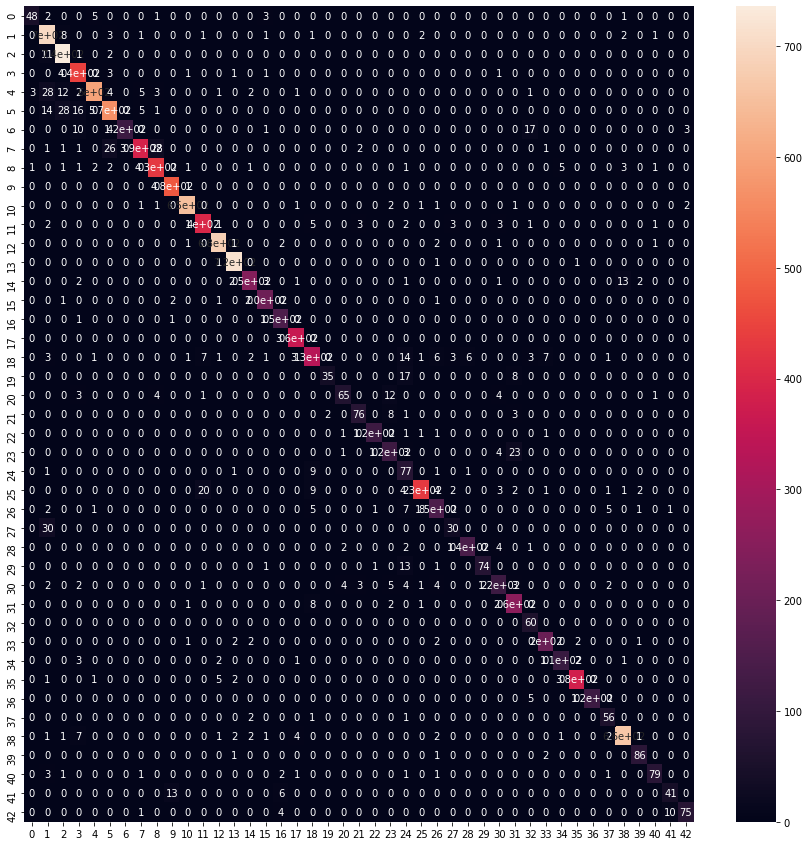

In [41]:
# Model Performance on TEST SET
evaluate_model(tuned_model, X_test_gray_norm, y_test)

Loss : 0.2529944181442261
Accuarcy : 0.9603174328804016

              precision    recall  f1-score   support

           0       1.00      0.47      0.64        30
           1       0.97      0.95      0.96       240
           2       0.96      0.97      0.96       240
           3       0.98      0.99      0.98       150
           4       0.92      1.00      0.96       210
           5       1.00      0.97      0.98       210
           6       1.00      1.00      1.00        60
           7       0.97      0.98      0.98       150
           8       0.97      0.97      0.97       150
           9       1.00      0.99      1.00       150
          10       1.00      1.00      1.00       210
          11       0.98      0.97      0.98       150
          12       0.98      0.99      0.99       210
          13       1.00      0.99      0.99       240
          14       0.98      0.97      0.97        90
          15       0.94      1.00      0.97        90
          16       0.94 

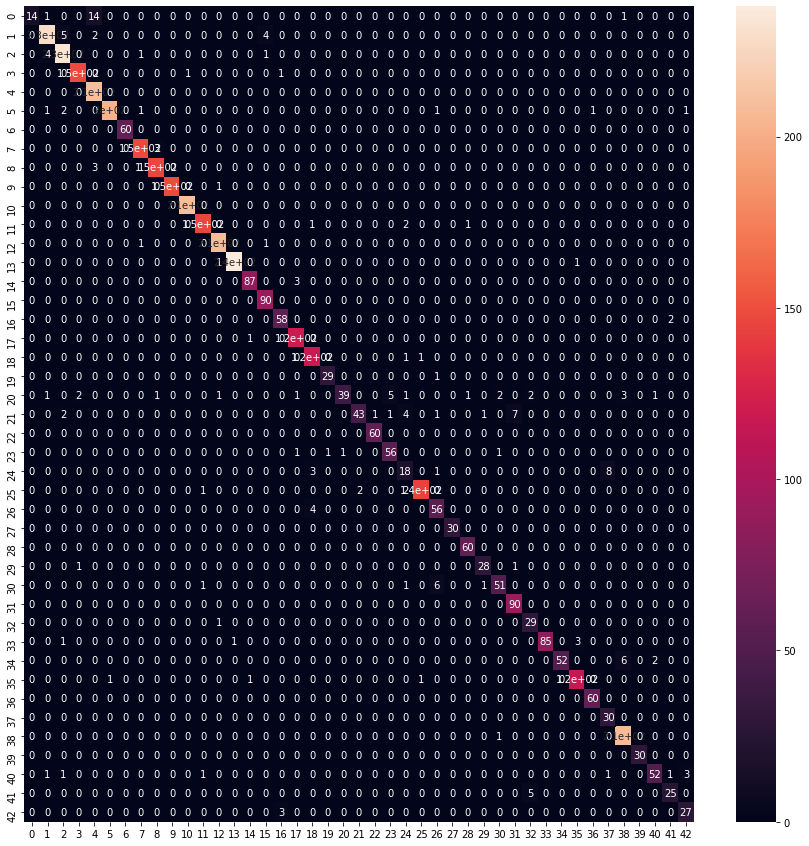

In [42]:
# Model Performance on VALIDATION SET
evaluate_model(tuned_model, X_validation_gray_norm, y_validation)

Loss : 0.002974393777549267
Accuarcy : 0.9990229606628418

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       180
           1       1.00      1.00      1.00      1980
           2       1.00      1.00      1.00      2010
           3       0.99      1.00      1.00      1260
           4       1.00      1.00      1.00      1770
           5       1.00      1.00      1.00      1650
           6       1.00      1.00      1.00       360
           7       1.00      1.00      1.00      1290
           8       1.00      1.00      1.00      1260
           9       1.00      1.00      1.00      1320
          10       1.00      1.00      1.00      1800
          11       1.00      1.00      1.00      1170
          12       1.00      1.00      1.00      1890
          13       1.00      1.00      1.00      1920
          14       1.00      1.00      1.00       690
          15       1.00      1.00      1.00       540
          16       1.0

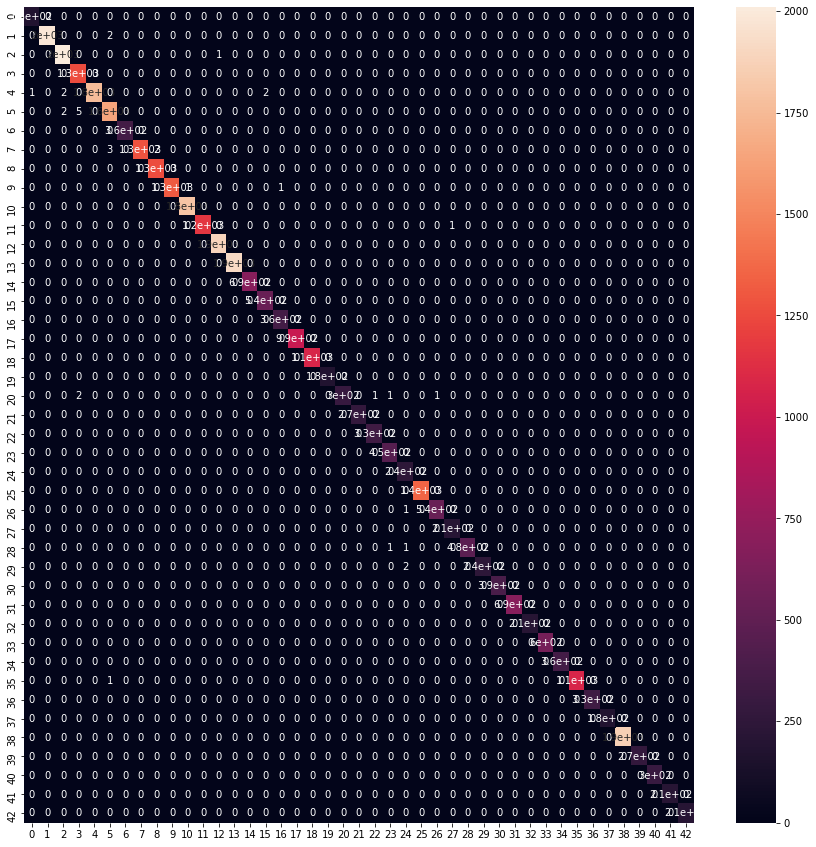

In [43]:
# Model Performance on TRAINING SET
evaluate_model(tuned_model, X_train_gray_norm, y_train)

# Step 8 : Save the model

In [ ]:
tuned_model.save('tuned_model.h5')

# Step 9 : Use Data Augmentation to generalize better on new images

* Using data augmentation we are going to take image from training data we perform different operations on them like rotating,flipping, horizontal_flip etc. So our model will learn from difffernt types of images (increase the training set) and it would perform well on new images.

In [67]:
from keras.preprocessing.image import ImageDataGenerator

dataget_train = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')

In [68]:
model_data_augmentation = build_model()
model_data_augmentation_history = model_data_augmentation.fit(dataget_train.flow(X_train_gray_norm, y_train,
                                                                                         batch_size = 32), 
                                                                      epochs = 30, validation_data=(X_validation_gray_norm, y_validation),
                                                                      callbacks=[callback])

Epoch 1/30
1088/1088 [==============================] - 16s 15ms/step - loss: 3.3632 - accuracy: 0.0934 - val_loss: 3.1287 - val_accuracy: 0.1508
Epoch 2/30
1088/1088 [==============================] - 16s 15ms/step - loss: 2.5852 - accuracy: 0.2634 - val_loss: 1.8329 - val_accuracy: 0.4365
Epoch 3/30
1088/1088 [==============================] - 16s 15ms/step - loss: 1.8895 - accuracy: 0.4226 - val_loss: 1.5446 - val_accuracy: 0.5537
Epoch 4/30
1088/1088 [==============================] - 16s 15ms/step - loss: 1.5900 - accuracy: 0.4997 - val_loss: 1.2912 - val_accuracy: 0.6376
Epoch 5/30
1088/1088 [==============================] - 16s 15ms/step - loss: 1.3879 - accuracy: 0.5610 - val_loss: 1.1636 - val_accuracy: 0.6460
Epoch 6/30
1088/1088 [==============================] - 16s 15ms/step - loss: 1.2391 - accuracy: 0.5988 - val_loss: 1.1193 - val_accuracy: 0.6977
Epoch 7/30
1088/1088 [==============================] - 17s 15ms/step - loss: 1.1252 - accuracy: 0.6387 - val_loss: 1.0624 -

Loss : 0.8356338739395142
Accuarcy : 0.8199524879455566

              precision    recall  f1-score   support

           0       0.67      0.20      0.31        60
           1       0.89      0.84      0.86       720
           2       0.86      0.57      0.69       750
           3       0.83      0.76      0.79       450
           4       0.87      0.95      0.90       660
           5       0.60      0.87      0.71       630
           6       0.91      0.91      0.91       150
           7       0.91      0.76      0.83       450
           8       0.74      0.94      0.83       450
           9       0.96      0.94      0.95       480
          10       0.90      0.97      0.93       660
          11       0.94      0.94      0.94       420
          12       0.88      0.94      0.91       690
          13       0.97      0.96      0.96       720
          14       0.95      0.96      0.96       270
          15       1.00      0.99      1.00       210
          16       0.97 

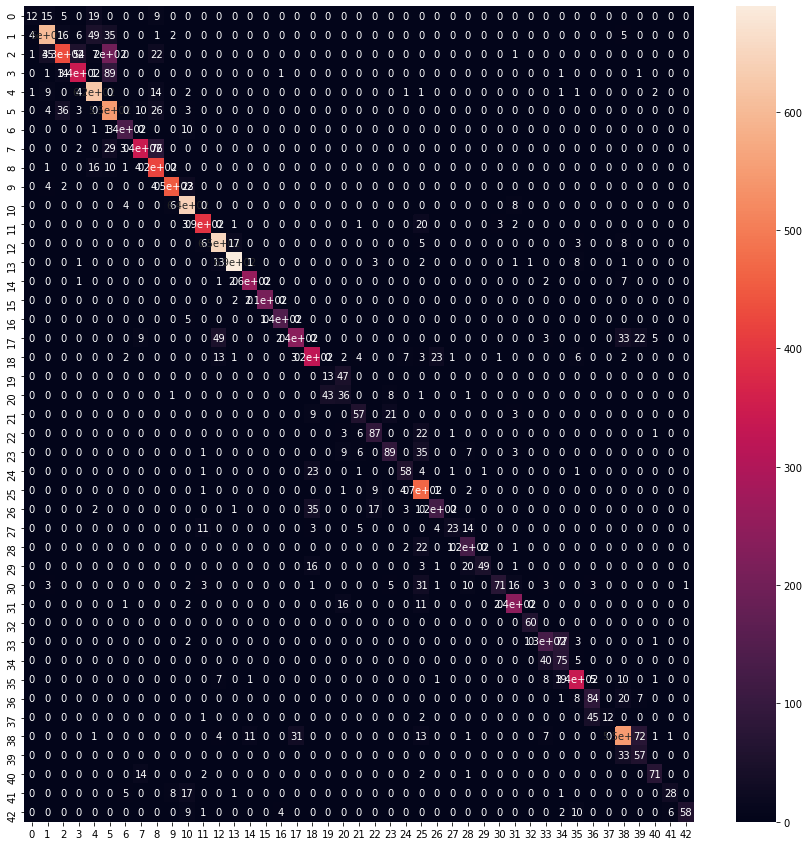

In [69]:
evaluate_model(model_data_augmentation, X_test_gray_norm, y_test)

* We get lower accuracy on this particular test set than because its distribution is very similar to the training data distribution. Images in test set are not in different shapes,rotated, flipped etc. But it comes to new images it might perform better than the model that was trained without using data augmentation.

# Step 8 : Transfer Learning

* We will use the pre-trained model VGG16 which was trained to predict images of 1000 different classes. Since it accepts only RGB images (with 3 channels i will keep the images as they are)

In [4]:
X_train, y_train = train['features'], train['labels']
X_validation, y_validation = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

In [5]:
X_train = X_train / 255
X_validation = X_validation / 255
X_test = X_test / 255

In [6]:
X_train, y_train = shuffle(X_train, y_train)

NameError: name 'shuffle' is not defined

In [ ]:
X_train.shape[1:]

In [8]:
from tensorflow.keras.applications import VGG16


# include_top=False to not include last fully connected layer (output layer)
# we must specify the shape of our images
pre_trained_model = VGG16(input_shape=X_train.shape[1:], include_top=False, weights='imagenet')


# Make all the layers in the pre-trained model non-trainable (we will keep the weights we loaded on those layers)
# which means we are not going to train them again. We will train only the last fully connected layer that we will add to the model
for layer in pre_trained_model.layers:
    layer.trainable = False

    
pre_trained_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 32, 32, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 16, 16, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 16, 16, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 16, 16, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 8, 8, 128)         0     

In [9]:
last_layer = pre_trained_model.get_layer('block5_pool')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output
print(last_output)

last layer output shape:  (None, 1, 1, 512)
Tensor("block5_pool/MaxPool:0", shape=(None, 1, 1, 512), dtype=float32)


In [10]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import layers
from tensorflow.keras import Model

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)                  
x = layers.Dense(43, activation='softmax')(x)           

model_transfer_learning = Model(pre_trained_model.input, x) 

model_transfer_learning.compile(optimizer = RMSprop(lr=0.0001), 
              loss = 'sparse_categorical_crossentropy', 
              metrics = ['accuracy'])

model_transfer_learning.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 32, 32, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 16, 16, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 16, 16, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 16, 16, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 8, 8, 128)        

In [12]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.98):
            print("\nReached 98.0% accuracy so cancelling training!")
            self.model.stop_training = True 
            
            
callback = myCallback()

model_transfer_learning_history = model_transfer_learning.fit(X_train, y_train, validation_data=(X_validation, y_validation), 
                                 epochs=150, batch_size=32, callbacks=[callback], verbose=True)

Epoch 1/150
1088/1088 [==============================] - 97s 89ms/step - loss: 2.3608 - accuracy: 0.3507 - val_loss: 2.2254 - val_accuracy: 0.3830
Epoch 2/150
1088/1088 [==============================] - 96s 88ms/step - loss: 1.7092 - accuracy: 0.4984 - val_loss: 2.0564 - val_accuracy: 0.4100
Epoch 3/150
1088/1088 [==============================] - 93s 85ms/step - loss: 1.4700 - accuracy: 0.5631 - val_loss: 1.9816 - val_accuracy: 0.4168
Epoch 4/150
1088/1088 [==============================] - 95s 88ms/step - loss: 1.3123 - accuracy: 0.6084 - val_loss: 1.9410 - val_accuracy: 0.4188
Epoch 5/150
1088/1088 [==============================] - 91s 84ms/step - loss: 1.2007 - accuracy: 0.6389 - val_loss: 1.9197 - val_accuracy: 0.4213
Epoch 6/150
1088/1088 [==============================] - 91s 83ms/step - loss: 1.1042 - accuracy: 0.6670 - val_loss: 1.9093 - val_accuracy: 0.4331
Epoch 7/150
1088/1088 [==============================] - 92s 84ms/step - loss: 1.0292 - accuracy: 0.6892 - val_loss: 1

KeyboardInterrupt: 